#Importing Libraries

In [54]:
import yfinance as yf
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score
import math
import pandas as pd
from torchsummary import summary

#List of NSE 481 Stock Symbols

In [55]:
nse_companies = ['360ONE.NS', '3MINDIA.NS', 'ABB.NS', 'ACC.NS', 'AIAENG.NS', 'APLAPOLLO.NS', 'AUBANK.NS', 'AADHARHFC.NS', 'AARTIIND.NS', 'AAVAS.NS', 'ABBOTINDIA.NS', 'ACE.NS', 'ADANIENSOL.NS', 'ADANIENT.NS', 'ADANIGREEN.NS', 'ADANIPORTS.NS', 'ADANIPOWER.NS', 'ATGL.NS', 'ABCAPITAL.NS', 'ABFRL.NS', 'ABREL.NS', 'ABSLAMC.NS', 'AEGISLOG.NS', 'AFFLE.NS', 'AJANTPHARM.NS', 'APLLTD.NS', 'ALKEM.NS', 'ALKYLAMINE.NS', 'ALOKINDS.NS', 'AMBER.NS', 'AMBUJACEM.NS', 'ANANTRAJ.NS', 'ANGELONE.NS', 'APARINDS.NS', 'APOLLOHOSP.NS', 'APOLLOTYRE.NS', 'APTUS.NS', 'ASAHIINDIA.NS', 'ASHOKLEY.NS', 'ASIANPAINT.NS', 'ASTERDM.NS', 'ASTRAZEN.NS', 'ASTRAL.NS', 'ATUL.NS', 'AUROPHARMA.NS', 'AVANTIFEED.NS', 'DMART.NS', 'AXISBANK.NS', 'BASF.NS', 'BEML.NS', 'BLS.NS', 'BSE.NS', 'BAJAJ-AUTO.NS', 'BAJFINANCE.NS', 'BAJAJFINSV.NS', 'BAJAJHLDNG.NS', 'BALAMINES.NS', 'BALKRISIND.NS', 'BALRAMCHIN.NS', 'BANDHANBNK.NS', 'BANKBARODA.NS', 'BANKINDIA.NS', 'MAHABANK.NS', 'BATAINDIA.NS', 'BAYERCROP.NS', 'BERGEPAINT.NS', 'BDL.NS', 'BEL.NS', 'BHARATFORG.NS', 'BHEL.NS', 'BPCL.NS', 'BHARTIARTL.NS', 'BHARTIHEXA.NS', 'BIOCON.NS', 'BIRLACORPN.NS', 'BSOFT.NS', 'BLUEDART.NS', 'BLUESTARCO.NS', 'BBTC.NS', 'BOSCHLTD.NS', 'BRIGADE.NS', 'BRITANNIA.NS', 'CCL.NS', 'CESC.NS', 'CGPOWER.NS', 'CIEINDIA.NS', 'CRISIL.NS', 'CANFINHOME.NS', 'CANBK.NS', 'CAPLIPOINT.NS', 'CGCL.NS', 'CARBORUNIV.NS', 'CASTROLIND.NS', 'CEATLTD.NS', 'CELLO.NS', 'CENTRALBK.NS', 'CDSL.NS', 'CENTURYPLY.NS', 'CERA.NS', 'CHALET.NS', 'CHAMBLFERT.NS', 'CHEMPLASTS.NS', 'CHENNPETRO.NS', 'CHOLAHLDNG.NS', 'CHOLAFIN.NS', 'CIPLA.NS', 'CUB.NS', 'CLEAN.NS', 'COALINDIA.NS', 'COCHINSHIP.NS', 'COFORGE.NS', 'COLPAL.NS', 'CAMS.NS', 'CONCOR.NS', 'COROMANDEL.NS', 'CRAFTSMAN.NS', 'CREDITACC.NS', 'CROMPTON.NS', 'CUMMINSIND.NS', 'CYIENT.NS', 'DLF.NS', 'DOMS.NS', 'DABUR.NS', 'DALBHARAT.NS', 'DATAPATTNS.NS', 'DEEPAKFERT.NS', 'DEEPAKNTR.NS', 'DELHIVERY.NS', 'DEVYANI.NS', 'DIVISLAB.NS', 'DIXON.NS', 'LALPATHLAB.NS', 'DRREDDY.NS', 'EIDPARRY.NS', 'EIHOTEL.NS', 'EASEMYTRIP.NS', 'EICHERMOT.NS', 'ELECON.NS', 'ELGIEQUIP.NS', 'EMAMILTD.NS', 'ENDURANCE.NS', 'ENGINERSIN.NS', 'EQUITASBNK.NS', 'ERIS.NS', 'ESCORTS.NS', 'EXIDEIND.NS', 'NYKAA.NS', 'FEDERALBNK.NS', 'FACT.NS', 'FINEORG.NS', 'FINCABLES.NS', 'FINPIPE.NS', 'FSL.NS', 'FIVESTAR.NS', 'FORTIS.NS', 'GRINFRA.NS', 'GAIL.NS', 'GET&D.NS', 'GMRINFRA.NS', 'GRSE.NS', 'GICRE.NS', 'GILLETTE.NS', 'GLAND.NS', 'GLAXO.NS', 'GLENMARK.NS', 'MEDANTA.NS', 'GODIGIT.NS', 'GPIL.NS', 'GODFRYPHLP.NS', 'GODREJAGRO.NS', 'GODREJCP.NS', 'GODREJIND.NS', 'GODREJPROP.NS', 'GRANULES.NS', 'GRAPHITE.NS', 'GRASIM.NS', 'GESHIP.NS', 'GRINDWELL.NS', 'GAEL.NS', 'FLUOROCHEM.NS', 'GUJGASLTD.NS', 'GMDCLTD.NS', 'GNFC.NS', 'GPPL.NS', 'GSFC.NS', 'GSPL.NS', 'HEG.NS', 'HBLPOWER.NS', 'HCLTECH.NS', 'HDFCAMC.NS', 'HDFCBANK.NS', 'HDFCLIFE.NS', 'HFCL.NS', 'HAPPSTMNDS.NS', 'HAVELLS.NS', 'HEROMOTOCO.NS', 'HSCL.NS', 'HINDALCO.NS', 'HAL.NS', 'HINDCOPPER.NS', 'HINDPETRO.NS', 'HINDUNILVR.NS', 'HINDZINC.NS', 'POWERINDIA.NS', 'HOMEFIRST.NS', 'HONASA.NS', 'HONAUT.NS', 'HUDCO.NS', 'ICICIBANK.NS', 'ICICIGI.NS', 'ICICIPRULI.NS', 'ISEC.NS', 'IDBI.NS', 'IDFCFIRSTB.NS', 'IFCI.NS', 'IIFL.NS', 'INOXINDIA.NS', 'IRB.NS', 'IRCON.NS', 'ITC.NS', 'ITI.NS', 'INDGN.NS', 'INDIACEM.NS', 'INDIAMART.NS', 'INDIANB.NS', 'IEX.NS', 'INDHOTEL.NS', 'IOC.NS', 'IOB.NS', 'IRCTC.NS', 'IRFC.NS', 'IREDA.NS', 'IGL.NS', 'INDUSTOWER.NS', 'INDUSINDBK.NS', 'NAUKRI.NS', 'INFY.NS', 'INOXWIND.NS', 'INTELLECT.NS', 'INDIGO.NS', 'IPCALAB.NS', 'JBCHEPHARM.NS', 'JKCEMENT.NS', 'JBMA.NS', 'JKLAKSHMI.NS', 'JKTYRE.NS', 'JMFINANCIL.NS', 'JSWENERGY.NS', 'JSWINFRA.NS', 'JSWSTEEL.NS', 'JPPOWER.NS', 'J&KBANK.NS', 'JINDALSAW.NS', 'JSL.NS', 'JINDALSTEL.NS', 'JIOFIN.NS', 'JUBLFOOD.NS', 'JUBLINGREA.NS', 'JUBLPHARMA.NS', 'JWL.NS', 'JUSTDIAL.NS', 'JYOTHYLAB.NS', 'JYOTICNC.NS', 'KPRMILL.NS', 'KEI.NS', 'KNRCON.NS', 'KPITTECH.NS', 'KSB.NS', 'KAJARIACER.NS', 'KPIL.NS', 'KALYANKJIL.NS', 'KANSAINER.NS', 'KARURVYSYA.NS', 'KAYNES.NS', 'KEC.NS', 'KIRLOSBROS.NS', 'KIRLOSENG.NS', 'KOTAKBANK.NS', 'KIMS.NS', 'LTF.NS', 'LTTS.NS', 'LICHSGFIN.NS', 'LTIM.NS', 'LT.NS', 'LATENTVIEW.NS', 'LAURUSLABS.NS', 'LEMONTREE.NS', 'LICI.NS', 'LINDEINDIA.NS', 'LUPIN.NS', 'MMTC.NS', 'MRF.NS', 'LODHA.NS', 'MGL.NS', 'MAHSEAMLES.NS', 'M&MFIN.NS', 'M&M.NS', 'MAHLIFE.NS', 'MANAPPURAM.NS', 'MRPL.NS',  'MARICO.NS', 'MARUTI.NS', 'MASTEK.NS', 'MFSL.NS', 'MAXHEALTH.NS', 'MAZDOCK.NS', 'METROBRAND.NS', 'METROPOLIS.NS', 'MINDACORP.NS', 'MSUMI.NS', 'MOTILALOFS.NS', 'MPHASIS.NS', 'MCX.NS', 'MUTHOOTFIN.NS', 'NATCOPHARM.NS', 'NBCC.NS', 'NCC.NS', 'NHPC.NS', 'NLCINDIA.NS', 'NMDC.NS', 'NSLNISP.NS', 'NTPC.NS', 'NH.NS', 'NATIONALUM.NS', 'NAVINFLUOR.NS', 'NESTLEIND.NS', 'NETWORK18.NS', 'NEWGEN.NS', 'NAM-INDIA.NS', 'NUVAMA.NS', 'NUVOCO.NS', 'OBEROIRLTY.NS', 'ONGC.NS', 'OIL.NS', 'OLECTRA.NS', 'PAYTM.NS', 'OFSS.NS', 'POLICYBZR.NS', 'PCBL.NS', 'PIIND.NS', 'PNBHOUSING.NS', 'PNCINFRA.NS', 'PTCIL.NS', 'PVRINOX.NS', 'PAGEIND.NS', 'PATANJALI.NS', 'PERSISTENT.NS', 'PETRONET.NS', 'PFIZER.NS', 'PHOENIXLTD.NS', 'PIDILITIND.NS', 'PEL.NS', 'PPLPHARMA.NS', 'POLYMED.NS', 'POLYCAB.NS', 'POONAWALLA.NS', 'PFC.NS', 'POWERGRID.NS', 'PRAJIND.NS', 'PRESTIGE.NS', 'PGHH.NS', 'PNB.NS', 'QUESS.NS', 'RBLBANK.NS', 'RECLTD.NS', 'RHIM.NS', 'RITES.NS', 'RADICO.NS', 'RVNL.NS', 'RAILTEL.NS', 'RAJESHEXPO.NS', 'RKFORGE.NS', 'RCF.NS', 'RATNAMANI.NS', 'RTNINDIA.NS', 'RAYMOND.NS', 'REDINGTON.NS', 'RELIANCE.NS', 'ROUTE.NS', 'SBFC.NS', 'SBICARD.NS', 'SBILIFE.NS', 'SJVN.NS', 'SKFINDIA.NS', 'SRF.NS', 'SAMMAANCAP.NS', 'MOTHERSON.NS', 'SANOFI.NS', 'SAPPHIRE.NS', 'SAREGAMA.NS', 'SCHAEFFLER.NS', 'SCHNEIDER.NS', 'SCI.NS', 'SHREECEM.NS', 'RENUKA.NS', 'SHRIRAMFIN.NS', 'SHYAMMETL.NS', 'SIEMENS.NS', 'SIGNATURE.NS', 'SOBHA.NS', 'SOLARINDS.NS', 'SONACOMS.NS', 'SONATSOFTW.NS', 'SBIN.NS', 'SAIL.NS', 'SWSOLAR.NS', 'SUMICHEM.NS', 'SPARC.NS', 'SUNPHARMA.NS', 'SUNTV.NS', 'SUNDARMFIN.NS', 'SUNDRMFAST.NS', 'SUPREMEIND.NS', 'SUVENPHAR.NS', 'SUZLON.NS', 'SWANENERGY.NS', 'SYNGENE.NS', 'TBOTEK.NS', 'TVSMOTOR.NS', 'TVSSCS.NS', 'TANLA.NS', 'TATACHEM.NS', 'TATACOMM.NS', 'TCS.NS', 'TATACONSUM.NS', 'TATAELXSI.NS', 'TATAINVEST.NS', 'TATAMOTORS.NS', 'TATAPOWER.NS', 'TATASTEEL.NS', 'TTML.NS', 'TECHM.NS', 'TECHNOE.NS', 'TEJASNET.NS', 'NIACL.NS', 'RAMCOCEM.NS', 'THERMAX.NS', 'TIMKEN.NS', 'TITAGARH.NS', 'TITAN.NS', 'TORNTPHARM.NS', 'TORNTPOWER.NS', 'TRENT.NS', 'TRIDENT.NS', 'TRIVENI.NS', 'TRITURBINE.NS', 'TIINDIA.NS', 'UCOBANK.NS', 'UNOMINDA.NS', 'UPL.NS', 'UTIAMC.NS', 'UJJIVANSFB.NS', 'ULTRACEMCO.NS', 'UNIONBANK.NS', 'UBL.NS', 'UNITDSPR.NS', 'USHAMART.NS', 'VGUARD.NS', 'VIPIND.NS', 'DBREALTY.NS', 'VTL.NS', 'VARROC.NS', 'VBL.NS', 'MANYAVAR.NS', 'VEDL.NS', 'VIJAYA.NS', 'VINATIORGA.NS', 'IDEA.NS', 'VOLTAS.NS', 'WELCORP.NS', 'WELSPUNLIV.NS', 'WESTLIFE.NS', 'WHIRLPOOL.NS', 'WIPRO.NS', 'YESBANK.NS', 'ZFCVINDIA.NS', 'ZEEL.NS', 'ZENSARTECH.NS', 'ZOMATO.NS', 'ZYDUSLIFE.NS', 'ECLERX.NS']
print(nse_companies)

['360ONE.NS', '3MINDIA.NS', 'ABB.NS', 'ACC.NS', 'AIAENG.NS', 'APLAPOLLO.NS', 'AUBANK.NS', 'AADHARHFC.NS', 'AARTIIND.NS', 'AAVAS.NS', 'ABBOTINDIA.NS', 'ACE.NS', 'ADANIENSOL.NS', 'ADANIENT.NS', 'ADANIGREEN.NS', 'ADANIPORTS.NS', 'ADANIPOWER.NS', 'ATGL.NS', 'ABCAPITAL.NS', 'ABFRL.NS', 'ABREL.NS', 'ABSLAMC.NS', 'AEGISLOG.NS', 'AFFLE.NS', 'AJANTPHARM.NS', 'APLLTD.NS', 'ALKEM.NS', 'ALKYLAMINE.NS', 'ALOKINDS.NS', 'AMBER.NS', 'AMBUJACEM.NS', 'ANANTRAJ.NS', 'ANGELONE.NS', 'APARINDS.NS', 'APOLLOHOSP.NS', 'APOLLOTYRE.NS', 'APTUS.NS', 'ASAHIINDIA.NS', 'ASHOKLEY.NS', 'ASIANPAINT.NS', 'ASTERDM.NS', 'ASTRAZEN.NS', 'ASTRAL.NS', 'ATUL.NS', 'AUROPHARMA.NS', 'AVANTIFEED.NS', 'DMART.NS', 'AXISBANK.NS', 'BASF.NS', 'BEML.NS', 'BLS.NS', 'BSE.NS', 'BAJAJ-AUTO.NS', 'BAJFINANCE.NS', 'BAJAJFINSV.NS', 'BAJAJHLDNG.NS', 'BALAMINES.NS', 'BALKRISIND.NS', 'BALRAMCHIN.NS', 'BANDHANBNK.NS', 'BANKBARODA.NS', 'BANKINDIA.NS', 'MAHABANK.NS', 'BATAINDIA.NS', 'BAYERCROP.NS', 'BERGEPAINT.NS', 'BDL.NS', 'BEL.NS', 'BHARATFORG.NS'

#Fetching & Storing fundamental data for Fundamental Analysis

1.   Company Name
2. Symbol at stock exchange
3. Sector of the company
4. Market Cap
5. P/E Ratio
6. Price-to-Book Ratio                
7. Revenue (TTM)
8. Net Income (TTM)
9. ROE
10. Industry P/E
11. Debt/Equity
12. EPS
13. Volume
14. Share Price  
15. List item



In [56]:
def fetch_stock_fundamentals(symbols):
    fundamentals_list = []

    for symbol in symbols:
        try:
            stock = yf.Ticker(symbol)
            stock_info = stock.info

            # Append the fundamental data to the list
            fundamentals_list.append({
                "Company": stock_info.get('shortName'),
                "Symbol": symbol,
                "Sector": stock_info.get('sector'),
                "Industry": stock_info.get('industry'),
                "Market Cap": stock_info.get('marketCap'),
                "P/E Ratio": stock_info.get('trailingPE'),
                "Price-to-Book Ratio": stock_info.get('priceToBook'),
                "Revenue (TTM)": stock_info.get('totalRevenue'),
                "Net Income (TTM)": stock_info.get('netIncomeToCommon'),
                "ROE": stock_info.get('returnOnEquity'),          # Add ROE
                "Industry P/E": stock_info.get('forwardPE'),      # Add Industry P/E
                "Debt/Equity": stock_info.get('debtToEquity'),    # Add Debt-to-Equity
                "EPS": stock_info.get('trailingEps'),              # Add EPS
                "Volume": stock_info.get('volume'),                 # Add Total Volume
                "Share Price": stock_info.get('currentPrice')      # Add Share Price
            })

        except Exception as e:
            print(f"Could not fetch data for {symbol}: {e}")

    # Create a DataFrame from the collected data
    fundamentals_df = pd.DataFrame(fundamentals_list)
    return fundamentals_df

#Splitting Companies in Large, Mid and Small Cap

In [57]:
# Call the function and get the DataFrame
fundamentals_df = fetch_stock_fundamentals(nse_companies)
fundamentals_df = fundamentals_df.sort_values(by='Market Cap', ascending=False)

total_stocks = len(fundamentals_df)

# Determine the number of stocks for each segment based on the ratio
large_cap_count = int(total_stocks * 0.30)  # 30% for large cap
mid_cap_count = int(total_stocks * 0.30)    # 30% for mid cap
small_cap_count = total_stocks - (large_cap_count + mid_cap_count)  # 40% for small cap

# Divide the sorted DataFrame into three segments
large_cap_stocks = fundamentals_df.iloc[:large_cap_count]
mid_cap_stocks = fundamentals_df.iloc[large_cap_count:large_cap_count + mid_cap_count]
small_cap_stocks = fundamentals_df.iloc[large_cap_count + mid_cap_count:]

# Convert the segments to DataFrames if they are not already
large_cap_df = pd.DataFrame(large_cap_stocks)
mid_cap_df = pd.DataFrame(mid_cap_stocks)
small_cap_df = pd.DataFrame(small_cap_stocks)

# Display the categorized DataFrames
print("\nLarge Cap Count:", large_cap_count)
print("\nMid Cap Count:", mid_cap_count)
print("\nSmall Cap Count:", small_cap_count)


Large Cap Count: 144

Mid Cap Count: 144

Small Cap Count: 193


#Applying Fundamental Filters to shoetlist good companies in each categories according to market cap

In [58]:
def filter_companies(df, pe, pb, roe, eps, de):
    pe_filter = df['P/E Ratio'] >= pe
    pb_filter = df['Price-to-Book Ratio'] < pb
    roe_filter = df['ROE'] > roe
    eps_filter = df['EPS'] > eps
    de_filter = (df['Debt/Equity'] < de) | (df['Debt/Equity'].isna())
    filtered_df = df[pe_filter & pb_filter & roe_filter & eps_filter & de_filter]
    filtered_companies = filtered_df.to_numpy()
    return filtered_companies


filtered_largecapcomp=filter_companies(large_cap_df, -10, 10, 0, 10, 70)
print("Length of filtered large cap: ", len(filtered_largecapcomp))
filtered_midcapcomp=filter_companies(mid_cap_df, -10, 12, 0, 6, 70)
print("Length of filtered mid cap: ", len(filtered_midcapcomp))
filtered_smallcapcomp=filter_companies(small_cap_df, 15, 50, 0, 3, 60)
print("Length of filtered small cap: ", len(filtered_smallcapcomp))


print("\nList of Large cap compamies: \n",filtered_largecapcomp[:, 0])
print("\n\nList of Mid cap compamies: \n",filtered_midcapcomp[:, 0])
print("\n\nList of Small cap compamies: \n",filtered_smallcapcomp[:, 0])

Length of filtered large cap:  50
Length of filtered mid cap:  59
Length of filtered small cap:  72

List of Large cap compamies: 
 ['RELIANCE INDUSTRIES LTD' 'HDFC BANK LTD' 'ICICI BANK LTD.'
 'STATE BANK OF INDIA' 'ITC LTD' 'SUN PHARMACEUTICAL IND L'
 'AXIS BANK LIMITED' 'KOTAK MAHINDRA BANK LTD' 'MARUTI SUZUKI INDIA LTD.'
 'ULTRATECH CEMENT LIMITED' 'OIL AND NATURAL GAS CORP.' 'WIPRO LTD'
 'BAJAJ AUTO LIMITED' 'COAL INDIA LTD' 'DLF LIMITED' 'LTIMINDTREE LIMITED'
 'ADANI POWER LTD' 'TECH MAHINDRA LIMITED' 'SBI LIFE INSURANCE CO LTD'
 'HINDALCO  INDUSTRIES  LTD' 'EICHER MOTORS LTD' 'GAIL (INDIA) LTD'
 'MACROTECH DEVELOPERS LTD' 'AMBUJA CEMENTS LTD' 'BANK OF BARODA'
 'CIPLA LTD' 'BAJAJ HOLDINGS & INVS LTD' 'PUNJAB NATIONAL BANK'
 'INFO EDGE (I) LTD' 'BOSCH LIMITED' 'DR. REDDY S LABORATORIES'
 'ZYDUS LIFESCIENCES LTD' 'LUPIN LIMITED' 'TATA CONSUMER PRODUCT LTD'
 'DABUR INDIA LTD' 'ICICI LOMBARD GIC LIMITED' 'SHREE CEMENT LIMITED'
 'JINDAL STEEL & POWER LTD' 'UNION BANK OF INDIA' 'CANARA

#Check if GPU is available

In [59]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#Define company symbol arrays for large, mid and small cap companies

In [60]:
companies_1 = filtered_largecapcomp[:, 1]  # LargeCap
companies_2 = filtered_midcapcomp[:, 1]    # MidCap
companies_3 = filtered_smallcapcomp[:, 1]  # SmallCap

#Define date range

In [61]:
begin_date = "2014-01-01"
end_date = "2024-01-01"

#Define new columns for storing additional metrics

In [62]:
columns = [
    'Company',
    'Test Start Price', 'Test End Price',
    'Test Difference', 'Test Change %',
    'Actual Start Price', 'Actual End Price',
    'Actual Difference', 'Actual Change %'
]

# Initialize empty dataframes with new columns
results_1 = pd.DataFrame(columns=columns)
results_2 = pd.DataFrame(columns=columns)
results_3 = pd.DataFrame(columns=columns)

#Data Splitting

In [63]:
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset) - time_step - 1):
        dataX.append(dataset[i:(i + time_step), 0])
        dataY.append(dataset[i + time_step, 0])
    return np.array(dataX), np.array(dataY)

#LSTM Model

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0121, Validation Loss: 0.0028
Epoch [2/33], Loss: 0.1791, Validation Loss: 0.5108
Epoch [3/33], Loss: 0.0737, Validation Loss: 0.2220
Epoch [4/33], Loss: 0.0932, Validation Loss: 0.1584
Epoch [5/33], Loss: 0.0230, Validation Loss: 0.0060
Epoch [6/33], Loss: 0.0097, Validation Loss: 0.0017
Epoch [7/33], Loss: 0.0041, Validation Loss: 0.0016
Epoch [8/33], Loss: 0.0108, Validation Loss: 0.0008
Epoch [9/33], Loss: 0.0034, Validation Loss: 0.0019
Epoch [10/33], Loss: 0.0015, Validation Loss: 0.0007
Epoch [11/33], Loss: 0.0024, Validation Loss: 0.0039
Epoch [12/33], Loss: 0.0058, Validation Loss: 0.0051
Epoch [13/33], Loss: 0.0093, Validation Loss: 0.0188
Epoch [14/33], Loss: 0.0029, Validation Loss: 0.0038
Epoch [15/33], Loss: 0.0088, Validation Loss: 0.0191
Epoch [16/33], Loss: 0.0051, Validation Loss: 0.0077
Epoch [17/33], Loss: 0.0161, Validation Loss: 0.0461
Epoch [18/33], Loss: 0.0100, Validation Loss: 0.0025
Epoch [19/33], Loss: 0.0265, Validation Loss: 0.0425
Ep

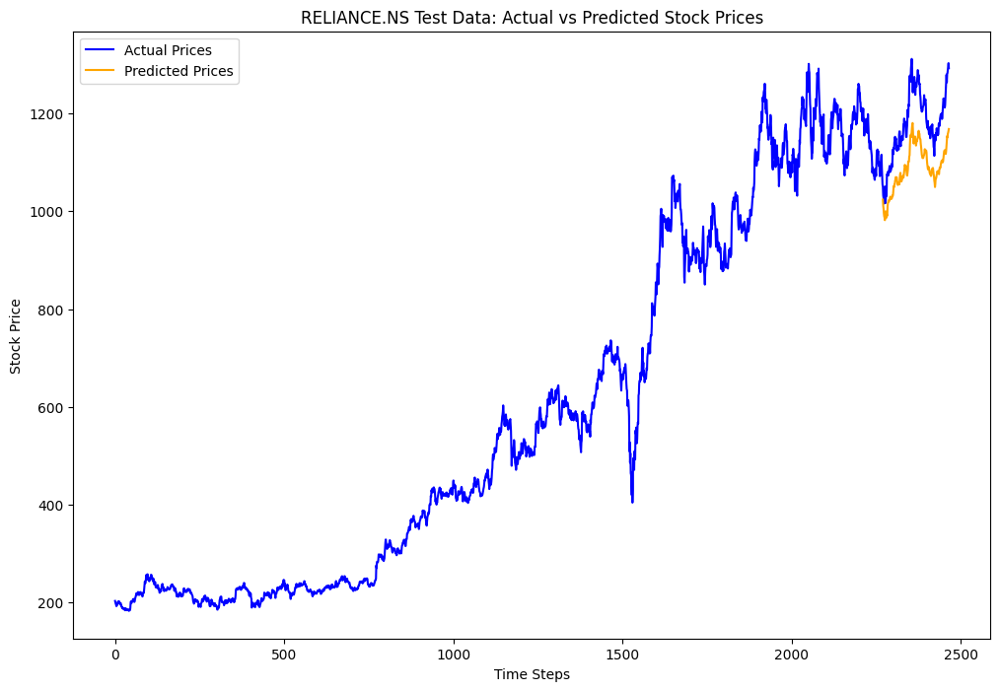

<ipython-input-64-b39c145db184>:151: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  locals()[results_name] = pd.concat([locals()[results_name], new_row], ignore_index=True)
[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0163, Validation Loss: 0.0477
Epoch [2/33], Loss: 0.1901, Validation Loss: 0.1938
Epoch [3/33], Loss: 0.0543, Validation Loss: 0.0063
Epoch [4/33], Loss: 0.0560, Validation Loss: 0.0068
Epoch [5/33], Loss: 0.0144, Validation Loss: 0.0012
Epoch [6/33], Loss: 0.0023, Validation Loss: 0.0067
Epoch [7/33], Loss: 0.0084, Validation Loss: 0.0010
Epoch [8/33], Loss: 0.0029, Validation Loss: 0.0057
Epoch [9/33], Loss: 0.0074, Validation Loss: 0.0070
Epoch [10/33], Loss: 0.0090, Validation Loss: 0.0015
Epoch [11/33], Loss: 0.0036, Validation Loss: 0.0019
Epoch [12/33], Loss: 0.0038, Validation Loss: 0.0009
Epoch [13/33], Loss: 0.0015, Validation Loss: 0.0008
Epoch [14/33], Loss: 0.0022, Validation Loss: 0.0012
Epoch [15/33], Loss: 0.0016, Validation Loss: 0.0006
Epoch [16/33], Loss: 0.0021, Validation Loss: 0.0006
Epoch [17/33], Loss: 0.0015, Validation Loss: 0.0006
Epoch [18/33], Loss: 0.0018, Validation Loss: 0.0006
Epoch [19/33], Loss: 0.0014, Validation Loss: 0.0006
Ep

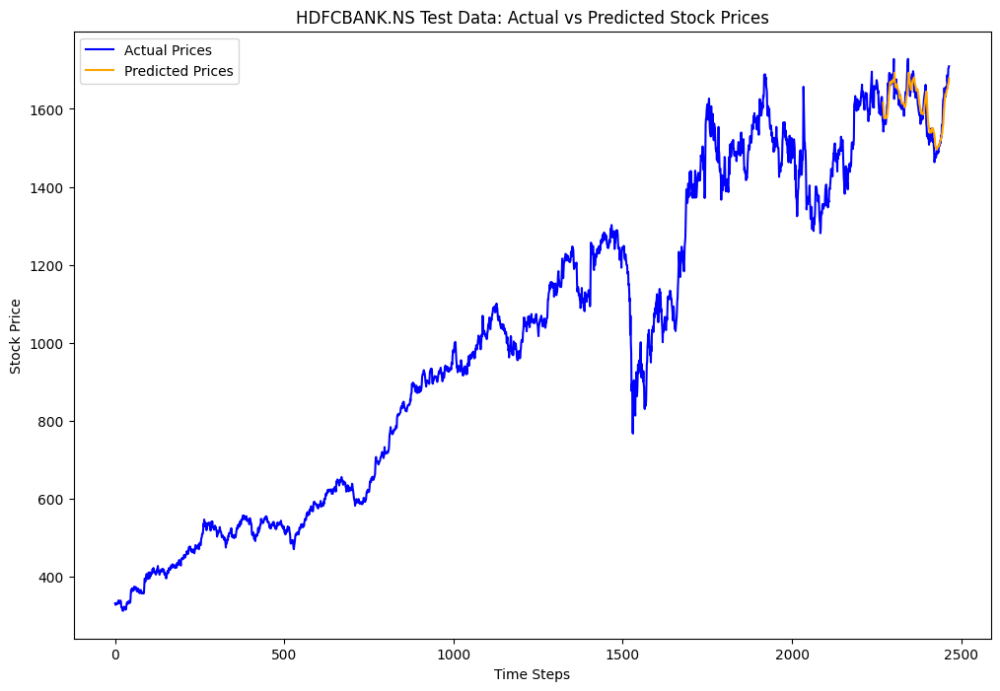

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0105, Validation Loss: 0.0136
Epoch [2/33], Loss: 0.0853, Validation Loss: 0.3452
Epoch [3/33], Loss: 0.0328, Validation Loss: 0.2709
Epoch [4/33], Loss: 0.0382, Validation Loss: 0.2727
Epoch [5/33], Loss: 0.0342, Validation Loss: 0.2431
Epoch [6/33], Loss: 0.0319, Validation Loss: 0.1523
Epoch [7/33], Loss: 0.0122, Validation Loss: 0.0311
Epoch [8/33], Loss: 0.0283, Validation Loss: 0.1335
Epoch [9/33], Loss: 0.0070, Validation Loss: 0.0122
Epoch [10/33], Loss: 0.0019, Validation Loss: 0.0031
Epoch [11/33], Loss: 0.0032, Validation Loss: 0.0063
Epoch [12/33], Loss: 0.0018, Validation Loss: 0.0081
Epoch [13/33], Loss: 0.0054, Validation Loss: 0.0070
Epoch [14/33], Loss: 0.0067, Validation Loss: 0.0040
Epoch [15/33], Loss: 0.0016, Validation Loss: 0.0035
Epoch [16/33], Loss: 0.0057, Validation Loss: 0.0041
Epoch [17/33], Loss: 0.0075, Validation Loss: 0.0044
Epoch [18/33], Loss: 0.0015, Validation Loss: 0.0005
Epoch [19/33], Loss: 0.0038, Validation Loss: 0.0028
Ep

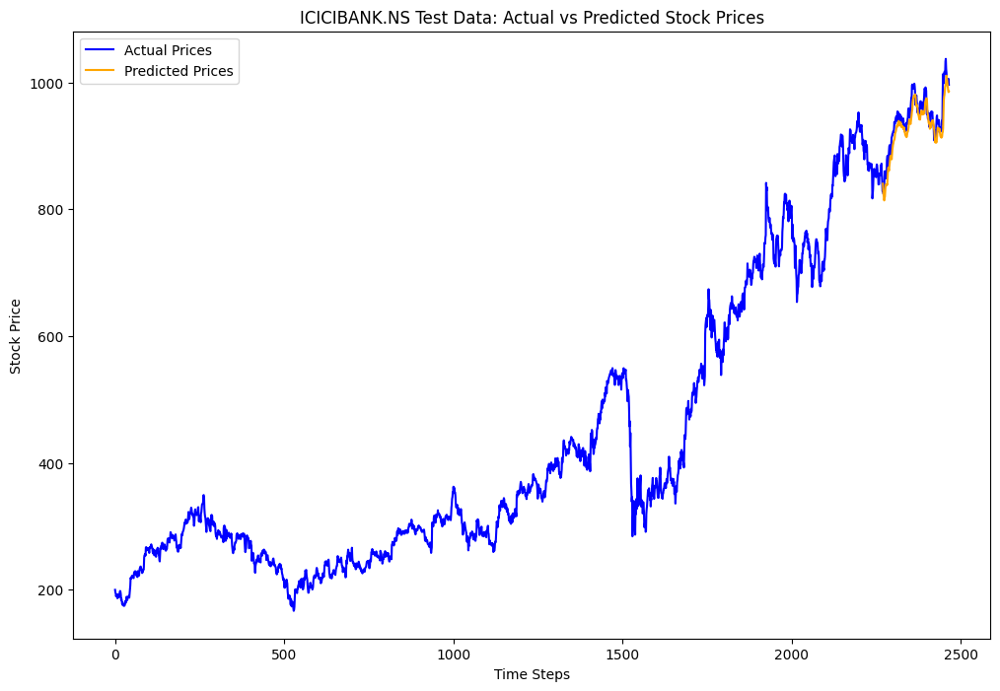

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0265, Validation Loss: 0.1321
Epoch [2/33], Loss: 0.0363, Validation Loss: 0.2466
Epoch [3/33], Loss: 0.0244, Validation Loss: 0.2043
Epoch [4/33], Loss: 0.0188, Validation Loss: 0.0579
Epoch [5/33], Loss: 0.0140, Validation Loss: 0.0536
Epoch [6/33], Loss: 0.0065, Validation Loss: 0.0009
Epoch [7/33], Loss: 0.0013, Validation Loss: 0.0023
Epoch [8/33], Loss: 0.0019, Validation Loss: 0.0011
Epoch [9/33], Loss: 0.0024, Validation Loss: 0.0022
Epoch [10/33], Loss: 0.0037, Validation Loss: 0.0038
Epoch [11/33], Loss: 0.0024, Validation Loss: 0.0048
Epoch [12/33], Loss: 0.0069, Validation Loss: 0.0273
Epoch [13/33], Loss: 0.0034, Validation Loss: 0.0005
Epoch [14/33], Loss: 0.0011, Validation Loss: 0.0009
Epoch [15/33], Loss: 0.0016, Validation Loss: 0.0014
Epoch [16/33], Loss: 0.0011, Validation Loss: 0.0029
Epoch [17/33], Loss: 0.0028, Validation Loss: 0.0025
Epoch [18/33], Loss: 0.0019, Validation Loss: 0.0010
Epoch [19/33], Loss: 0.0025, Validation Loss: 0.0015
Ep

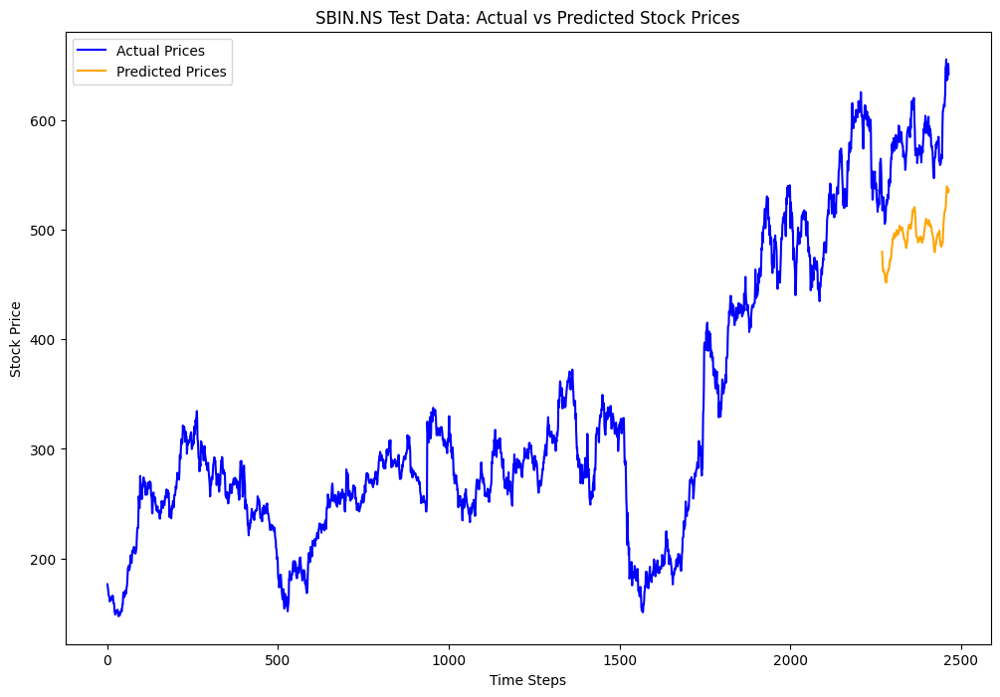

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0198, Validation Loss: 0.0814
Epoch [2/33], Loss: 0.0228, Validation Loss: 0.0499
Epoch [3/33], Loss: 0.0153, Validation Loss: 0.0409
Epoch [4/33], Loss: 0.0135, Validation Loss: 0.0397
Epoch [5/33], Loss: 0.0132, Validation Loss: 0.0384
Epoch [6/33], Loss: 0.0129, Validation Loss: 0.0352
Epoch [7/33], Loss: 0.0130, Validation Loss: 0.0310
Epoch [8/33], Loss: 0.0110, Validation Loss: 0.0125
Epoch [9/33], Loss: 0.0119, Validation Loss: 0.0551
Epoch [10/33], Loss: 0.0122, Validation Loss: 0.0241
Epoch [11/33], Loss: 0.0058, Validation Loss: 0.0320
Epoch [12/33], Loss: 0.0074, Validation Loss: 0.0032
Epoch [13/33], Loss: 0.0022, Validation Loss: 0.0008
Epoch [14/33], Loss: 0.0013, Validation Loss: 0.0013
Epoch [15/33], Loss: 0.0010, Validation Loss: 0.0006
Epoch [16/33], Loss: 0.0007, Validation Loss: 0.0005
Epoch [17/33], Loss: 0.0006, Validation Loss: 0.0004
Epoch [18/33], Loss: 0.0005, Validation Loss: 0.0006
Epoch [19/33], Loss: 0.0005, Validation Loss: 0.0008
Ep

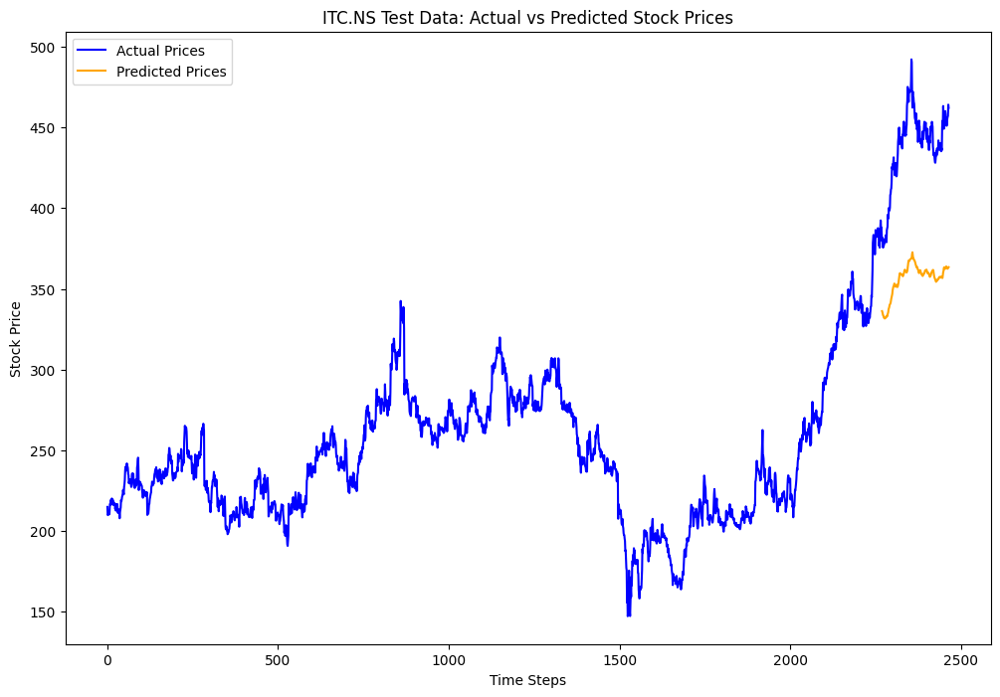

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0731, Validation Loss: 0.2625
Epoch [2/33], Loss: 0.0679, Validation Loss: 0.1800
Epoch [3/33], Loss: 0.0533, Validation Loss: 0.1456
Epoch [4/33], Loss: 0.0464, Validation Loss: 0.1313
Epoch [5/33], Loss: 0.0371, Validation Loss: 0.1022
Epoch [6/33], Loss: 0.0241, Validation Loss: 0.0295
Epoch [7/33], Loss: 0.0111, Validation Loss: 0.0343
Epoch [8/33], Loss: 0.0066, Validation Loss: 0.0178
Epoch [9/33], Loss: 0.0036, Validation Loss: 0.0080
Epoch [10/33], Loss: 0.0039, Validation Loss: 0.0056
Epoch [11/33], Loss: 0.0039, Validation Loss: 0.0151
Epoch [12/33], Loss: 0.0048, Validation Loss: 0.0146
Epoch [13/33], Loss: 0.0050, Validation Loss: 0.0175
Epoch [14/33], Loss: 0.0049, Validation Loss: 0.0150
Epoch [15/33], Loss: 0.0047, Validation Loss: 0.0137
Epoch [16/33], Loss: 0.0043, Validation Loss: 0.0119
Epoch [17/33], Loss: 0.0043, Validation Loss: 0.0094
Epoch [18/33], Loss: 0.0041, Validation Loss: 0.0146
Epoch [19/33], Loss: 0.0040, Validation Loss: 0.0129
Ep

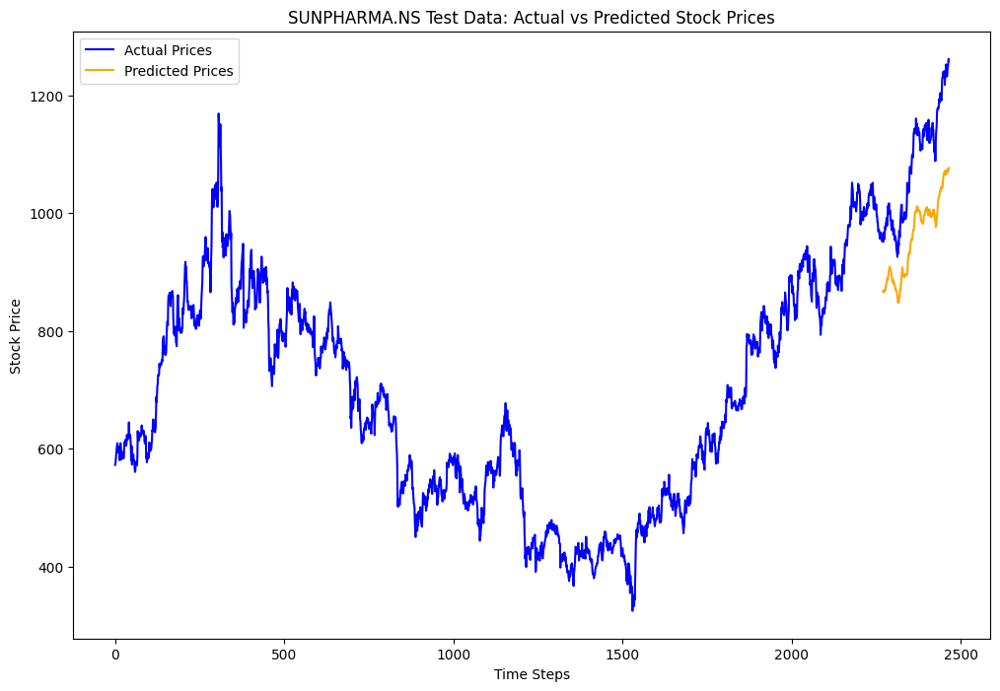

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0307, Validation Loss: 0.0444
Epoch [2/33], Loss: 0.0196, Validation Loss: 0.0080
Epoch [3/33], Loss: 0.0283, Validation Loss: 0.0066
Epoch [4/33], Loss: 0.0286, Validation Loss: 0.0056
Epoch [5/33], Loss: 0.0232, Validation Loss: 0.0034
Epoch [6/33], Loss: 0.0172, Validation Loss: 0.0023
Epoch [7/33], Loss: 0.0090, Validation Loss: 0.0022
Epoch [8/33], Loss: 0.0044, Validation Loss: 0.0021
Epoch [9/33], Loss: 0.0022, Validation Loss: 0.0013
Epoch [10/33], Loss: 0.0015, Validation Loss: 0.0019
Epoch [11/33], Loss: 0.0021, Validation Loss: 0.0022
Epoch [12/33], Loss: 0.0026, Validation Loss: 0.0017
Epoch [13/33], Loss: 0.0015, Validation Loss: 0.0010
Epoch [14/33], Loss: 0.0013, Validation Loss: 0.0005
Epoch [15/33], Loss: 0.0015, Validation Loss: 0.0011
Epoch [16/33], Loss: 0.0014, Validation Loss: 0.0005
Epoch [17/33], Loss: 0.0012, Validation Loss: 0.0006
Epoch [18/33], Loss: 0.0017, Validation Loss: 0.0010
Epoch [19/33], Loss: 0.0020, Validation Loss: 0.0007
Ep

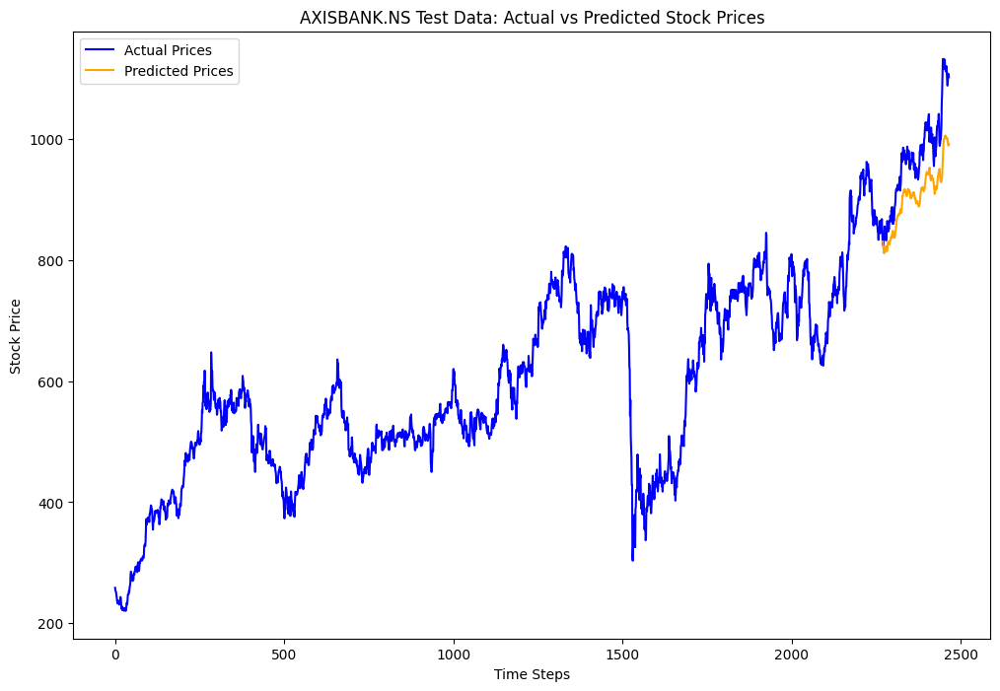

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0133, Validation Loss: 0.0136
Epoch [2/33], Loss: 0.1620, Validation Loss: 0.1097
Epoch [3/33], Loss: 0.0794, Validation Loss: 0.0364
Epoch [4/33], Loss: 0.0751, Validation Loss: 0.0123
Epoch [5/33], Loss: 0.0530, Validation Loss: 0.0371
Epoch [6/33], Loss: 0.0232, Validation Loss: 0.0006
Epoch [7/33], Loss: 0.0089, Validation Loss: 0.0003
Epoch [8/33], Loss: 0.0032, Validation Loss: 0.0003
Epoch [9/33], Loss: 0.0023, Validation Loss: 0.0006
Epoch [10/33], Loss: 0.0032, Validation Loss: 0.0023
Epoch [11/33], Loss: 0.0042, Validation Loss: 0.0014
Epoch [12/33], Loss: 0.0076, Validation Loss: 0.0009
Epoch [13/33], Loss: 0.0020, Validation Loss: 0.0004
Epoch [14/33], Loss: 0.0019, Validation Loss: 0.0004
Epoch [15/33], Loss: 0.0020, Validation Loss: 0.0003
Epoch [16/33], Loss: 0.0016, Validation Loss: 0.0003
Epoch [17/33], Loss: 0.0021, Validation Loss: 0.0004
Epoch [18/33], Loss: 0.0018, Validation Loss: 0.0004
Epoch [19/33], Loss: 0.0023, Validation Loss: 0.0006
Ep

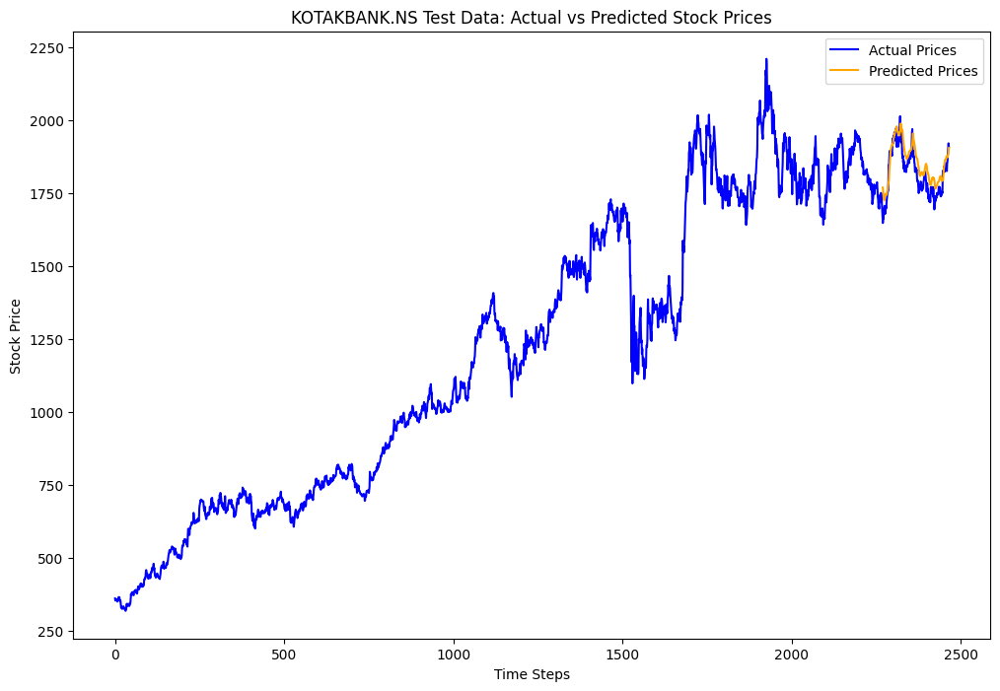

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0463, Validation Loss: 0.1309
Epoch [2/33], Loss: 0.0503, Validation Loss: 0.0074
Epoch [3/33], Loss: 0.0889, Validation Loss: 0.0121
Epoch [4/33], Loss: 0.0654, Validation Loss: 0.0025
Epoch [5/33], Loss: 0.0441, Validation Loss: 0.0120
Epoch [6/33], Loss: 0.0080, Validation Loss: 0.0156
Epoch [7/33], Loss: 0.0046, Validation Loss: 0.0092
Epoch [8/33], Loss: 0.0062, Validation Loss: 0.0095
Epoch [9/33], Loss: 0.0057, Validation Loss: 0.0102
Epoch [10/33], Loss: 0.0068, Validation Loss: 0.0105
Epoch [11/33], Loss: 0.0045, Validation Loss: 0.0062
Epoch [12/33], Loss: 0.0028, Validation Loss: 0.0025
Epoch [13/33], Loss: 0.0018, Validation Loss: 0.0005
Epoch [14/33], Loss: 0.0019, Validation Loss: 0.0003
Epoch [15/33], Loss: 0.0017, Validation Loss: 0.0003
Epoch [16/33], Loss: 0.0017, Validation Loss: 0.0012
Epoch [17/33], Loss: 0.0015, Validation Loss: 0.0003
Epoch [18/33], Loss: 0.0016, Validation Loss: 0.0004
Epoch [19/33], Loss: 0.0020, Validation Loss: 0.0003
Ep

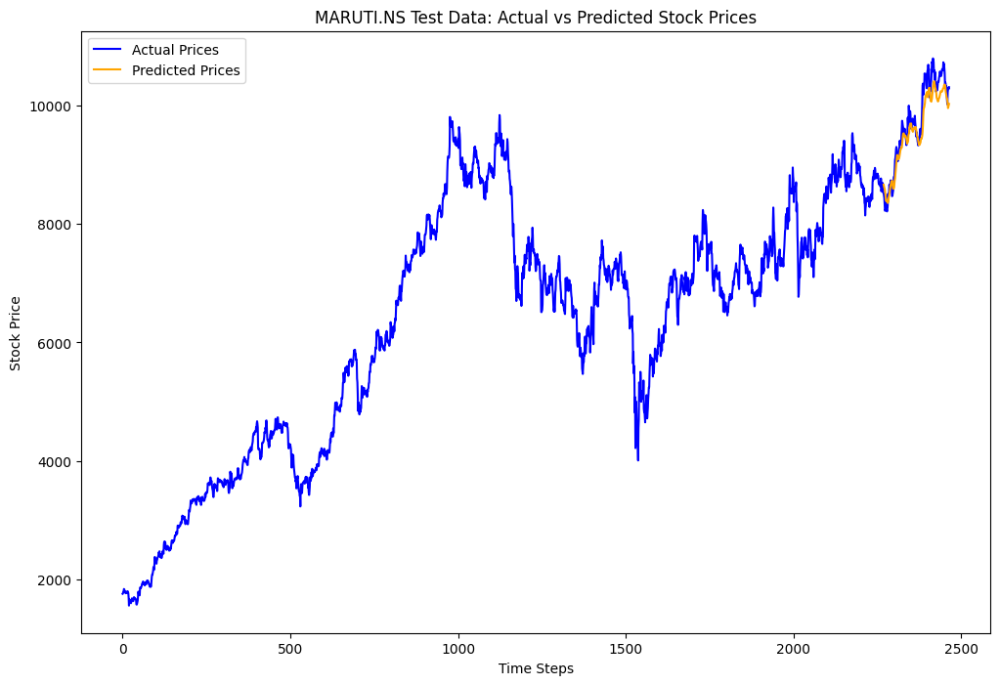

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0181, Validation Loss: 0.0069
Epoch [2/33], Loss: 0.0694, Validation Loss: 0.0539
Epoch [3/33], Loss: 0.0372, Validation Loss: 0.0498
Epoch [4/33], Loss: 0.0329, Validation Loss: 0.0400
Epoch [5/33], Loss: 0.0204, Validation Loss: 0.0027
Epoch [6/33], Loss: 0.0197, Validation Loss: 0.0279
Epoch [7/33], Loss: 0.0106, Validation Loss: 0.0011
Epoch [8/33], Loss: 0.0161, Validation Loss: 0.0362
Epoch [9/33], Loss: 0.0136, Validation Loss: 0.0145
Epoch [10/33], Loss: 0.0128, Validation Loss: 0.0003
Epoch [11/33], Loss: 0.0066, Validation Loss: 0.0060
Epoch [12/33], Loss: 0.0089, Validation Loss: 0.0086
Epoch [13/33], Loss: 0.0094, Validation Loss: 0.0003
Epoch [14/33], Loss: 0.0026, Validation Loss: 0.0002
Epoch [15/33], Loss: 0.0019, Validation Loss: 0.0007
Epoch [16/33], Loss: 0.0033, Validation Loss: 0.0003
Epoch [17/33], Loss: 0.0042, Validation Loss: 0.0022
Epoch [18/33], Loss: 0.0055, Validation Loss: 0.0005
Epoch [19/33], Loss: 0.0013, Validation Loss: 0.0003
Ep

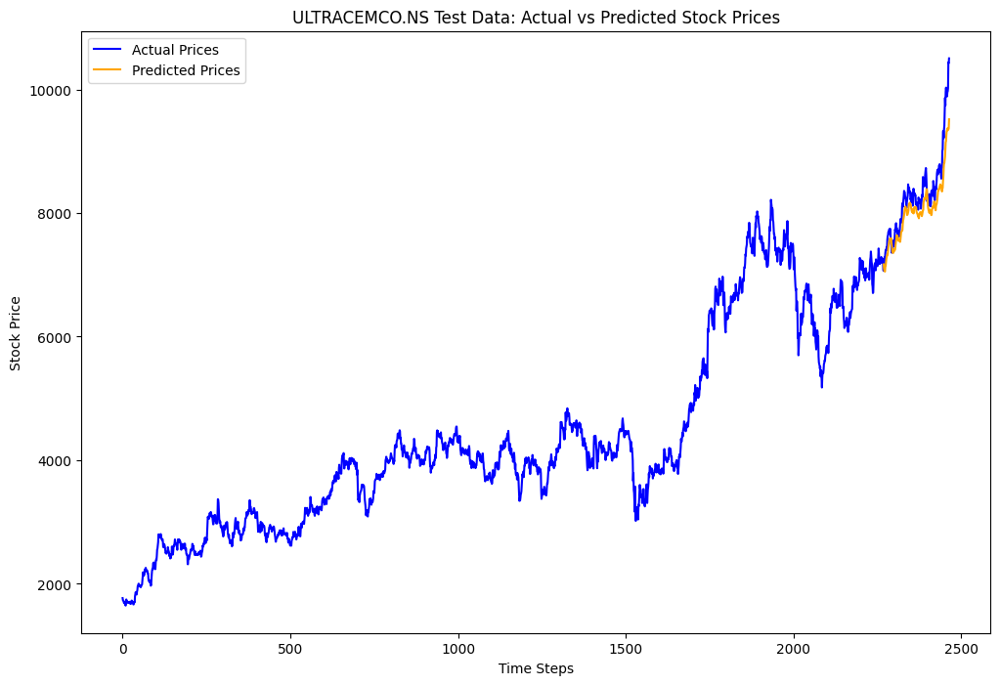

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0818, Validation Loss: 0.0274
Epoch [2/33], Loss: 0.0682, Validation Loss: 0.0177
Epoch [3/33], Loss: 0.0675, Validation Loss: 0.0047
Epoch [4/33], Loss: 0.0388, Validation Loss: 0.0193
Epoch [5/33], Loss: 0.0263, Validation Loss: 0.0050
Epoch [6/33], Loss: 0.0145, Validation Loss: 0.0007
Epoch [7/33], Loss: 0.0060, Validation Loss: 0.0005
Epoch [8/33], Loss: 0.0017, Validation Loss: 0.0005
Epoch [9/33], Loss: 0.0017, Validation Loss: 0.0005
Epoch [10/33], Loss: 0.0017, Validation Loss: 0.0004
Epoch [11/33], Loss: 0.0016, Validation Loss: 0.0003
Epoch [12/33], Loss: 0.0017, Validation Loss: 0.0004
Epoch [13/33], Loss: 0.0017, Validation Loss: 0.0005
Epoch [14/33], Loss: 0.0022, Validation Loss: 0.0005
Epoch [15/33], Loss: 0.0025, Validation Loss: 0.0021
Epoch [16/33], Loss: 0.0056, Validation Loss: 0.0012
Epoch [17/33], Loss: 0.0081, Validation Loss: 0.0121
Epoch [18/33], Loss: 0.0165, Validation Loss: 0.0022
Epoch [19/33], Loss: 0.0032, Validation Loss: 0.0050
Ep

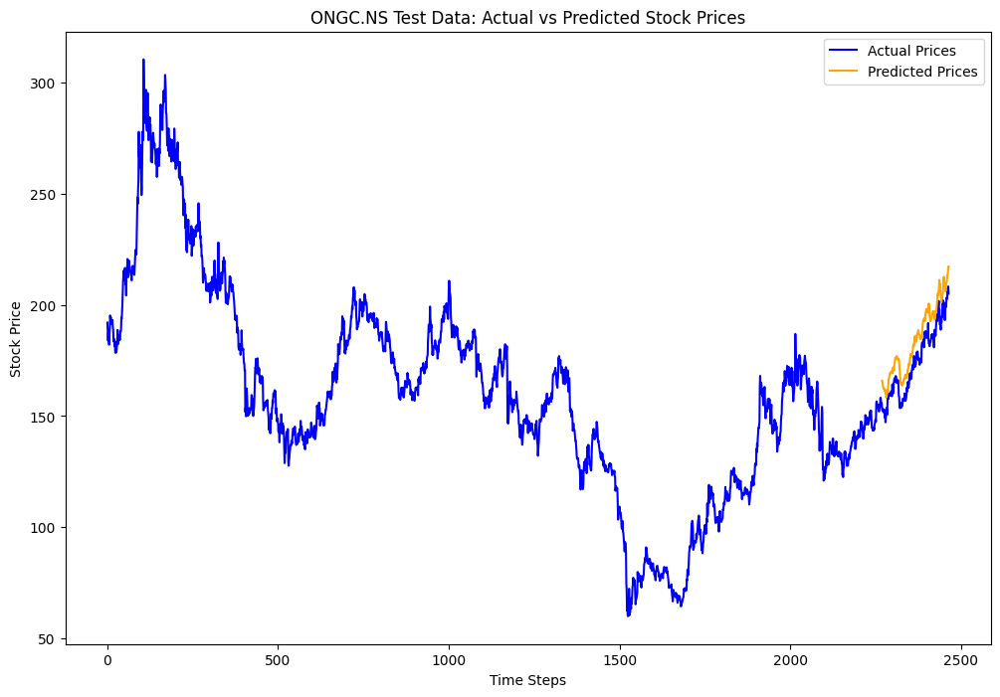

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0408, Validation Loss: 0.0142
Epoch [2/33], Loss: 0.1238, Validation Loss: 0.1460
Epoch [3/33], Loss: 0.0655, Validation Loss: 0.0977
Epoch [4/33], Loss: 0.0535, Validation Loss: 0.0400
Epoch [5/33], Loss: 0.2090, Validation Loss: 0.0833
Epoch [6/33], Loss: 0.0816, Validation Loss: 0.1480
Epoch [7/33], Loss: 0.0633, Validation Loss: 0.0928
Epoch [8/33], Loss: 0.0577, Validation Loss: 0.0670
Epoch [9/33], Loss: 0.0086, Validation Loss: 0.0224
Epoch [10/33], Loss: 0.0638, Validation Loss: 0.0808
Epoch [11/33], Loss: 0.0621, Validation Loss: 0.1077
Epoch [12/33], Loss: 0.0497, Validation Loss: 0.0649
Epoch [13/33], Loss: 0.0129, Validation Loss: 0.0082
Epoch [14/33], Loss: 0.0092, Validation Loss: 0.0089
Epoch [15/33], Loss: 0.0122, Validation Loss: 0.0088
Epoch [16/33], Loss: 0.0108, Validation Loss: 0.0076
Epoch [17/33], Loss: 0.0049, Validation Loss: 0.0021
Epoch [18/33], Loss: 0.0059, Validation Loss: 0.0050
Epoch [19/33], Loss: 0.0040, Validation Loss: 0.0018
Ep

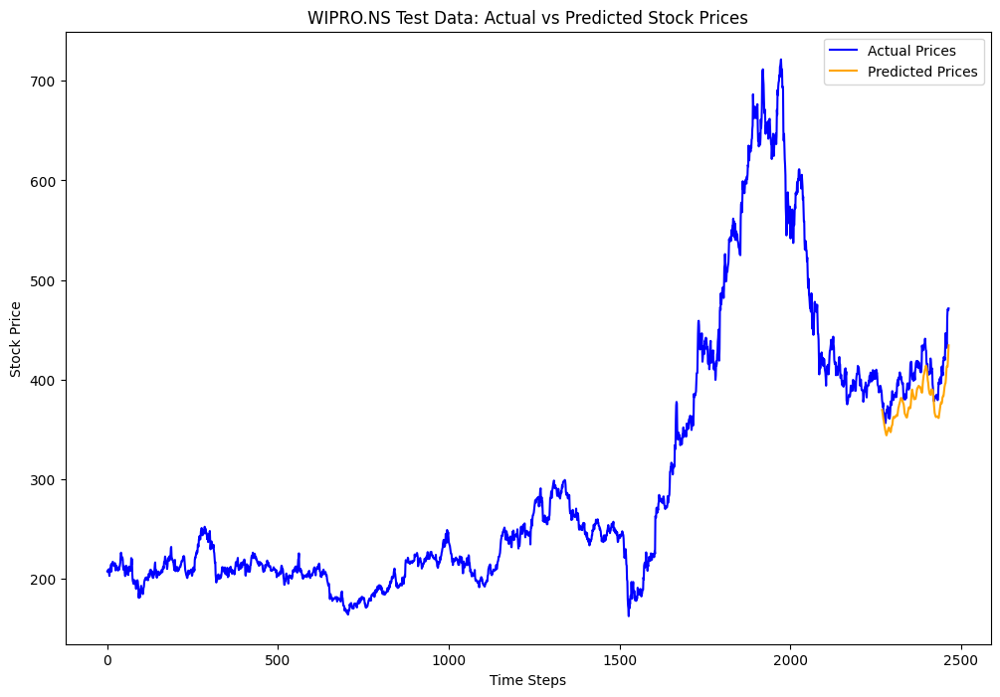

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0104, Validation Loss: 0.0146
Epoch [2/33], Loss: 0.0160, Validation Loss: 0.0116
Epoch [3/33], Loss: 0.0162, Validation Loss: 0.0192
Epoch [4/33], Loss: 0.0147, Validation Loss: 0.0264
Epoch [5/33], Loss: 0.0115, Validation Loss: 0.0183
Epoch [6/33], Loss: 0.0092, Validation Loss: 0.0050
Epoch [7/33], Loss: 0.0071, Validation Loss: 0.0022
Epoch [8/33], Loss: 0.0038, Validation Loss: 0.0003
Epoch [9/33], Loss: 0.0026, Validation Loss: 0.0004
Epoch [10/33], Loss: 0.0010, Validation Loss: 0.0003
Epoch [11/33], Loss: 0.0007, Validation Loss: 0.0008
Epoch [12/33], Loss: 0.0006, Validation Loss: 0.0004
Epoch [13/33], Loss: 0.0011, Validation Loss: 0.0006
Epoch [14/33], Loss: 0.0006, Validation Loss: 0.0003
Epoch [15/33], Loss: 0.0005, Validation Loss: 0.0003
Epoch [16/33], Loss: 0.0007, Validation Loss: 0.0003
Epoch [17/33], Loss: 0.0011, Validation Loss: 0.0021
Epoch [18/33], Loss: 0.0008, Validation Loss: 0.0004
Epoch [19/33], Loss: 0.0008, Validation Loss: 0.0009
Ep

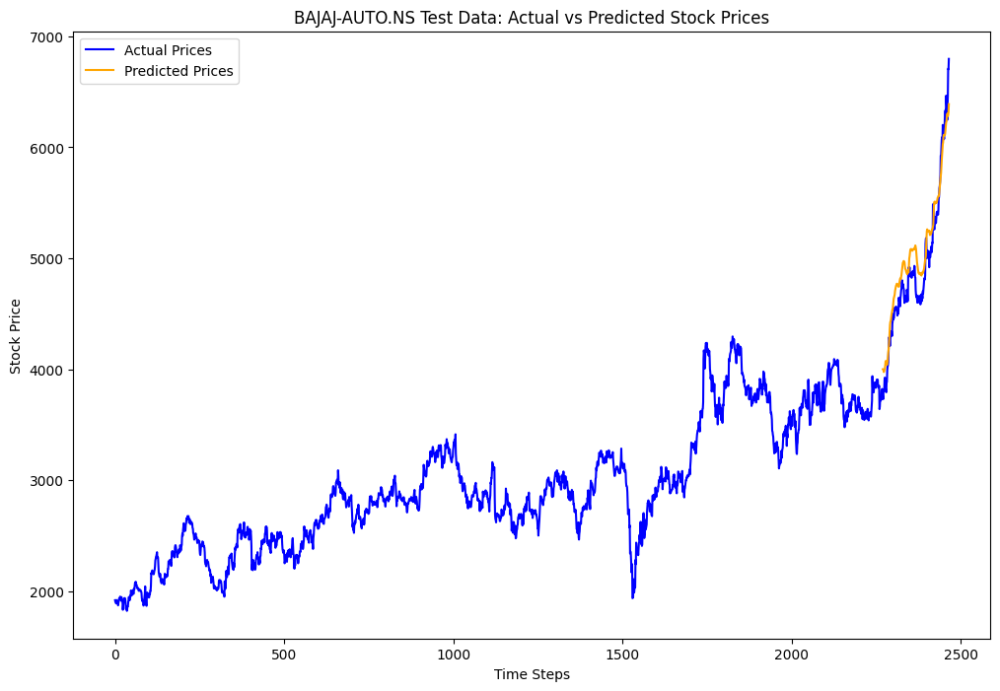

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0997, Validation Loss: 0.0217
Epoch [2/33], Loss: 0.1219, Validation Loss: 0.0077
Epoch [3/33], Loss: 0.1093, Validation Loss: 0.0032
Epoch [4/33], Loss: 0.0376, Validation Loss: 0.0132
Epoch [5/33], Loss: 0.0196, Validation Loss: 0.0007
Epoch [6/33], Loss: 0.0119, Validation Loss: 0.0007
Epoch [7/33], Loss: 0.0100, Validation Loss: 0.0051
Epoch [8/33], Loss: 0.0108, Validation Loss: 0.0033
Epoch [9/33], Loss: 0.0072, Validation Loss: 0.0017
Epoch [10/33], Loss: 0.0041, Validation Loss: 0.0015
Epoch [11/33], Loss: 0.0025, Validation Loss: 0.0004
Epoch [12/33], Loss: 0.0021, Validation Loss: 0.0003
Epoch [13/33], Loss: 0.0018, Validation Loss: 0.0010
Epoch [14/33], Loss: 0.0017, Validation Loss: 0.0003
Epoch [15/33], Loss: 0.0022, Validation Loss: 0.0006
Epoch [16/33], Loss: 0.0025, Validation Loss: 0.0018
Epoch [17/33], Loss: 0.0043, Validation Loss: 0.0035
Epoch [18/33], Loss: 0.0049, Validation Loss: 0.0117
Epoch [19/33], Loss: 0.0038, Validation Loss: 0.0026
Ep

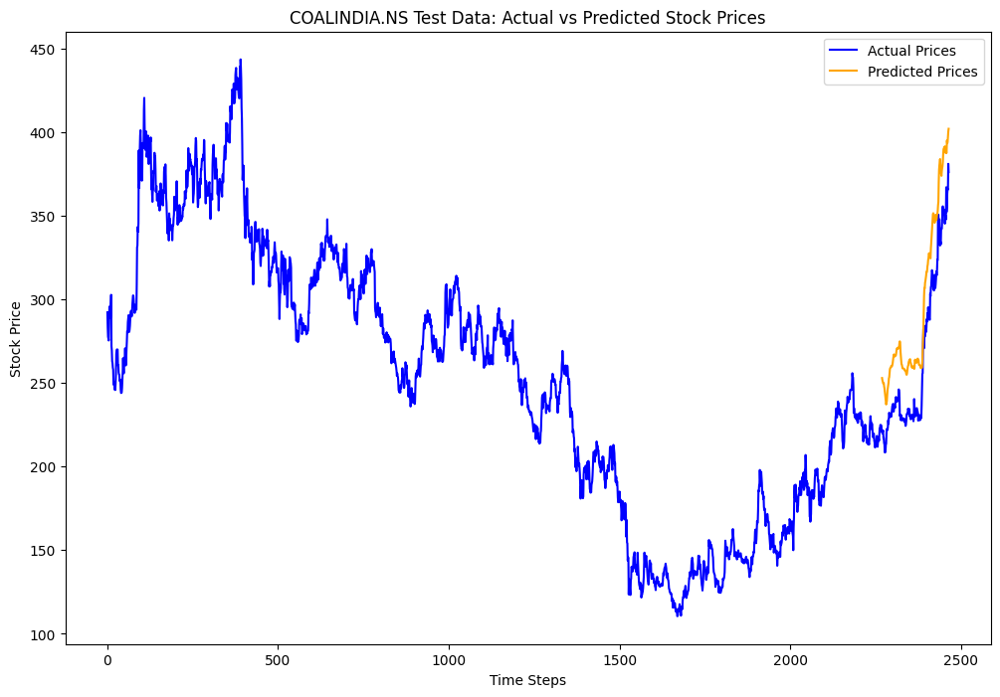

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0138, Validation Loss: 0.0165
Epoch [2/33], Loss: 0.0290, Validation Loss: 0.0767
Epoch [3/33], Loss: 0.0197, Validation Loss: 0.0758
Epoch [4/33], Loss: 0.0165, Validation Loss: 0.0682
Epoch [5/33], Loss: 0.0150, Validation Loss: 0.0538
Epoch [6/33], Loss: 0.0113, Validation Loss: 0.0182
Epoch [7/33], Loss: 0.0073, Validation Loss: 0.0187
Epoch [8/33], Loss: 0.0106, Validation Loss: 0.0397
Epoch [9/33], Loss: 0.0052, Validation Loss: 0.0056
Epoch [10/33], Loss: 0.0031, Validation Loss: 0.0021
Epoch [11/33], Loss: 0.0029, Validation Loss: 0.0003
Epoch [12/33], Loss: 0.0011, Validation Loss: 0.0003
Epoch [13/33], Loss: 0.0018, Validation Loss: 0.0024
Epoch [14/33], Loss: 0.0058, Validation Loss: 0.0204
Epoch [15/33], Loss: 0.0055, Validation Loss: 0.0004
Epoch [16/33], Loss: 0.0024, Validation Loss: 0.0006
Epoch [17/33], Loss: 0.0028, Validation Loss: 0.0084
Epoch [18/33], Loss: 0.0028, Validation Loss: 0.0002
Epoch [19/33], Loss: 0.0012, Validation Loss: 0.0007
Ep

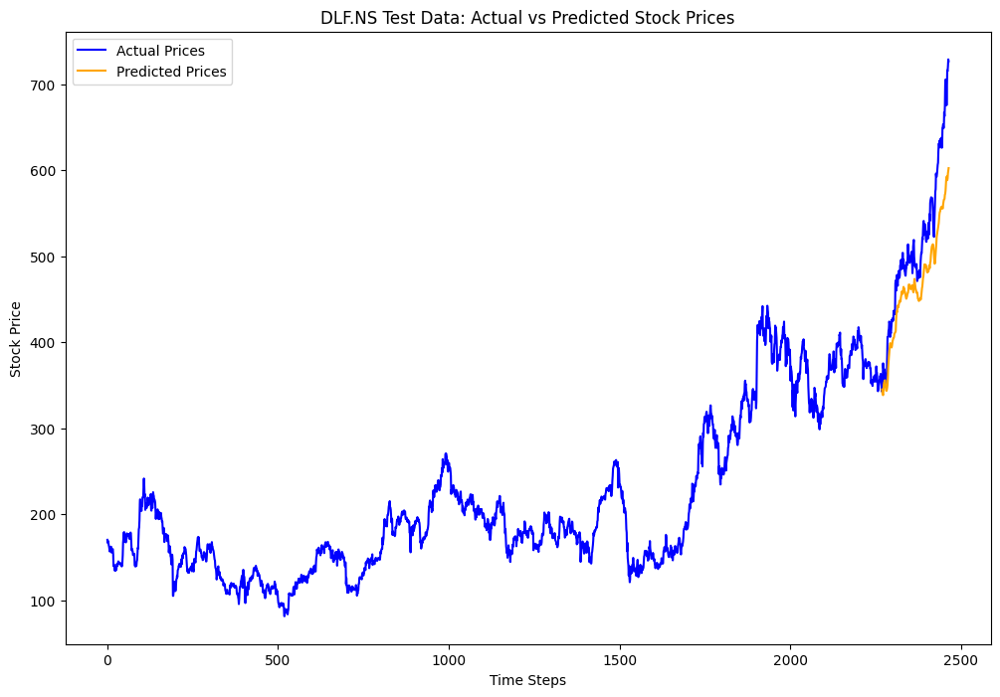

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0389, Validation Loss: 0.0123
Epoch [2/33], Loss: 0.1473, Validation Loss: 0.1502
Epoch [3/33], Loss: 0.0639, Validation Loss: 0.0881
Epoch [4/33], Loss: 0.0424, Validation Loss: 0.0594
Epoch [5/33], Loss: 0.0458, Validation Loss: 0.0980
Epoch [6/33], Loss: 0.0429, Validation Loss: 0.0570
Epoch [7/33], Loss: 0.0188, Validation Loss: 0.0075
Epoch [8/33], Loss: 0.0181, Validation Loss: 0.0529
Epoch [9/33], Loss: 0.0236, Validation Loss: 0.0214
Epoch [10/33], Loss: 0.0140, Validation Loss: 0.0006
Epoch [11/33], Loss: 0.0031, Validation Loss: 0.0008
Epoch [12/33], Loss: 0.0072, Validation Loss: 0.0013
Epoch [13/33], Loss: 0.0075, Validation Loss: 0.0003
Epoch [14/33], Loss: 0.0068, Validation Loss: 0.0011
Epoch [15/33], Loss: 0.0063, Validation Loss: 0.0004
Epoch [16/33], Loss: 0.0056, Validation Loss: 0.0008
Epoch [17/33], Loss: 0.0058, Validation Loss: 0.0003
Epoch [18/33], Loss: 0.0058, Validation Loss: 0.0008
Epoch [19/33], Loss: 0.0064, Validation Loss: 0.0003
Ep

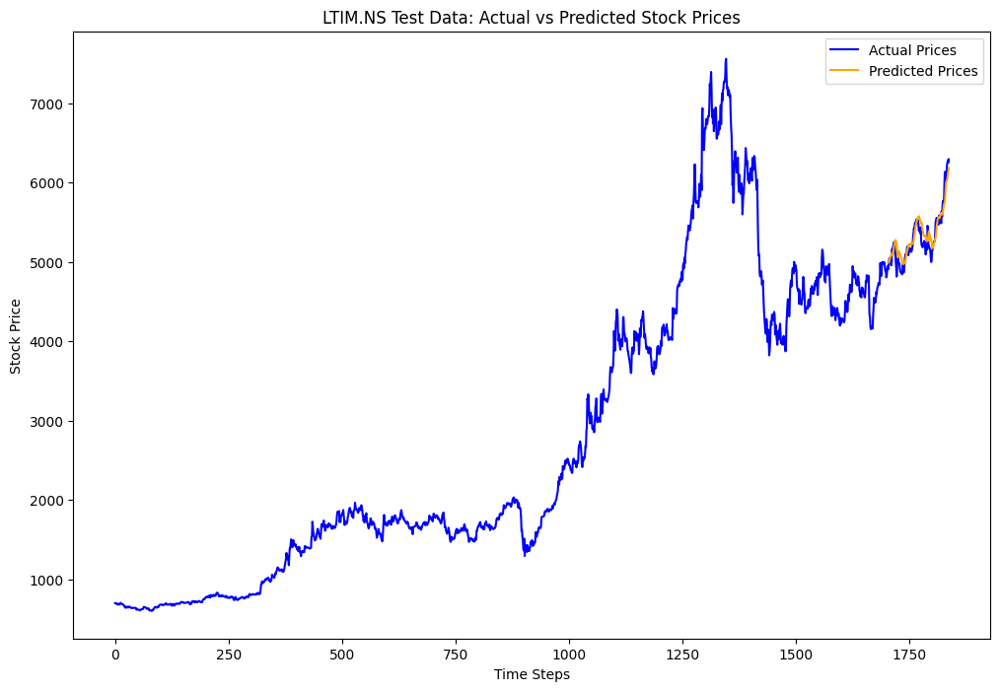

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0022, Validation Loss: 0.1755
Epoch [2/33], Loss: 0.0036, Validation Loss: 0.1903
Epoch [3/33], Loss: 0.0044, Validation Loss: 0.2367
Epoch [4/33], Loss: 0.0036, Validation Loss: 0.2455
Epoch [5/33], Loss: 0.0029, Validation Loss: 0.2440
Epoch [6/33], Loss: 0.0027, Validation Loss: 0.2426
Epoch [7/33], Loss: 0.0028, Validation Loss: 0.2429
Epoch [8/33], Loss: 0.0027, Validation Loss: 0.2428
Epoch [9/33], Loss: 0.0026, Validation Loss: 0.2429
Epoch [10/33], Loss: 0.0026, Validation Loss: 0.2427
Epoch [11/33], Loss: 0.0026, Validation Loss: 0.2428
Epoch [12/33], Loss: 0.0026, Validation Loss: 0.2425
Epoch [13/33], Loss: 0.0026, Validation Loss: 0.2427
Epoch [14/33], Loss: 0.0026, Validation Loss: 0.2427
Epoch [15/33], Loss: 0.0026, Validation Loss: 0.2423
Epoch [16/33], Loss: 0.0026, Validation Loss: 0.2425
Epoch [17/33], Loss: 0.0026, Validation Loss: 0.2422
Epoch [18/33], Loss: 0.0025, Validation Loss: 0.2423
Epoch [19/33], Loss: 0.0026, Validation Loss: 0.2421
Ep

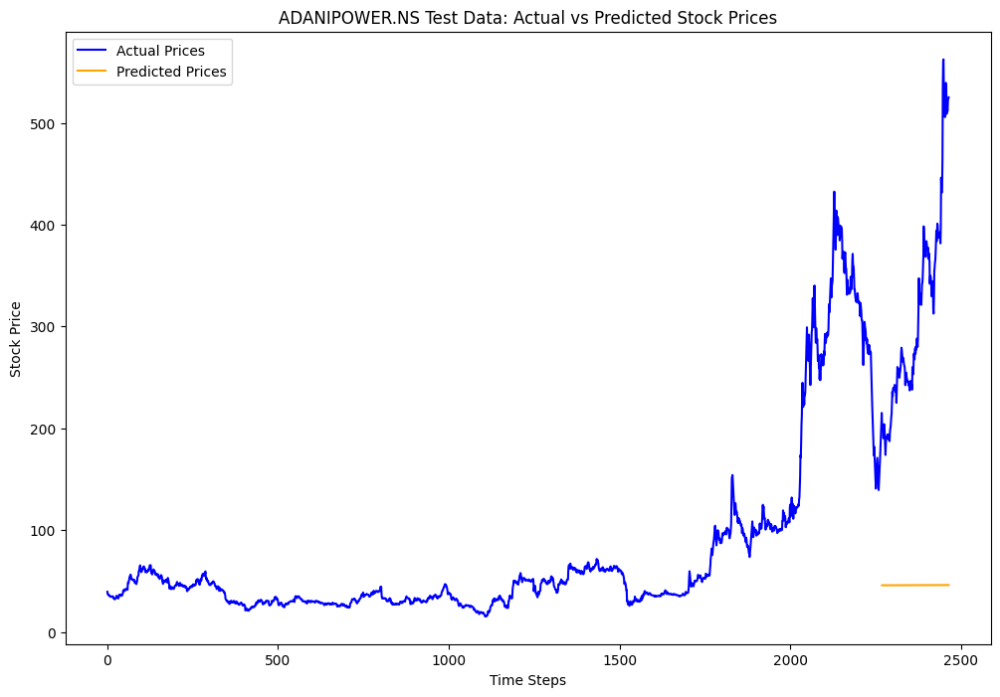

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0367, Validation Loss: 0.0221
Epoch [2/33], Loss: 0.1095, Validation Loss: 0.1555
Epoch [3/33], Loss: 0.0519, Validation Loss: 0.0838
Epoch [4/33], Loss: 0.0540, Validation Loss: 0.0774
Epoch [5/33], Loss: 0.0148, Validation Loss: 0.0012
Epoch [6/33], Loss: 0.0326, Validation Loss: 0.0275
Epoch [7/33], Loss: 0.0117, Validation Loss: 0.0044
Epoch [8/33], Loss: 0.0100, Validation Loss: 0.0015
Epoch [9/33], Loss: 0.0114, Validation Loss: 0.0216
Epoch [10/33], Loss: 0.0355, Validation Loss: 0.0555
Epoch [11/33], Loss: 0.0268, Validation Loss: 0.0151
Epoch [12/33], Loss: 0.0084, Validation Loss: 0.0021
Epoch [13/33], Loss: 0.0162, Validation Loss: 0.0170
Epoch [14/33], Loss: 0.0082, Validation Loss: 0.0028
Epoch [15/33], Loss: 0.0027, Validation Loss: 0.0013
Epoch [16/33], Loss: 0.0024, Validation Loss: 0.0012
Epoch [17/33], Loss: 0.0059, Validation Loss: 0.0025
Epoch [18/33], Loss: 0.0062, Validation Loss: 0.0007
Epoch [19/33], Loss: 0.0126, Validation Loss: 0.0067
Ep

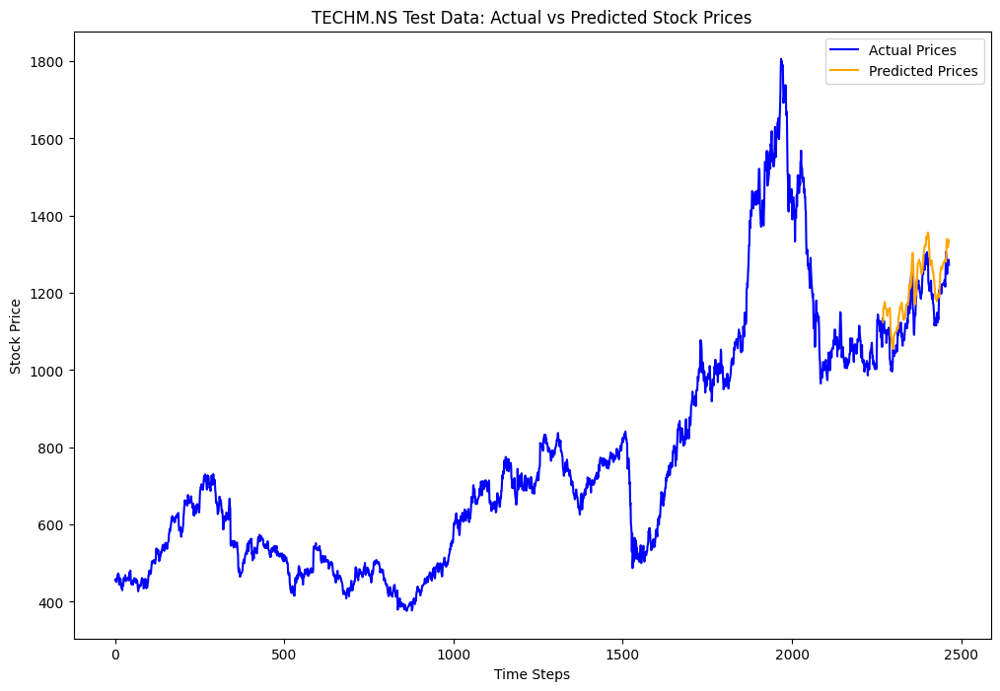

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0205, Validation Loss: 0.0056
Epoch [2/33], Loss: 0.1315, Validation Loss: 0.2259
Epoch [3/33], Loss: 0.0295, Validation Loss: 0.0074
Epoch [4/33], Loss: 0.0964, Validation Loss: 0.1197
Epoch [5/33], Loss: 0.0139, Validation Loss: 0.0018
Epoch [6/33], Loss: 0.0081, Validation Loss: 0.0032
Epoch [7/33], Loss: 0.0061, Validation Loss: 0.0016
Epoch [8/33], Loss: 0.0030, Validation Loss: 0.0026
Epoch [9/33], Loss: 0.0041, Validation Loss: 0.0035
Epoch [10/33], Loss: 0.0036, Validation Loss: 0.0012
Epoch [11/33], Loss: 0.0023, Validation Loss: 0.0015
Epoch [12/33], Loss: 0.0025, Validation Loss: 0.0018
Epoch [13/33], Loss: 0.0033, Validation Loss: 0.0031
Epoch [14/33], Loss: 0.0034, Validation Loss: 0.0010
Epoch [15/33], Loss: 0.0024, Validation Loss: 0.0026
Epoch [16/33], Loss: 0.0039, Validation Loss: 0.0022
Epoch [17/33], Loss: 0.0034, Validation Loss: 0.0014
Epoch [18/33], Loss: 0.0022, Validation Loss: 0.0012
Epoch [19/33], Loss: 0.0021, Validation Loss: 0.0029
Ep

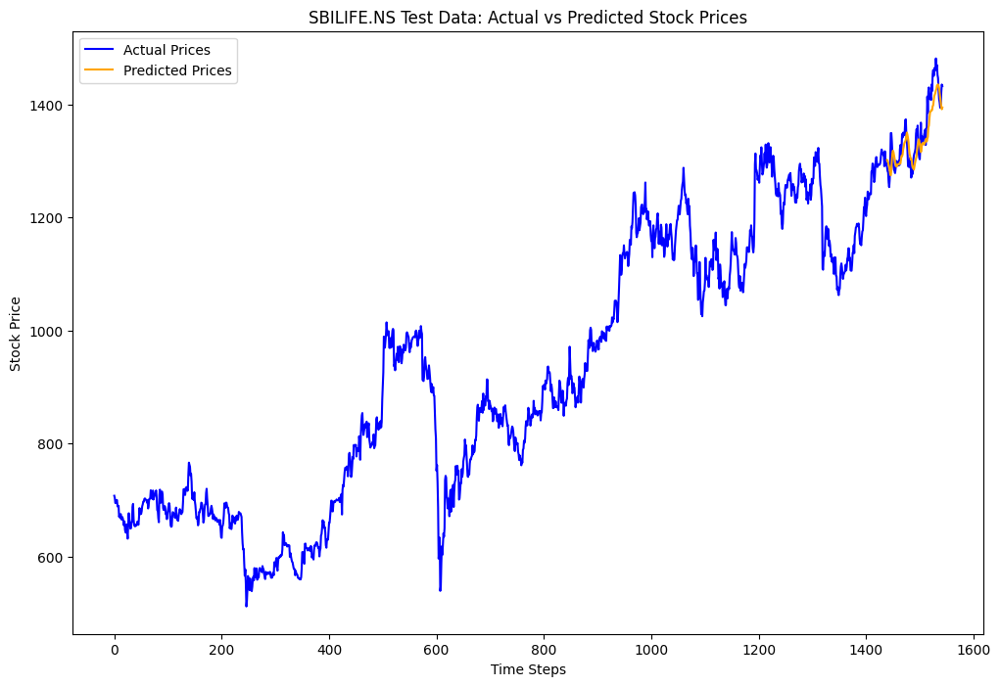

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0301, Validation Loss: 0.0441
Epoch [2/33], Loss: 0.0620, Validation Loss: 0.1966
Epoch [3/33], Loss: 0.0320, Validation Loss: 0.1355
Epoch [4/33], Loss: 0.0256, Validation Loss: 0.0102
Epoch [5/33], Loss: 0.0097, Validation Loss: 0.0228
Epoch [6/33], Loss: 0.0068, Validation Loss: 0.0053
Epoch [7/33], Loss: 0.0054, Validation Loss: 0.0012
Epoch [8/33], Loss: 0.0084, Validation Loss: 0.0256
Epoch [9/33], Loss: 0.0127, Validation Loss: 0.0338
Epoch [10/33], Loss: 0.0115, Validation Loss: 0.0047
Epoch [11/33], Loss: 0.0113, Validation Loss: 0.0322
Epoch [12/33], Loss: 0.0081, Validation Loss: 0.0032
Epoch [13/33], Loss: 0.0091, Validation Loss: 0.0338
Epoch [14/33], Loss: 0.0056, Validation Loss: 0.0026
Epoch [15/33], Loss: 0.0056, Validation Loss: 0.0175
Epoch [16/33], Loss: 0.0040, Validation Loss: 0.0021
Epoch [17/33], Loss: 0.0032, Validation Loss: 0.0068
Epoch [18/33], Loss: 0.0032, Validation Loss: 0.0016
Epoch [19/33], Loss: 0.0039, Validation Loss: 0.0081
Ep

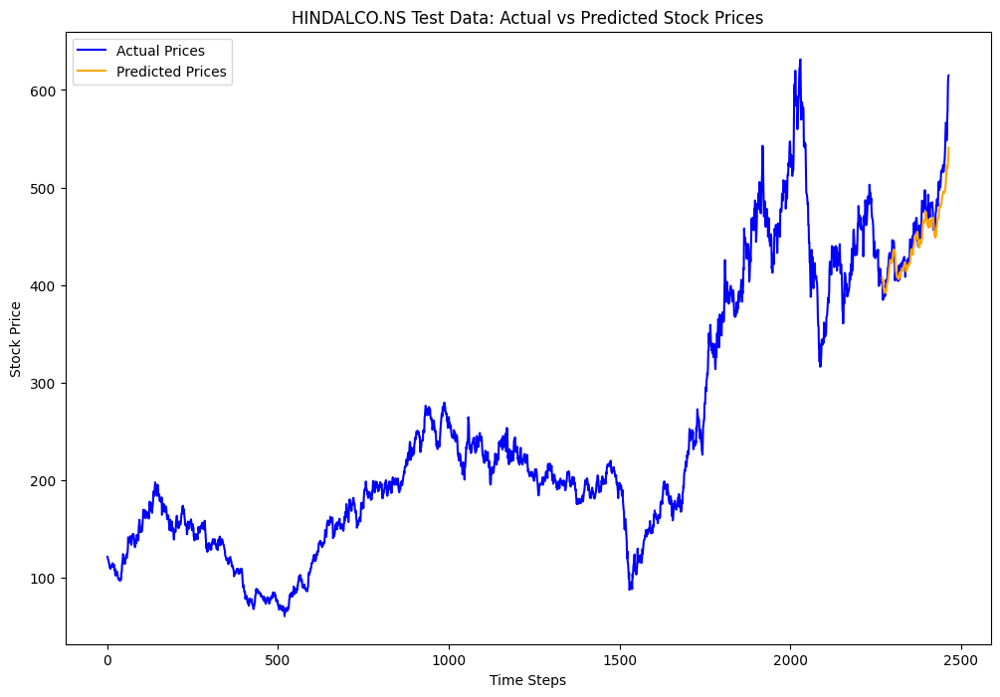

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0263, Validation Loss: 0.1496
Epoch [2/33], Loss: 0.0339, Validation Loss: 0.1065
Epoch [3/33], Loss: 0.0324, Validation Loss: 0.0383
Epoch [4/33], Loss: 0.0364, Validation Loss: 0.0243
Epoch [5/33], Loss: 0.0315, Validation Loss: 0.0326
Epoch [6/33], Loss: 0.0137, Validation Loss: 0.0127
Epoch [7/33], Loss: 0.0021, Validation Loss: 0.0006
Epoch [8/33], Loss: 0.0016, Validation Loss: 0.0006
Epoch [9/33], Loss: 0.0021, Validation Loss: 0.0024
Epoch [10/33], Loss: 0.0019, Validation Loss: 0.0030
Epoch [11/33], Loss: 0.0023, Validation Loss: 0.0074
Epoch [12/33], Loss: 0.0062, Validation Loss: 0.0142
Epoch [13/33], Loss: 0.0018, Validation Loss: 0.0026
Epoch [14/33], Loss: 0.0056, Validation Loss: 0.0084
Epoch [15/33], Loss: 0.0041, Validation Loss: 0.0064
Epoch [16/33], Loss: 0.0052, Validation Loss: 0.0039
Epoch [17/33], Loss: 0.0102, Validation Loss: 0.0157
Epoch [18/33], Loss: 0.0053, Validation Loss: 0.0004
Epoch [19/33], Loss: 0.0035, Validation Loss: 0.0025
Ep

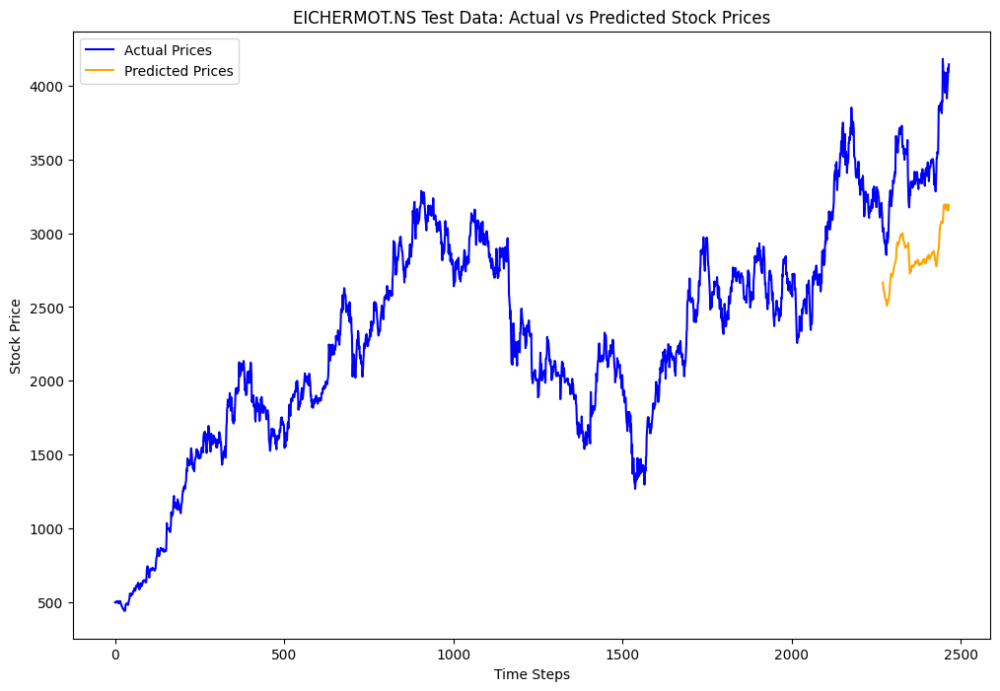

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0499, Validation Loss: 0.0663
Epoch [2/33], Loss: 0.0512, Validation Loss: 0.0051
Epoch [3/33], Loss: 0.0390, Validation Loss: 0.0028
Epoch [4/33], Loss: 0.0361, Validation Loss: 0.0021
Epoch [5/33], Loss: 0.0270, Validation Loss: 0.0039
Epoch [6/33], Loss: 0.0203, Validation Loss: 0.0026
Epoch [7/33], Loss: 0.0117, Validation Loss: 0.0010
Epoch [8/33], Loss: 0.0055, Validation Loss: 0.0011
Epoch [9/33], Loss: 0.0024, Validation Loss: 0.0009
Epoch [10/33], Loss: 0.0016, Validation Loss: 0.0005
Epoch [11/33], Loss: 0.0016, Validation Loss: 0.0004
Epoch [12/33], Loss: 0.0016, Validation Loss: 0.0004
Epoch [13/33], Loss: 0.0016, Validation Loss: 0.0005
Epoch [14/33], Loss: 0.0015, Validation Loss: 0.0007
Epoch [15/33], Loss: 0.0015, Validation Loss: 0.0007
Epoch [16/33], Loss: 0.0015, Validation Loss: 0.0005
Epoch [17/33], Loss: 0.0013, Validation Loss: 0.0004
Epoch [18/33], Loss: 0.0018, Validation Loss: 0.0011
Epoch [19/33], Loss: 0.0016, Validation Loss: 0.0004
Ep

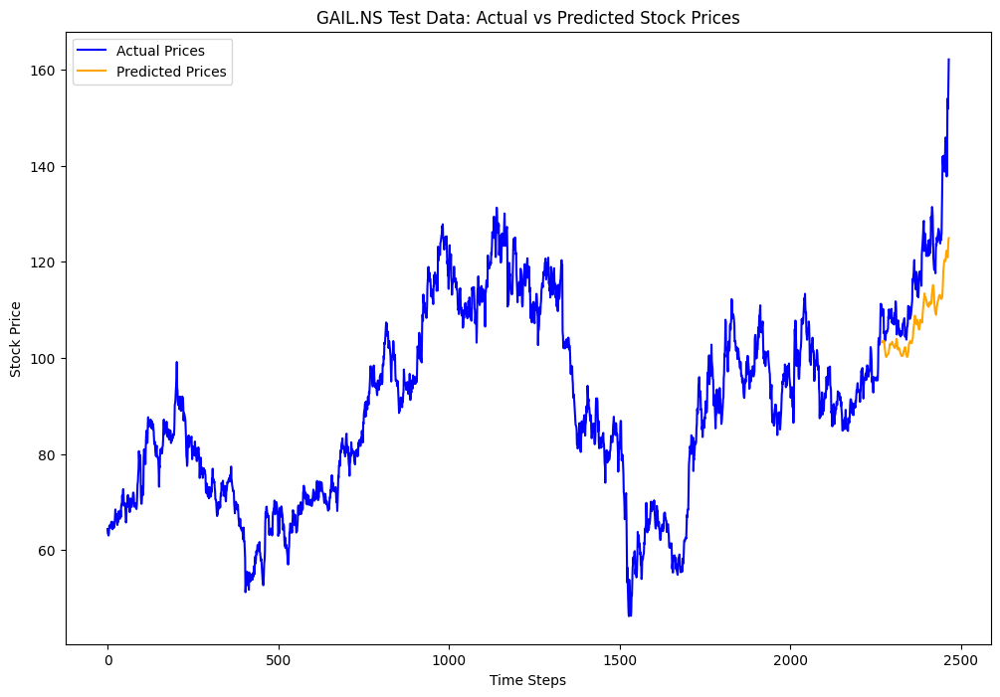

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0470, Validation Loss: 0.0443
Epoch [2/33], Loss: 0.0109, Validation Loss: 0.0936
Epoch [3/33], Loss: 0.0117, Validation Loss: 0.0660
Epoch [4/33], Loss: 0.0098, Validation Loss: 0.0672
Epoch [5/33], Loss: 0.0090, Validation Loss: 0.0719
Epoch [6/33], Loss: 0.0093, Validation Loss: 0.0637
Epoch [7/33], Loss: 0.0087, Validation Loss: 0.0625
Epoch [8/33], Loss: 0.0087, Validation Loss: 0.0565
Epoch [9/33], Loss: 0.0077, Validation Loss: 0.0495
Epoch [10/33], Loss: 0.0072, Validation Loss: 0.0307
Epoch [11/33], Loss: 0.0054, Validation Loss: 0.0029
Epoch [12/33], Loss: 0.0032, Validation Loss: 0.0271
Epoch [13/33], Loss: 0.0046, Validation Loss: 0.0113
Epoch [14/33], Loss: 0.0031, Validation Loss: 0.0174
Epoch [15/33], Loss: 0.0074, Validation Loss: 0.0264
Epoch [16/33], Loss: 0.0059, Validation Loss: 0.0258
Epoch [17/33], Loss: 0.0050, Validation Loss: 0.0389
Epoch [18/33], Loss: 0.0051, Validation Loss: 0.0167
Epoch [19/33], Loss: 0.0028, Validation Loss: 0.0148
Ep

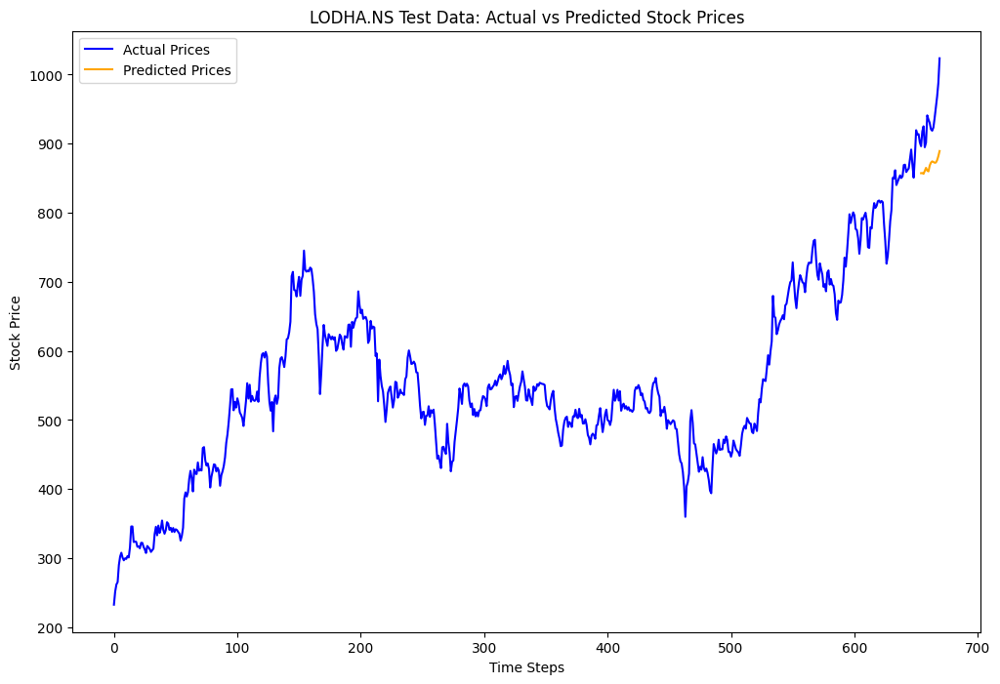

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0264, Validation Loss: 0.2012
Epoch [2/33], Loss: 0.0231, Validation Loss: 0.2064
Epoch [3/33], Loss: 0.0211, Validation Loss: 0.1992
Epoch [4/33], Loss: 0.0167, Validation Loss: 0.1345
Epoch [5/33], Loss: 0.0102, Validation Loss: 0.0198
Epoch [6/33], Loss: 0.0041, Validation Loss: 0.0134
Epoch [7/33], Loss: 0.0024, Validation Loss: 0.0132
Epoch [8/33], Loss: 0.0054, Validation Loss: 0.0030
Epoch [9/33], Loss: 0.0085, Validation Loss: 0.0475
Epoch [10/33], Loss: 0.0188, Validation Loss: 0.2031
Epoch [11/33], Loss: 0.0132, Validation Loss: 0.1130
Epoch [12/33], Loss: 0.0075, Validation Loss: 0.0300
Epoch [13/33], Loss: 0.0035, Validation Loss: 0.0097
Epoch [14/33], Loss: 0.0081, Validation Loss: 0.0722
Epoch [15/33], Loss: 0.0023, Validation Loss: 0.0049
Epoch [16/33], Loss: 0.0012, Validation Loss: 0.0023
Epoch [17/33], Loss: 0.0012, Validation Loss: 0.0041
Epoch [18/33], Loss: 0.0012, Validation Loss: 0.0055
Epoch [19/33], Loss: 0.0015, Validation Loss: 0.0016
Ep

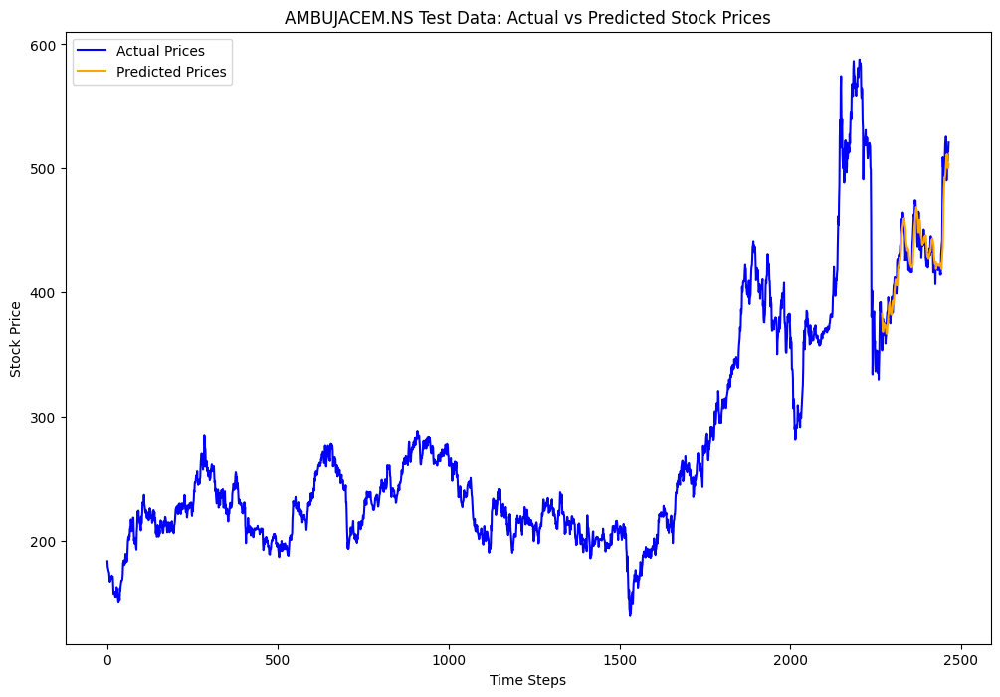

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0925, Validation Loss: 0.1072
Epoch [2/33], Loss: 0.1141, Validation Loss: 0.0638
Epoch [3/33], Loss: 0.1091, Validation Loss: 0.0241
Epoch [4/33], Loss: 0.0565, Validation Loss: 0.0333
Epoch [5/33], Loss: 0.0571, Validation Loss: 0.0225
Epoch [6/33], Loss: 0.0127, Validation Loss: 0.0092
Epoch [7/33], Loss: 0.0107, Validation Loss: 0.0171
Epoch [8/33], Loss: 0.0118, Validation Loss: 0.0124
Epoch [9/33], Loss: 0.0108, Validation Loss: 0.0148
Epoch [10/33], Loss: 0.0104, Validation Loss: 0.0094
Epoch [11/33], Loss: 0.0087, Validation Loss: 0.0098
Epoch [12/33], Loss: 0.0078, Validation Loss: 0.0124
Epoch [13/33], Loss: 0.0076, Validation Loss: 0.0102
Epoch [14/33], Loss: 0.0074, Validation Loss: 0.0099
Epoch [15/33], Loss: 0.0070, Validation Loss: 0.0081
Epoch [16/33], Loss: 0.0066, Validation Loss: 0.0116
Epoch [17/33], Loss: 0.0072, Validation Loss: 0.0101
Epoch [18/33], Loss: 0.0069, Validation Loss: 0.0101
Epoch [19/33], Loss: 0.0069, Validation Loss: 0.0085
Ep

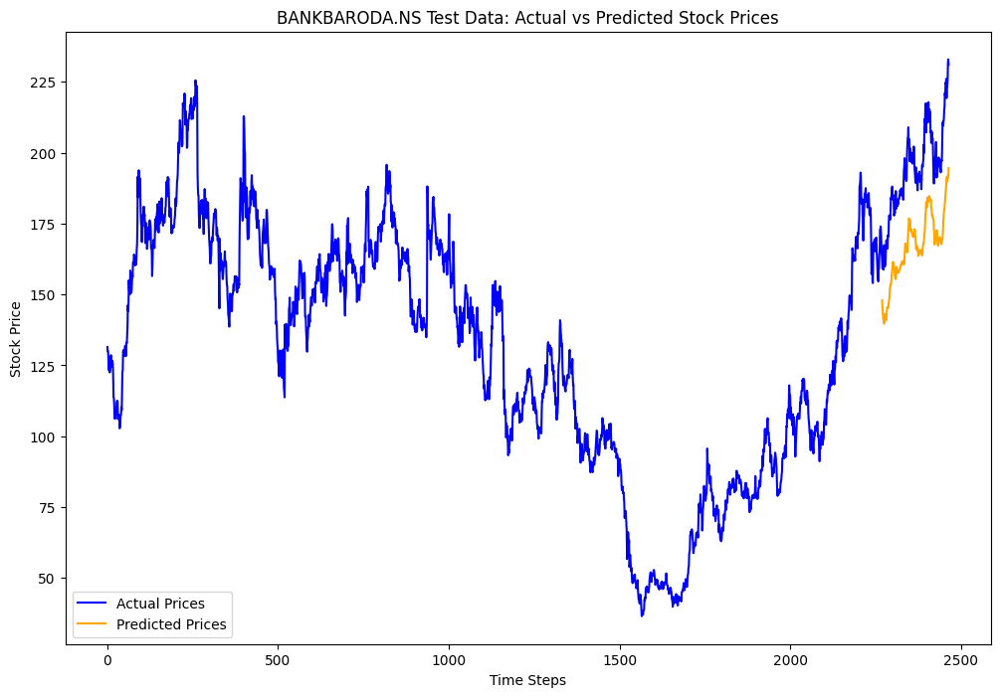

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0386, Validation Loss: 0.1811
Epoch [2/33], Loss: 0.0393, Validation Loss: 0.2249
Epoch [3/33], Loss: 0.0323, Validation Loss: 0.1781
Epoch [4/33], Loss: 0.0228, Validation Loss: 0.0901
Epoch [5/33], Loss: 0.0147, Validation Loss: 0.0028
Epoch [6/33], Loss: 0.0144, Validation Loss: 0.0294
Epoch [7/33], Loss: 0.0054, Validation Loss: 0.0175
Epoch [8/33], Loss: 0.0070, Validation Loss: 0.0068
Epoch [9/33], Loss: 0.0047, Validation Loss: 0.0078
Epoch [10/33], Loss: 0.0062, Validation Loss: 0.0132
Epoch [11/33], Loss: 0.0040, Validation Loss: 0.0044
Epoch [12/33], Loss: 0.0065, Validation Loss: 0.0163
Epoch [13/33], Loss: 0.0036, Validation Loss: 0.0048
Epoch [14/33], Loss: 0.0071, Validation Loss: 0.0267
Epoch [15/33], Loss: 0.0031, Validation Loss: 0.0022
Epoch [16/33], Loss: 0.0041, Validation Loss: 0.0086
Epoch [17/33], Loss: 0.0031, Validation Loss: 0.0027
Epoch [18/33], Loss: 0.0048, Validation Loss: 0.0083
Epoch [19/33], Loss: 0.0034, Validation Loss: 0.0038
Ep

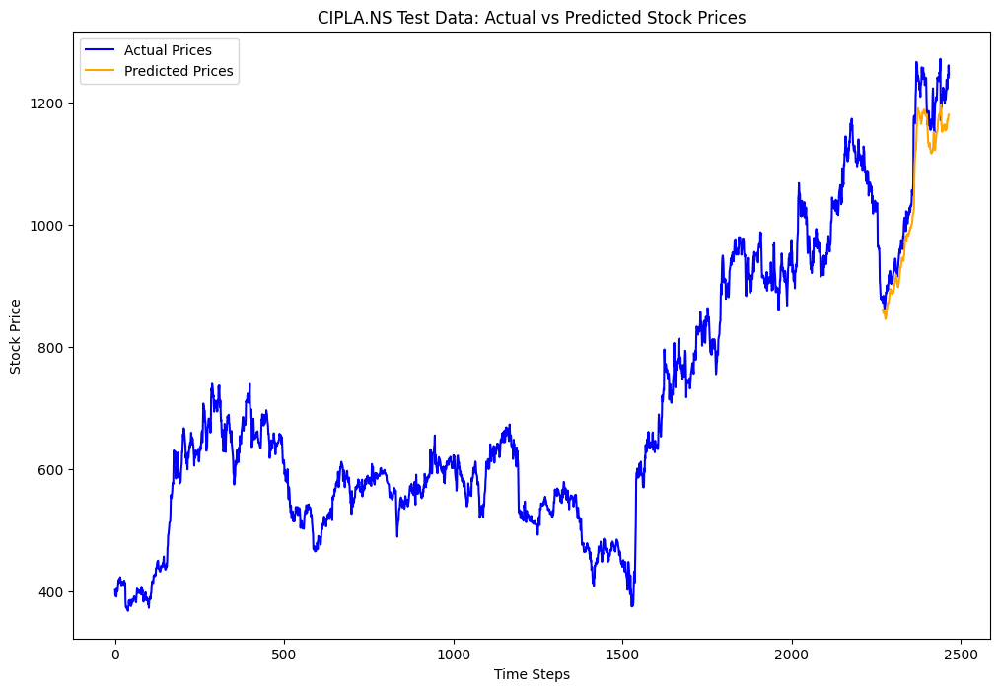

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0118, Validation Loss: 0.1076
Epoch [2/33], Loss: 0.0361, Validation Loss: 0.0849
Epoch [3/33], Loss: 0.0384, Validation Loss: 0.1380
Epoch [4/33], Loss: 0.0298, Validation Loss: 0.1370
Epoch [5/33], Loss: 0.0170, Validation Loss: 0.0555
Epoch [6/33], Loss: 0.0286, Validation Loss: 0.0410
Epoch [7/33], Loss: 0.0258, Validation Loss: 0.1595
Epoch [8/33], Loss: 0.0105, Validation Loss: 0.0093
Epoch [9/33], Loss: 0.0075, Validation Loss: 0.0022
Epoch [10/33], Loss: 0.0097, Validation Loss: 0.0191
Epoch [11/33], Loss: 0.0057, Validation Loss: 0.0149
Epoch [12/33], Loss: 0.0052, Validation Loss: 0.0012
Epoch [13/33], Loss: 0.0018, Validation Loss: 0.0045
Epoch [14/33], Loss: 0.0015, Validation Loss: 0.0069
Epoch [15/33], Loss: 0.0013, Validation Loss: 0.0060
Epoch [16/33], Loss: 0.0018, Validation Loss: 0.0014
Epoch [17/33], Loss: 0.0007, Validation Loss: 0.0015
Epoch [18/33], Loss: 0.0007, Validation Loss: 0.0027
Epoch [19/33], Loss: 0.0013, Validation Loss: 0.0043
Ep

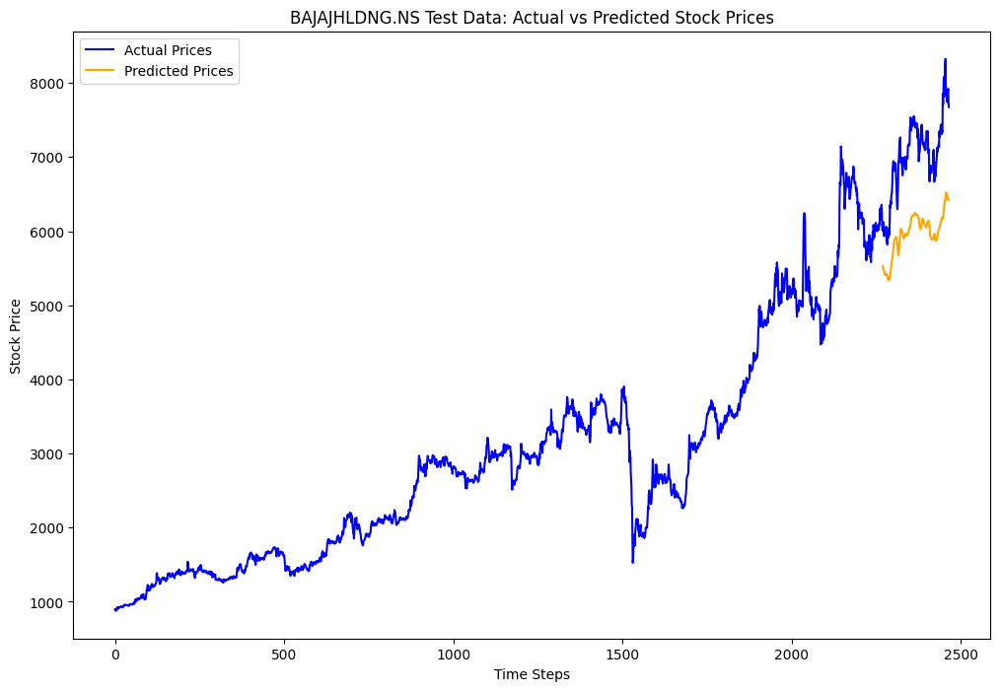

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.1061, Validation Loss: 0.0042
Epoch [2/33], Loss: 0.1332, Validation Loss: 0.0235
Epoch [3/33], Loss: 0.0532, Validation Loss: 0.0010
Epoch [4/33], Loss: 0.0369, Validation Loss: 0.0002
Epoch [5/33], Loss: 0.0266, Validation Loss: 0.0056
Epoch [6/33], Loss: 0.0083, Validation Loss: 0.0003
Epoch [7/33], Loss: 0.0073, Validation Loss: 0.0005
Epoch [8/33], Loss: 0.0118, Validation Loss: 0.0020
Epoch [9/33], Loss: 0.0125, Validation Loss: 0.0007
Epoch [10/33], Loss: 0.0080, Validation Loss: 0.0004
Epoch [11/33], Loss: 0.0053, Validation Loss: 0.0002
Epoch [12/33], Loss: 0.0055, Validation Loss: 0.0002
Epoch [13/33], Loss: 0.0049, Validation Loss: 0.0004
Epoch [14/33], Loss: 0.0040, Validation Loss: 0.0001
Epoch [15/33], Loss: 0.0044, Validation Loss: 0.0001
Epoch [16/33], Loss: 0.0031, Validation Loss: 0.0001
Epoch [17/33], Loss: 0.0027, Validation Loss: 0.0001
Epoch [18/33], Loss: 0.0024, Validation Loss: 0.0001
Epoch [19/33], Loss: 0.0022, Validation Loss: 0.0003
Ep

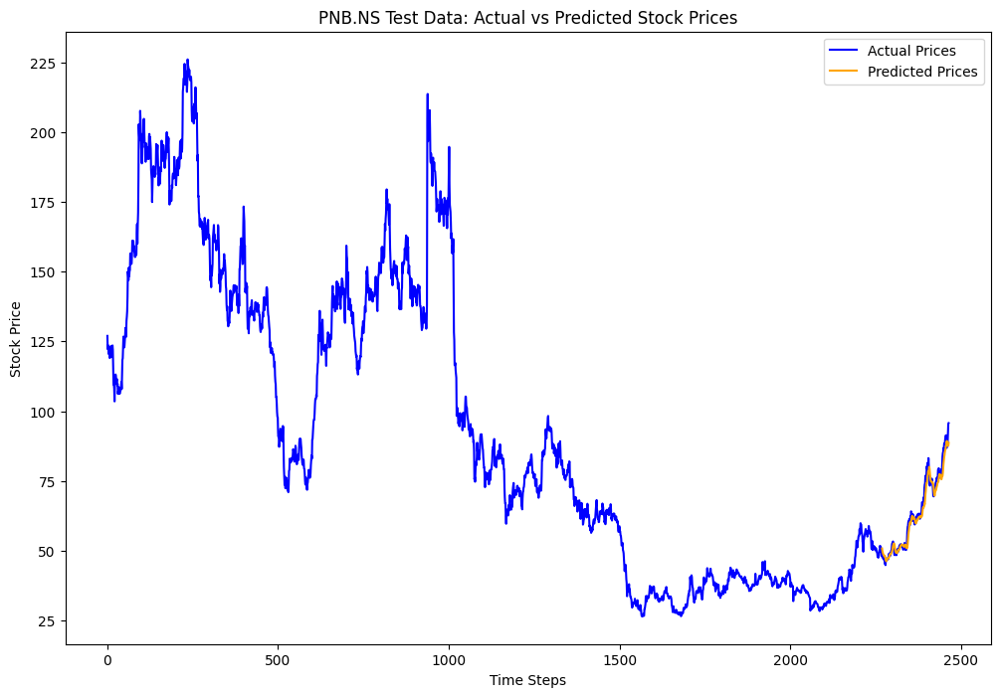

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0086, Validation Loss: 0.2334
Epoch [2/33], Loss: 0.1715, Validation Loss: 0.1785
Epoch [3/33], Loss: 0.0655, Validation Loss: 0.0914
Epoch [4/33], Loss: 0.0769, Validation Loss: 0.0902
Epoch [5/33], Loss: 0.0318, Validation Loss: 0.0261
Epoch [6/33], Loss: 0.0153, Validation Loss: 0.0281
Epoch [7/33], Loss: 0.0047, Validation Loss: 0.0009
Epoch [8/33], Loss: 0.0097, Validation Loss: 0.0152
Epoch [9/33], Loss: 0.0111, Validation Loss: 0.0939
Epoch [10/33], Loss: 0.0148, Validation Loss: 0.0017
Epoch [11/33], Loss: 0.0258, Validation Loss: 0.0956
Epoch [12/33], Loss: 0.0325, Validation Loss: 0.0230
Epoch [13/33], Loss: 0.0216, Validation Loss: 0.0204
Epoch [14/33], Loss: 0.0307, Validation Loss: 0.0267
Epoch [15/33], Loss: 0.0103, Validation Loss: 0.0008
Epoch [16/33], Loss: 0.0052, Validation Loss: 0.0009
Epoch [17/33], Loss: 0.0075, Validation Loss: 0.0015
Epoch [18/33], Loss: 0.0109, Validation Loss: 0.0063
Epoch [19/33], Loss: 0.0084, Validation Loss: 0.0005
Ep

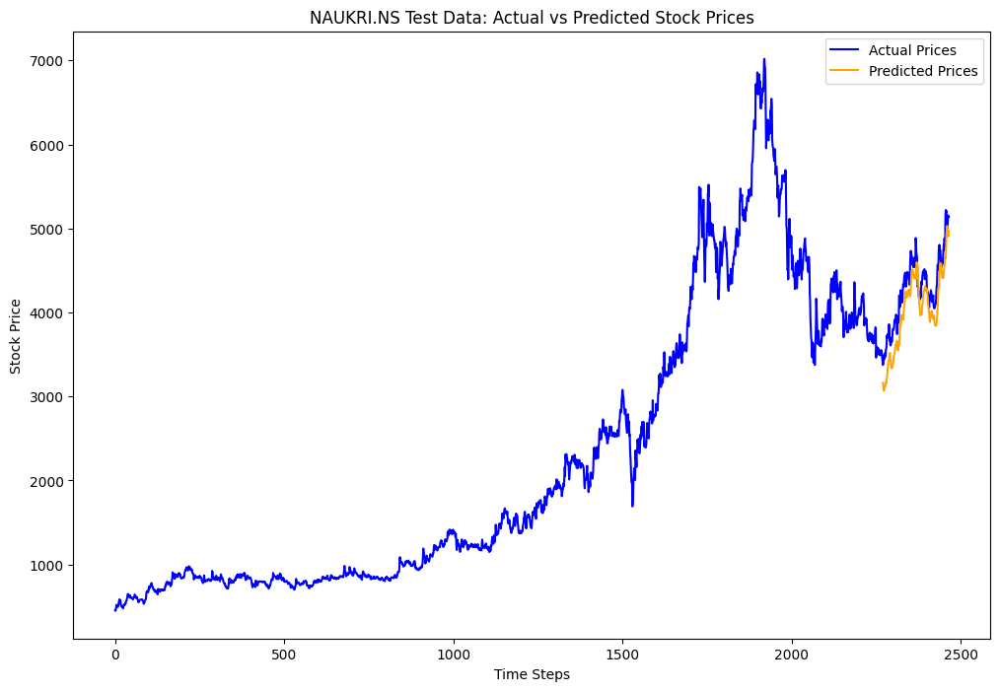

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0487, Validation Loss: 0.0300
Epoch [2/33], Loss: 0.0749, Validation Loss: 0.0211
Epoch [3/33], Loss: 0.0992, Validation Loss: 0.0056
Epoch [4/33], Loss: 0.0643, Validation Loss: 0.0043
Epoch [5/33], Loss: 0.0534, Validation Loss: 0.0036
Epoch [6/33], Loss: 0.0294, Validation Loss: 0.0114
Epoch [7/33], Loss: 0.0416, Validation Loss: 0.0035
Epoch [8/33], Loss: 0.0365, Validation Loss: 0.0012
Epoch [9/33], Loss: 0.0083, Validation Loss: 0.0007
Epoch [10/33], Loss: 0.0036, Validation Loss: 0.0011
Epoch [11/33], Loss: 0.0046, Validation Loss: 0.0021
Epoch [12/33], Loss: 0.0052, Validation Loss: 0.0034
Epoch [13/33], Loss: 0.0058, Validation Loss: 0.0027
Epoch [14/33], Loss: 0.0055, Validation Loss: 0.0030
Epoch [15/33], Loss: 0.0056, Validation Loss: 0.0032
Epoch [16/33], Loss: 0.0052, Validation Loss: 0.0027
Epoch [17/33], Loss: 0.0050, Validation Loss: 0.0024
Epoch [18/33], Loss: 0.0049, Validation Loss: 0.0023
Epoch [19/33], Loss: 0.0043, Validation Loss: 0.0022
Ep

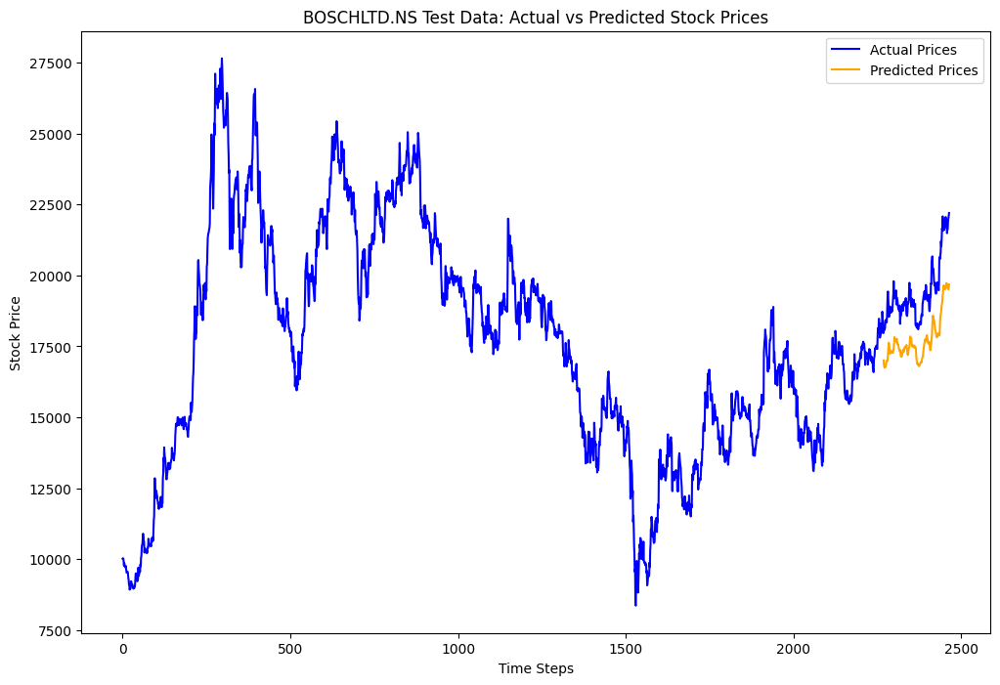

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0993, Validation Loss: 0.1368
Epoch [2/33], Loss: 0.0829, Validation Loss: 0.1013
Epoch [3/33], Loss: 0.0604, Validation Loss: 0.0224
Epoch [4/33], Loss: 0.0269, Validation Loss: 0.0011
Epoch [5/33], Loss: 0.0206, Validation Loss: 0.0006
Epoch [6/33], Loss: 0.0105, Validation Loss: 0.0023
Epoch [7/33], Loss: 0.0062, Validation Loss: 0.0020
Epoch [8/33], Loss: 0.0058, Validation Loss: 0.0018
Epoch [9/33], Loss: 0.0029, Validation Loss: 0.0054
Epoch [10/33], Loss: 0.0041, Validation Loss: 0.0019
Epoch [11/33], Loss: 0.0027, Validation Loss: 0.0007
Epoch [12/33], Loss: 0.0018, Validation Loss: 0.0005
Epoch [13/33], Loss: 0.0019, Validation Loss: 0.0008
Epoch [14/33], Loss: 0.0018, Validation Loss: 0.0011
Epoch [15/33], Loss: 0.0018, Validation Loss: 0.0014
Epoch [16/33], Loss: 0.0019, Validation Loss: 0.0008
Epoch [17/33], Loss: 0.0021, Validation Loss: 0.0020
Epoch [18/33], Loss: 0.0021, Validation Loss: 0.0028
Epoch [19/33], Loss: 0.0020, Validation Loss: 0.0017
Ep

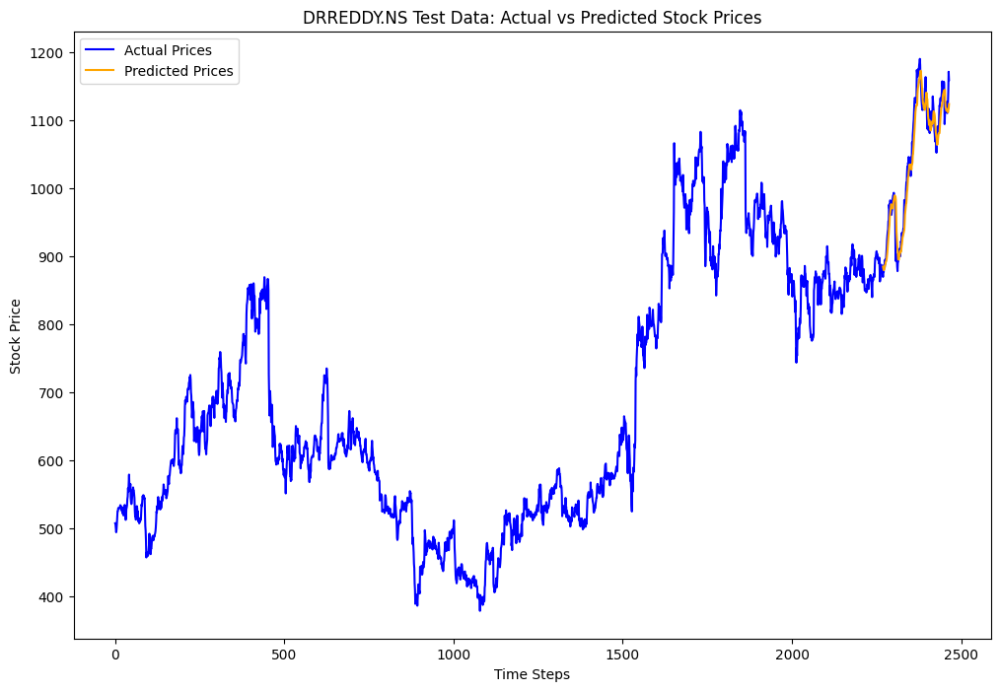

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0572, Validation Loss: 0.0143
Epoch [2/33], Loss: 0.0439, Validation Loss: 0.0076
Epoch [3/33], Loss: 0.0313, Validation Loss: 0.0010
Epoch [4/33], Loss: 0.0301, Validation Loss: 0.0017
Epoch [5/33], Loss: 0.0117, Validation Loss: 0.0025
Epoch [6/33], Loss: 0.0050, Validation Loss: 0.0008
Epoch [7/33], Loss: 0.0035, Validation Loss: 0.0007
Epoch [8/33], Loss: 0.0030, Validation Loss: 0.0022
Epoch [9/33], Loss: 0.0032, Validation Loss: 0.0023
Epoch [10/33], Loss: 0.0049, Validation Loss: 0.0005
Epoch [11/33], Loss: 0.0041, Validation Loss: 0.0007
Epoch [12/33], Loss: 0.0025, Validation Loss: 0.0021
Epoch [13/33], Loss: 0.0028, Validation Loss: 0.0018
Epoch [14/33], Loss: 0.0044, Validation Loss: 0.0007
Epoch [15/33], Loss: 0.0041, Validation Loss: 0.0004
Epoch [16/33], Loss: 0.0034, Validation Loss: 0.0006
Epoch [17/33], Loss: 0.0022, Validation Loss: 0.0013
Epoch [18/33], Loss: 0.0018, Validation Loss: 0.0013
Epoch [19/33], Loss: 0.0028, Validation Loss: 0.0028
Ep

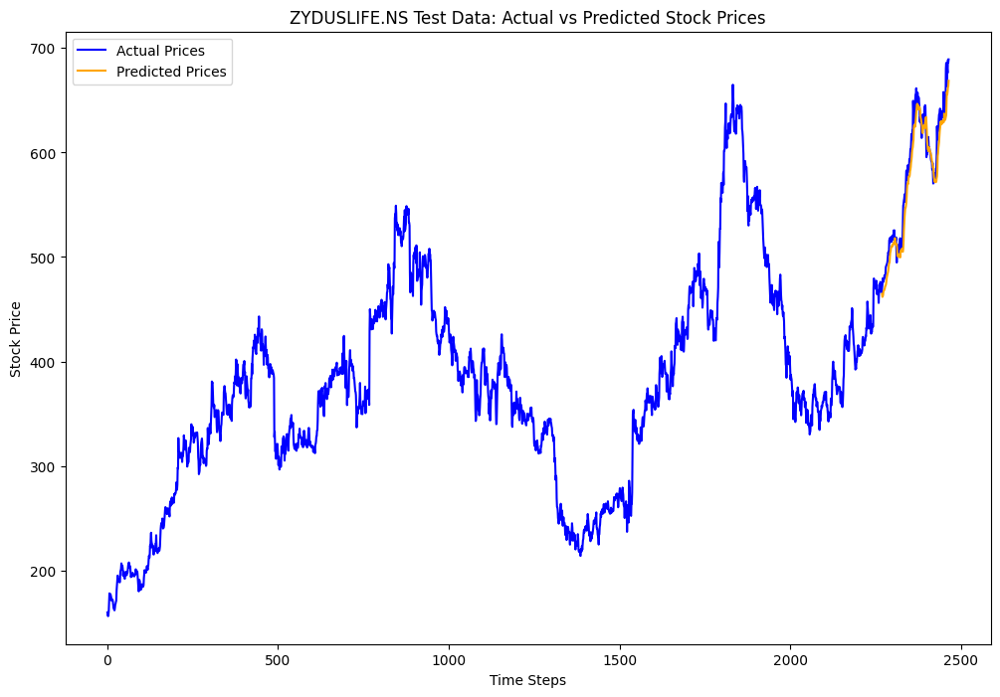

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0683, Validation Loss: 0.0024
Epoch [2/33], Loss: 0.1109, Validation Loss: 0.0331
Epoch [3/33], Loss: 0.0819, Validation Loss: 0.0222
Epoch [4/33], Loss: 0.0755, Validation Loss: 0.0022
Epoch [5/33], Loss: 0.0319, Validation Loss: 0.0010
Epoch [6/33], Loss: 0.0327, Validation Loss: 0.0003
Epoch [7/33], Loss: 0.0094, Validation Loss: 0.0003
Epoch [8/33], Loss: 0.0086, Validation Loss: 0.0003
Epoch [9/33], Loss: 0.0040, Validation Loss: 0.0003
Epoch [10/33], Loss: 0.0046, Validation Loss: 0.0003
Epoch [11/33], Loss: 0.0048, Validation Loss: 0.0005
Epoch [12/33], Loss: 0.0057, Validation Loss: 0.0005
Epoch [13/33], Loss: 0.0062, Validation Loss: 0.0003
Epoch [14/33], Loss: 0.0058, Validation Loss: 0.0005
Epoch [15/33], Loss: 0.0070, Validation Loss: 0.0005
Epoch [16/33], Loss: 0.0075, Validation Loss: 0.0004
Epoch [17/33], Loss: 0.0054, Validation Loss: 0.0003
Epoch [18/33], Loss: 0.0044, Validation Loss: 0.0002
Epoch [19/33], Loss: 0.0041, Validation Loss: 0.0002
Ep

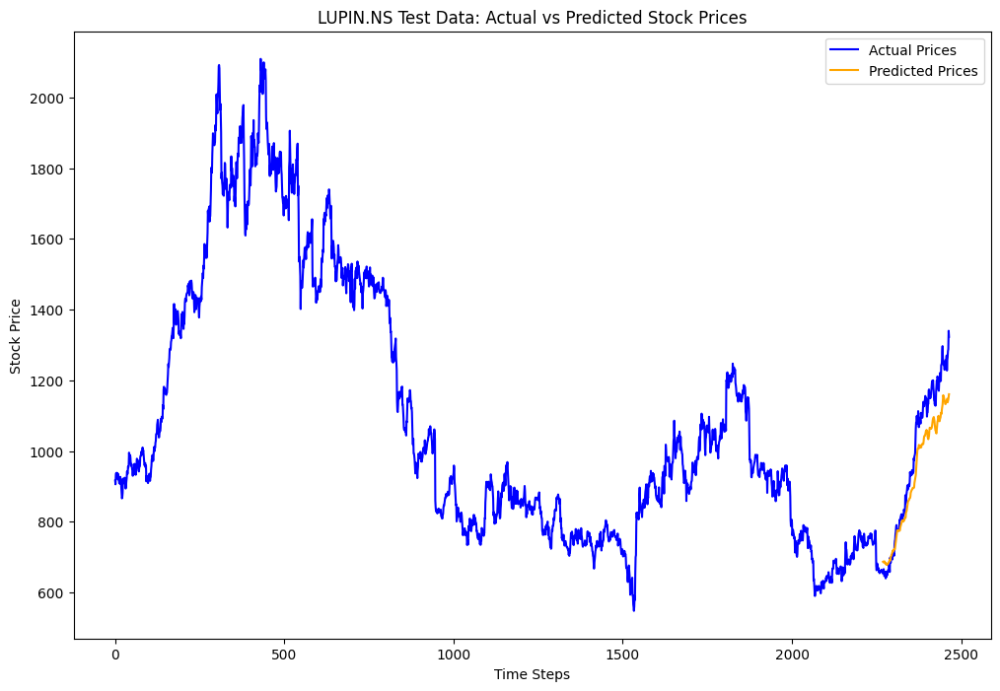

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0131, Validation Loss: 0.0295
Epoch [2/33], Loss: 0.1156, Validation Loss: 0.3390
Epoch [3/33], Loss: 0.0472, Validation Loss: 0.2323
Epoch [4/33], Loss: 0.0561, Validation Loss: 0.2312
Epoch [5/33], Loss: 0.0398, Validation Loss: 0.0633
Epoch [6/33], Loss: 0.0154, Validation Loss: 0.0361
Epoch [7/33], Loss: 0.0115, Validation Loss: 0.0286
Epoch [8/33], Loss: 0.0339, Validation Loss: 0.1210
Epoch [9/33], Loss: 0.0106, Validation Loss: 0.0007
Epoch [10/33], Loss: 0.0045, Validation Loss: 0.0096
Epoch [11/33], Loss: 0.0132, Validation Loss: 0.0272
Epoch [12/33], Loss: 0.0121, Validation Loss: 0.0023
Epoch [13/33], Loss: 0.0128, Validation Loss: 0.0267
Epoch [14/33], Loss: 0.0091, Validation Loss: 0.0013
Epoch [15/33], Loss: 0.0108, Validation Loss: 0.0192
Epoch [16/33], Loss: 0.0090, Validation Loss: 0.0025
Epoch [17/33], Loss: 0.0143, Validation Loss: 0.0447
Epoch [18/33], Loss: 0.0079, Validation Loss: 0.0003
Epoch [19/33], Loss: 0.0031, Validation Loss: 0.0030
Ep

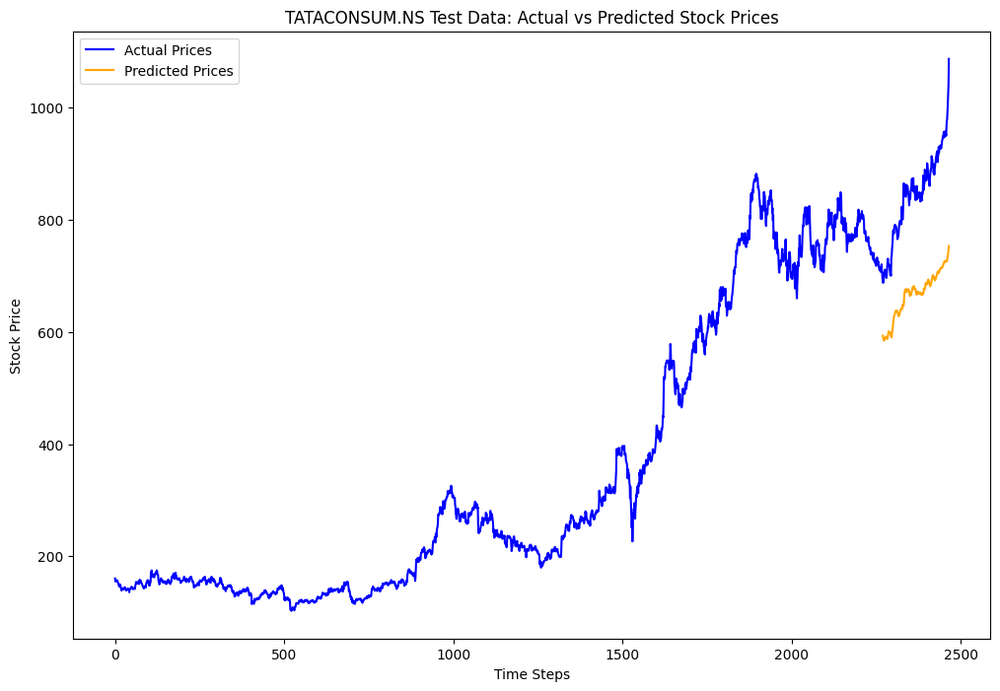

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0082, Validation Loss: 0.0058
Epoch [2/33], Loss: 0.1457, Validation Loss: 0.0745
Epoch [3/33], Loss: 0.0974, Validation Loss: 0.1017
Epoch [4/33], Loss: 0.0634, Validation Loss: 0.0134
Epoch [5/33], Loss: 0.0371, Validation Loss: 0.0009
Epoch [6/33], Loss: 0.0194, Validation Loss: 0.0020
Epoch [7/33], Loss: 0.0054, Validation Loss: 0.0055
Epoch [8/33], Loss: 0.0080, Validation Loss: 0.0054
Epoch [9/33], Loss: 0.0042, Validation Loss: 0.0076
Epoch [10/33], Loss: 0.0194, Validation Loss: 0.0005
Epoch [11/33], Loss: 0.0067, Validation Loss: 0.0045
Epoch [12/33], Loss: 0.0064, Validation Loss: 0.0009
Epoch [13/33], Loss: 0.0151, Validation Loss: 0.0029
Epoch [14/33], Loss: 0.0050, Validation Loss: 0.0004
Epoch [15/33], Loss: 0.0019, Validation Loss: 0.0004
Epoch [16/33], Loss: 0.0024, Validation Loss: 0.0009
Epoch [17/33], Loss: 0.0026, Validation Loss: 0.0005
Epoch [18/33], Loss: 0.0024, Validation Loss: 0.0044
Epoch [19/33], Loss: 0.0030, Validation Loss: 0.0011
Ep

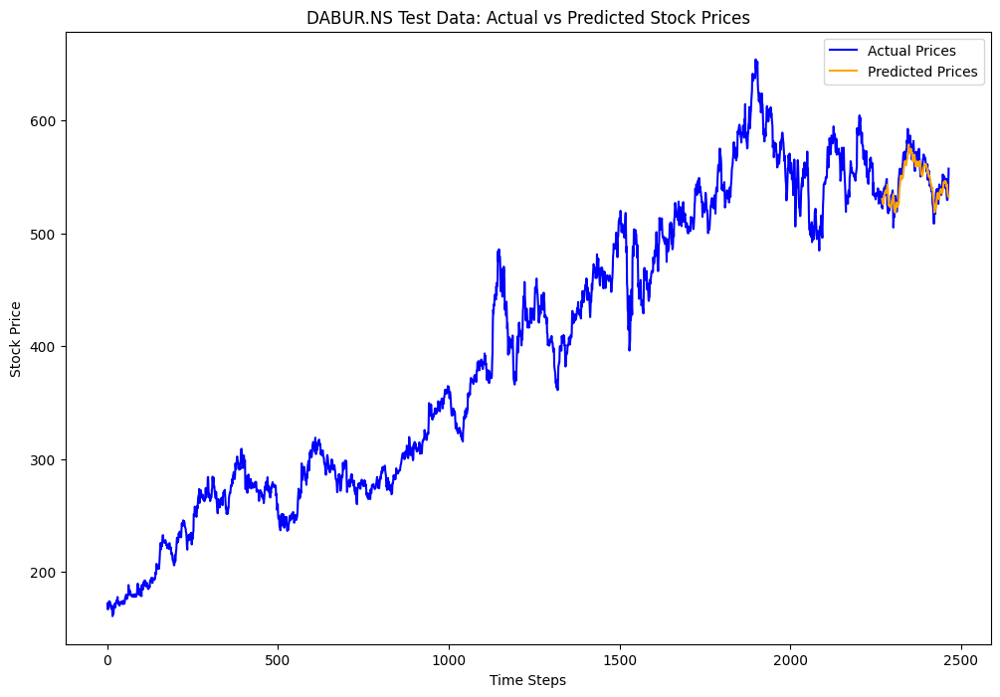

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0307, Validation Loss: 0.0287
Epoch [2/33], Loss: 0.2054, Validation Loss: 0.0252
Epoch [3/33], Loss: 0.0511, Validation Loss: 0.1164
Epoch [4/33], Loss: 0.1498, Validation Loss: 0.0076
Epoch [5/33], Loss: 0.0410, Validation Loss: 0.0626
Epoch [6/33], Loss: 0.0493, Validation Loss: 0.0019
Epoch [7/33], Loss: 0.0056, Validation Loss: 0.0073
Epoch [8/33], Loss: 0.0079, Validation Loss: 0.0042
Epoch [9/33], Loss: 0.0055, Validation Loss: 0.0031
Epoch [10/33], Loss: 0.0092, Validation Loss: 0.0007
Epoch [11/33], Loss: 0.0038, Validation Loss: 0.0004
Epoch [12/33], Loss: 0.0045, Validation Loss: 0.0017
Epoch [13/33], Loss: 0.0042, Validation Loss: 0.0020
Epoch [14/33], Loss: 0.0038, Validation Loss: 0.0021
Epoch [15/33], Loss: 0.0034, Validation Loss: 0.0010
Epoch [16/33], Loss: 0.0036, Validation Loss: 0.0012
Epoch [17/33], Loss: 0.0032, Validation Loss: 0.0004
Epoch [18/33], Loss: 0.0037, Validation Loss: 0.0019
Epoch [19/33], Loss: 0.0043, Validation Loss: 0.0005
Ep

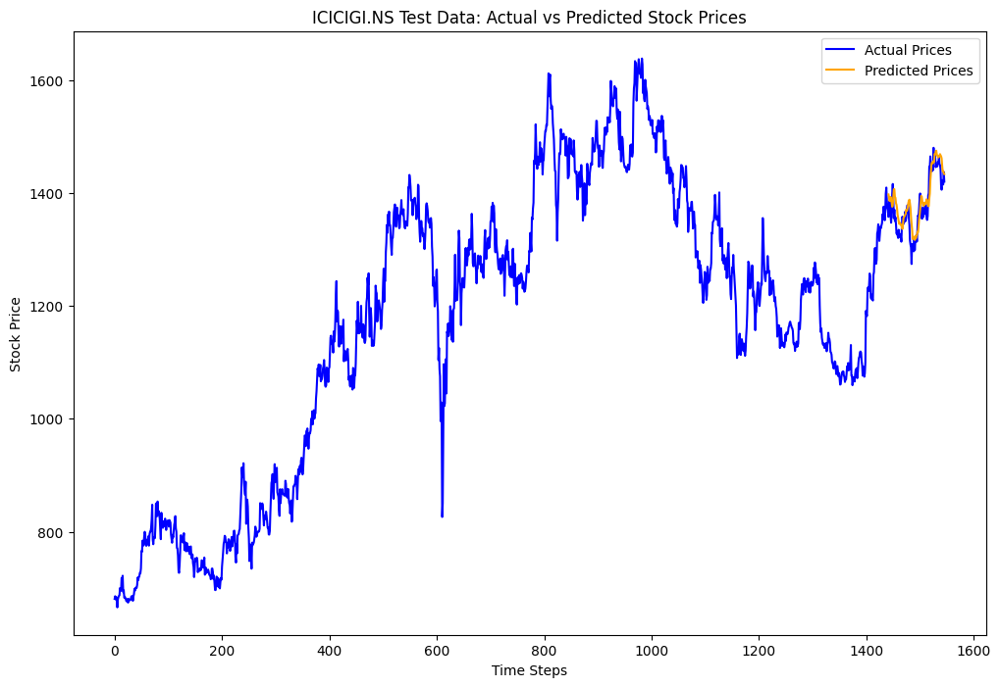

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0236, Validation Loss: 0.1642
Epoch [2/33], Loss: 0.1619, Validation Loss: 0.0471
Epoch [3/33], Loss: 0.0446, Validation Loss: 0.0049
Epoch [4/33], Loss: 0.0700, Validation Loss: 0.0024
Epoch [5/33], Loss: 0.0299, Validation Loss: 0.0042
Epoch [6/33], Loss: 0.0133, Validation Loss: 0.0106
Epoch [7/33], Loss: 0.0075, Validation Loss: 0.0006
Epoch [8/33], Loss: 0.0029, Validation Loss: 0.0006
Epoch [9/33], Loss: 0.0023, Validation Loss: 0.0027
Epoch [10/33], Loss: 0.0039, Validation Loss: 0.0044
Epoch [11/33], Loss: 0.0036, Validation Loss: 0.0075
Epoch [12/33], Loss: 0.0107, Validation Loss: 0.0107
Epoch [13/33], Loss: 0.0038, Validation Loss: 0.0037
Epoch [14/33], Loss: 0.0093, Validation Loss: 0.0132
Epoch [15/33], Loss: 0.0030, Validation Loss: 0.0016
Epoch [16/33], Loss: 0.0063, Validation Loss: 0.0045
Epoch [17/33], Loss: 0.0027, Validation Loss: 0.0019
Epoch [18/33], Loss: 0.0046, Validation Loss: 0.0087
Epoch [19/33], Loss: 0.0031, Validation Loss: 0.0024
Ep

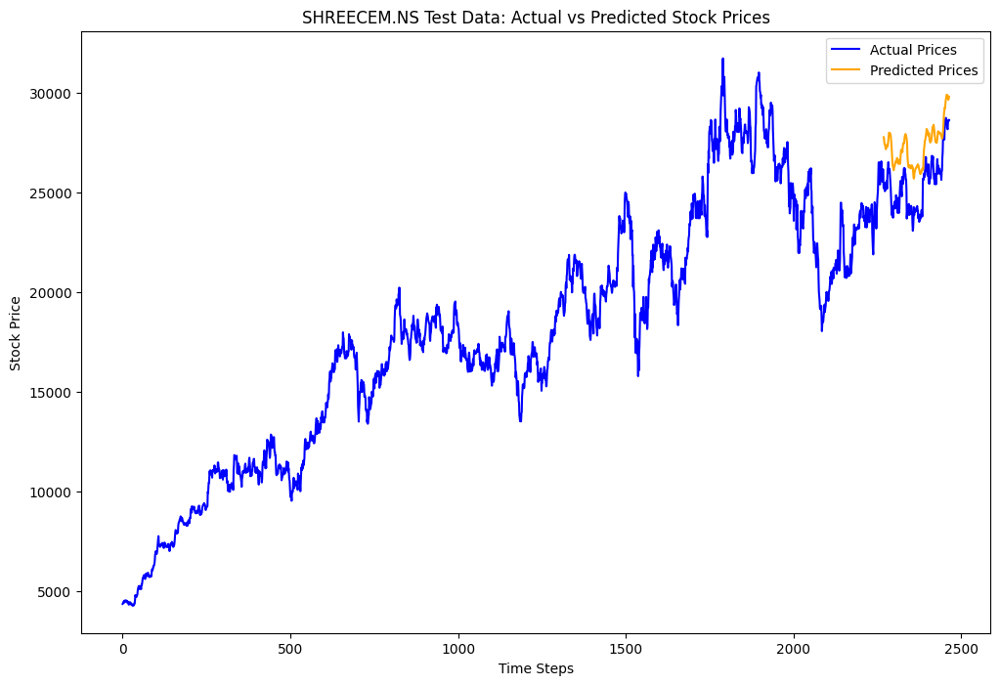

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0330, Validation Loss: 0.1024
Epoch [2/33], Loss: 0.0428, Validation Loss: 0.1913
Epoch [3/33], Loss: 0.0272, Validation Loss: 0.1524
Epoch [4/33], Loss: 0.0265, Validation Loss: 0.1202
Epoch [5/33], Loss: 0.0109, Validation Loss: 0.0300
Epoch [6/33], Loss: 0.0056, Validation Loss: 0.0074
Epoch [7/33], Loss: 0.0073, Validation Loss: 0.0039
Epoch [8/33], Loss: 0.0048, Validation Loss: 0.0192
Epoch [9/33], Loss: 0.0058, Validation Loss: 0.0107
Epoch [10/33], Loss: 0.0042, Validation Loss: 0.0082
Epoch [11/33], Loss: 0.0051, Validation Loss: 0.0137
Epoch [12/33], Loss: 0.0045, Validation Loss: 0.0066
Epoch [13/33], Loss: 0.0040, Validation Loss: 0.0105
Epoch [14/33], Loss: 0.0034, Validation Loss: 0.0047
Epoch [15/33], Loss: 0.0041, Validation Loss: 0.0106
Epoch [16/33], Loss: 0.0037, Validation Loss: 0.0045
Epoch [17/33], Loss: 0.0040, Validation Loss: 0.0128
Epoch [18/33], Loss: 0.0035, Validation Loss: 0.0035
Epoch [19/33], Loss: 0.0028, Validation Loss: 0.0075
Ep

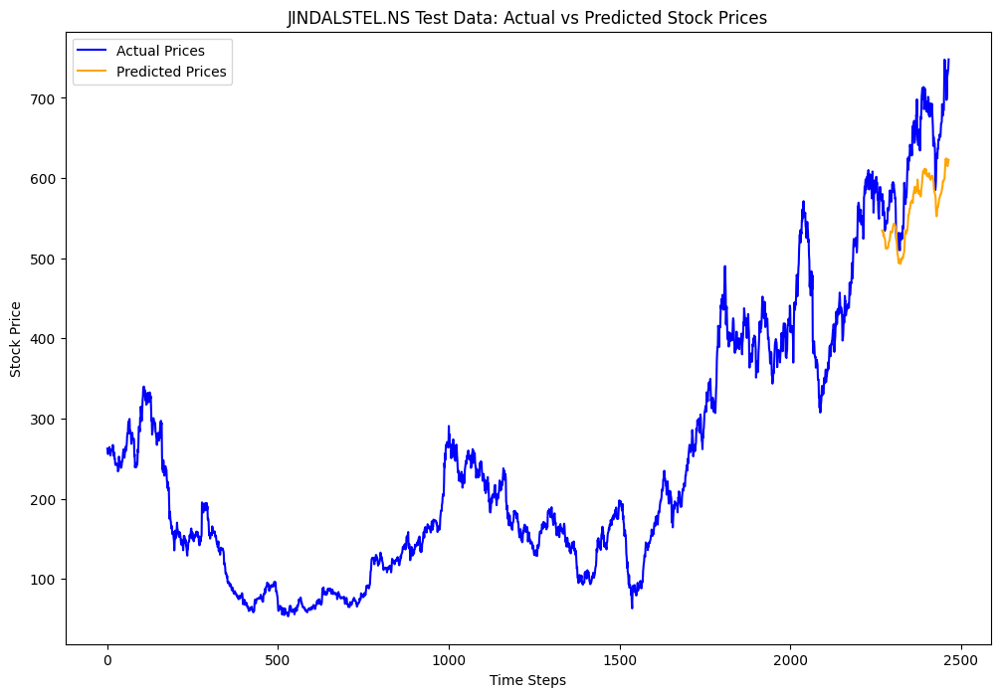

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0820, Validation Loss: 0.0050
Epoch [2/33], Loss: 0.1295, Validation Loss: 0.0203
Epoch [3/33], Loss: 0.0853, Validation Loss: 0.0084
Epoch [4/33], Loss: 0.0380, Validation Loss: 0.0011
Epoch [5/33], Loss: 0.0128, Validation Loss: 0.0013
Epoch [6/33], Loss: 0.0121, Validation Loss: 0.0004
Epoch [7/33], Loss: 0.0097, Validation Loss: 0.0002
Epoch [8/33], Loss: 0.0048, Validation Loss: 0.0003
Epoch [9/33], Loss: 0.0024, Validation Loss: 0.0008
Epoch [10/33], Loss: 0.0028, Validation Loss: 0.0004
Epoch [11/33], Loss: 0.0032, Validation Loss: 0.0004
Epoch [12/33], Loss: 0.0029, Validation Loss: 0.0008
Epoch [13/33], Loss: 0.0032, Validation Loss: 0.0019
Epoch [14/33], Loss: 0.0036, Validation Loss: 0.0020
Epoch [15/33], Loss: 0.0036, Validation Loss: 0.0025
Epoch [16/33], Loss: 0.0036, Validation Loss: 0.0033
Epoch [17/33], Loss: 0.0033, Validation Loss: 0.0018
Epoch [18/33], Loss: 0.0026, Validation Loss: 0.0011
Epoch [19/33], Loss: 0.0025, Validation Loss: 0.0003
Ep

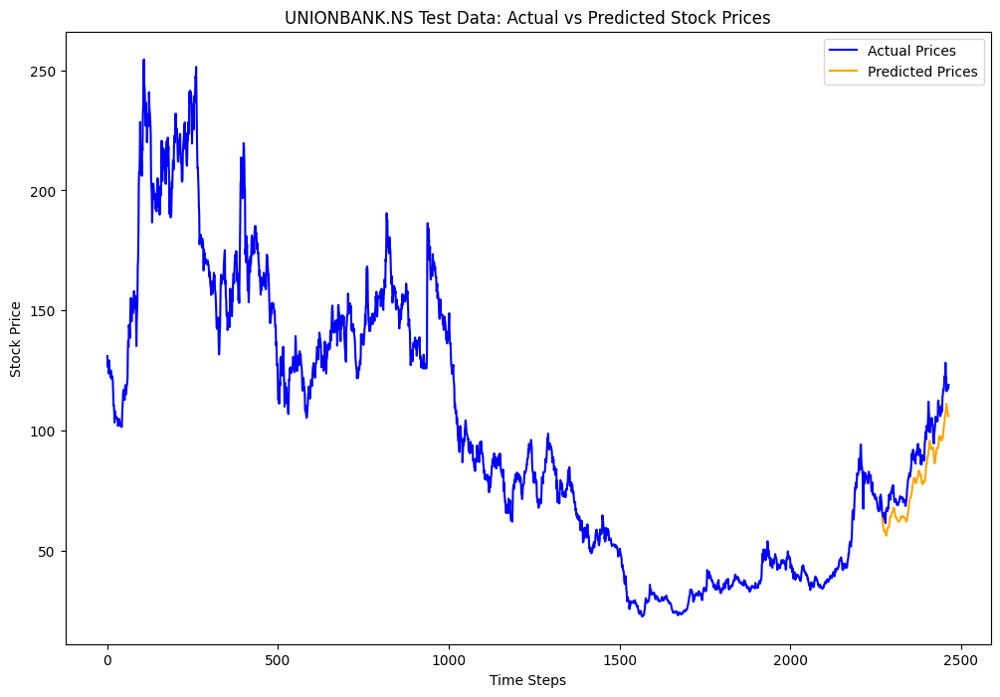

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.1085, Validation Loss: 0.0878
Epoch [2/33], Loss: 0.1062, Validation Loss: 0.0441
Epoch [3/33], Loss: 0.0944, Validation Loss: 0.0134
Epoch [4/33], Loss: 0.0385, Validation Loss: 0.0312
Epoch [5/33], Loss: 0.0229, Validation Loss: 0.0079
Epoch [6/33], Loss: 0.0130, Validation Loss: 0.0030
Epoch [7/33], Loss: 0.0074, Validation Loss: 0.0032
Epoch [8/33], Loss: 0.0039, Validation Loss: 0.0011
Epoch [9/33], Loss: 0.0026, Validation Loss: 0.0005
Epoch [10/33], Loss: 0.0021, Validation Loss: 0.0004
Epoch [11/33], Loss: 0.0022, Validation Loss: 0.0004
Epoch [12/33], Loss: 0.0023, Validation Loss: 0.0008
Epoch [13/33], Loss: 0.0026, Validation Loss: 0.0005
Epoch [14/33], Loss: 0.0030, Validation Loss: 0.0031
Epoch [15/33], Loss: 0.0039, Validation Loss: 0.0010
Epoch [16/33], Loss: 0.0062, Validation Loss: 0.0116
Epoch [17/33], Loss: 0.0105, Validation Loss: 0.0004
Epoch [18/33], Loss: 0.0025, Validation Loss: 0.0008
Epoch [19/33], Loss: 0.0020, Validation Loss: 0.0005
Ep

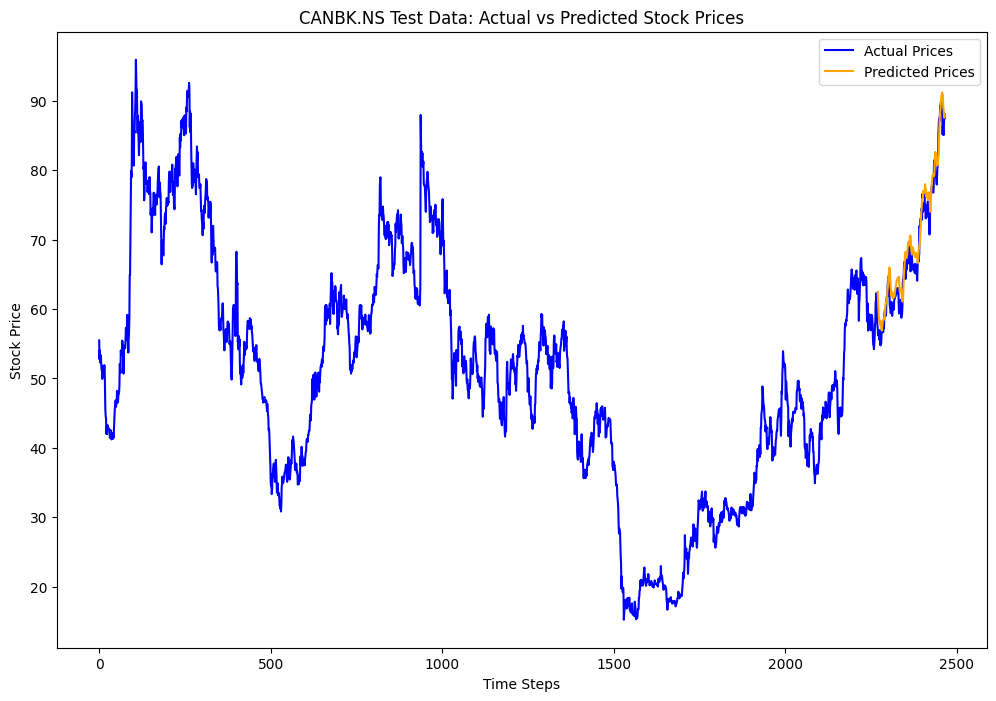

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0758, Validation Loss: 0.0726
Epoch [2/33], Loss: 0.0566, Validation Loss: 0.0621
Epoch [3/33], Loss: 0.0598, Validation Loss: 0.0299
Epoch [4/33], Loss: 0.0407, Validation Loss: 0.0315
Epoch [5/33], Loss: 0.0302, Validation Loss: 0.0360
Epoch [6/33], Loss: 0.0164, Validation Loss: 0.0092
Epoch [7/33], Loss: 0.0094, Validation Loss: 0.0055
Epoch [8/33], Loss: 0.0061, Validation Loss: 0.0026
Epoch [9/33], Loss: 0.0033, Validation Loss: 0.0010
Epoch [10/33], Loss: 0.0020, Validation Loss: 0.0012
Epoch [11/33], Loss: 0.0016, Validation Loss: 0.0010
Epoch [12/33], Loss: 0.0018, Validation Loss: 0.0013
Epoch [13/33], Loss: 0.0015, Validation Loss: 0.0011
Epoch [14/33], Loss: 0.0017, Validation Loss: 0.0010
Epoch [15/33], Loss: 0.0017, Validation Loss: 0.0010
Epoch [16/33], Loss: 0.0020, Validation Loss: 0.0010
Epoch [17/33], Loss: 0.0018, Validation Loss: 0.0012
Epoch [18/33], Loss: 0.0023, Validation Loss: 0.0012
Epoch [19/33], Loss: 0.0026, Validation Loss: 0.0013
Ep

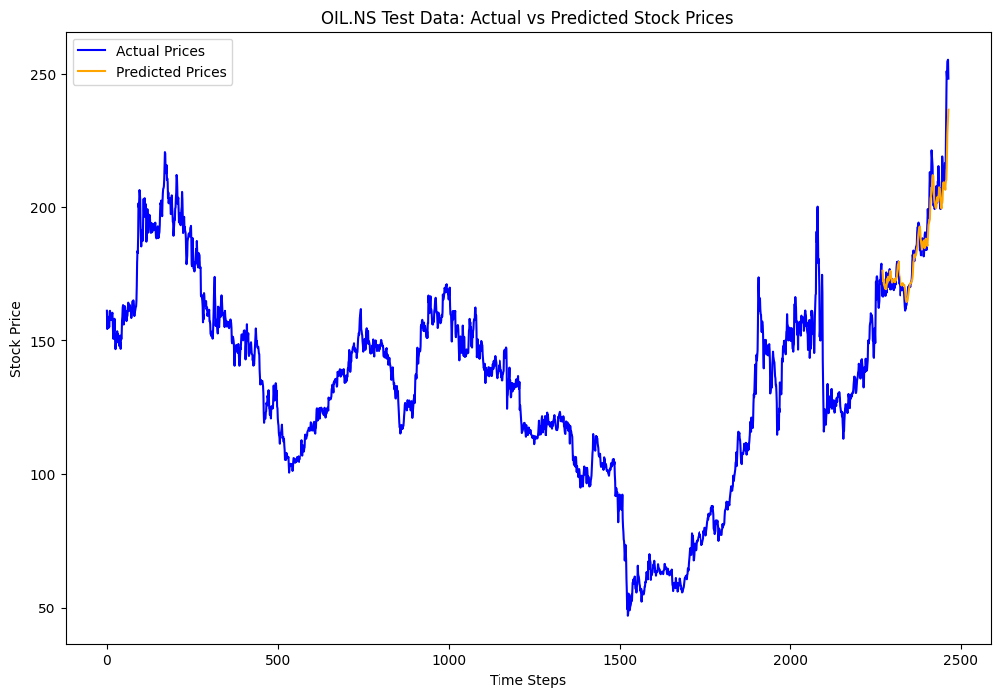

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0262, Validation Loss: 0.0386
Epoch [2/33], Loss: 0.1187, Validation Loss: 0.0060
Epoch [3/33], Loss: 0.1035, Validation Loss: 0.0108
Epoch [4/33], Loss: 0.0763, Validation Loss: 0.0134
Epoch [5/33], Loss: 0.0629, Validation Loss: 0.0044
Epoch [6/33], Loss: 0.0221, Validation Loss: 0.0011
Epoch [7/33], Loss: 0.0126, Validation Loss: 0.0006
Epoch [8/33], Loss: 0.0054, Validation Loss: 0.0010
Epoch [9/33], Loss: 0.0048, Validation Loss: 0.0008
Epoch [10/33], Loss: 0.0036, Validation Loss: 0.0014
Epoch [11/33], Loss: 0.0040, Validation Loss: 0.0014
Epoch [12/33], Loss: 0.0042, Validation Loss: 0.0014
Epoch [13/33], Loss: 0.0042, Validation Loss: 0.0016
Epoch [14/33], Loss: 0.0050, Validation Loss: 0.0018
Epoch [15/33], Loss: 0.0063, Validation Loss: 0.0022
Epoch [16/33], Loss: 0.0078, Validation Loss: 0.0019
Epoch [17/33], Loss: 0.0082, Validation Loss: 0.0015
Epoch [18/33], Loss: 0.0084, Validation Loss: 0.0014
Epoch [19/33], Loss: 0.0070, Validation Loss: 0.0013
Ep

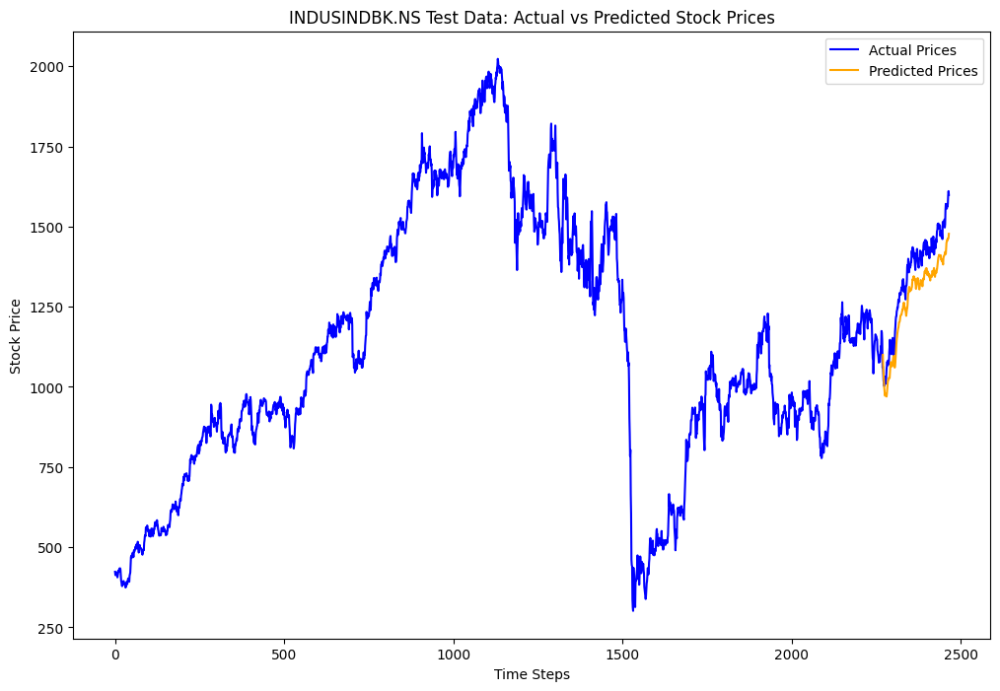

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0675, Validation Loss: 0.0546
Epoch [2/33], Loss: 0.0892, Validation Loss: 0.0171
Epoch [3/33], Loss: 0.0650, Validation Loss: 0.0119
Epoch [4/33], Loss: 0.0595, Validation Loss: 0.0074
Epoch [5/33], Loss: 0.0230, Validation Loss: 0.0196
Epoch [6/33], Loss: 0.0305, Validation Loss: 0.0059
Epoch [7/33], Loss: 0.0045, Validation Loss: 0.0020
Epoch [8/33], Loss: 0.0022, Validation Loss: 0.0015
Epoch [9/33], Loss: 0.0018, Validation Loss: 0.0016
Epoch [10/33], Loss: 0.0025, Validation Loss: 0.0028
Epoch [11/33], Loss: 0.0030, Validation Loss: 0.0028
Epoch [12/33], Loss: 0.0030, Validation Loss: 0.0033
Epoch [13/33], Loss: 0.0032, Validation Loss: 0.0043
Epoch [14/33], Loss: 0.0035, Validation Loss: 0.0030
Epoch [15/33], Loss: 0.0026, Validation Loss: 0.0023
Epoch [16/33], Loss: 0.0024, Validation Loss: 0.0027
Epoch [17/33], Loss: 0.0030, Validation Loss: 0.0043
Epoch [18/33], Loss: 0.0042, Validation Loss: 0.0031
Epoch [19/33], Loss: 0.0032, Validation Loss: 0.0037
Ep

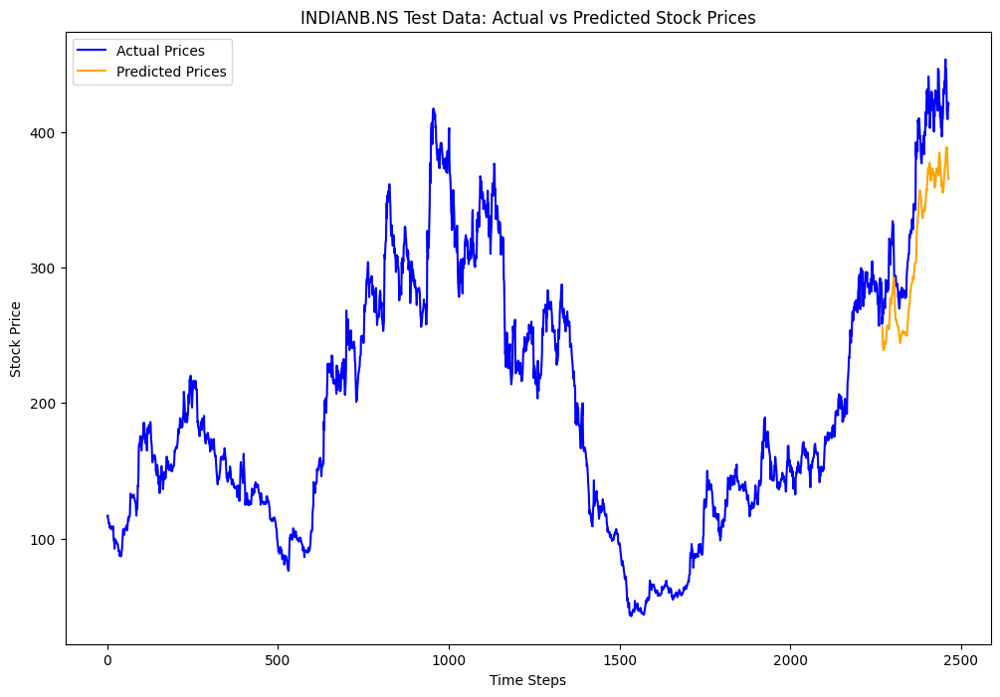

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0466, Validation Loss: 0.1171
Epoch [2/33], Loss: 0.0467, Validation Loss: 0.0718
Epoch [3/33], Loss: 0.0353, Validation Loss: 0.0373
Epoch [4/33], Loss: 0.0212, Validation Loss: 0.0144
Epoch [5/33], Loss: 0.0208, Validation Loss: 0.0132
Epoch [6/33], Loss: 0.0063, Validation Loss: 0.0004
Epoch [7/33], Loss: 0.0029, Validation Loss: 0.0004
Epoch [8/33], Loss: 0.0023, Validation Loss: 0.0004
Epoch [9/33], Loss: 0.0024, Validation Loss: 0.0005
Epoch [10/33], Loss: 0.0024, Validation Loss: 0.0003
Epoch [11/33], Loss: 0.0025, Validation Loss: 0.0008
Epoch [12/33], Loss: 0.0023, Validation Loss: 0.0007
Epoch [13/33], Loss: 0.0021, Validation Loss: 0.0005
Epoch [14/33], Loss: 0.0021, Validation Loss: 0.0004
Epoch [15/33], Loss: 0.0021, Validation Loss: 0.0005
Epoch [16/33], Loss: 0.0021, Validation Loss: 0.0005
Epoch [17/33], Loss: 0.0024, Validation Loss: 0.0004
Epoch [18/33], Loss: 0.0041, Validation Loss: 0.0052
Epoch [19/33], Loss: 0.0046, Validation Loss: 0.0086
Ep

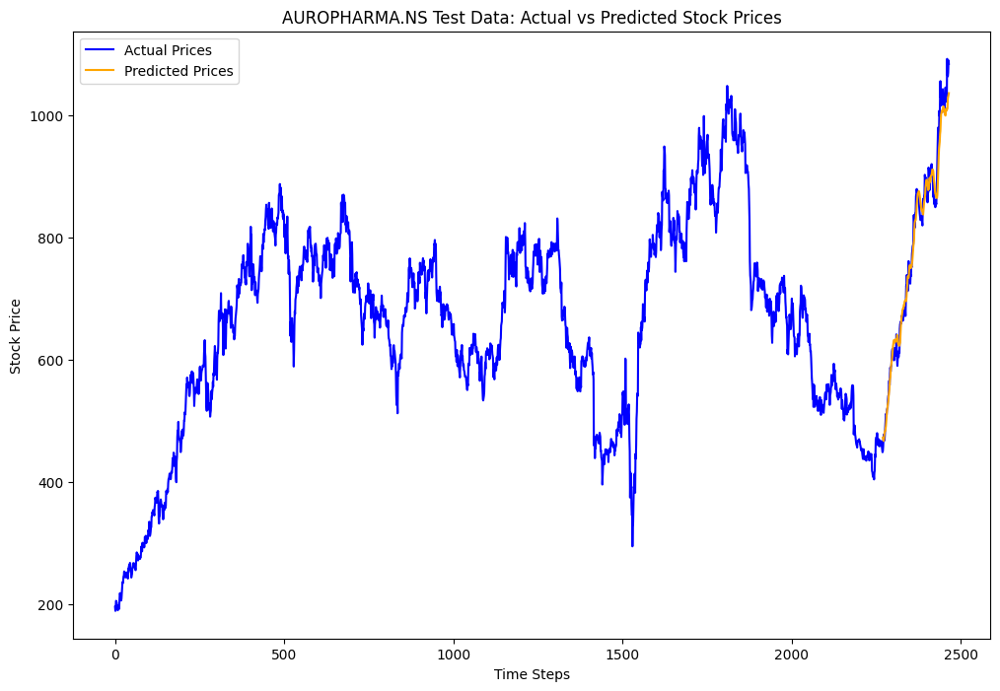

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0130, Validation Loss: 0.0876
Epoch [2/33], Loss: 0.0275, Validation Loss: 0.0893
Epoch [3/33], Loss: 0.0267, Validation Loss: 0.1139
Epoch [4/33], Loss: 0.0226, Validation Loss: 0.1115
Epoch [5/33], Loss: 0.0183, Validation Loss: 0.0757
Epoch [6/33], Loss: 0.0122, Validation Loss: 0.1071
Epoch [7/33], Loss: 0.0230, Validation Loss: 0.0024
Epoch [8/33], Loss: 0.0137, Validation Loss: 0.0139
Epoch [9/33], Loss: 0.0119, Validation Loss: 0.0134
Epoch [10/33], Loss: 0.0157, Validation Loss: 0.0769
Epoch [11/33], Loss: 0.0081, Validation Loss: 0.0067
Epoch [12/33], Loss: 0.0046, Validation Loss: 0.0019
Epoch [13/33], Loss: 0.0037, Validation Loss: 0.0176
Epoch [14/33], Loss: 0.0040, Validation Loss: 0.0012
Epoch [15/33], Loss: 0.0013, Validation Loss: 0.0028
Epoch [16/33], Loss: 0.0012, Validation Loss: 0.0008
Epoch [17/33], Loss: 0.0009, Validation Loss: 0.0032
Epoch [18/33], Loss: 0.0009, Validation Loss: 0.0008
Epoch [19/33], Loss: 0.0006, Validation Loss: 0.0011
Ep

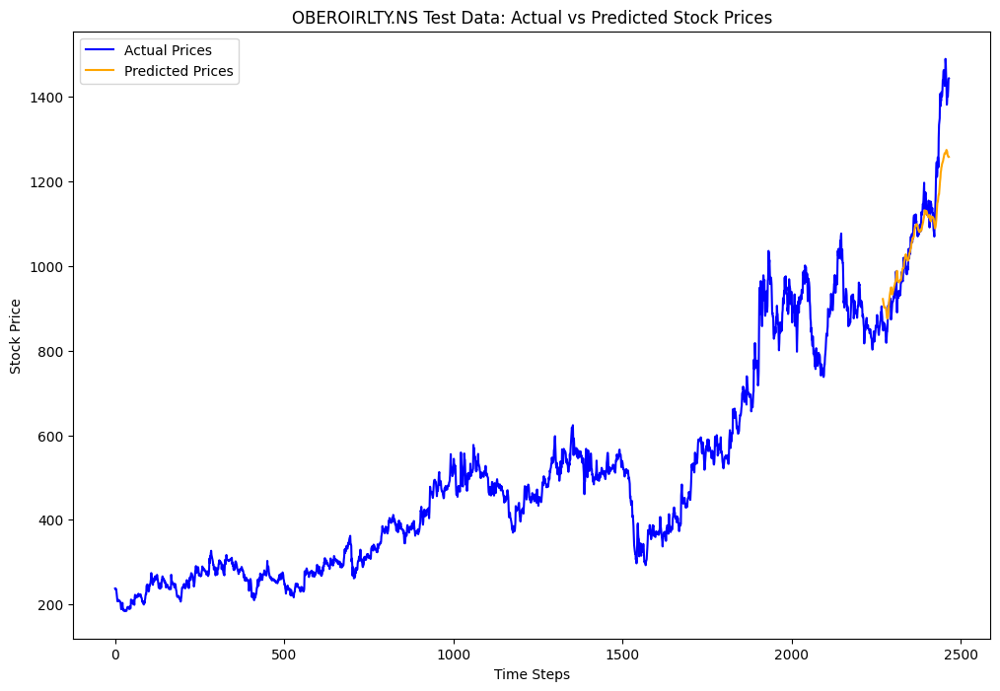

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.1190, Validation Loss: 0.0045
Epoch [2/33], Loss: 0.0900, Validation Loss: 0.0053
Epoch [3/33], Loss: 0.0723, Validation Loss: 0.0082
Epoch [4/33], Loss: 0.0556, Validation Loss: 0.0030
Epoch [5/33], Loss: 0.0323, Validation Loss: 0.0008
Epoch [6/33], Loss: 0.0042, Validation Loss: 0.0035
Epoch [7/33], Loss: 0.0131, Validation Loss: 0.0012
Epoch [8/33], Loss: 0.0047, Validation Loss: 0.0012
Epoch [9/33], Loss: 0.0080, Validation Loss: 0.0011
Epoch [10/33], Loss: 0.0123, Validation Loss: 0.0014
Epoch [11/33], Loss: 0.0316, Validation Loss: 0.0005
Epoch [12/33], Loss: 0.0043, Validation Loss: 0.0024
Epoch [13/33], Loss: 0.0056, Validation Loss: 0.0015
Epoch [14/33], Loss: 0.0074, Validation Loss: 0.0008
Epoch [15/33], Loss: 0.0106, Validation Loss: 0.0032
Epoch [16/33], Loss: 0.0053, Validation Loss: 0.0017
Epoch [17/33], Loss: 0.0160, Validation Loss: 0.0020
Epoch [18/33], Loss: 0.0026, Validation Loss: 0.0008
Epoch [19/33], Loss: 0.0031, Validation Loss: 0.0008
Ep

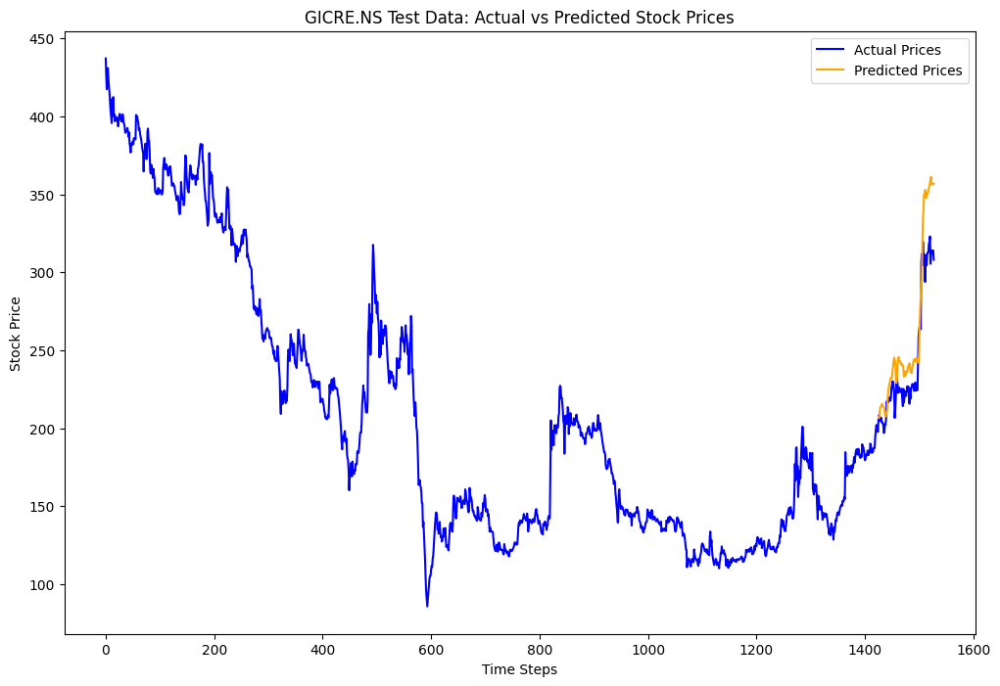

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.1212, Validation Loss: 0.0167
Epoch [2/33], Loss: 0.1306, Validation Loss: 0.0011
Epoch [3/33], Loss: 0.0932, Validation Loss: 0.0030
Epoch [4/33], Loss: 0.0583, Validation Loss: 0.0049
Epoch [5/33], Loss: 0.0273, Validation Loss: 0.0010
Epoch [6/33], Loss: 0.0214, Validation Loss: 0.0004
Epoch [7/33], Loss: 0.0097, Validation Loss: 0.0038
Epoch [8/33], Loss: 0.0065, Validation Loss: 0.0041
Epoch [9/33], Loss: 0.0063, Validation Loss: 0.0067
Epoch [10/33], Loss: 0.0057, Validation Loss: 0.0046
Epoch [11/33], Loss: 0.0032, Validation Loss: 0.0005
Epoch [12/33], Loss: 0.0030, Validation Loss: 0.0004
Epoch [13/33], Loss: 0.0021, Validation Loss: 0.0003
Epoch [14/33], Loss: 0.0039, Validation Loss: 0.0002
Epoch [15/33], Loss: 0.0031, Validation Loss: 0.0006
Epoch [16/33], Loss: 0.0027, Validation Loss: 0.0019
Epoch [17/33], Loss: 0.0029, Validation Loss: 0.0020
Epoch [18/33], Loss: 0.0023, Validation Loss: 0.0014
Epoch [19/33], Loss: 0.0023, Validation Loss: 0.0008
Ep

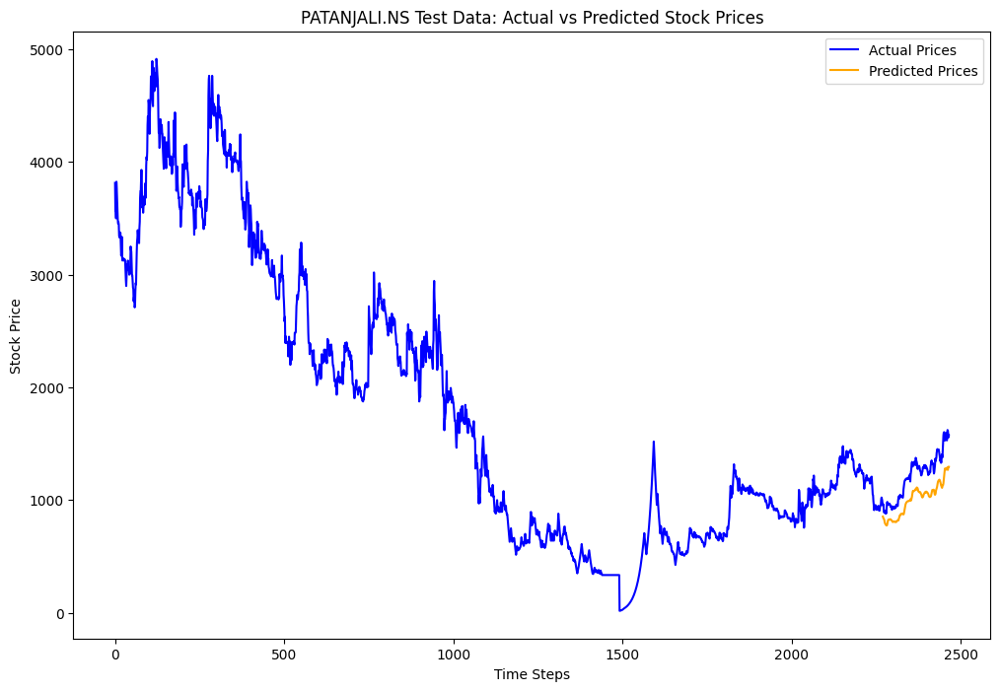

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0342, Validation Loss: 0.0225
Epoch [2/33], Loss: 0.0230, Validation Loss: 0.0268
Epoch [3/33], Loss: 0.0213, Validation Loss: 0.0223
Epoch [4/33], Loss: 0.0186, Validation Loss: 0.0135
Epoch [5/33], Loss: 0.0171, Validation Loss: 0.0190
Epoch [6/33], Loss: 0.0100, Validation Loss: 0.0021
Epoch [7/33], Loss: 0.0077, Validation Loss: 0.0050
Epoch [8/33], Loss: 0.0062, Validation Loss: 0.0031
Epoch [9/33], Loss: 0.0041, Validation Loss: 0.0018
Epoch [10/33], Loss: 0.0027, Validation Loss: 0.0017
Epoch [11/33], Loss: 0.0018, Validation Loss: 0.0006
Epoch [12/33], Loss: 0.0013, Validation Loss: 0.0005
Epoch [13/33], Loss: 0.0012, Validation Loss: 0.0006
Epoch [14/33], Loss: 0.0009, Validation Loss: 0.0004
Epoch [15/33], Loss: 0.0008, Validation Loss: 0.0005
Epoch [16/33], Loss: 0.0009, Validation Loss: 0.0005
Epoch [17/33], Loss: 0.0008, Validation Loss: 0.0004
Epoch [18/33], Loss: 0.0008, Validation Loss: 0.0005
Epoch [19/33], Loss: 0.0008, Validation Loss: 0.0005
Ep

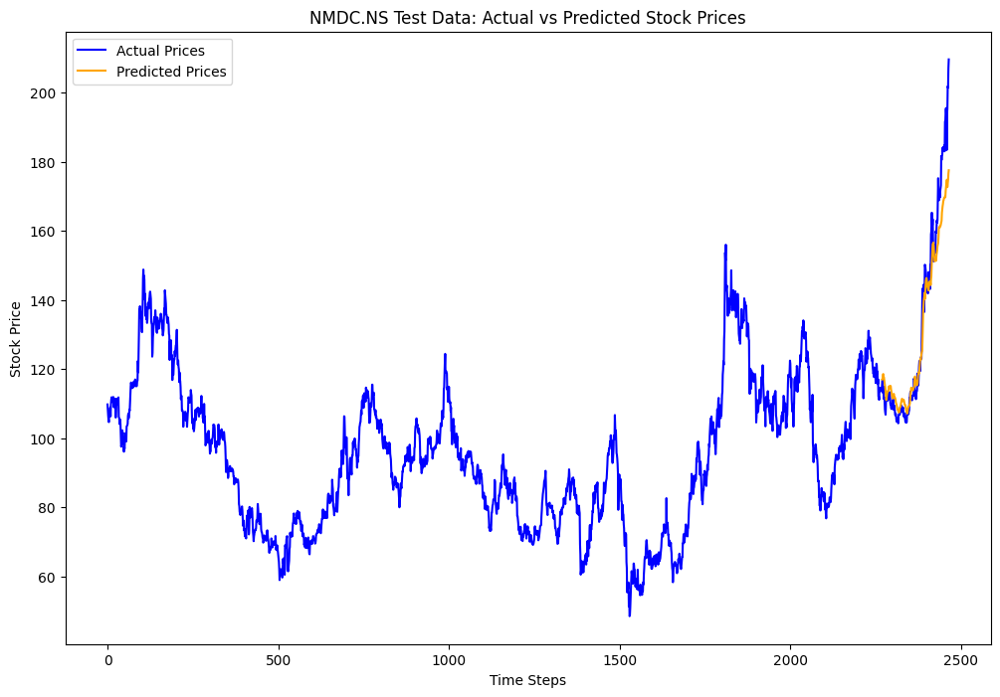

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0026, Validation Loss: 0.0244
Epoch [2/33], Loss: 0.1392, Validation Loss: 0.5772
Epoch [3/33], Loss: 0.0416, Validation Loss: 0.3880
Epoch [4/33], Loss: 0.0564, Validation Loss: 0.4237
Epoch [5/33], Loss: 0.0400, Validation Loss: 0.2831
Epoch [6/33], Loss: 0.0201, Validation Loss: 0.7182
Epoch [7/33], Loss: 0.1858, Validation Loss: 0.3170
Epoch [8/33], Loss: 0.0573, Validation Loss: 0.5490
Epoch [9/33], Loss: 0.0422, Validation Loss: 0.3956
Epoch [10/33], Loss: 0.0369, Validation Loss: 0.2003
Epoch [11/33], Loss: 0.0168, Validation Loss: 0.0678
Epoch [12/33], Loss: 0.0175, Validation Loss: 0.0560
Epoch [13/33], Loss: 0.0213, Validation Loss: 0.0020
Epoch [14/33], Loss: 0.0100, Validation Loss: 0.0512
Epoch [15/33], Loss: 0.0081, Validation Loss: 0.0067
Epoch [16/33], Loss: 0.0159, Validation Loss: 0.1048
Epoch [17/33], Loss: 0.0100, Validation Loss: 0.0029
Epoch [18/33], Loss: 0.0048, Validation Loss: 0.0013
Epoch [19/33], Loss: 0.0088, Validation Loss: 0.0349
Ep

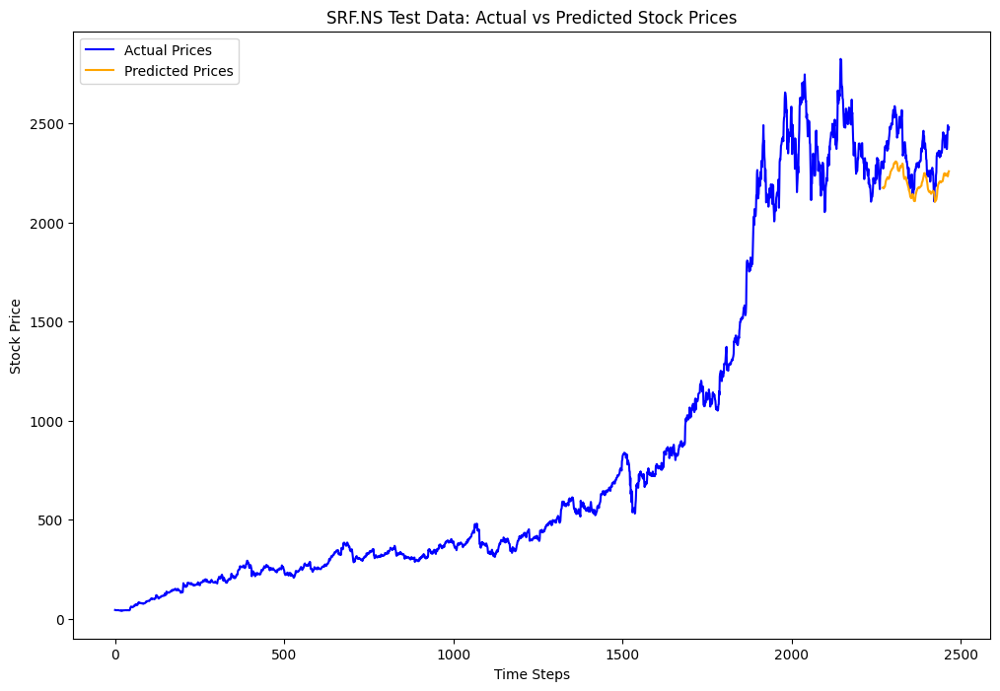

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0081, Validation Loss: 0.0070
Epoch [2/33], Loss: 0.1106, Validation Loss: 0.2699
Epoch [3/33], Loss: 0.0610, Validation Loss: 0.2348
Epoch [4/33], Loss: 0.0558, Validation Loss: 0.1954
Epoch [5/33], Loss: 0.0382, Validation Loss: 0.0111
Epoch [6/33], Loss: 0.0216, Validation Loss: 0.0348
Epoch [7/33], Loss: 0.0112, Validation Loss: 0.0065
Epoch [8/33], Loss: 0.0076, Validation Loss: 0.0030
Epoch [9/33], Loss: 0.0083, Validation Loss: 0.0196
Epoch [10/33], Loss: 0.0037, Validation Loss: 0.0027
Epoch [11/33], Loss: 0.0089, Validation Loss: 0.0015
Epoch [12/33], Loss: 0.0131, Validation Loss: 0.0126
Epoch [13/33], Loss: 0.0125, Validation Loss: 0.0193
Epoch [14/33], Loss: 0.0203, Validation Loss: 0.0492
Epoch [15/33], Loss: 0.0170, Validation Loss: 0.0008
Epoch [16/33], Loss: 0.0028, Validation Loss: 0.0004
Epoch [17/33], Loss: 0.0024, Validation Loss: 0.0004
Epoch [18/33], Loss: 0.0021, Validation Loss: 0.0008
Epoch [19/33], Loss: 0.0042, Validation Loss: 0.0079
Ep

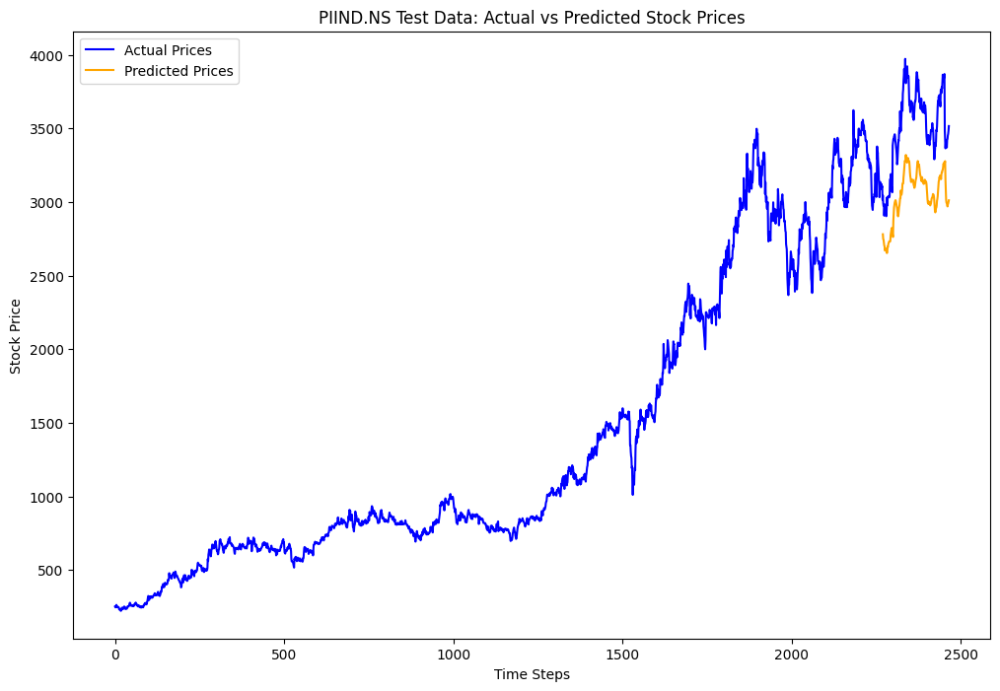

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0109, Validation Loss: 0.0179
Epoch [2/33], Loss: 0.0223, Validation Loss: 0.0271
Epoch [3/33], Loss: 0.0199, Validation Loss: 0.0401
Epoch [4/33], Loss: 0.0171, Validation Loss: 0.0422
Epoch [5/33], Loss: 0.0154, Validation Loss: 0.0387
Epoch [6/33], Loss: 0.0142, Validation Loss: 0.0278
Epoch [7/33], Loss: 0.0102, Validation Loss: 0.0005
Epoch [8/33], Loss: 0.0268, Validation Loss: 0.0421
Epoch [9/33], Loss: 0.0133, Validation Loss: 0.0305
Epoch [10/33], Loss: 0.0159, Validation Loss: 0.0324
Epoch [11/33], Loss: 0.0099, Validation Loss: 0.0123
Epoch [12/33], Loss: 0.0040, Validation Loss: 0.0034
Epoch [13/33], Loss: 0.0024, Validation Loss: 0.0019
Epoch [14/33], Loss: 0.0044, Validation Loss: 0.0058
Epoch [15/33], Loss: 0.0047, Validation Loss: 0.0121
Epoch [16/33], Loss: 0.0051, Validation Loss: 0.0005
Epoch [17/33], Loss: 0.0019, Validation Loss: 0.0002
Epoch [18/33], Loss: 0.0010, Validation Loss: 0.0013
Epoch [19/33], Loss: 0.0016, Validation Loss: 0.0003
Ep

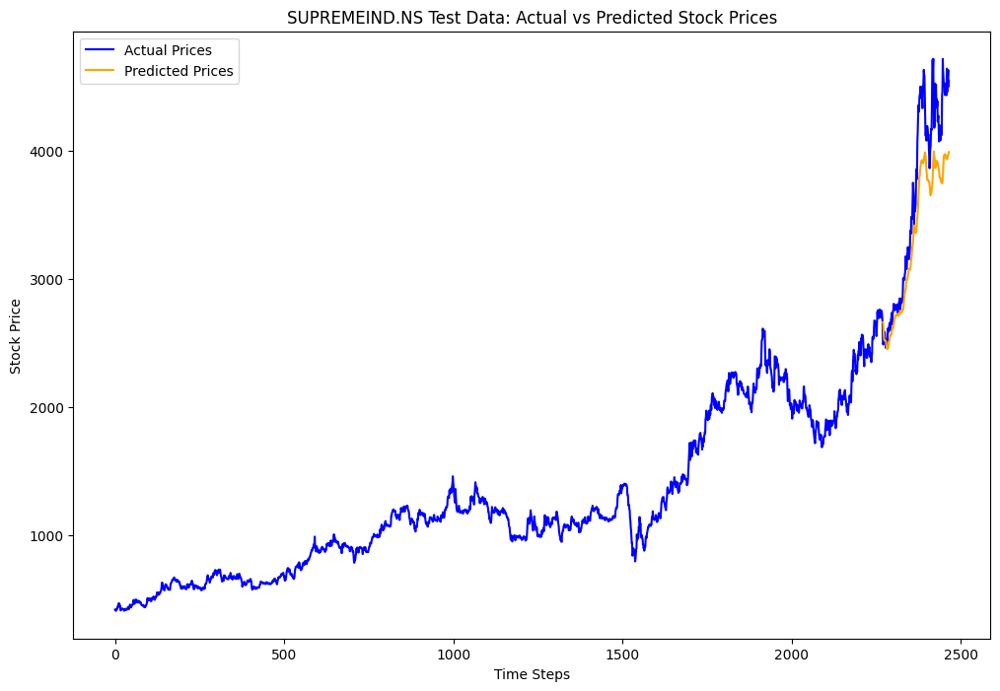

<ipython-input-64-b39c145db184>:151: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  locals()[results_name] = pd.concat([locals()[results_name], new_row], ignore_index=True)
[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0052, Validation Loss: 0.0545
Epoch [2/33], Loss: 0.0161, Validation Loss: 0.0624
Epoch [3/33], Loss: 0.0165, Validation Loss: 0.1040
Epoch [4/33], Loss: 0.0122, Validation Loss: 0.1070
Epoch [5/33], Loss: 0.0108, Validation Loss: 0.1029
Epoch [6/33], Loss: 0.0111, Validation Loss: 0.1010
Epoch [7/33], Loss: 0.0106, Validation Loss: 0.0944
Epoch [8/33], Loss: 0.0101, Validation Loss: 0.0791
Epoch [9/33], Loss: 0.0091, Validation Loss: 0.0093
Epoch [10/33], Loss: 0.0158, Validation Loss: 0.0944
Epoch [11/33], Loss: 0.0060, Validation Loss: 0.0305
Epoch [12/33], Loss: 0.0059, Validation Loss: 0.0719
Epoch [13/33], Loss: 0.0098, Validation Loss: 0.0596
Epoch [14/33], Loss: 0.0068, Validation Loss: 0.0163
Epoch [15/33], Loss: 0.0029, Validation Loss: 0.0058
Epoch [16/33], Loss: 0.0009, Validation Loss: 0.0067
Epoch [17/33], Loss: 0.0016, Validation Loss: 0.0023
Epoch [18/33], Loss: 0.0007, Validation Loss: 0.0061
Epoch [19/33], Loss: 0.0013, Validation Loss: 0.0023
Ep

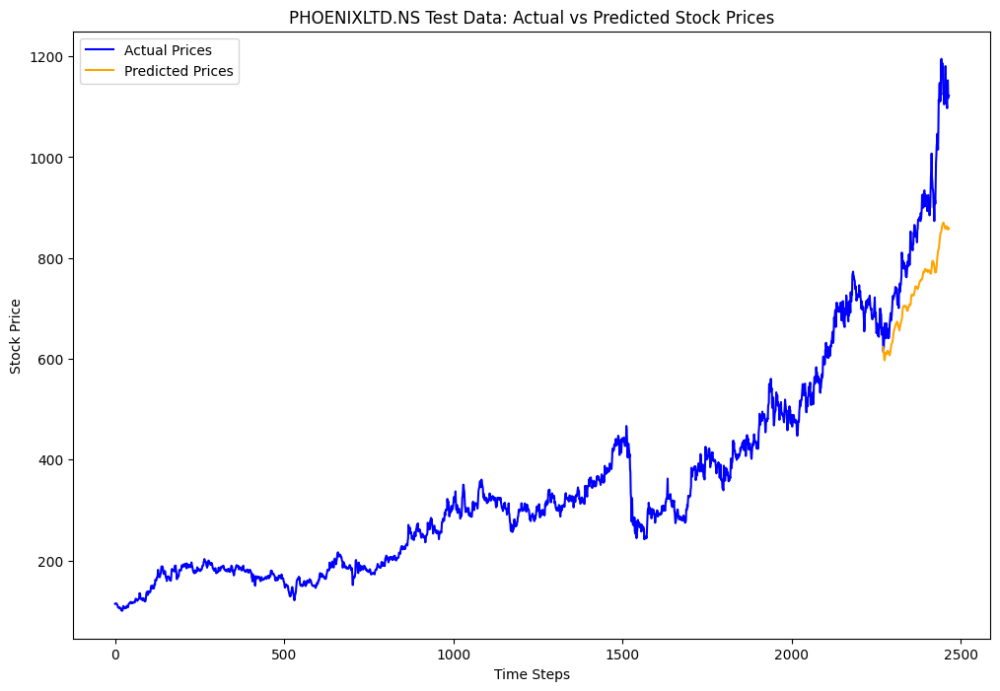

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0493, Validation Loss: 0.0165
Epoch [2/33], Loss: 0.1121, Validation Loss: 0.1491
Epoch [3/33], Loss: 0.0554, Validation Loss: 0.0776
Epoch [4/33], Loss: 0.0394, Validation Loss: 0.0021
Epoch [5/33], Loss: 0.0448, Validation Loss: 0.0232
Epoch [6/33], Loss: 0.0245, Validation Loss: 0.0159
Epoch [7/33], Loss: 0.0144, Validation Loss: 0.0133
Epoch [8/33], Loss: 0.0260, Validation Loss: 0.0359
Epoch [9/33], Loss: 0.0078, Validation Loss: 0.0006
Epoch [10/33], Loss: 0.0027, Validation Loss: 0.0007
Epoch [11/33], Loss: 0.0050, Validation Loss: 0.0014
Epoch [12/33], Loss: 0.0045, Validation Loss: 0.0023
Epoch [13/33], Loss: 0.0056, Validation Loss: 0.0015
Epoch [14/33], Loss: 0.0043, Validation Loss: 0.0023
Epoch [15/33], Loss: 0.0054, Validation Loss: 0.0020
Epoch [16/33], Loss: 0.0040, Validation Loss: 0.0027
Epoch [17/33], Loss: 0.0048, Validation Loss: 0.0015
Epoch [18/33], Loss: 0.0040, Validation Loss: 0.0024
Epoch [19/33], Loss: 0.0054, Validation Loss: 0.0018
Ep

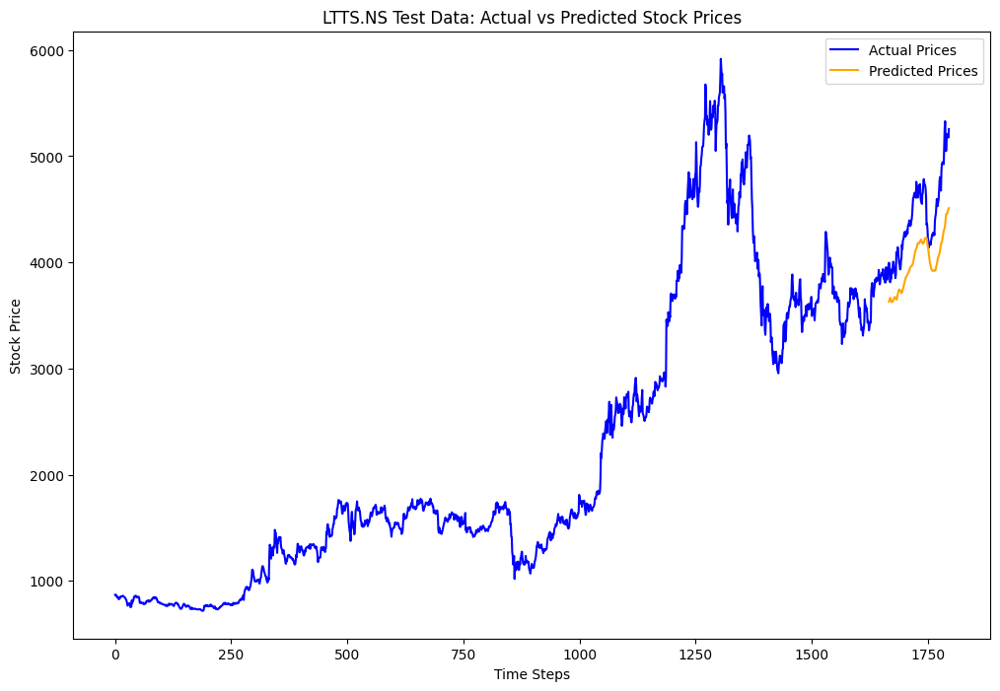

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0062, Validation Loss: 0.0063
Epoch [2/33], Loss: 0.1611, Validation Loss: 0.1249
Epoch [3/33], Loss: 0.1052, Validation Loss: 0.1130
Epoch [4/33], Loss: 0.0618, Validation Loss: 0.0145
Epoch [5/33], Loss: 0.0287, Validation Loss: 0.0294
Epoch [6/33], Loss: 0.0124, Validation Loss: 0.0198
Epoch [7/33], Loss: 0.0042, Validation Loss: 0.0005
Epoch [8/33], Loss: 0.0077, Validation Loss: 0.0009
Epoch [9/33], Loss: 0.0054, Validation Loss: 0.0006
Epoch [10/33], Loss: 0.0023, Validation Loss: 0.0005
Epoch [11/33], Loss: 0.0021, Validation Loss: 0.0004
Epoch [12/33], Loss: 0.0030, Validation Loss: 0.0029
Epoch [13/33], Loss: 0.0016, Validation Loss: 0.0008
Epoch [14/33], Loss: 0.0020, Validation Loss: 0.0004
Epoch [15/33], Loss: 0.0032, Validation Loss: 0.0006
Epoch [16/33], Loss: 0.0030, Validation Loss: 0.0058
Epoch [17/33], Loss: 0.0021, Validation Loss: 0.0066
Epoch [18/33], Loss: 0.0060, Validation Loss: 0.0095
Epoch [19/33], Loss: 0.0147, Validation Loss: 0.0054
Ep

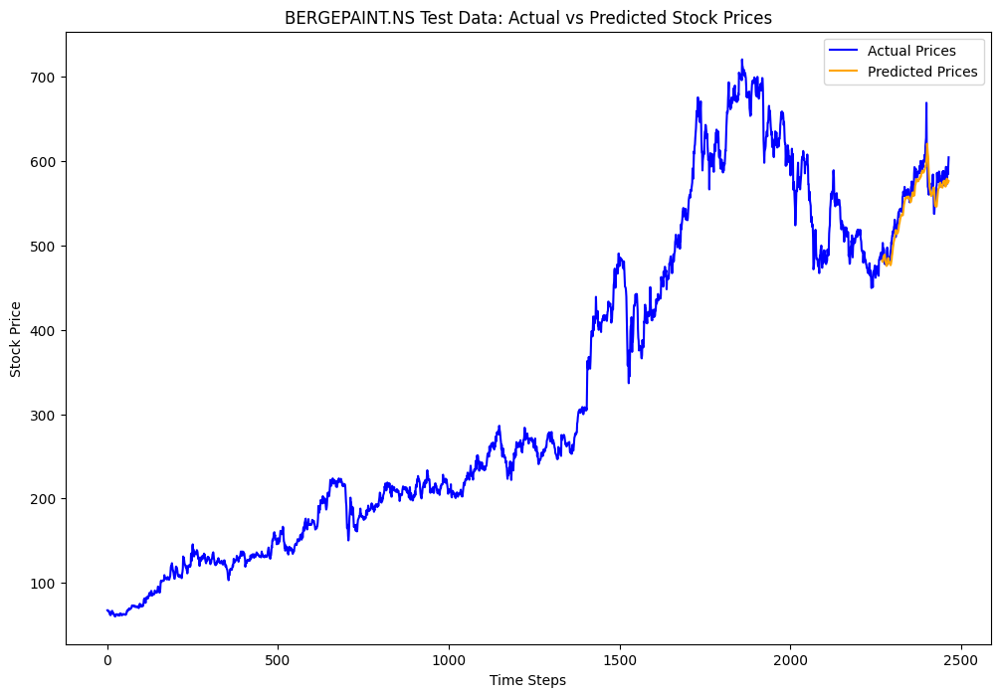

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0146, Validation Loss: 0.0644
Epoch [2/33], Loss: 0.1457, Validation Loss: 0.2122
Epoch [3/33], Loss: 0.0604, Validation Loss: 0.1656
Epoch [4/33], Loss: 0.0613, Validation Loss: 0.1418
Epoch [5/33], Loss: 0.0421, Validation Loss: 0.0199
Epoch [6/33], Loss: 0.0679, Validation Loss: 0.1255
Epoch [7/33], Loss: 0.0695, Validation Loss: 0.1973
Epoch [8/33], Loss: 0.0593, Validation Loss: 0.1659
Epoch [9/33], Loss: 0.0495, Validation Loss: 0.1190
Epoch [10/33], Loss: 0.0158, Validation Loss: 0.0020
Epoch [11/33], Loss: 0.0325, Validation Loss: 0.1334
Epoch [12/33], Loss: 0.0520, Validation Loss: 0.0884
Epoch [13/33], Loss: 0.0838, Validation Loss: 0.1791
Epoch [14/33], Loss: 0.0542, Validation Loss: 0.1467
Epoch [15/33], Loss: 0.0515, Validation Loss: 0.1275
Epoch [16/33], Loss: 0.0403, Validation Loss: 0.0829
Epoch [17/33], Loss: 0.0155, Validation Loss: 0.0037
Epoch [18/33], Loss: 0.0148, Validation Loss: 0.0044
Epoch [19/33], Loss: 0.0260, Validation Loss: 0.0580
Ep

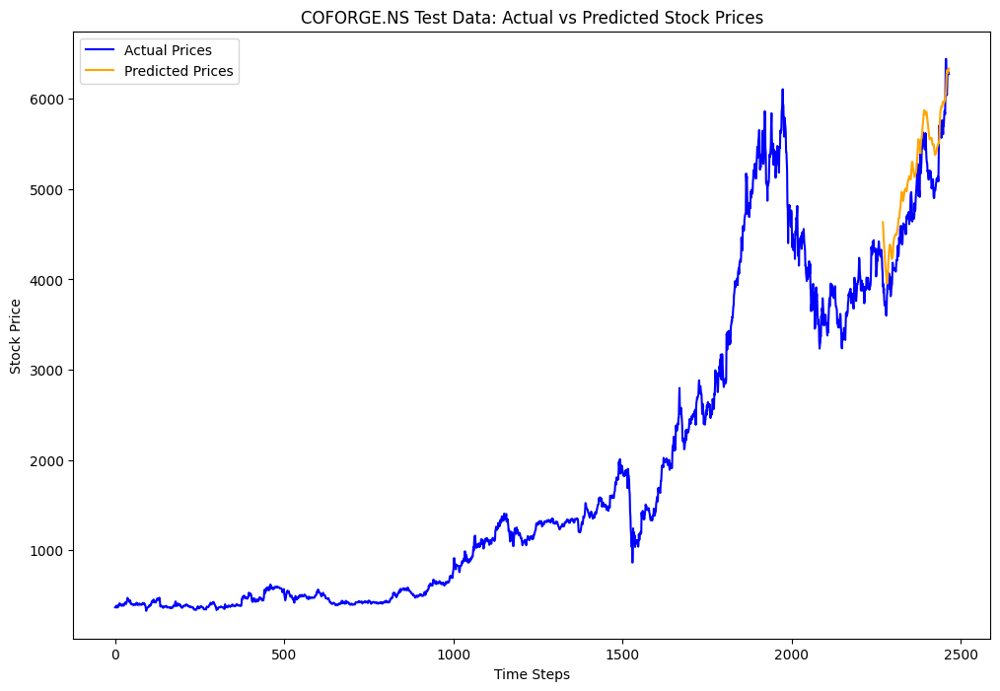

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0097, Validation Loss: 0.0304
Epoch [2/33], Loss: 0.0079, Validation Loss: 0.0277
Epoch [3/33], Loss: 0.0078, Validation Loss: 0.0282
Epoch [4/33], Loss: 0.0074, Validation Loss: 0.0271
Epoch [5/33], Loss: 0.0075, Validation Loss: 0.0233
Epoch [6/33], Loss: 0.0070, Validation Loss: 0.0184
Epoch [7/33], Loss: 0.0042, Validation Loss: 0.0028
Epoch [8/33], Loss: 0.0049, Validation Loss: 0.0170
Epoch [9/33], Loss: 0.0023, Validation Loss: 0.0005
Epoch [10/33], Loss: 0.0020, Validation Loss: 0.0033
Epoch [11/33], Loss: 0.0023, Validation Loss: 0.0042
Epoch [12/33], Loss: 0.0047, Validation Loss: 0.0157
Epoch [13/33], Loss: 0.0030, Validation Loss: 0.0044
Epoch [14/33], Loss: 0.0011, Validation Loss: 0.0012
Epoch [15/33], Loss: 0.0032, Validation Loss: 0.0097
Epoch [16/33], Loss: 0.0009, Validation Loss: 0.0002
Epoch [17/33], Loss: 0.0003, Validation Loss: 0.0002
Epoch [18/33], Loss: 0.0004, Validation Loss: 0.0002
Epoch [19/33], Loss: 0.0002, Validation Loss: 0.0002
Ep

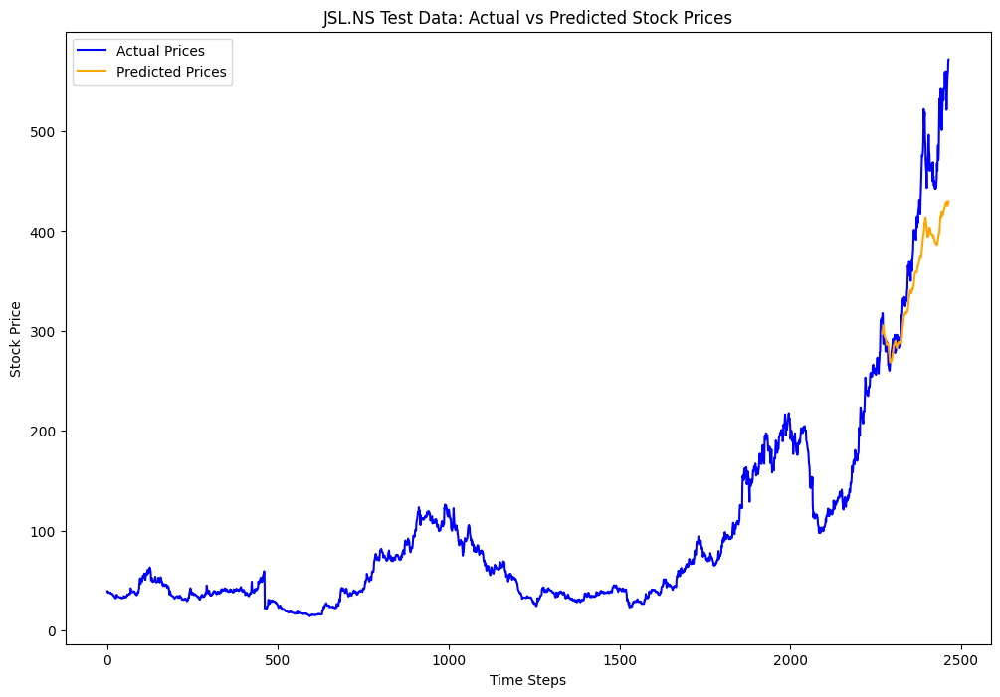

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0223, Validation Loss: 0.0364
Epoch [2/33], Loss: 0.1510, Validation Loss: 0.1909
Epoch [3/33], Loss: 0.0428, Validation Loss: 0.0112
Epoch [4/33], Loss: 0.0495, Validation Loss: 0.0836
Epoch [5/33], Loss: 0.1283, Validation Loss: 0.0687
Epoch [6/33], Loss: 0.0123, Validation Loss: 0.0124
Epoch [7/33], Loss: 0.0113, Validation Loss: 0.0076
Epoch [8/33], Loss: 0.0126, Validation Loss: 0.0087
Epoch [9/33], Loss: 0.0041, Validation Loss: 0.0052
Epoch [10/33], Loss: 0.0063, Validation Loss: 0.0049
Epoch [11/33], Loss: 0.0031, Validation Loss: 0.0030
Epoch [12/33], Loss: 0.0054, Validation Loss: 0.0022
Epoch [13/33], Loss: 0.0033, Validation Loss: 0.0023
Epoch [14/33], Loss: 0.0058, Validation Loss: 0.0019
Epoch [15/33], Loss: 0.0045, Validation Loss: 0.0027
Epoch [16/33], Loss: 0.0081, Validation Loss: 0.0018
Epoch [17/33], Loss: 0.0065, Validation Loss: 0.0029
Epoch [18/33], Loss: 0.0125, Validation Loss: 0.0025
Epoch [19/33], Loss: 0.0037, Validation Loss: 0.0030
Ep

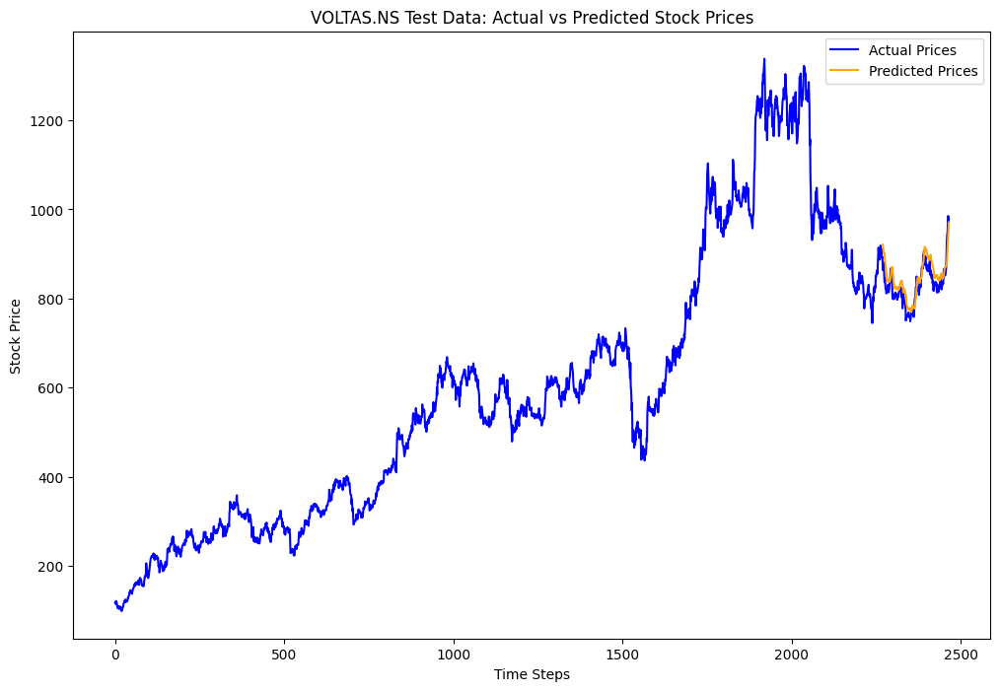

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0470, Validation Loss: 0.0800
Epoch [2/33], Loss: 0.0971, Validation Loss: 0.2059
Epoch [3/33], Loss: 0.0612, Validation Loss: 0.1463
Epoch [4/33], Loss: 0.0463, Validation Loss: 0.0293
Epoch [5/33], Loss: 0.0240, Validation Loss: 0.0368
Epoch [6/33], Loss: 0.0349, Validation Loss: 0.0630
Epoch [7/33], Loss: 0.0179, Validation Loss: 0.0187
Epoch [8/33], Loss: 0.0336, Validation Loss: 0.0753
Epoch [9/33], Loss: 0.0260, Validation Loss: 0.0081
Epoch [10/33], Loss: 0.0192, Validation Loss: 0.0023
Epoch [11/33], Loss: 0.0347, Validation Loss: 0.0990
Epoch [12/33], Loss: 0.0163, Validation Loss: 0.0148
Epoch [13/33], Loss: 0.0037, Validation Loss: 0.0053
Epoch [14/33], Loss: 0.0017, Validation Loss: 0.0009
Epoch [15/33], Loss: 0.0019, Validation Loss: 0.0024
Epoch [16/33], Loss: 0.0015, Validation Loss: 0.0007
Epoch [17/33], Loss: 0.0021, Validation Loss: 0.0029
Epoch [18/33], Loss: 0.0011, Validation Loss: 0.0015
Epoch [19/33], Loss: 0.0020, Validation Loss: 0.0012
Ep

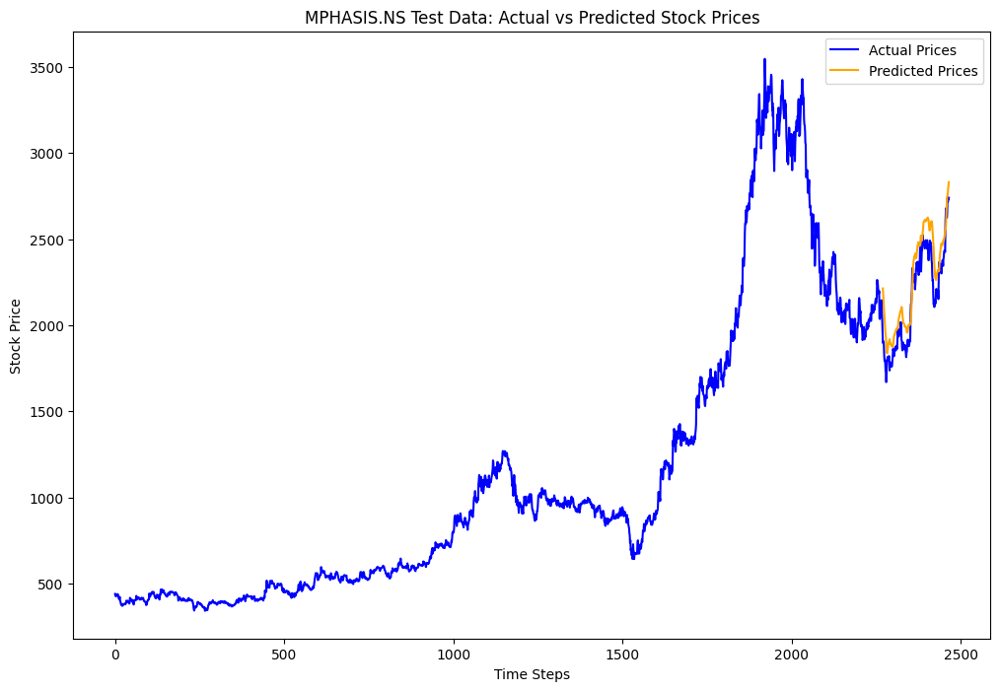

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0169, Validation Loss: 0.0494
Epoch [2/33], Loss: 0.0645, Validation Loss: 0.1564
Epoch [3/33], Loss: 0.0576, Validation Loss: 0.2076
Epoch [4/33], Loss: 0.0365, Validation Loss: 0.0760
Epoch [5/33], Loss: 0.0259, Validation Loss: 0.0587
Epoch [6/33], Loss: 0.0407, Validation Loss: 0.1629
Epoch [7/33], Loss: 0.0176, Validation Loss: 0.0022
Epoch [8/33], Loss: 0.0062, Validation Loss: 0.0073
Epoch [9/33], Loss: 0.0086, Validation Loss: 0.0051
Epoch [10/33], Loss: 0.0032, Validation Loss: 0.0038
Epoch [11/33], Loss: 0.0022, Validation Loss: 0.0091
Epoch [12/33], Loss: 0.0013, Validation Loss: 0.0040
Epoch [13/33], Loss: 0.0011, Validation Loss: 0.0021
Epoch [14/33], Loss: 0.0015, Validation Loss: 0.0024
Epoch [15/33], Loss: 0.0009, Validation Loss: 0.0018
Epoch [16/33], Loss: 0.0010, Validation Loss: 0.0017
Epoch [17/33], Loss: 0.0009, Validation Loss: 0.0016
Epoch [18/33], Loss: 0.0009, Validation Loss: 0.0016
Epoch [19/33], Loss: 0.0009, Validation Loss: 0.0024
Ep

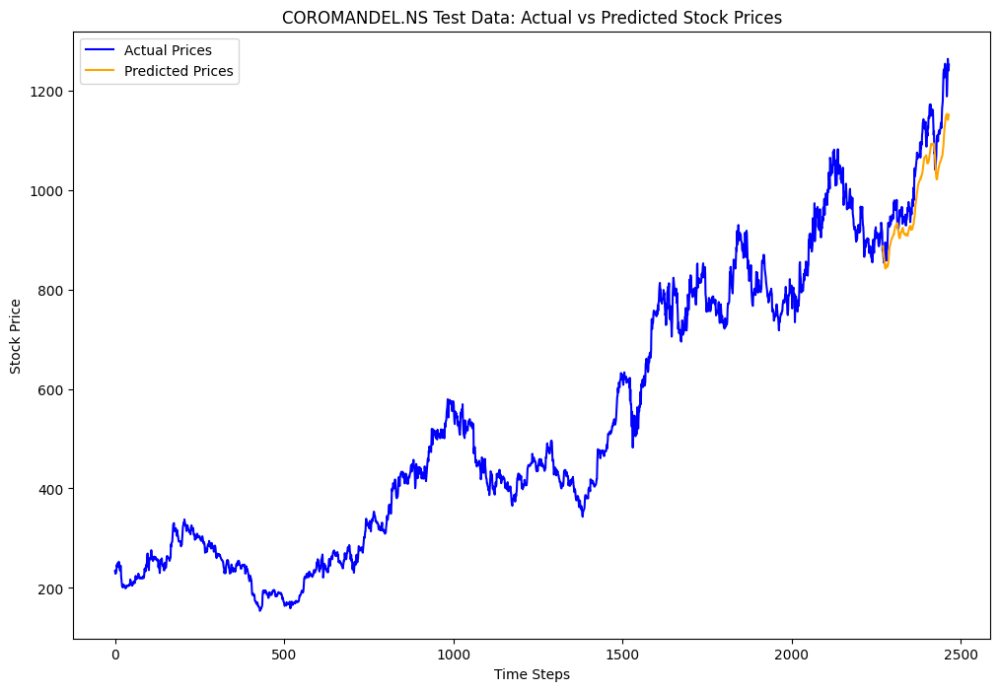

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0506, Validation Loss: 0.0751
Epoch [2/33], Loss: 0.1063, Validation Loss: 0.1991
Epoch [3/33], Loss: 0.0268, Validation Loss: 0.0035
Epoch [4/33], Loss: 0.0228, Validation Loss: 0.0044
Epoch [5/33], Loss: 0.0485, Validation Loss: 0.0630
Epoch [6/33], Loss: 0.0113, Validation Loss: 0.0359
Epoch [7/33], Loss: 0.0345, Validation Loss: 0.0685
Epoch [8/33], Loss: 0.0206, Validation Loss: 0.0005
Epoch [9/33], Loss: 0.0077, Validation Loss: 0.0036
Epoch [10/33], Loss: 0.0167, Validation Loss: 0.0193
Epoch [11/33], Loss: 0.0195, Validation Loss: 0.0004
Epoch [12/33], Loss: 0.0095, Validation Loss: 0.0102
Epoch [13/33], Loss: 0.0107, Validation Loss: 0.0004
Epoch [14/33], Loss: 0.0106, Validation Loss: 0.0142
Epoch [15/33], Loss: 0.0107, Validation Loss: 0.0005
Epoch [16/33], Loss: 0.0076, Validation Loss: 0.0066
Epoch [17/33], Loss: 0.0088, Validation Loss: 0.0004
Epoch [18/33], Loss: 0.0108, Validation Loss: 0.0164
Epoch [19/33], Loss: 0.0126, Validation Loss: 0.0004
Ep

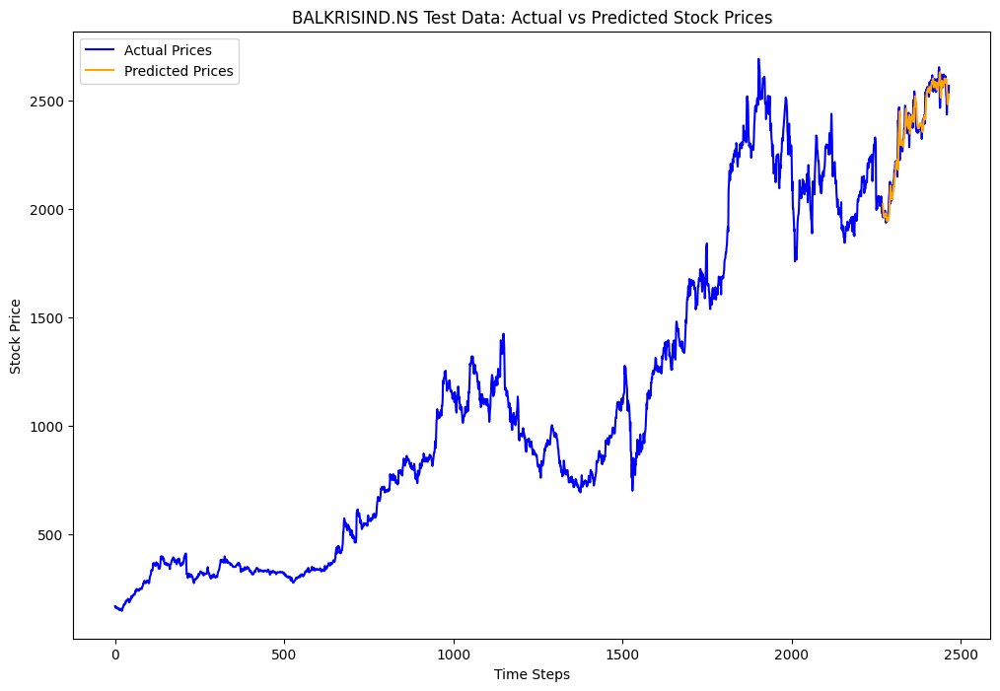

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0256, Validation Loss: 0.0306
Epoch [2/33], Loss: 0.0373, Validation Loss: 0.0050
Epoch [3/33], Loss: 0.0541, Validation Loss: 0.0071
Epoch [4/33], Loss: 0.0422, Validation Loss: 0.0072
Epoch [5/33], Loss: 0.0236, Validation Loss: 0.0021
Epoch [6/33], Loss: 0.0040, Validation Loss: 0.0047
Epoch [7/33], Loss: 0.0120, Validation Loss: 0.0011
Epoch [8/33], Loss: 0.0077, Validation Loss: 0.0006
Epoch [9/33], Loss: 0.0020, Validation Loss: 0.0007
Epoch [10/33], Loss: 0.0015, Validation Loss: 0.0004
Epoch [11/33], Loss: 0.0021, Validation Loss: 0.0004
Epoch [12/33], Loss: 0.0015, Validation Loss: 0.0004
Epoch [13/33], Loss: 0.0013, Validation Loss: 0.0006
Epoch [14/33], Loss: 0.0019, Validation Loss: 0.0008
Epoch [15/33], Loss: 0.0014, Validation Loss: 0.0004
Epoch [16/33], Loss: 0.0011, Validation Loss: 0.0004
Epoch [17/33], Loss: 0.0009, Validation Loss: 0.0004
Epoch [18/33], Loss: 0.0011, Validation Loss: 0.0005
Epoch [19/33], Loss: 0.0019, Validation Loss: 0.0006
Ep

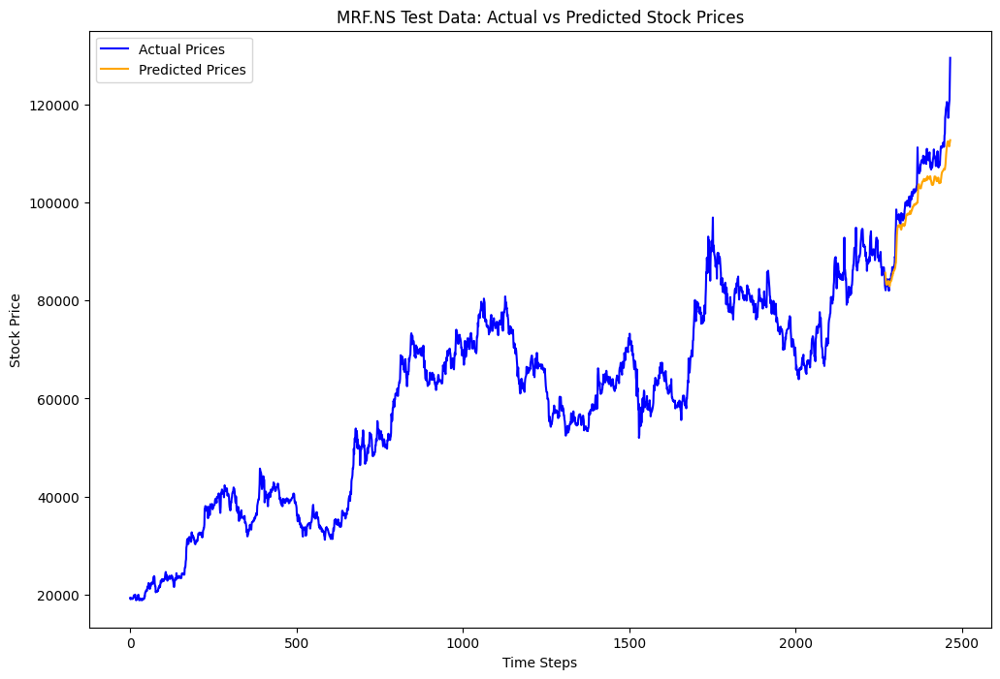

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0244, Validation Loss: 0.1216
Epoch [2/33], Loss: 0.0268, Validation Loss: 0.1309
Epoch [3/33], Loss: 0.0244, Validation Loss: 0.1185
Epoch [4/33], Loss: 0.0217, Validation Loss: 0.0968
Epoch [5/33], Loss: 0.0049, Validation Loss: 0.0023
Epoch [6/33], Loss: 0.0046, Validation Loss: 0.0109
Epoch [7/33], Loss: 0.0126, Validation Loss: 0.0474
Epoch [8/33], Loss: 0.0025, Validation Loss: 0.0019
Epoch [9/33], Loss: 0.0112, Validation Loss: 0.0361
Epoch [10/33], Loss: 0.0032, Validation Loss: 0.0012
Epoch [11/33], Loss: 0.0059, Validation Loss: 0.0078
Epoch [12/33], Loss: 0.0042, Validation Loss: 0.0052
Epoch [13/33], Loss: 0.0129, Validation Loss: 0.0463
Epoch [14/33], Loss: 0.0022, Validation Loss: 0.0009
Epoch [15/33], Loss: 0.0019, Validation Loss: 0.0007
Epoch [16/33], Loss: 0.0040, Validation Loss: 0.0031
Epoch [17/33], Loss: 0.0038, Validation Loss: 0.0040
Epoch [18/33], Loss: 0.0142, Validation Loss: 0.0522
Epoch [19/33], Loss: 0.0039, Validation Loss: 0.0017
Ep

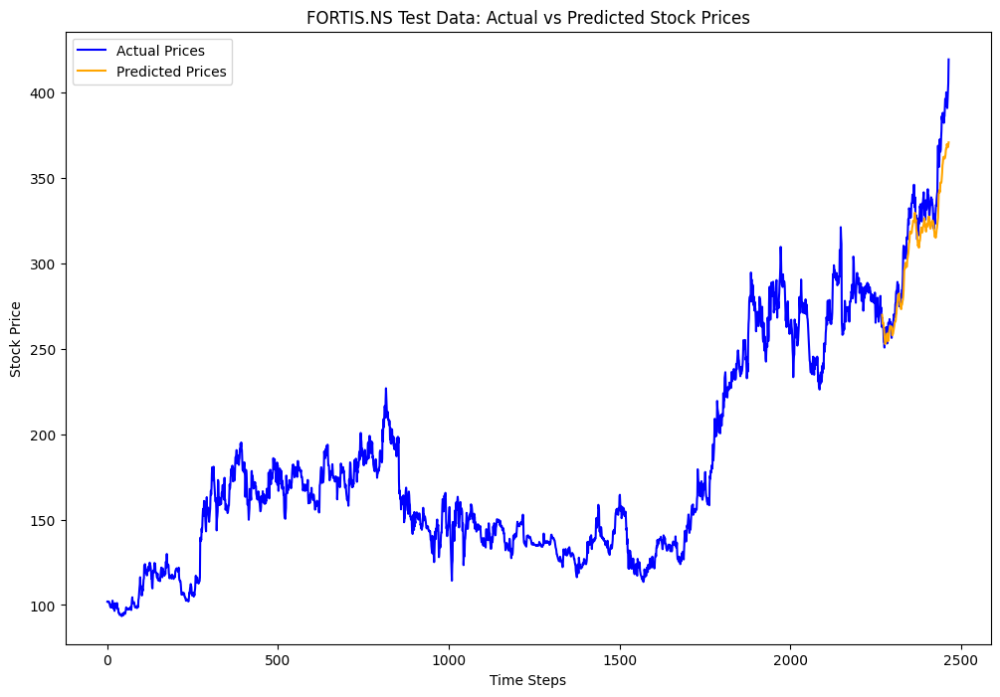

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0457, Validation Loss: 0.1358
Epoch [2/33], Loss: 0.0369, Validation Loss: 0.0638
Epoch [3/33], Loss: 0.0334, Validation Loss: 0.0516
Epoch [4/33], Loss: 0.0274, Validation Loss: 0.0672
Epoch [5/33], Loss: 0.0197, Validation Loss: 0.0177
Epoch [6/33], Loss: 0.0124, Validation Loss: 0.0117
Epoch [7/33], Loss: 0.0069, Validation Loss: 0.0277
Epoch [8/33], Loss: 0.0038, Validation Loss: 0.0047
Epoch [9/33], Loss: 0.0015, Validation Loss: 0.0021
Epoch [10/33], Loss: 0.0014, Validation Loss: 0.0018
Epoch [11/33], Loss: 0.0013, Validation Loss: 0.0013
Epoch [12/33], Loss: 0.0014, Validation Loss: 0.0012
Epoch [13/33], Loss: 0.0015, Validation Loss: 0.0008
Epoch [14/33], Loss: 0.0017, Validation Loss: 0.0023
Epoch [15/33], Loss: 0.0012, Validation Loss: 0.0006
Epoch [16/33], Loss: 0.0012, Validation Loss: 0.0009
Epoch [17/33], Loss: 0.0012, Validation Loss: 0.0010
Epoch [18/33], Loss: 0.0012, Validation Loss: 0.0010
Epoch [19/33], Loss: 0.0011, Validation Loss: 0.0007
Ep

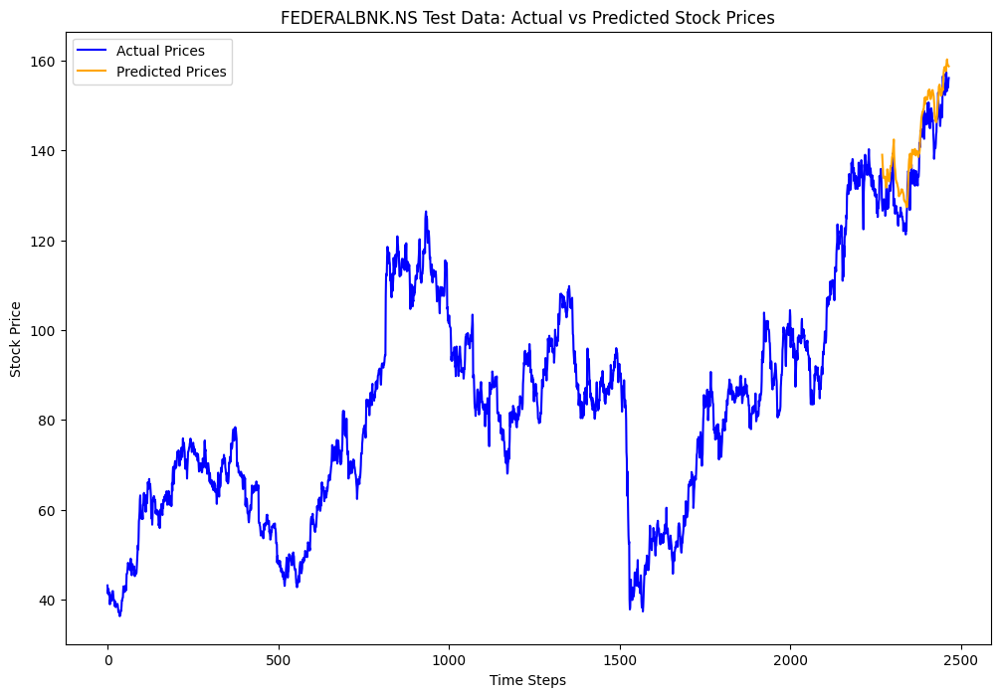

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0457, Validation Loss: 0.0076
Epoch [2/33], Loss: 0.1111, Validation Loss: 0.2511
Epoch [3/33], Loss: 0.0398, Validation Loss: 0.0030
Epoch [4/33], Loss: 0.0435, Validation Loss: 0.0022
Epoch [5/33], Loss: 0.0230, Validation Loss: 0.0290
Epoch [6/33], Loss: 0.0312, Validation Loss: 0.0732
Epoch [7/33], Loss: 0.0132, Validation Loss: 0.0100
Epoch [8/33], Loss: 0.0071, Validation Loss: 0.0163
Epoch [9/33], Loss: 0.0038, Validation Loss: 0.0045
Epoch [10/33], Loss: 0.0026, Validation Loss: 0.0026
Epoch [11/33], Loss: 0.0040, Validation Loss: 0.0034
Epoch [12/33], Loss: 0.0052, Validation Loss: 0.0054
Epoch [13/33], Loss: 0.0046, Validation Loss: 0.0016
Epoch [14/33], Loss: 0.0049, Validation Loss: 0.0035
Epoch [15/33], Loss: 0.0022, Validation Loss: 0.0007
Epoch [16/33], Loss: 0.0017, Validation Loss: 0.0007
Epoch [17/33], Loss: 0.0031, Validation Loss: 0.0008
Epoch [18/33], Loss: 0.0066, Validation Loss: 0.0050
Epoch [19/33], Loss: 0.0072, Validation Loss: 0.0032
Ep

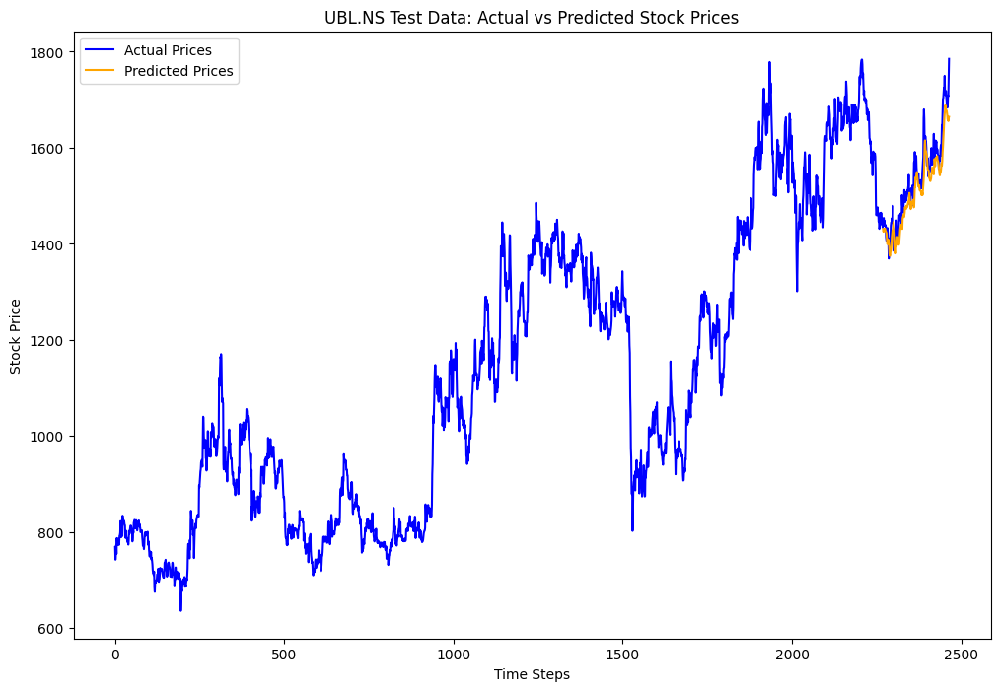

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0357, Validation Loss: 0.0238
Epoch [2/33], Loss: 0.1708, Validation Loss: 0.0078
Epoch [3/33], Loss: 0.0940, Validation Loss: 0.0022
Epoch [4/33], Loss: 0.0516, Validation Loss: 0.0164
Epoch [5/33], Loss: 0.0156, Validation Loss: 0.0026
Epoch [6/33], Loss: 0.0138, Validation Loss: 0.0089
Epoch [7/33], Loss: 0.0101, Validation Loss: 0.0004
Epoch [8/33], Loss: 0.0074, Validation Loss: 0.0050
Epoch [9/33], Loss: 0.0114, Validation Loss: 0.0003
Epoch [10/33], Loss: 0.0088, Validation Loss: 0.0033
Epoch [11/33], Loss: 0.0160, Validation Loss: 0.0036
Epoch [12/33], Loss: 0.0077, Validation Loss: 0.0090
Epoch [13/33], Loss: 0.0060, Validation Loss: 0.0041
Epoch [14/33], Loss: 0.0083, Validation Loss: 0.0055
Epoch [15/33], Loss: 0.0101, Validation Loss: 0.0016
Epoch [16/33], Loss: 0.0061, Validation Loss: 0.0069
Epoch [17/33], Loss: 0.0068, Validation Loss: 0.0021
Epoch [18/33], Loss: 0.0072, Validation Loss: 0.0054
Epoch [19/33], Loss: 0.0109, Validation Loss: 0.0023
Ep

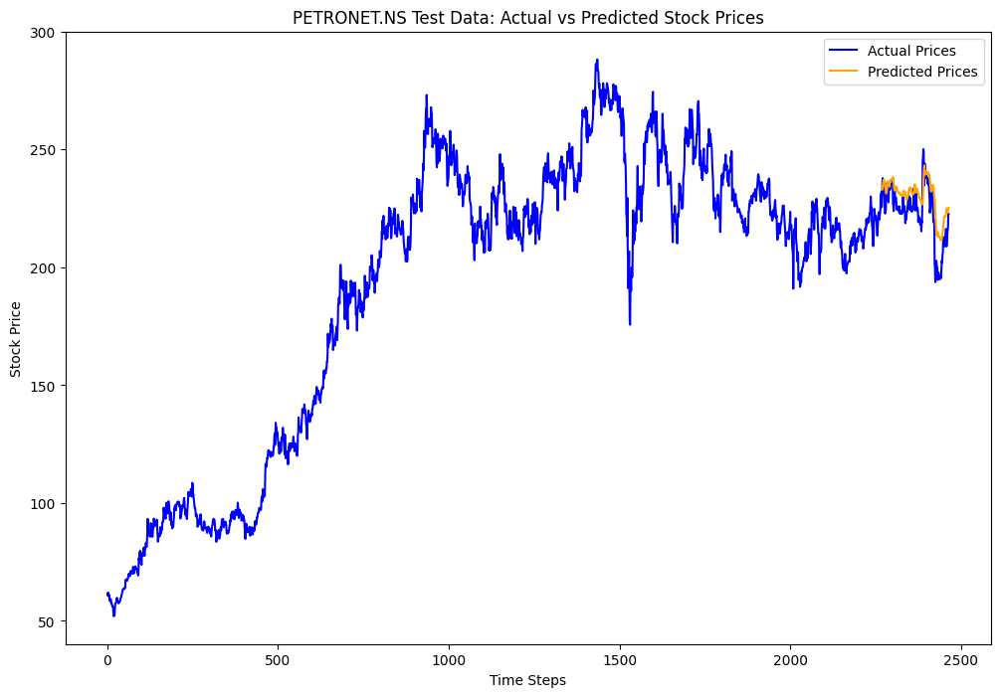

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0289, Validation Loss: 0.0460
Epoch [2/33], Loss: 0.0258, Validation Loss: 0.0378
Epoch [3/33], Loss: 0.0260, Validation Loss: 0.0416
Epoch [4/33], Loss: 0.0213, Validation Loss: 0.0157
Epoch [5/33], Loss: 0.0174, Validation Loss: 0.0019
Epoch [6/33], Loss: 0.0136, Validation Loss: 0.0018
Epoch [7/33], Loss: 0.0059, Validation Loss: 0.0035
Epoch [8/33], Loss: 0.0019, Validation Loss: 0.0013
Epoch [9/33], Loss: 0.0021, Validation Loss: 0.0034
Epoch [10/33], Loss: 0.0024, Validation Loss: 0.0029
Epoch [11/33], Loss: 0.0016, Validation Loss: 0.0060
Epoch [12/33], Loss: 0.0021, Validation Loss: 0.0010
Epoch [13/33], Loss: 0.0013, Validation Loss: 0.0009
Epoch [14/33], Loss: 0.0012, Validation Loss: 0.0011
Epoch [15/33], Loss: 0.0014, Validation Loss: 0.0018
Epoch [16/33], Loss: 0.0013, Validation Loss: 0.0028
Epoch [17/33], Loss: 0.0014, Validation Loss: 0.0009
Epoch [18/33], Loss: 0.0011, Validation Loss: 0.0016
Epoch [19/33], Loss: 0.0011, Validation Loss: 0.0011
Ep

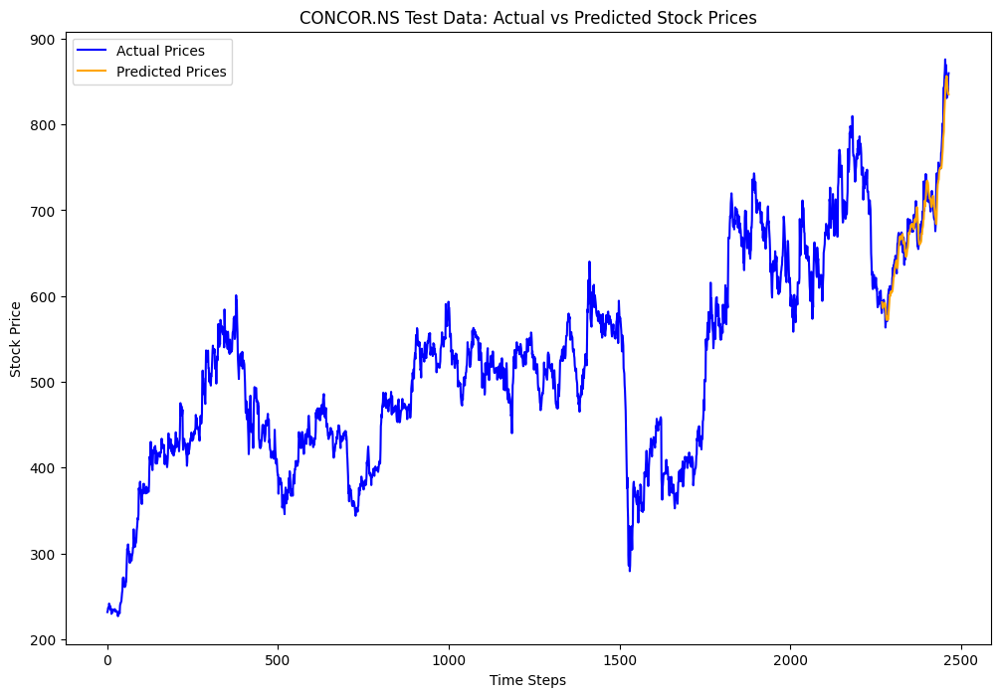

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0843, Validation Loss: 0.0028
Epoch [2/33], Loss: 0.0793, Validation Loss: 0.0079
Epoch [3/33], Loss: 0.0648, Validation Loss: 0.0032
Epoch [4/33], Loss: 0.0433, Validation Loss: 0.0022
Epoch [5/33], Loss: 0.0257, Validation Loss: 0.0047
Epoch [6/33], Loss: 0.0022, Validation Loss: 0.0003
Epoch [7/33], Loss: 0.0090, Validation Loss: 0.0005
Epoch [8/33], Loss: 0.0160, Validation Loss: 0.0013
Epoch [9/33], Loss: 0.0026, Validation Loss: 0.0006
Epoch [10/33], Loss: 0.0027, Validation Loss: 0.0006
Epoch [11/33], Loss: 0.0021, Validation Loss: 0.0008
Epoch [12/33], Loss: 0.0046, Validation Loss: 0.0012
Epoch [13/33], Loss: 0.0022, Validation Loss: 0.0009
Epoch [14/33], Loss: 0.0032, Validation Loss: 0.0007
Epoch [15/33], Loss: 0.0026, Validation Loss: 0.0009
Epoch [16/33], Loss: 0.0041, Validation Loss: 0.0009
Epoch [17/33], Loss: 0.0022, Validation Loss: 0.0011
Epoch [18/33], Loss: 0.0029, Validation Loss: 0.0005
Epoch [19/33], Loss: 0.0026, Validation Loss: 0.0019
Ep

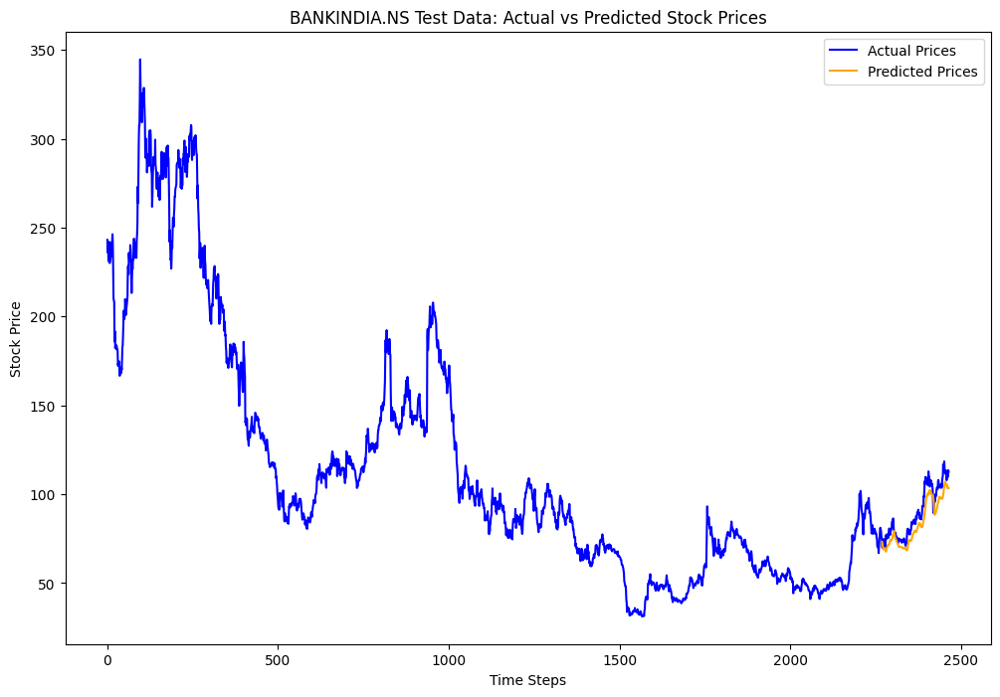

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0337, Validation Loss: 0.0280
Epoch [2/33], Loss: 0.1613, Validation Loss: 0.2874
Epoch [3/33], Loss: 0.0396, Validation Loss: 0.0163
Epoch [4/33], Loss: 0.1108, Validation Loss: 0.1676
Epoch [5/33], Loss: 0.0387, Validation Loss: 0.0275
Epoch [6/33], Loss: 0.0413, Validation Loss: 0.0089
Epoch [7/33], Loss: 0.0110, Validation Loss: 0.0028
Epoch [8/33], Loss: 0.0109, Validation Loss: 0.0094
Epoch [9/33], Loss: 0.0038, Validation Loss: 0.0022
Epoch [10/33], Loss: 0.0045, Validation Loss: 0.0018
Epoch [11/33], Loss: 0.0035, Validation Loss: 0.0017
Epoch [12/33], Loss: 0.0040, Validation Loss: 0.0014
Epoch [13/33], Loss: 0.0031, Validation Loss: 0.0013
Epoch [14/33], Loss: 0.0030, Validation Loss: 0.0013
Epoch [15/33], Loss: 0.0024, Validation Loss: 0.0014
Epoch [16/33], Loss: 0.0029, Validation Loss: 0.0012
Epoch [17/33], Loss: 0.0026, Validation Loss: 0.0012
Epoch [18/33], Loss: 0.0030, Validation Loss: 0.0020
Epoch [19/33], Loss: 0.0028, Validation Loss: 0.0012
Ep

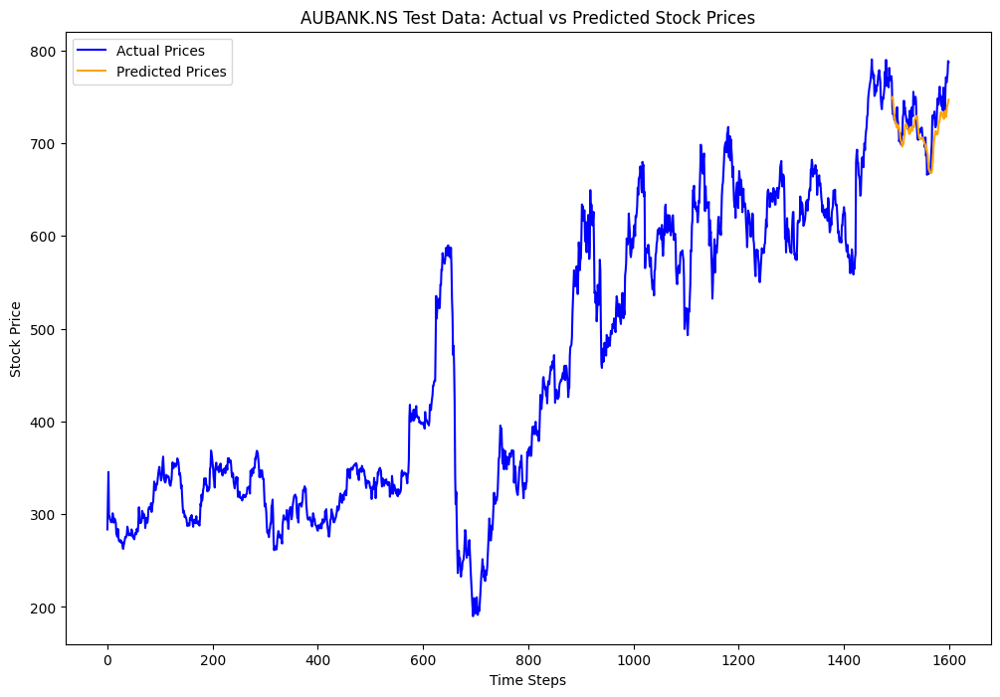

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0536, Validation Loss: 0.0851
Epoch [2/33], Loss: 0.1120, Validation Loss: 0.0096
Epoch [3/33], Loss: 0.0459, Validation Loss: 0.0826
Epoch [4/33], Loss: 0.0728, Validation Loss: 0.0192
Epoch [5/33], Loss: 0.0266, Validation Loss: 0.0021
Epoch [6/33], Loss: 0.0164, Validation Loss: 0.0280
Epoch [7/33], Loss: 0.0148, Validation Loss: 0.0035
Epoch [8/33], Loss: 0.0042, Validation Loss: 0.0004
Epoch [9/33], Loss: 0.0033, Validation Loss: 0.0005
Epoch [10/33], Loss: 0.0040, Validation Loss: 0.0015
Epoch [11/33], Loss: 0.0048, Validation Loss: 0.0013
Epoch [12/33], Loss: 0.0057, Validation Loss: 0.0027
Epoch [13/33], Loss: 0.0063, Validation Loss: 0.0035
Epoch [14/33], Loss: 0.0063, Validation Loss: 0.0028
Epoch [15/33], Loss: 0.0059, Validation Loss: 0.0030
Epoch [16/33], Loss: 0.0053, Validation Loss: 0.0023
Epoch [17/33], Loss: 0.0046, Validation Loss: 0.0013
Epoch [18/33], Loss: 0.0045, Validation Loss: 0.0013
Epoch [19/33], Loss: 0.0051, Validation Loss: 0.0021
Ep

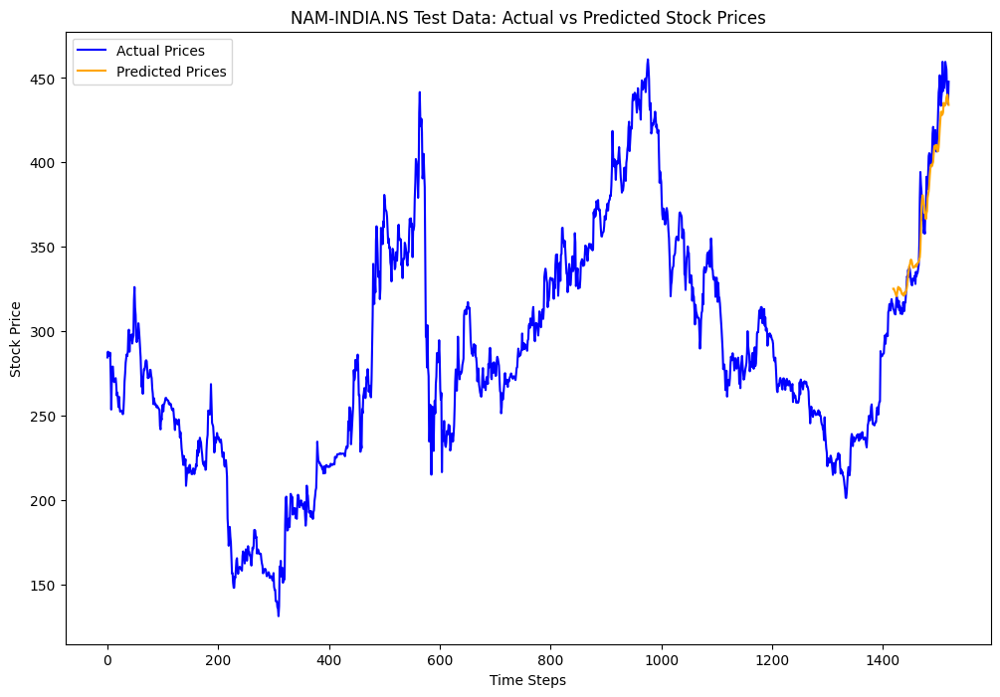

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.2104, Validation Loss: 0.0087
Epoch [2/33], Loss: 0.0879, Validation Loss: 0.0105
Epoch [3/33], Loss: 0.0452, Validation Loss: 0.0493
Epoch [4/33], Loss: 0.0655, Validation Loss: 0.0175
Epoch [5/33], Loss: 0.0548, Validation Loss: 0.0007
Epoch [6/33], Loss: 0.0412, Validation Loss: 0.0014
Epoch [7/33], Loss: 0.0306, Validation Loss: 0.0071
Epoch [8/33], Loss: 0.0317, Validation Loss: 0.0046
Epoch [9/33], Loss: 0.0266, Validation Loss: 0.0007
Epoch [10/33], Loss: 0.0086, Validation Loss: 0.0225
Epoch [11/33], Loss: 0.0246, Validation Loss: 0.0011
Epoch [12/33], Loss: 0.0083, Validation Loss: 0.0029
Epoch [13/33], Loss: 0.0064, Validation Loss: 0.0009
Epoch [14/33], Loss: 0.0054, Validation Loss: 0.0022
Epoch [15/33], Loss: 0.0052, Validation Loss: 0.0008
Epoch [16/33], Loss: 0.0047, Validation Loss: 0.0012
Epoch [17/33], Loss: 0.0049, Validation Loss: 0.0008
Epoch [18/33], Loss: 0.0047, Validation Loss: 0.0012
Epoch [19/33], Loss: 0.0046, Validation Loss: 0.0008
Ep

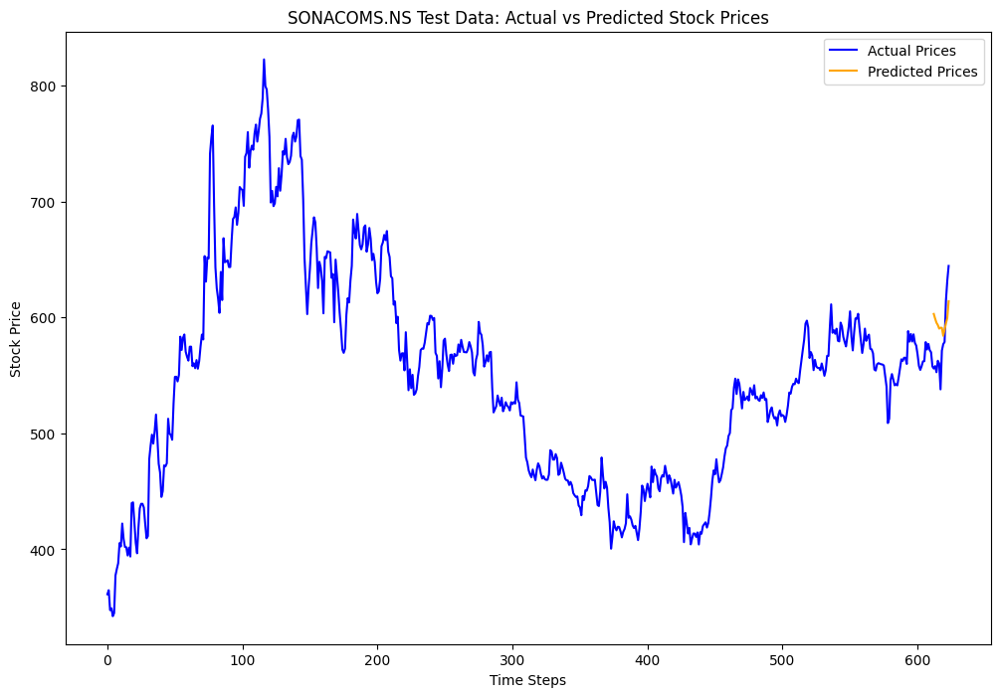

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.1159, Validation Loss: 0.0739
Epoch [2/33], Loss: 0.1391, Validation Loss: 0.1377
Epoch [3/33], Loss: 0.0831, Validation Loss: 0.0470
Epoch [4/33], Loss: 0.0476, Validation Loss: 0.0356
Epoch [5/33], Loss: 0.0264, Validation Loss: 0.0080
Epoch [6/33], Loss: 0.0620, Validation Loss: 0.1086
Epoch [7/33], Loss: 0.0935, Validation Loss: 0.1481
Epoch [8/33], Loss: 0.0518, Validation Loss: 0.0392
Epoch [9/33], Loss: 0.0274, Validation Loss: 0.0019
Epoch [10/33], Loss: 0.0057, Validation Loss: 0.0018
Epoch [11/33], Loss: 0.0141, Validation Loss: 0.0027
Epoch [12/33], Loss: 0.0083, Validation Loss: 0.0003
Epoch [13/33], Loss: 0.0141, Validation Loss: 0.0072
Epoch [14/33], Loss: 0.0104, Validation Loss: 0.0009
Epoch [15/33], Loss: 0.0034, Validation Loss: 0.0006
Epoch [16/33], Loss: 0.0030, Validation Loss: 0.0006
Epoch [17/33], Loss: 0.0026, Validation Loss: 0.0007
Epoch [18/33], Loss: 0.0029, Validation Loss: 0.0007
Epoch [19/33], Loss: 0.0034, Validation Loss: 0.0003
Ep

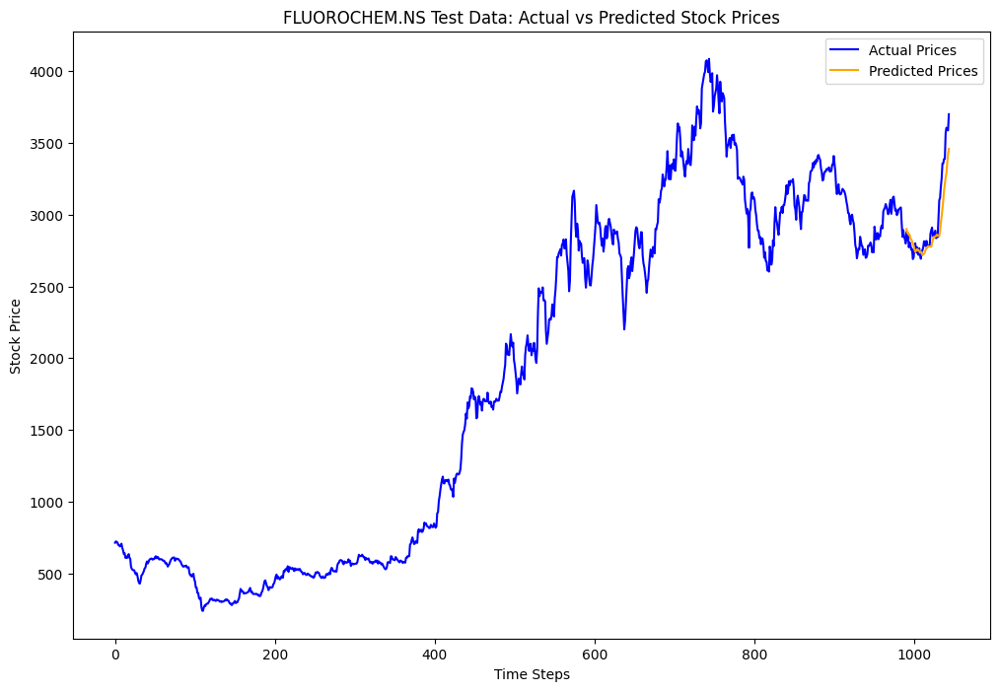

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0786, Validation Loss: 0.0286
Epoch [2/33], Loss: 0.1065, Validation Loss: 0.0090
Epoch [3/33], Loss: 0.0800, Validation Loss: 0.0077
Epoch [4/33], Loss: 0.0531, Validation Loss: 0.0141
Epoch [5/33], Loss: 0.0266, Validation Loss: 0.0029
Epoch [6/33], Loss: 0.0166, Validation Loss: 0.0028
Epoch [7/33], Loss: 0.0103, Validation Loss: 0.0061
Epoch [8/33], Loss: 0.0078, Validation Loss: 0.0042
Epoch [9/33], Loss: 0.0050, Validation Loss: 0.0033
Epoch [10/33], Loss: 0.0045, Validation Loss: 0.0041
Epoch [11/33], Loss: 0.0047, Validation Loss: 0.0033
Epoch [12/33], Loss: 0.0019, Validation Loss: 0.0012
Epoch [13/33], Loss: 0.0019, Validation Loss: 0.0010
Epoch [14/33], Loss: 0.0022, Validation Loss: 0.0013
Epoch [15/33], Loss: 0.0023, Validation Loss: 0.0012
Epoch [16/33], Loss: 0.0025, Validation Loss: 0.0019
Epoch [17/33], Loss: 0.0027, Validation Loss: 0.0023
Epoch [18/33], Loss: 0.0028, Validation Loss: 0.0022
Epoch [19/33], Loss: 0.0031, Validation Loss: 0.0023
Ep

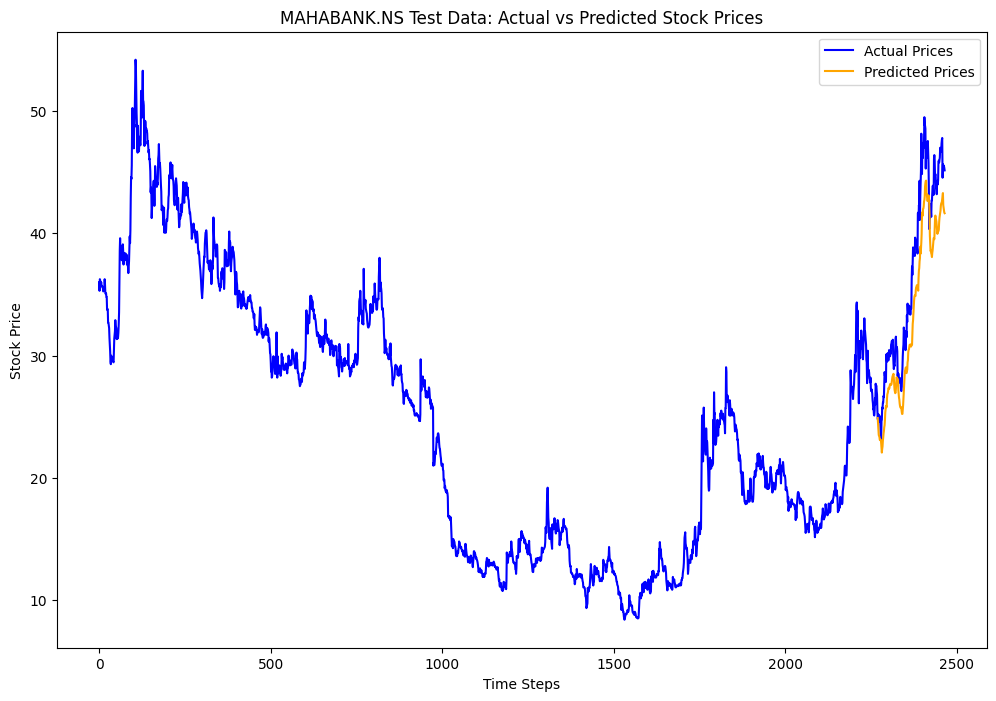

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0406, Validation Loss: 0.0071
Epoch [2/33], Loss: 0.0800, Validation Loss: 0.0290
Epoch [3/33], Loss: 0.0490, Validation Loss: 0.0177
Epoch [4/33], Loss: 0.0221, Validation Loss: 0.0184
Epoch [5/33], Loss: 0.0189, Validation Loss: 0.0572
Epoch [6/33], Loss: 0.0196, Validation Loss: 0.0022
Epoch [7/33], Loss: 0.0136, Validation Loss: 0.0019
Epoch [8/33], Loss: 0.0048, Validation Loss: 0.0020
Epoch [9/33], Loss: 0.0085, Validation Loss: 0.0263
Epoch [10/33], Loss: 0.0198, Validation Loss: 0.0028
Epoch [11/33], Loss: 0.0117, Validation Loss: 0.0005
Epoch [12/33], Loss: 0.0028, Validation Loss: 0.0008
Epoch [13/33], Loss: 0.0033, Validation Loss: 0.0025
Epoch [14/33], Loss: 0.0074, Validation Loss: 0.0007
Epoch [15/33], Loss: 0.0108, Validation Loss: 0.0172
Epoch [16/33], Loss: 0.0197, Validation Loss: 0.0022
Epoch [17/33], Loss: 0.0126, Validation Loss: 0.0014
Epoch [18/33], Loss: 0.0031, Validation Loss: 0.0009
Epoch [19/33], Loss: 0.0041, Validation Loss: 0.0011
Ep

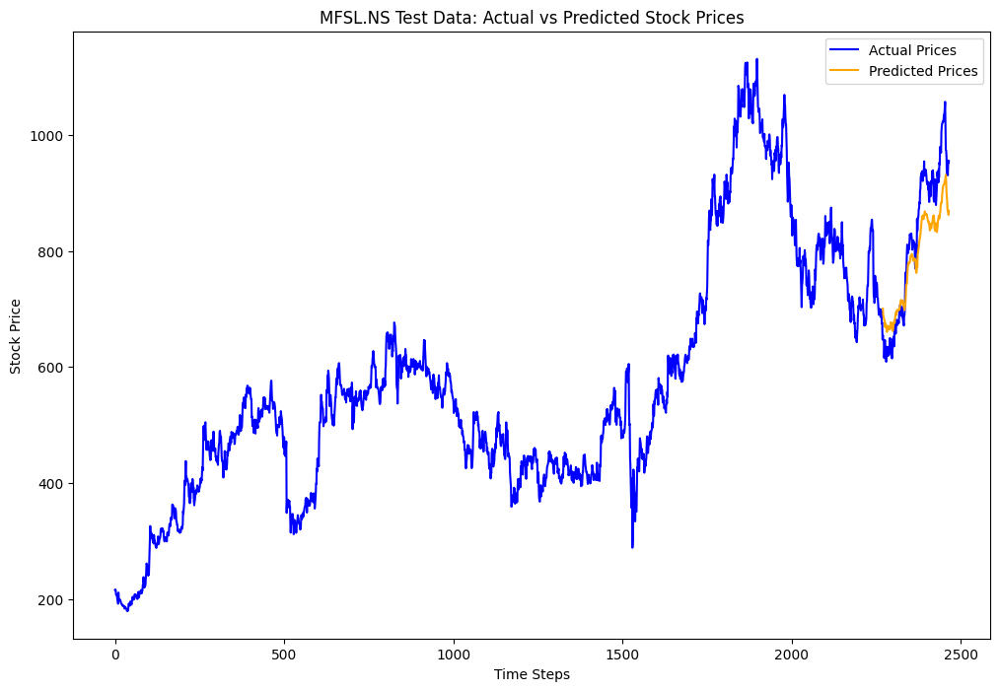

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0461, Validation Loss: 0.0300
Epoch [2/33], Loss: 0.1931, Validation Loss: 0.0335
Epoch [3/33], Loss: 0.0534, Validation Loss: 0.0026
Epoch [4/33], Loss: 0.0183, Validation Loss: 0.0230
Epoch [5/33], Loss: 0.0053, Validation Loss: 0.0231
Epoch [6/33], Loss: 0.0050, Validation Loss: 0.0137
Epoch [7/33], Loss: 0.0184, Validation Loss: 0.0017
Epoch [8/33], Loss: 0.0224, Validation Loss: 0.0149
Epoch [9/33], Loss: 0.0081, Validation Loss: 0.0369
Epoch [10/33], Loss: 0.0107, Validation Loss: 0.0145
Epoch [11/33], Loss: 0.0053, Validation Loss: 0.0145
Epoch [12/33], Loss: 0.0092, Validation Loss: 0.0075
Epoch [13/33], Loss: 0.0047, Validation Loss: 0.0038
Epoch [14/33], Loss: 0.0032, Validation Loss: 0.0019
Epoch [15/33], Loss: 0.0034, Validation Loss: 0.0017
Epoch [16/33], Loss: 0.0039, Validation Loss: 0.0047
Epoch [17/33], Loss: 0.0040, Validation Loss: 0.0056
Epoch [18/33], Loss: 0.0032, Validation Loss: 0.0112
Epoch [19/33], Loss: 0.0033, Validation Loss: 0.0091
Ep

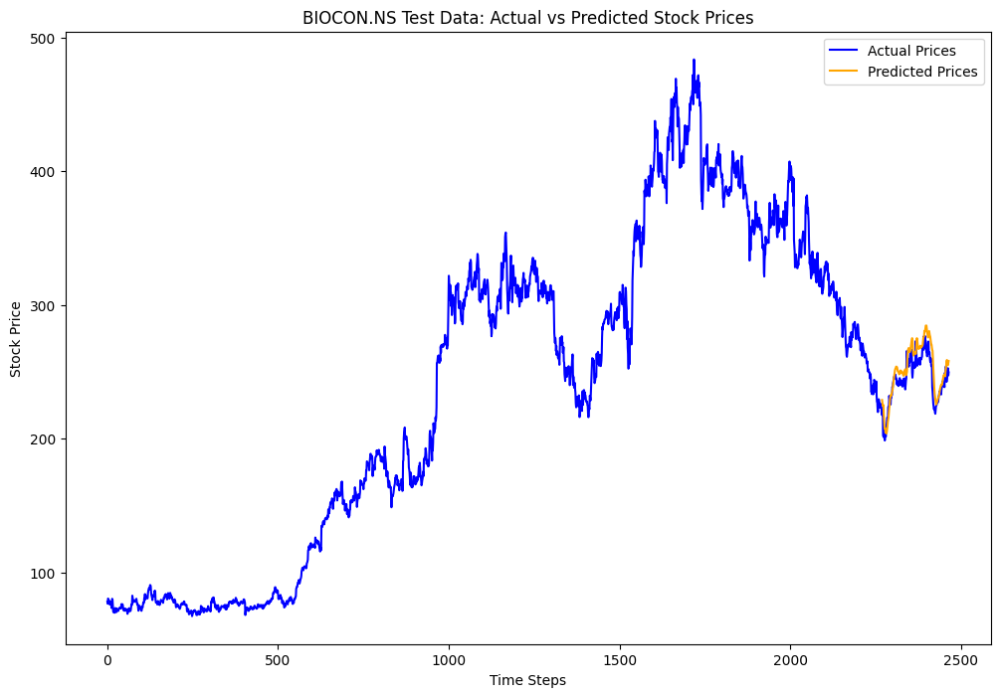

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0214, Validation Loss: 0.1589
Epoch [2/33], Loss: 0.0267, Validation Loss: 0.1565
Epoch [3/33], Loss: 0.0290, Validation Loss: 0.1826
Epoch [4/33], Loss: 0.0271, Validation Loss: 0.1949
Epoch [5/33], Loss: 0.0243, Validation Loss: 0.1898
Epoch [6/33], Loss: 0.0232, Validation Loss: 0.1788
Epoch [7/33], Loss: 0.0185, Validation Loss: 0.0850
Epoch [8/33], Loss: 0.0394, Validation Loss: 0.1427
Epoch [9/33], Loss: 0.0245, Validation Loss: 0.1983
Epoch [10/33], Loss: 0.0210, Validation Loss: 0.1686
Epoch [11/33], Loss: 0.0118, Validation Loss: 0.0132
Epoch [12/33], Loss: 0.0272, Validation Loss: 0.1197
Epoch [13/33], Loss: 0.0185, Validation Loss: 0.1219
Epoch [14/33], Loss: 0.0350, Validation Loss: 0.2063
Epoch [15/33], Loss: 0.0226, Validation Loss: 0.1888
Epoch [16/33], Loss: 0.0216, Validation Loss: 0.1765
Epoch [17/33], Loss: 0.0204, Validation Loss: 0.1506
Epoch [18/33], Loss: 0.0176, Validation Loss: 0.1129
Epoch [19/33], Loss: 0.0110, Validation Loss: 0.0333
Ep

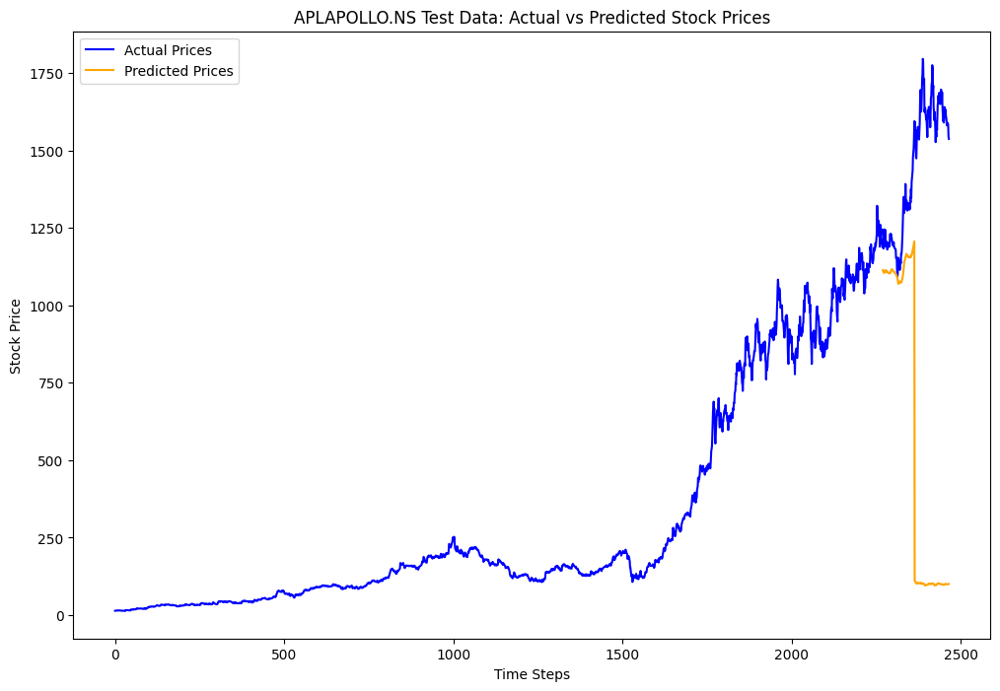

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0399, Validation Loss: 0.0999
Epoch [2/33], Loss: 0.0345, Validation Loss: 0.0971
Epoch [3/33], Loss: 0.0330, Validation Loss: 0.1104
Epoch [4/33], Loss: 0.0252, Validation Loss: 0.0561
Epoch [5/33], Loss: 0.0139, Validation Loss: 0.0016
Epoch [6/33], Loss: 0.0106, Validation Loss: 0.0625
Epoch [7/33], Loss: 0.0162, Validation Loss: 0.0632
Epoch [8/33], Loss: 0.0089, Validation Loss: 0.0031
Epoch [9/33], Loss: 0.0050, Validation Loss: 0.0213
Epoch [10/33], Loss: 0.0094, Validation Loss: 0.0337
Epoch [11/33], Loss: 0.0041, Validation Loss: 0.0017
Epoch [12/33], Loss: 0.0015, Validation Loss: 0.0015
Epoch [13/33], Loss: 0.0014, Validation Loss: 0.0013
Epoch [14/33], Loss: 0.0014, Validation Loss: 0.0015
Epoch [15/33], Loss: 0.0019, Validation Loss: 0.0013
Epoch [16/33], Loss: 0.0017, Validation Loss: 0.0013
Epoch [17/33], Loss: 0.0022, Validation Loss: 0.0010
Epoch [18/33], Loss: 0.0026, Validation Loss: 0.0028
Epoch [19/33], Loss: 0.0033, Validation Loss: 0.0017
Ep

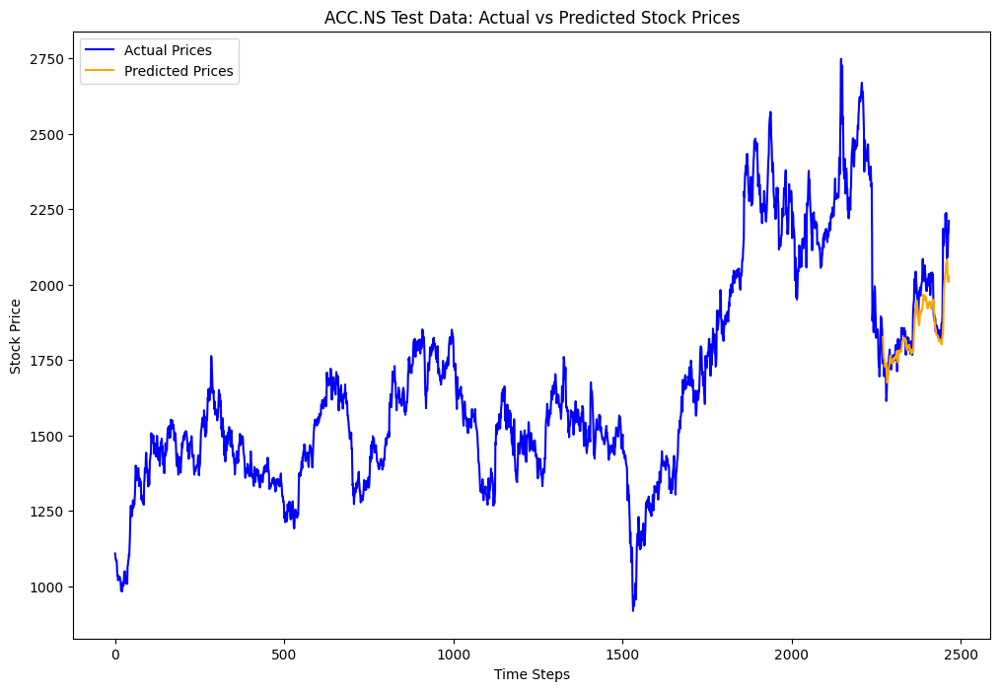

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0143, Validation Loss: 0.0684
Epoch [2/33], Loss: 0.0357, Validation Loss: 0.1023
Epoch [3/33], Loss: 0.0301, Validation Loss: 0.1204
Epoch [4/33], Loss: 0.0266, Validation Loss: 0.1211
Epoch [5/33], Loss: 0.0234, Validation Loss: 0.1002
Epoch [6/33], Loss: 0.0161, Validation Loss: 0.0181
Epoch [7/33], Loss: 0.0594, Validation Loss: 0.1310
Epoch [8/33], Loss: 0.0226, Validation Loss: 0.1166
Epoch [9/33], Loss: 0.0205, Validation Loss: 0.0867
Epoch [10/33], Loss: 0.0108, Validation Loss: 0.0062
Epoch [11/33], Loss: 0.0117, Validation Loss: 0.0309
Epoch [12/33], Loss: 0.0066, Validation Loss: 0.0292
Epoch [13/33], Loss: 0.0081, Validation Loss: 0.0006
Epoch [14/33], Loss: 0.0023, Validation Loss: 0.0017
Epoch [15/33], Loss: 0.0020, Validation Loss: 0.0057
Epoch [16/33], Loss: 0.0032, Validation Loss: 0.0015
Epoch [17/33], Loss: 0.0007, Validation Loss: 0.0009
Epoch [18/33], Loss: 0.0012, Validation Loss: 0.0011
Epoch [19/33], Loss: 0.0006, Validation Loss: 0.0008
Ep

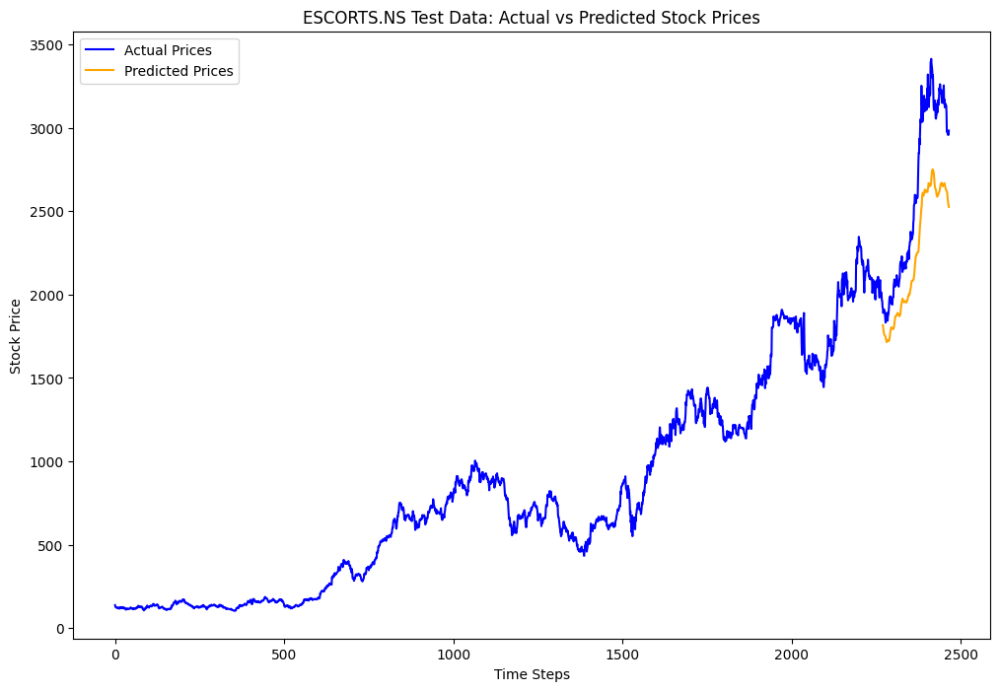

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0008, Validation Loss: 0.0154
Epoch [2/33], Loss: 0.0018, Validation Loss: 0.0209
Epoch [3/33], Loss: 0.0013, Validation Loss: 0.0192
Epoch [4/33], Loss: 0.0016, Validation Loss: 0.0169
Epoch [5/33], Loss: 0.0016, Validation Loss: 0.0135
Epoch [6/33], Loss: 0.0014, Validation Loss: 0.0119
Epoch [7/33], Loss: 0.0014, Validation Loss: 0.0120
Epoch [8/33], Loss: 0.0013, Validation Loss: 0.0121
Epoch [9/33], Loss: 0.0013, Validation Loss: 0.0122
Epoch [10/33], Loss: 0.0013, Validation Loss: 0.0121
Epoch [11/33], Loss: 0.0012, Validation Loss: 0.0121
Epoch [12/33], Loss: 0.0012, Validation Loss: 0.0121
Epoch [13/33], Loss: 0.0012, Validation Loss: 0.0122
Epoch [14/33], Loss: 0.0012, Validation Loss: 0.0122
Epoch [15/33], Loss: 0.0012, Validation Loss: 0.0123
Epoch [16/33], Loss: 0.0012, Validation Loss: 0.0122
Epoch [17/33], Loss: 0.0012, Validation Loss: 0.0123
Epoch [18/33], Loss: 0.0012, Validation Loss: 0.0123
Epoch [19/33], Loss: 0.0012, Validation Loss: 0.0123
Ep

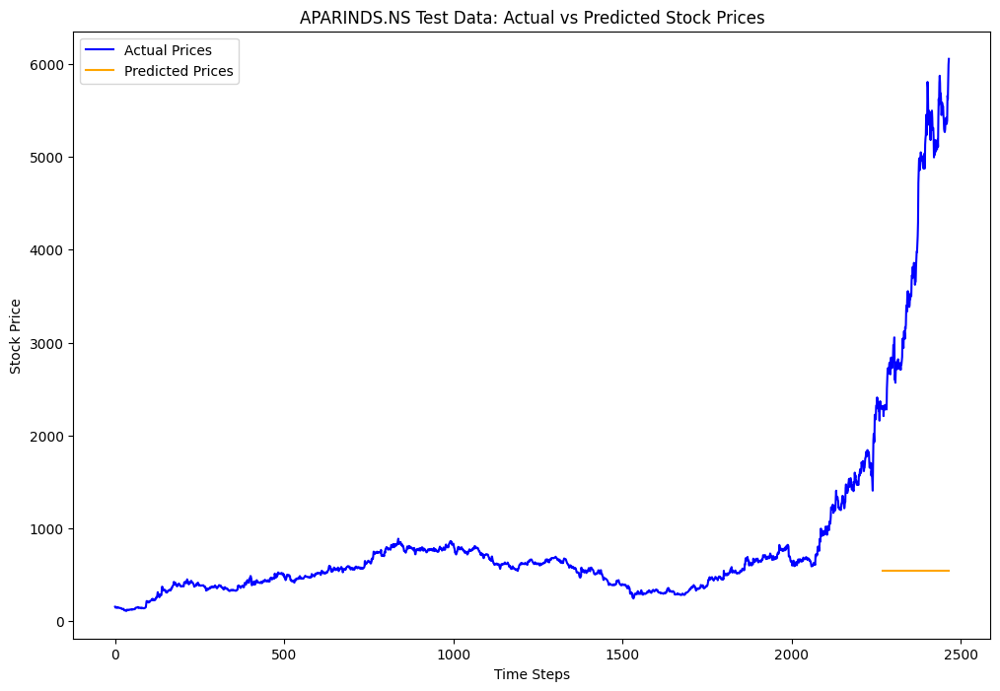

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0356, Validation Loss: 0.0224
Epoch [2/33], Loss: 0.0353, Validation Loss: 0.0216
Epoch [3/33], Loss: 0.0161, Validation Loss: 0.0188
Epoch [4/33], Loss: 0.0213, Validation Loss: 0.0014
Epoch [5/33], Loss: 0.0133, Validation Loss: 0.0097
Epoch [6/33], Loss: 0.0038, Validation Loss: 0.0030
Epoch [7/33], Loss: 0.0076, Validation Loss: 0.0009
Epoch [8/33], Loss: 0.0047, Validation Loss: 0.0011
Epoch [9/33], Loss: 0.0017, Validation Loss: 0.0006
Epoch [10/33], Loss: 0.0016, Validation Loss: 0.0005
Epoch [11/33], Loss: 0.0017, Validation Loss: 0.0004
Epoch [12/33], Loss: 0.0021, Validation Loss: 0.0009
Epoch [13/33], Loss: 0.0016, Validation Loss: 0.0010
Epoch [14/33], Loss: 0.0022, Validation Loss: 0.0003
Epoch [15/33], Loss: 0.0015, Validation Loss: 0.0003
Epoch [16/33], Loss: 0.0017, Validation Loss: 0.0004
Epoch [17/33], Loss: 0.0023, Validation Loss: 0.0004
Epoch [18/33], Loss: 0.0015, Validation Loss: 0.0013
Epoch [19/33], Loss: 0.0017, Validation Loss: 0.0030
Ep

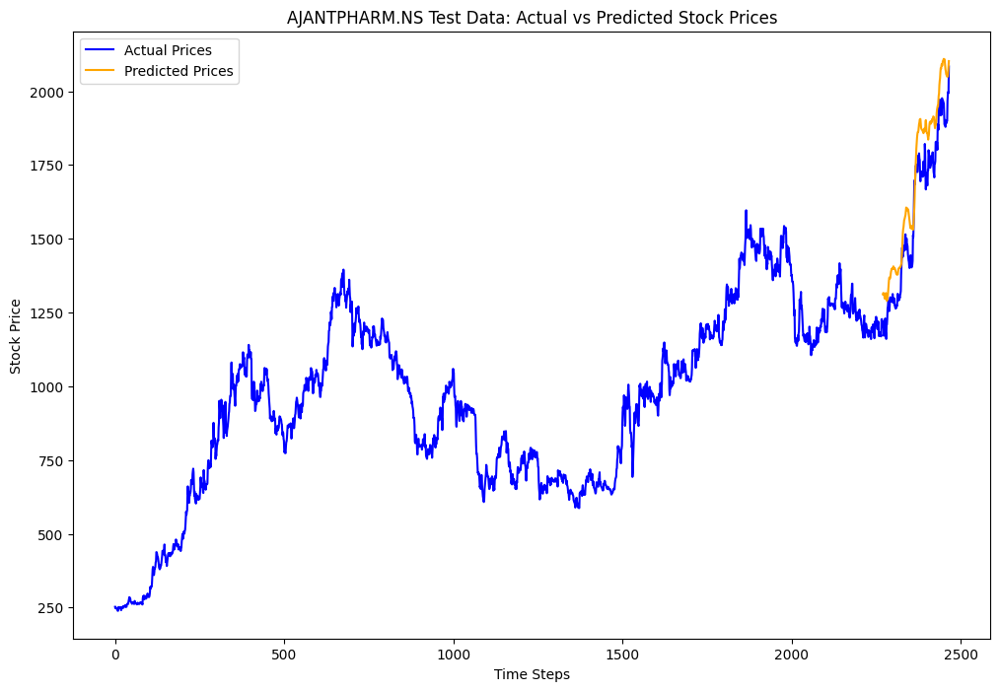

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0327, Validation Loss: 0.0525
Epoch [2/33], Loss: 0.1108, Validation Loss: 0.3611
Epoch [3/33], Loss: 0.0622, Validation Loss: 0.3059
Epoch [4/33], Loss: 0.0575, Validation Loss: 0.2356
Epoch [5/33], Loss: 0.0333, Validation Loss: 0.1738
Epoch [6/33], Loss: 0.0472, Validation Loss: 0.1985
Epoch [7/33], Loss: 0.0118, Validation Loss: 0.0065
Epoch [8/33], Loss: 0.0280, Validation Loss: 0.0629
Epoch [9/33], Loss: 0.0458, Validation Loss: 0.2239
Epoch [10/33], Loss: 0.0211, Validation Loss: 0.0489
Epoch [11/33], Loss: 0.0069, Validation Loss: 0.0019
Epoch [12/33], Loss: 0.0209, Validation Loss: 0.0448
Epoch [13/33], Loss: 0.0067, Validation Loss: 0.0056
Epoch [14/33], Loss: 0.0045, Validation Loss: 0.0021
Epoch [15/33], Loss: 0.0051, Validation Loss: 0.0037
Epoch [16/33], Loss: 0.0039, Validation Loss: 0.0022
Epoch [17/33], Loss: 0.0037, Validation Loss: 0.0016
Epoch [18/33], Loss: 0.0041, Validation Loss: 0.0017
Epoch [19/33], Loss: 0.0044, Validation Loss: 0.0027
Ep

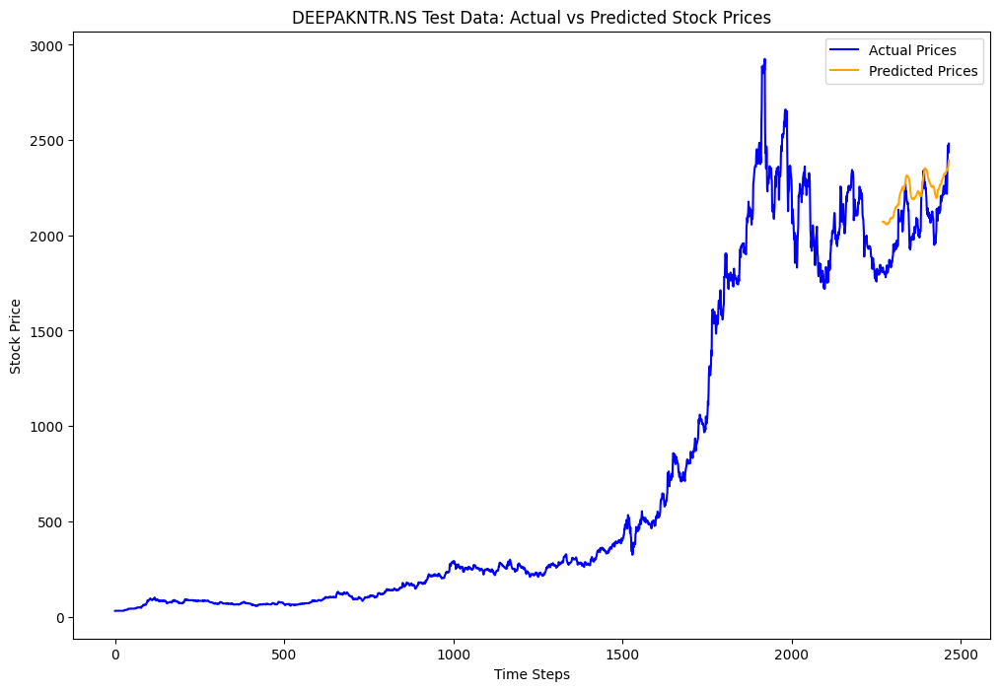

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0062, Validation Loss: 0.0077
Epoch [2/33], Loss: 0.1665, Validation Loss: 0.1828
Epoch [3/33], Loss: 0.0952, Validation Loss: 0.1307
Epoch [4/33], Loss: 0.0748, Validation Loss: 0.0098
Epoch [5/33], Loss: 0.0337, Validation Loss: 0.0117
Epoch [6/33], Loss: 0.0249, Validation Loss: 0.0074
Epoch [7/33], Loss: 0.0048, Validation Loss: 0.0241
Epoch [8/33], Loss: 0.0168, Validation Loss: 0.0016
Epoch [9/33], Loss: 0.0210, Validation Loss: 0.0446
Epoch [10/33], Loss: 0.0172, Validation Loss: 0.0349
Epoch [11/33], Loss: 0.0696, Validation Loss: 0.0138
Epoch [12/33], Loss: 0.0262, Validation Loss: 0.0429
Epoch [13/33], Loss: 0.0191, Validation Loss: 0.0030
Epoch [14/33], Loss: 0.0171, Validation Loss: 0.0438
Epoch [15/33], Loss: 0.0377, Validation Loss: 0.0119
Epoch [16/33], Loss: 0.0222, Validation Loss: 0.0104
Epoch [17/33], Loss: 0.0144, Validation Loss: 0.0008
Epoch [18/33], Loss: 0.0132, Validation Loss: 0.0058
Epoch [19/33], Loss: 0.0170, Validation Loss: 0.0006
Ep

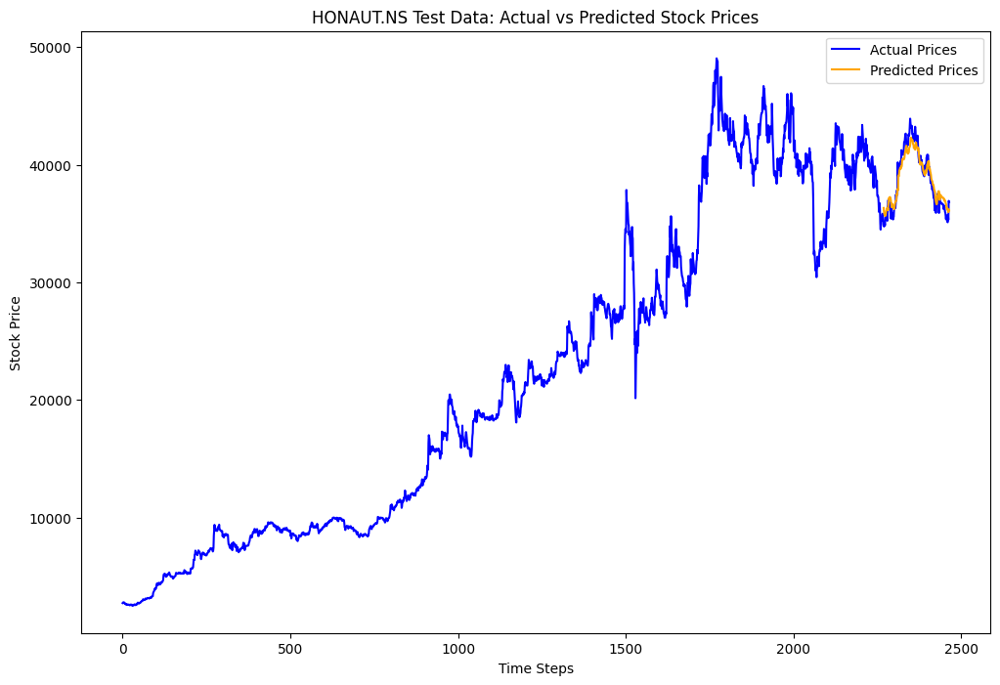

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0043, Validation Loss: 0.0692
Epoch [2/33], Loss: 0.0105, Validation Loss: 0.0681
Epoch [3/33], Loss: 0.0111, Validation Loss: 0.0874
Epoch [4/33], Loss: 0.0097, Validation Loss: 0.0989
Epoch [5/33], Loss: 0.0082, Validation Loss: 0.0971
Epoch [6/33], Loss: 0.0082, Validation Loss: 0.0964
Epoch [7/33], Loss: 0.0081, Validation Loss: 0.0957
Epoch [8/33], Loss: 0.0079, Validation Loss: 0.0953
Epoch [9/33], Loss: 0.0078, Validation Loss: 0.0927
Epoch [10/33], Loss: 0.0079, Validation Loss: 0.0885
Epoch [11/33], Loss: 0.0077, Validation Loss: 0.0829
Epoch [12/33], Loss: 0.0074, Validation Loss: 0.0621
Epoch [13/33], Loss: 0.0045, Validation Loss: 0.0031
Epoch [14/33], Loss: 0.0053, Validation Loss: 0.0023
Epoch [15/33], Loss: 0.0037, Validation Loss: 0.0032
Epoch [16/33], Loss: 0.0043, Validation Loss: 0.0008
Epoch [17/33], Loss: 0.0023, Validation Loss: 0.0124
Epoch [18/33], Loss: 0.0072, Validation Loss: 0.0975
Epoch [19/33], Loss: 0.0064, Validation Loss: 0.0717
Ep

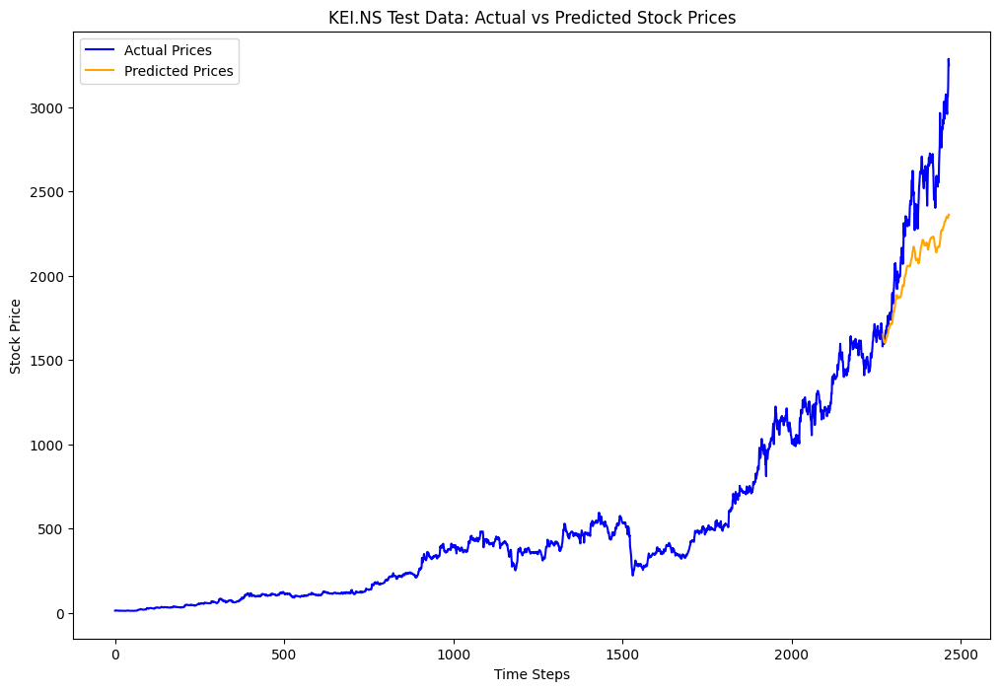

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0447, Validation Loss: 0.0047
Epoch [2/33], Loss: 0.0491, Validation Loss: 0.0265
Epoch [3/33], Loss: 0.0421, Validation Loss: 0.0306
Epoch [4/33], Loss: 0.0382, Validation Loss: 0.0272
Epoch [5/33], Loss: 0.0352, Validation Loss: 0.0194
Epoch [6/33], Loss: 0.0292, Validation Loss: 0.0182
Epoch [7/33], Loss: 0.0278, Validation Loss: 0.0053
Epoch [8/33], Loss: 0.0139, Validation Loss: 0.0008
Epoch [9/33], Loss: 0.0052, Validation Loss: 0.0038
Epoch [10/33], Loss: 0.0046, Validation Loss: 0.0006
Epoch [11/33], Loss: 0.0019, Validation Loss: 0.0004
Epoch [12/33], Loss: 0.0015, Validation Loss: 0.0006
Epoch [13/33], Loss: 0.0016, Validation Loss: 0.0004
Epoch [14/33], Loss: 0.0013, Validation Loss: 0.0003
Epoch [15/33], Loss: 0.0014, Validation Loss: 0.0004
Epoch [16/33], Loss: 0.0013, Validation Loss: 0.0004
Epoch [17/33], Loss: 0.0012, Validation Loss: 0.0003
Epoch [18/33], Loss: 0.0012, Validation Loss: 0.0003
Epoch [19/33], Loss: 0.0013, Validation Loss: 0.0003
Ep

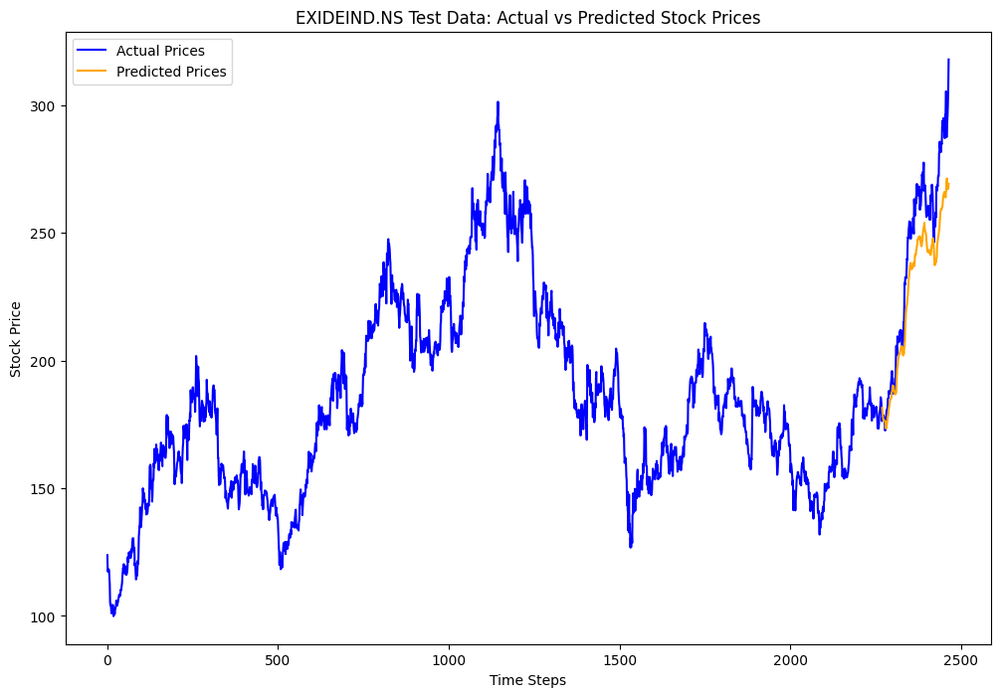

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0228, Validation Loss: 0.0610
Epoch [2/33], Loss: 0.1324, Validation Loss: 0.1693
Epoch [3/33], Loss: 0.0474, Validation Loss: 0.0895
Epoch [4/33], Loss: 0.0549, Validation Loss: 0.0798
Epoch [5/33], Loss: 0.0249, Validation Loss: 0.0028
Epoch [6/33], Loss: 0.0277, Validation Loss: 0.0094
Epoch [7/33], Loss: 0.0209, Validation Loss: 0.0593
Epoch [8/33], Loss: 0.0218, Validation Loss: 0.0310
Epoch [9/33], Loss: 0.0116, Validation Loss: 0.0013
Epoch [10/33], Loss: 0.0018, Validation Loss: 0.0017
Epoch [11/33], Loss: 0.0024, Validation Loss: 0.0006
Epoch [12/33], Loss: 0.0061, Validation Loss: 0.0101
Epoch [13/33], Loss: 0.0077, Validation Loss: 0.0020
Epoch [14/33], Loss: 0.0105, Validation Loss: 0.0064
Epoch [15/33], Loss: 0.0087, Validation Loss: 0.0043
Epoch [16/33], Loss: 0.0085, Validation Loss: 0.0019
Epoch [17/33], Loss: 0.0064, Validation Loss: 0.0022
Epoch [18/33], Loss: 0.0073, Validation Loss: 0.0021
Epoch [19/33], Loss: 0.0066, Validation Loss: 0.0025
Ep

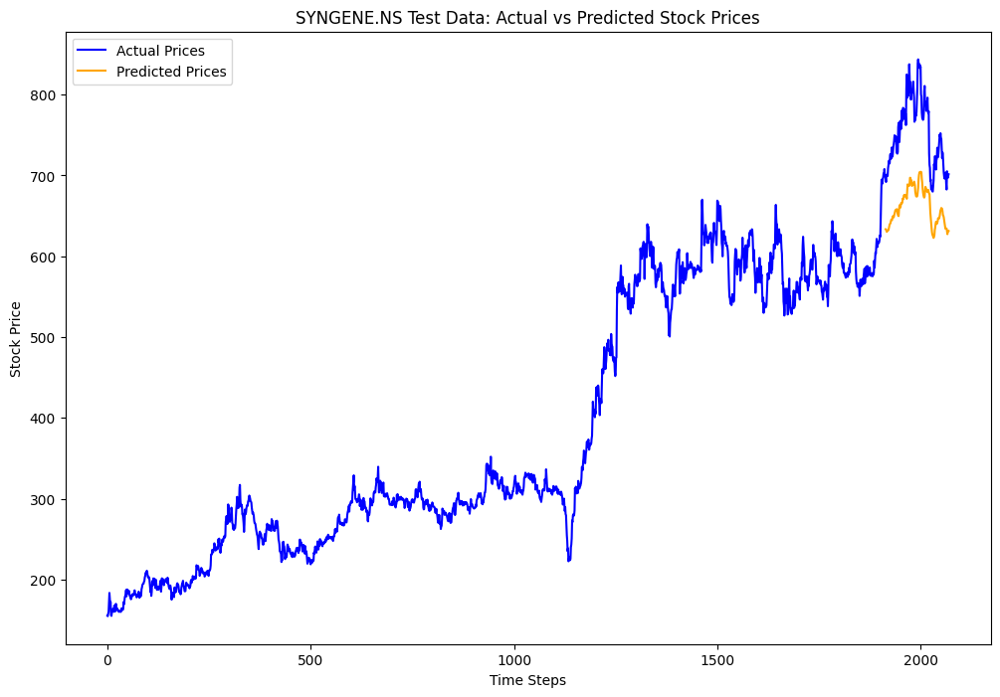

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0195, Validation Loss: 0.0349
Epoch [2/33], Loss: 0.0079, Validation Loss: 0.0180
Epoch [3/33], Loss: 0.0047, Validation Loss: 0.0206
Epoch [4/33], Loss: 0.0053, Validation Loss: 0.0197
Epoch [5/33], Loss: 0.0052, Validation Loss: 0.0196
Epoch [6/33], Loss: 0.0051, Validation Loss: 0.0194
Epoch [7/33], Loss: 0.0050, Validation Loss: 0.0190
Epoch [8/33], Loss: 0.0049, Validation Loss: 0.0180
Epoch [9/33], Loss: 0.0045, Validation Loss: 0.0195
Epoch [10/33], Loss: 0.0048, Validation Loss: 0.0116
Epoch [11/33], Loss: 0.0033, Validation Loss: 0.0034
Epoch [12/33], Loss: 0.0015, Validation Loss: 0.0022
Epoch [13/33], Loss: 0.0013, Validation Loss: 0.0012
Epoch [14/33], Loss: 0.0011, Validation Loss: 0.0017
Epoch [15/33], Loss: 0.0008, Validation Loss: 0.0939
Epoch [16/33], Loss: 0.0043, Validation Loss: 0.0183
Epoch [17/33], Loss: 0.0052, Validation Loss: 0.0195
Epoch [18/33], Loss: 0.0046, Validation Loss: 0.0143
Epoch [19/33], Loss: 0.0039, Validation Loss: 0.0145
Ep

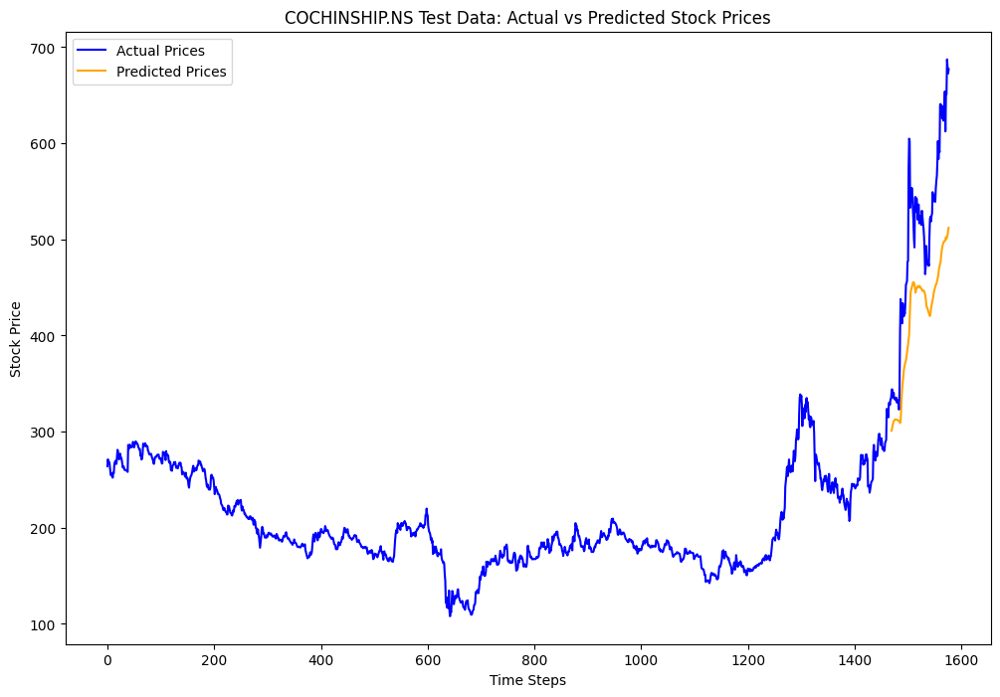

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0645, Validation Loss: 0.0042
Epoch [2/33], Loss: 0.1428, Validation Loss: 0.2694
Epoch [3/33], Loss: 0.0606, Validation Loss: 0.1083
Epoch [4/33], Loss: 0.0550, Validation Loss: 0.0523
Epoch [5/33], Loss: 0.0467, Validation Loss: 0.1612
Epoch [6/33], Loss: 0.0693, Validation Loss: 0.2232
Epoch [7/33], Loss: 0.0704, Validation Loss: 0.1590
Epoch [8/33], Loss: 0.0317, Validation Loss: 0.0184
Epoch [9/33], Loss: 0.0370, Validation Loss: 0.0098
Epoch [10/33], Loss: 0.0083, Validation Loss: 0.0174
Epoch [11/33], Loss: 0.0115, Validation Loss: 0.0077
Epoch [12/33], Loss: 0.0104, Validation Loss: 0.0035
Epoch [13/33], Loss: 0.0038, Validation Loss: 0.0017
Epoch [14/33], Loss: 0.0035, Validation Loss: 0.0013
Epoch [15/33], Loss: 0.0029, Validation Loss: 0.0015
Epoch [16/33], Loss: 0.0029, Validation Loss: 0.0010
Epoch [17/33], Loss: 0.0026, Validation Loss: 0.0008
Epoch [18/33], Loss: 0.0021, Validation Loss: 0.0017
Epoch [19/33], Loss: 0.0028, Validation Loss: 0.0007
Ep

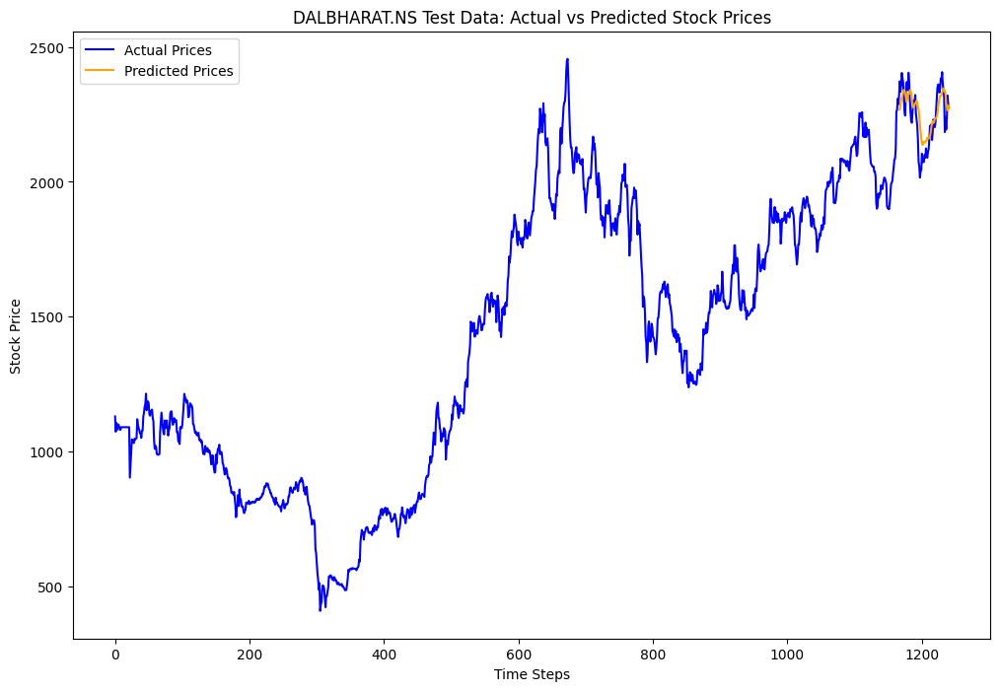

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0895, Validation Loss: 0.0728
Epoch [2/33], Loss: 0.0398, Validation Loss: 0.0080
Epoch [3/33], Loss: 0.0408, Validation Loss: 0.0033
Epoch [4/33], Loss: 0.0223, Validation Loss: 0.0539
Epoch [5/33], Loss: 0.0108, Validation Loss: 0.0075
Epoch [6/33], Loss: 0.0081, Validation Loss: 0.0121
Epoch [7/33], Loss: 0.0060, Validation Loss: 0.0034
Epoch [8/33], Loss: 0.0045, Validation Loss: 0.0039
Epoch [9/33], Loss: 0.0033, Validation Loss: 0.0022
Epoch [10/33], Loss: 0.0027, Validation Loss: 0.0010
Epoch [11/33], Loss: 0.0022, Validation Loss: 0.0008
Epoch [12/33], Loss: 0.0022, Validation Loss: 0.0014
Epoch [13/33], Loss: 0.0022, Validation Loss: 0.0012
Epoch [14/33], Loss: 0.0021, Validation Loss: 0.0014
Epoch [15/33], Loss: 0.0022, Validation Loss: 0.0007
Epoch [16/33], Loss: 0.0020, Validation Loss: 0.0006
Epoch [17/33], Loss: 0.0022, Validation Loss: 0.0029
Epoch [18/33], Loss: 0.0021, Validation Loss: 0.0007
Epoch [19/33], Loss: 0.0022, Validation Loss: 0.0010
Ep

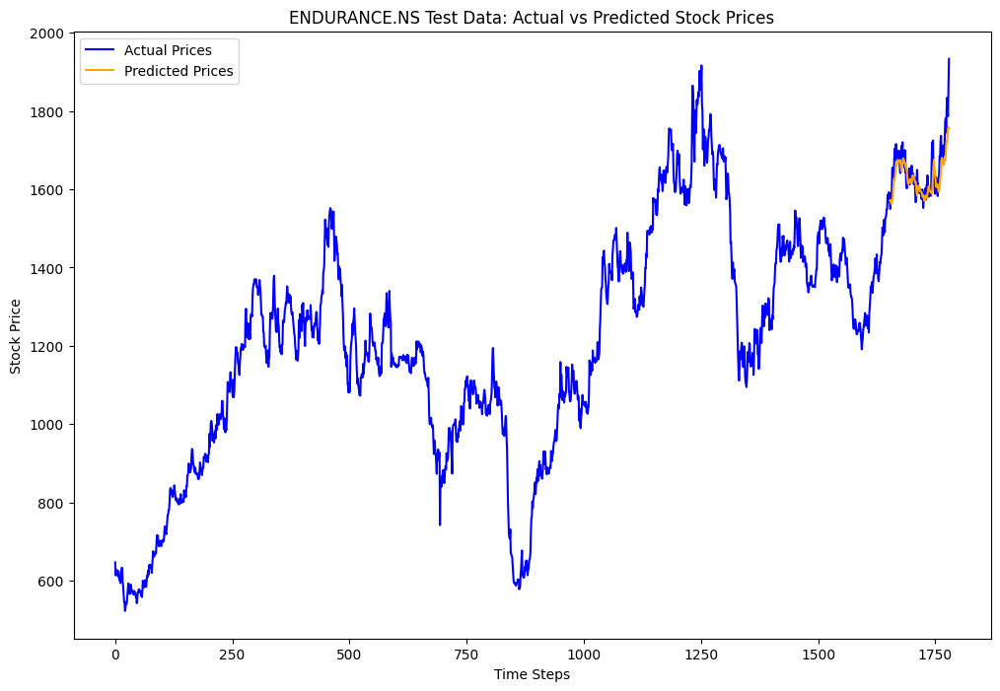

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0028, Validation Loss: 0.0493
Epoch [2/33], Loss: 0.0059, Validation Loss: 0.0478
Epoch [3/33], Loss: 0.0063, Validation Loss: 0.0586
Epoch [4/33], Loss: 0.0059, Validation Loss: 0.0698
Epoch [5/33], Loss: 0.0048, Validation Loss: 0.0699
Epoch [6/33], Loss: 0.0044, Validation Loss: 0.0695
Epoch [7/33], Loss: 0.0044, Validation Loss: 0.0697
Epoch [8/33], Loss: 0.0043, Validation Loss: 0.0698
Epoch [9/33], Loss: 0.0044, Validation Loss: 0.0697
Epoch [10/33], Loss: 0.0043, Validation Loss: 0.0697
Epoch [11/33], Loss: 0.0043, Validation Loss: 0.0696
Epoch [12/33], Loss: 0.0043, Validation Loss: 0.0694
Epoch [13/33], Loss: 0.0042, Validation Loss: 0.0690
Epoch [14/33], Loss: 0.0042, Validation Loss: 0.0685
Epoch [15/33], Loss: 0.0041, Validation Loss: 0.0672
Epoch [16/33], Loss: 0.0042, Validation Loss: 0.0667
Epoch [17/33], Loss: 0.0040, Validation Loss: 0.0607
Epoch [18/33], Loss: 0.0042, Validation Loss: 0.0654
Epoch [19/33], Loss: 0.0043, Validation Loss: 0.0652
Ep

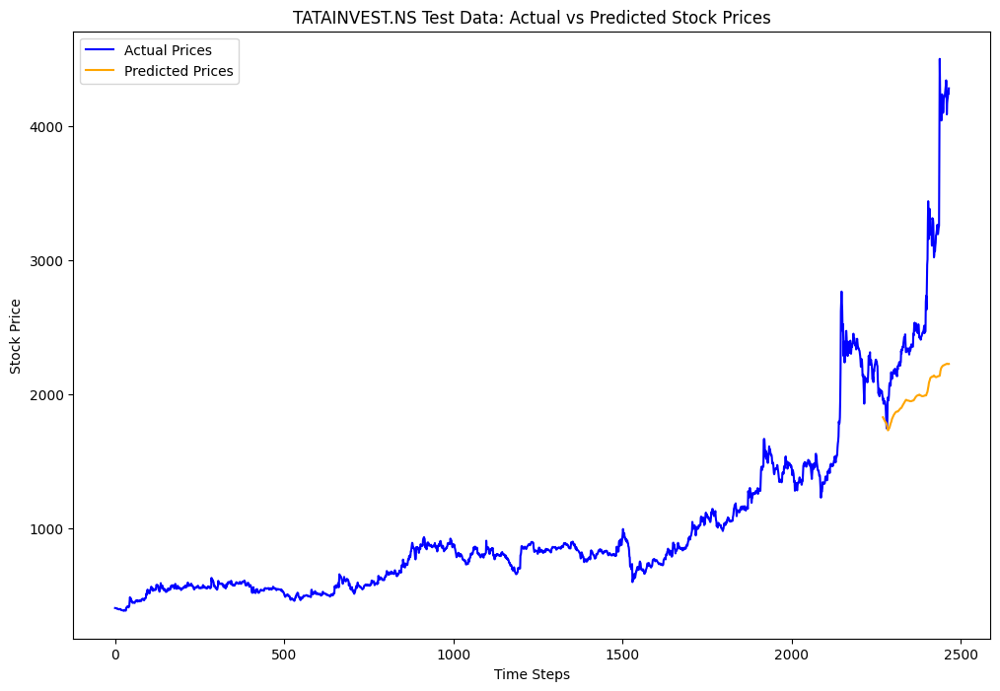

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0087, Validation Loss: 0.0380
Epoch [2/33], Loss: 0.0256, Validation Loss: 0.0154
Epoch [3/33], Loss: 0.0304, Validation Loss: 0.0482
Epoch [4/33], Loss: 0.0234, Validation Loss: 0.0669
Epoch [5/33], Loss: 0.0173, Validation Loss: 0.0533
Epoch [6/33], Loss: 0.0164, Validation Loss: 0.0291
Epoch [7/33], Loss: 0.0153, Validation Loss: 0.0099
Epoch [8/33], Loss: 0.0239, Validation Loss: 0.0799
Epoch [9/33], Loss: 0.0050, Validation Loss: 0.0118
Epoch [10/33], Loss: 0.0085, Validation Loss: 0.0286
Epoch [11/33], Loss: 0.0068, Validation Loss: 0.0065
Epoch [12/33], Loss: 0.0010, Validation Loss: 0.0038
Epoch [13/33], Loss: 0.0008, Validation Loss: 0.0016
Epoch [14/33], Loss: 0.0007, Validation Loss: 0.0011
Epoch [15/33], Loss: 0.0006, Validation Loss: 0.0021
Epoch [16/33], Loss: 0.0006, Validation Loss: 0.0018
Epoch [17/33], Loss: 0.0005, Validation Loss: 0.0011
Epoch [18/33], Loss: 0.0005, Validation Loss: 0.0012
Epoch [19/33], Loss: 0.0006, Validation Loss: 0.0009
Ep

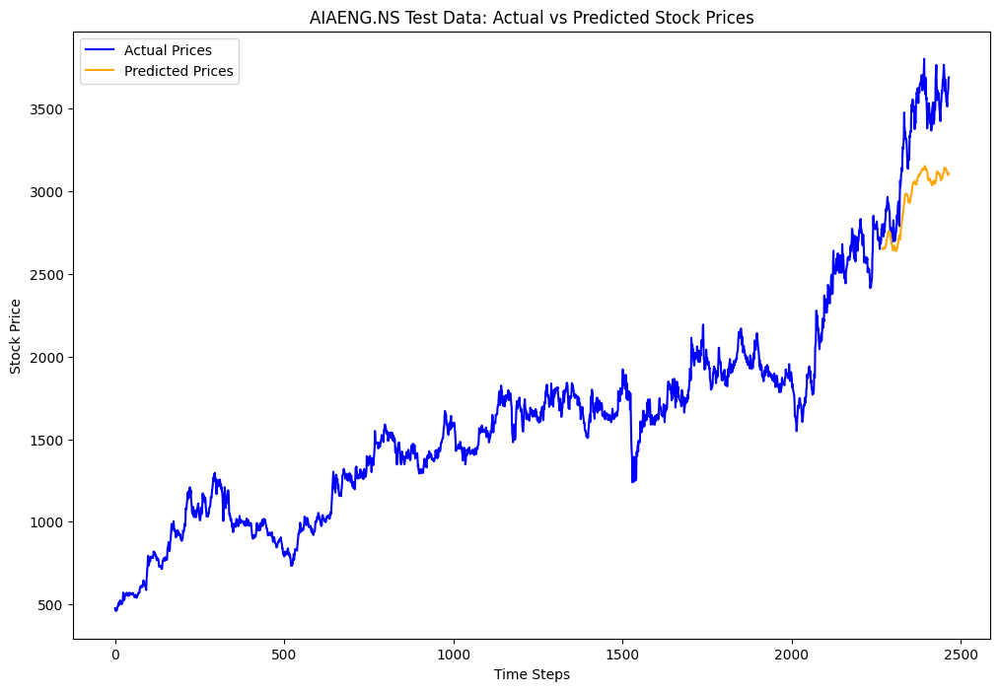

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0725, Validation Loss: 0.0590
Epoch [2/33], Loss: 0.1113, Validation Loss: 0.1468
Epoch [3/33], Loss: 0.0720, Validation Loss: 0.0918
Epoch [4/33], Loss: 0.0202, Validation Loss: 0.0030
Epoch [5/33], Loss: 0.0257, Validation Loss: 0.0320
Epoch [6/33], Loss: 0.0336, Validation Loss: 0.1274
Epoch [7/33], Loss: 0.0645, Validation Loss: 0.1123
Epoch [8/33], Loss: 0.0499, Validation Loss: 0.0517
Epoch [9/33], Loss: 0.0060, Validation Loss: 0.0057
Epoch [10/33], Loss: 0.0117, Validation Loss: 0.0027
Epoch [11/33], Loss: 0.0155, Validation Loss: 0.0406
Epoch [12/33], Loss: 0.0424, Validation Loss: 0.0632
Epoch [13/33], Loss: 0.0294, Validation Loss: 0.0127
Epoch [14/33], Loss: 0.0064, Validation Loss: 0.0004
Epoch [15/33], Loss: 0.0075, Validation Loss: 0.0029
Epoch [16/33], Loss: 0.0050, Validation Loss: 0.0013
Epoch [17/33], Loss: 0.0041, Validation Loss: 0.0005
Epoch [18/33], Loss: 0.0042, Validation Loss: 0.0015
Epoch [19/33], Loss: 0.0030, Validation Loss: 0.0003
Ep

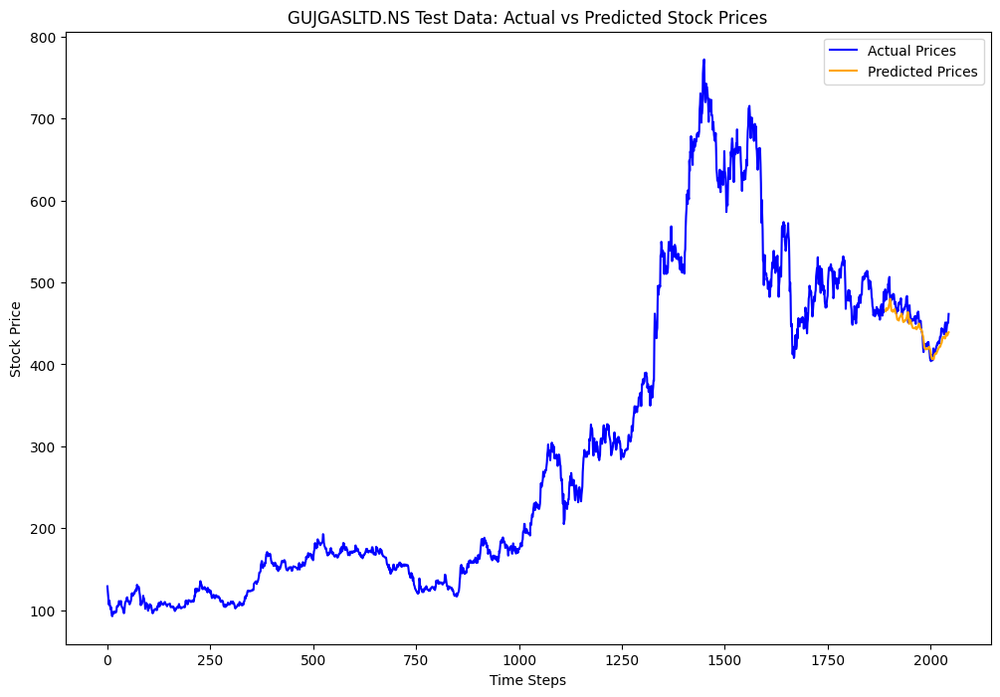

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0269, Validation Loss: 0.2388
Epoch [2/33], Loss: 0.0285, Validation Loss: 0.2257
Epoch [3/33], Loss: 0.0277, Validation Loss: 0.2163
Epoch [4/33], Loss: 0.0236, Validation Loss: 0.1703
Epoch [5/33], Loss: 0.0092, Validation Loss: 0.0364
Epoch [6/33], Loss: 0.0196, Validation Loss: 0.1636
Epoch [7/33], Loss: 0.0106, Validation Loss: 0.0236
Epoch [8/33], Loss: 0.0122, Validation Loss: 0.0334
Epoch [9/33], Loss: 0.0229, Validation Loss: 0.2138
Epoch [10/33], Loss: 0.0221, Validation Loss: 0.1788
Epoch [11/33], Loss: 0.0180, Validation Loss: 0.1210
Epoch [12/33], Loss: 0.0077, Validation Loss: 0.0156
Epoch [13/33], Loss: 0.0065, Validation Loss: 0.0215
Epoch [14/33], Loss: 0.0193, Validation Loss: 0.1815
Epoch [15/33], Loss: 0.0219, Validation Loss: 0.1684
Epoch [16/33], Loss: 0.0178, Validation Loss: 0.1269
Epoch [17/33], Loss: 0.0096, Validation Loss: 0.0575
Epoch [18/33], Loss: 0.0050, Validation Loss: 0.0030
Epoch [19/33], Loss: 0.0017, Validation Loss: 0.0034
Ep

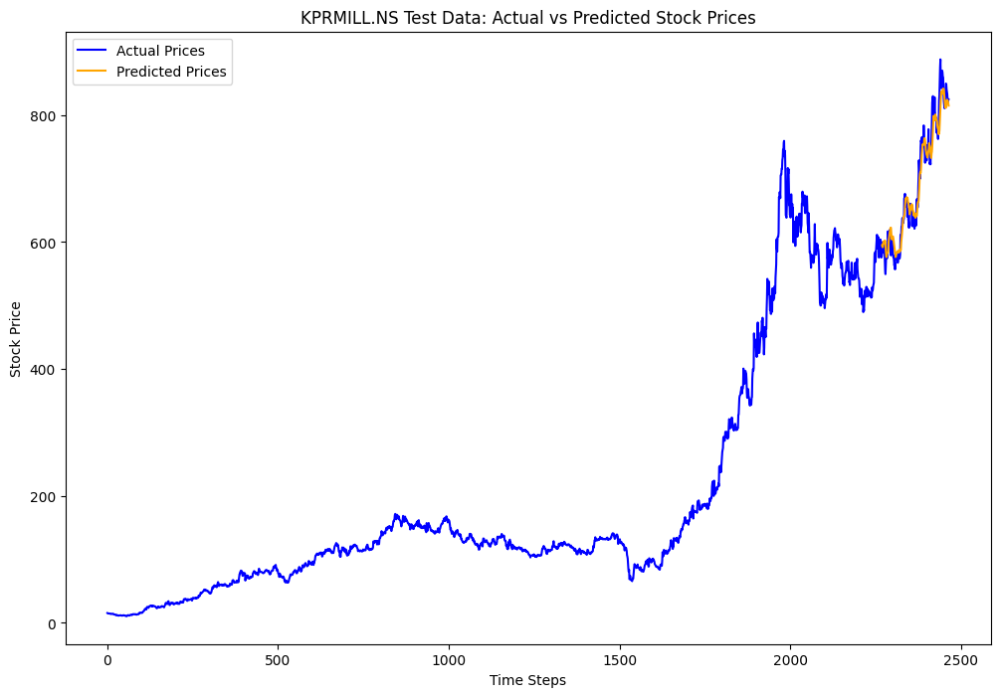

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.2021, Validation Loss: 0.1066
Epoch [2/33], Loss: 0.0754, Validation Loss: 0.0906
Epoch [3/33], Loss: 0.0652, Validation Loss: 0.0847
Epoch [4/33], Loss: 0.0517, Validation Loss: 0.0647
Epoch [5/33], Loss: 0.0294, Validation Loss: 0.0223
Epoch [6/33], Loss: 0.0093, Validation Loss: 0.0013
Epoch [7/33], Loss: 0.0099, Validation Loss: 0.0016
Epoch [8/33], Loss: 0.0127, Validation Loss: 0.0012
Epoch [9/33], Loss: 0.0302, Validation Loss: 0.0185
Epoch [10/33], Loss: 0.0102, Validation Loss: 0.0022
Epoch [11/33], Loss: 0.0302, Validation Loss: 0.0035
Epoch [12/33], Loss: 0.0081, Validation Loss: 0.0039
Epoch [13/33], Loss: 0.0114, Validation Loss: 0.0018
Epoch [14/33], Loss: 0.0057, Validation Loss: 0.0034
Epoch [15/33], Loss: 0.0066, Validation Loss: 0.0019
Epoch [16/33], Loss: 0.0038, Validation Loss: 0.0038
Epoch [17/33], Loss: 0.0043, Validation Loss: 0.0010
Epoch [18/33], Loss: 0.0028, Validation Loss: 0.0037
Epoch [19/33], Loss: 0.0039, Validation Loss: 0.0010
Ep

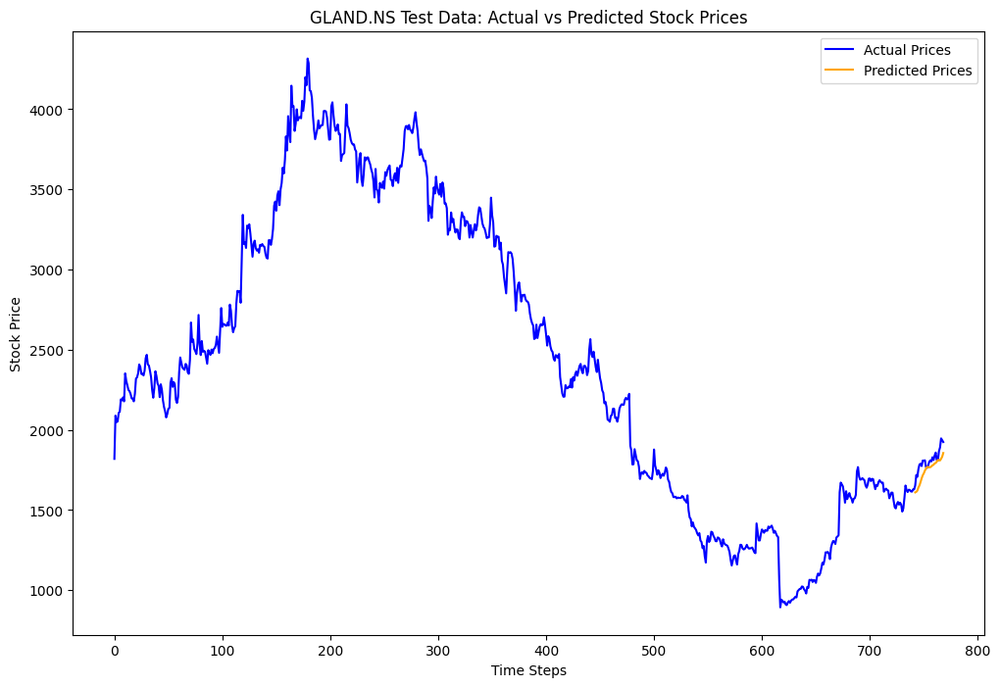

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.1212, Validation Loss: 0.0017
Epoch [2/33], Loss: 0.0801, Validation Loss: 0.0122
Epoch [3/33], Loss: 0.0554, Validation Loss: 0.0014
Epoch [4/33], Loss: 0.0419, Validation Loss: 0.0004
Epoch [5/33], Loss: 0.0270, Validation Loss: 0.0038
Epoch [6/33], Loss: 0.0568, Validation Loss: 0.0078
Epoch [7/33], Loss: 0.0306, Validation Loss: 0.0004
Epoch [8/33], Loss: 0.0064, Validation Loss: 0.0011
Epoch [9/33], Loss: 0.0143, Validation Loss: 0.0004
Epoch [10/33], Loss: 0.0097, Validation Loss: 0.0013
Epoch [11/33], Loss: 0.0278, Validation Loss: 0.0037
Epoch [12/33], Loss: 0.0078, Validation Loss: 0.0040
Epoch [13/33], Loss: 0.0040, Validation Loss: 0.0015
Epoch [14/33], Loss: 0.0035, Validation Loss: 0.0006
Epoch [15/33], Loss: 0.0048, Validation Loss: 0.0019
Epoch [16/33], Loss: 0.0039, Validation Loss: 0.0003
Epoch [17/33], Loss: 0.0032, Validation Loss: 0.0011
Epoch [18/33], Loss: 0.0030, Validation Loss: 0.0003
Epoch [19/33], Loss: 0.0032, Validation Loss: 0.0011
Ep

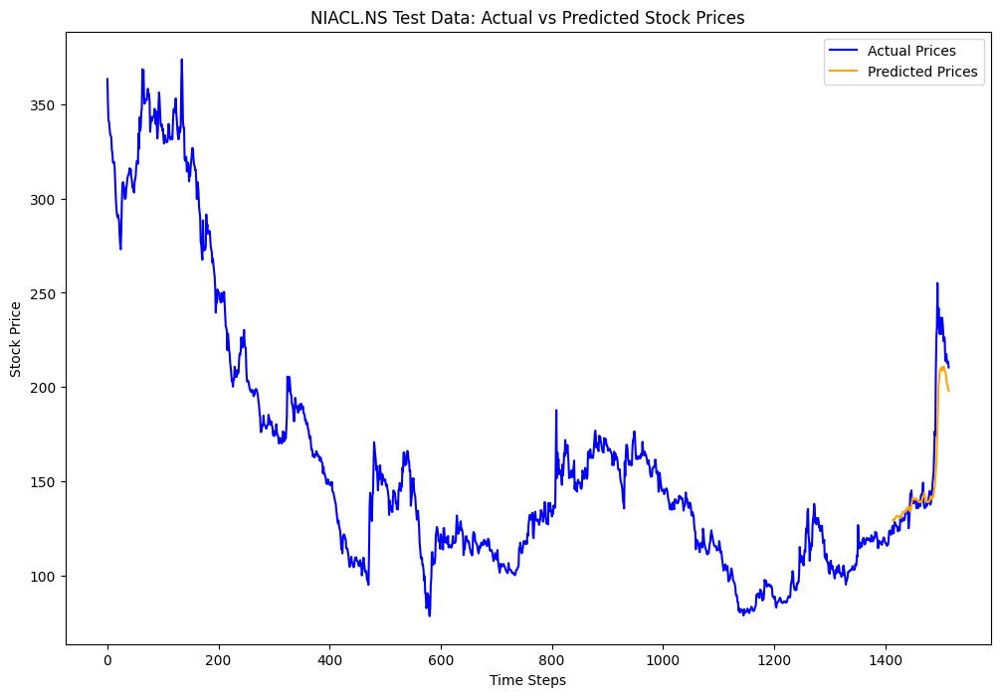

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0960, Validation Loss: 0.0656
Epoch [2/33], Loss: 0.0912, Validation Loss: 0.0726
Epoch [3/33], Loss: 0.1034, Validation Loss: 0.0070
Epoch [4/33], Loss: 0.0578, Validation Loss: 0.0158
Epoch [5/33], Loss: 0.0193, Validation Loss: 0.0096
Epoch [6/33], Loss: 0.0286, Validation Loss: 0.0160
Epoch [7/33], Loss: 0.0245, Validation Loss: 0.0098
Epoch [8/33], Loss: 0.0069, Validation Loss: 0.0007
Epoch [9/33], Loss: 0.0038, Validation Loss: 0.0007
Epoch [10/33], Loss: 0.0036, Validation Loss: 0.0005
Epoch [11/33], Loss: 0.0031, Validation Loss: 0.0005
Epoch [12/33], Loss: 0.0033, Validation Loss: 0.0006
Epoch [13/33], Loss: 0.0031, Validation Loss: 0.0005
Epoch [14/33], Loss: 0.0026, Validation Loss: 0.0006
Epoch [15/33], Loss: 0.0027, Validation Loss: 0.0006
Epoch [16/33], Loss: 0.0028, Validation Loss: 0.0007
Epoch [17/33], Loss: 0.0040, Validation Loss: 0.0005
Epoch [18/33], Loss: 0.0041, Validation Loss: 0.0005
Epoch [19/33], Loss: 0.0053, Validation Loss: 0.0008
Ep

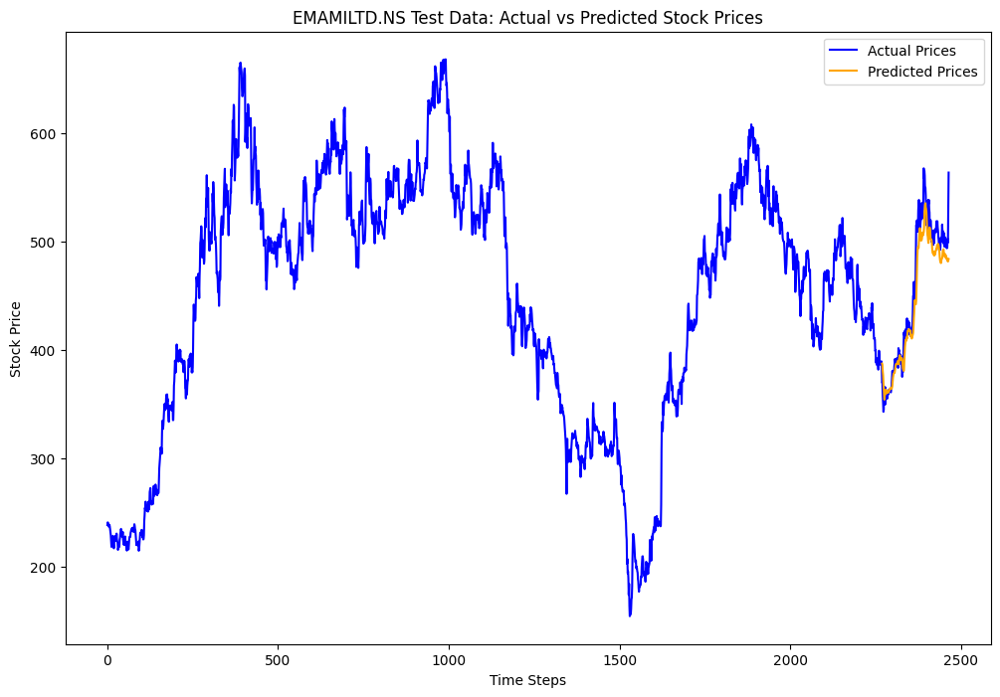

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0125, Validation Loss: 0.0291
Epoch [2/33], Loss: 0.0122, Validation Loss: 0.0267
Epoch [3/33], Loss: 0.0105, Validation Loss: 0.0210
Epoch [4/33], Loss: 0.0109, Validation Loss: 0.0167
Epoch [5/33], Loss: 0.0111, Validation Loss: 0.0135
Epoch [6/33], Loss: 0.0101, Validation Loss: 0.0114
Epoch [7/33], Loss: 0.0097, Validation Loss: 0.0119
Epoch [8/33], Loss: 0.0074, Validation Loss: 0.0154
Epoch [9/33], Loss: 0.0038, Validation Loss: 0.0058
Epoch [10/33], Loss: 0.0016, Validation Loss: 0.0024
Epoch [11/33], Loss: 0.0010, Validation Loss: 0.0021
Epoch [12/33], Loss: 0.0017, Validation Loss: 0.0016
Epoch [13/33], Loss: 0.0013, Validation Loss: 0.0006
Epoch [14/33], Loss: 0.0013, Validation Loss: 0.0011
Epoch [15/33], Loss: 0.0018, Validation Loss: 0.0018
Epoch [16/33], Loss: 0.0024, Validation Loss: 0.0032
Epoch [17/33], Loss: 0.0020, Validation Loss: 0.0012
Epoch [18/33], Loss: 0.0017, Validation Loss: 0.0020
Epoch [19/33], Loss: 0.0007, Validation Loss: 0.0006
Ep

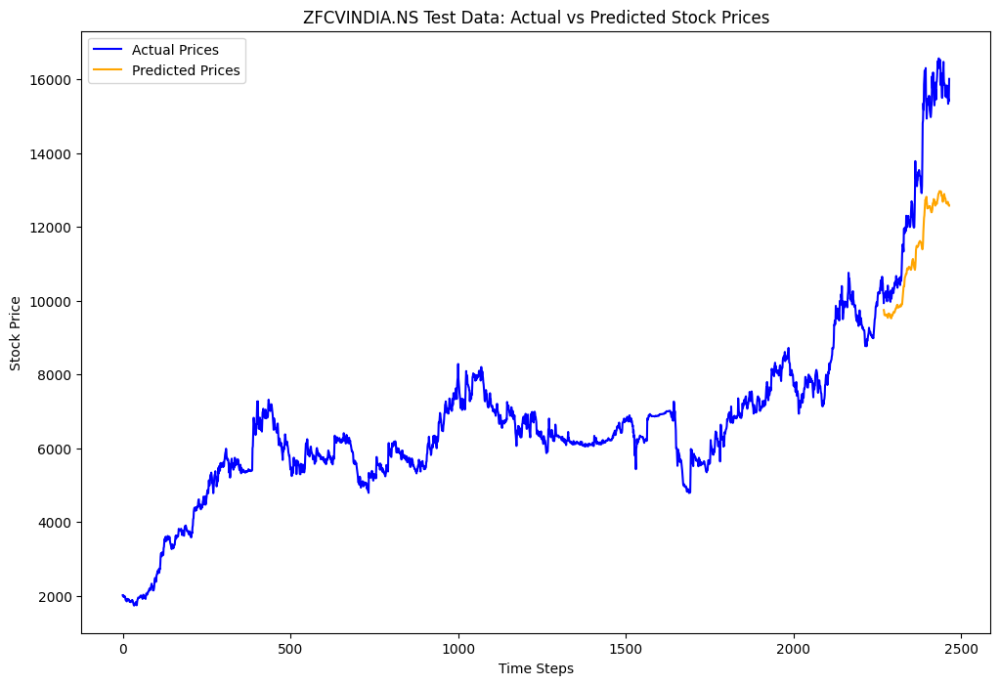

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.1158, Validation Loss: 0.0169
Epoch [2/33], Loss: 0.0668, Validation Loss: 0.0501
Epoch [3/33], Loss: 0.0491, Validation Loss: 0.0341
Epoch [4/33], Loss: 0.0406, Validation Loss: 0.0147
Epoch [5/33], Loss: 0.0113, Validation Loss: 0.0048
Epoch [6/33], Loss: 0.0184, Validation Loss: 0.0020
Epoch [7/33], Loss: 0.0054, Validation Loss: 0.0008
Epoch [8/33], Loss: 0.0071, Validation Loss: 0.0040
Epoch [9/33], Loss: 0.0065, Validation Loss: 0.0020
Epoch [10/33], Loss: 0.0028, Validation Loss: 0.0011
Epoch [11/33], Loss: 0.0041, Validation Loss: 0.0003
Epoch [12/33], Loss: 0.0026, Validation Loss: 0.0012
Epoch [13/33], Loss: 0.0030, Validation Loss: 0.0003
Epoch [14/33], Loss: 0.0025, Validation Loss: 0.0009
Epoch [15/33], Loss: 0.0025, Validation Loss: 0.0004
Epoch [16/33], Loss: 0.0022, Validation Loss: 0.0009
Epoch [17/33], Loss: 0.0024, Validation Loss: 0.0006
Epoch [18/33], Loss: 0.0021, Validation Loss: 0.0006
Epoch [19/33], Loss: 0.0023, Validation Loss: 0.0008
Ep

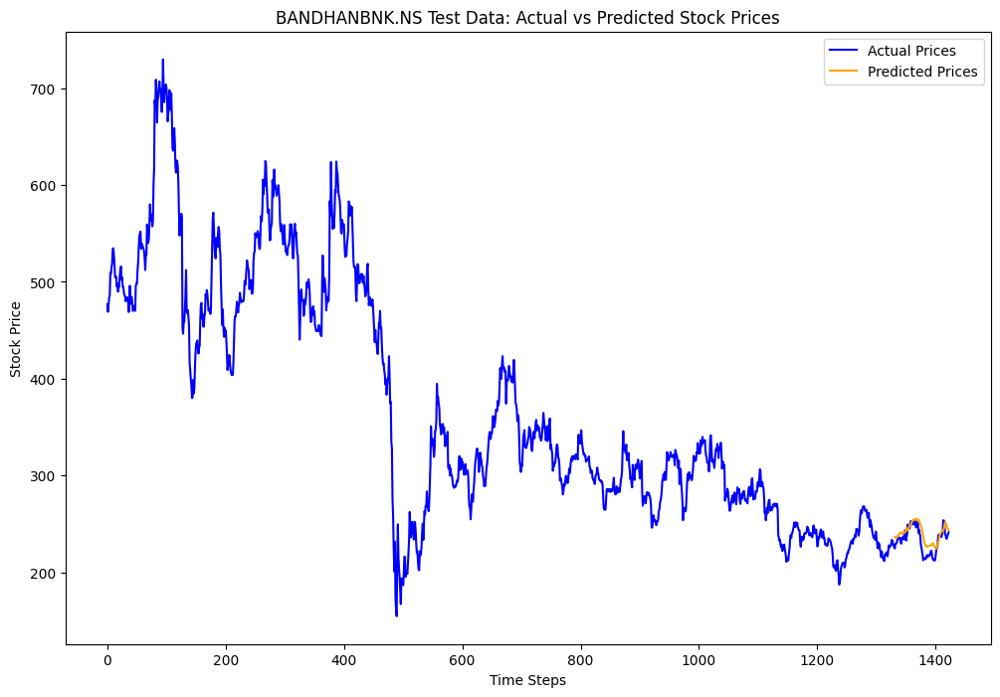

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0054, Validation Loss: 0.0141
Epoch [2/33], Loss: 0.0701, Validation Loss: 0.2166
Epoch [3/33], Loss: 0.0258, Validation Loss: 0.1585
Epoch [4/33], Loss: 0.0296, Validation Loss: 0.1662
Epoch [5/33], Loss: 0.0262, Validation Loss: 0.1407
Epoch [6/33], Loss: 0.0194, Validation Loss: 0.0395
Epoch [7/33], Loss: 0.0588, Validation Loss: 0.0802
Epoch [8/33], Loss: 0.0334, Validation Loss: 0.1897
Epoch [9/33], Loss: 0.0203, Validation Loss: 0.1057
Epoch [10/33], Loss: 0.0086, Validation Loss: 0.0049
Epoch [11/33], Loss: 0.0221, Validation Loss: 0.0685
Epoch [12/33], Loss: 0.0219, Validation Loss: 0.1343
Epoch [13/33], Loss: 0.0063, Validation Loss: 0.0068
Epoch [14/33], Loss: 0.0237, Validation Loss: 0.0832
Epoch [15/33], Loss: 0.0161, Validation Loss: 0.0787
Epoch [16/33], Loss: 0.0141, Validation Loss: 0.0385
Epoch [17/33], Loss: 0.0054, Validation Loss: 0.0146
Epoch [18/33], Loss: 0.0029, Validation Loss: 0.0069
Epoch [19/33], Loss: 0.0039, Validation Loss: 0.0020
Ep

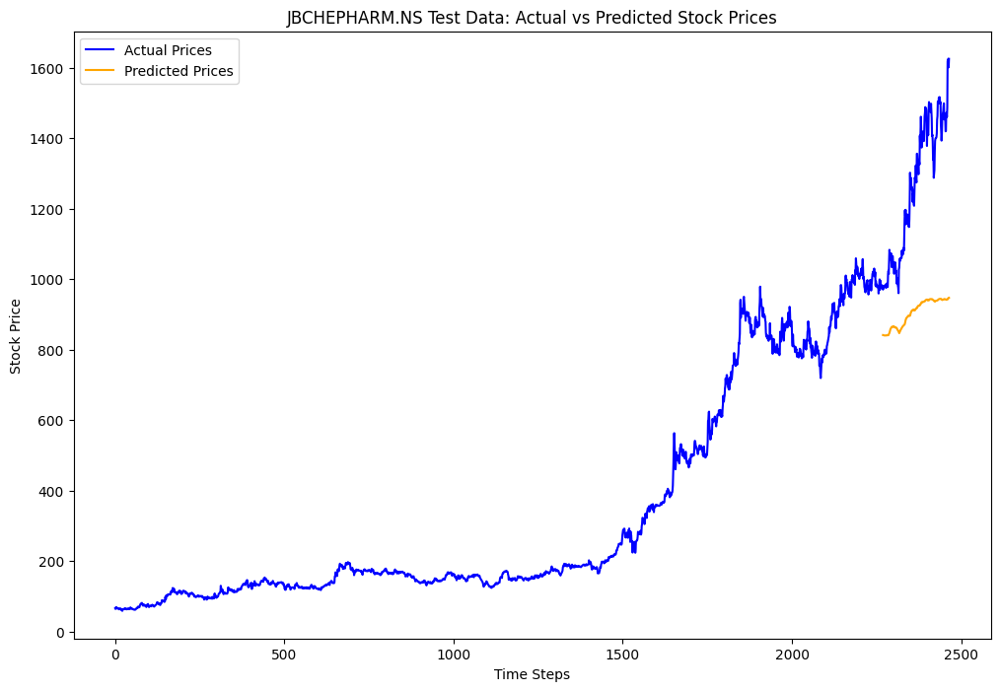

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0289, Validation Loss: 0.1563
Epoch [2/33], Loss: 0.0333, Validation Loss: 0.1425
Epoch [3/33], Loss: 0.0326, Validation Loss: 0.1375
Epoch [4/33], Loss: 0.0252, Validation Loss: 0.0847
Epoch [5/33], Loss: 0.0118, Validation Loss: 0.0441
Epoch [6/33], Loss: 0.0142, Validation Loss: 0.0252
Epoch [7/33], Loss: 0.0177, Validation Loss: 0.0656
Epoch [8/33], Loss: 0.0269, Validation Loss: 0.1515
Epoch [9/33], Loss: 0.0273, Validation Loss: 0.1176
Epoch [10/33], Loss: 0.0172, Validation Loss: 0.0482
Epoch [11/33], Loss: 0.0074, Validation Loss: 0.0227
Epoch [12/33], Loss: 0.0173, Validation Loss: 0.0981
Epoch [13/33], Loss: 0.0191, Validation Loss: 0.0665
Epoch [14/33], Loss: 0.0064, Validation Loss: 0.0047
Epoch [15/33], Loss: 0.0027, Validation Loss: 0.0004
Epoch [16/33], Loss: 0.0046, Validation Loss: 0.0242
Epoch [17/33], Loss: 0.0028, Validation Loss: 0.0003
Epoch [18/33], Loss: 0.0008, Validation Loss: 0.0004
Epoch [19/33], Loss: 0.0010, Validation Loss: 0.0003
Ep

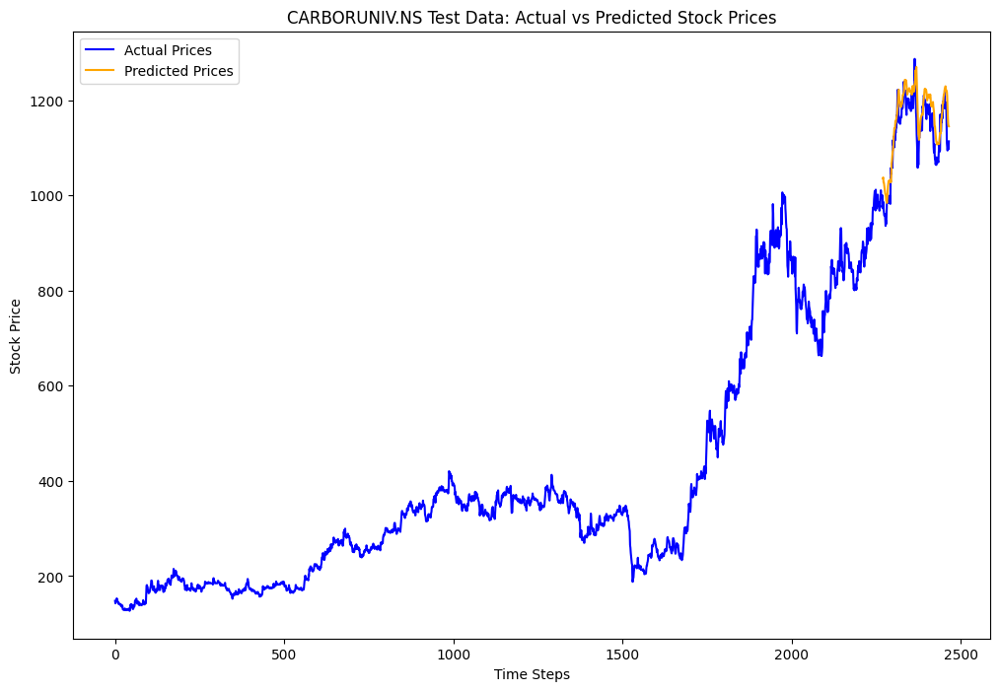

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0166, Validation Loss: 0.0032
Epoch [2/33], Loss: 0.0615, Validation Loss: 0.1431
Epoch [3/33], Loss: 0.0313, Validation Loss: 0.1064
Epoch [4/33], Loss: 0.0322, Validation Loss: 0.1031
Epoch [5/33], Loss: 0.0152, Validation Loss: 0.0009
Epoch [6/33], Loss: 0.0994, Validation Loss: 0.0874
Epoch [7/33], Loss: 0.0316, Validation Loss: 0.1299
Epoch [8/33], Loss: 0.0183, Validation Loss: 0.0388
Epoch [9/33], Loss: 0.0087, Validation Loss: 0.0464
Epoch [10/33], Loss: 0.0220, Validation Loss: 0.0805
Epoch [11/33], Loss: 0.0182, Validation Loss: 0.0374
Epoch [12/33], Loss: 0.0035, Validation Loss: 0.0022
Epoch [13/33], Loss: 0.0017, Validation Loss: 0.0020
Epoch [14/33], Loss: 0.0021, Validation Loss: 0.0016
Epoch [15/33], Loss: 0.0020, Validation Loss: 0.0024
Epoch [16/33], Loss: 0.0025, Validation Loss: 0.0014
Epoch [17/33], Loss: 0.0027, Validation Loss: 0.0023
Epoch [18/33], Loss: 0.0056, Validation Loss: 0.0063
Epoch [19/33], Loss: 0.0025, Validation Loss: 0.0052
Ep

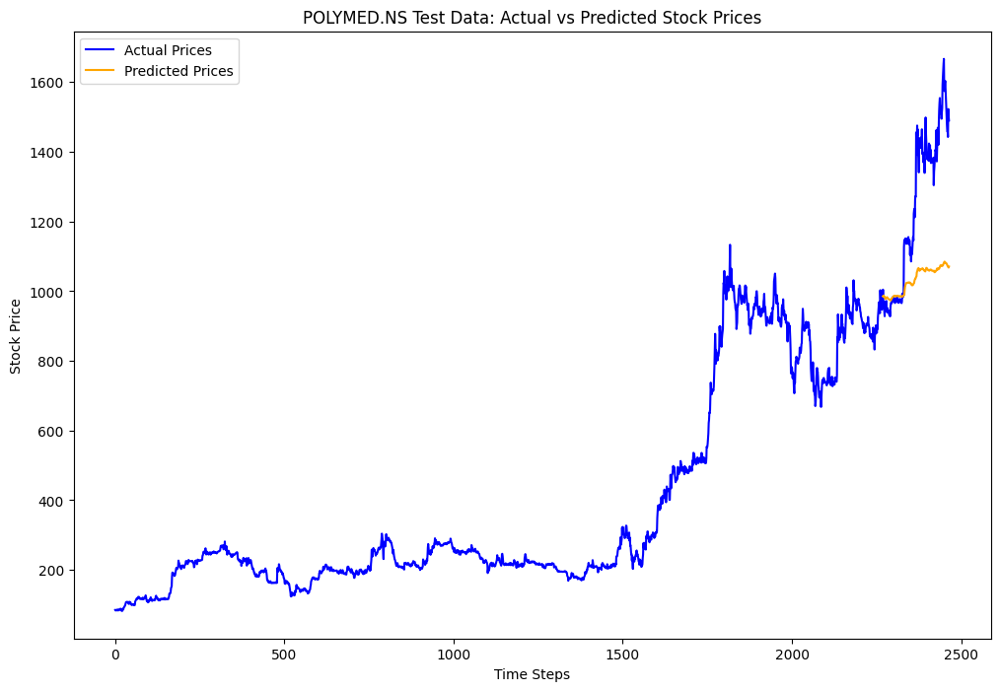

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0189, Validation Loss: 0.1172
Epoch [2/33], Loss: 0.0236, Validation Loss: 0.1516
Epoch [3/33], Loss: 0.0176, Validation Loss: 0.1437
Epoch [4/33], Loss: 0.0156, Validation Loss: 0.1342
Epoch [5/33], Loss: 0.0157, Validation Loss: 0.1319
Epoch [6/33], Loss: 0.0152, Validation Loss: 0.1250
Epoch [7/33], Loss: 0.0142, Validation Loss: 0.0971
Epoch [8/33], Loss: 0.0139, Validation Loss: 0.0510
Epoch [9/33], Loss: 0.0032, Validation Loss: 0.0359
Epoch [10/33], Loss: 0.0130, Validation Loss: 0.1061
Epoch [11/33], Loss: 0.0080, Validation Loss: 0.0330
Epoch [12/33], Loss: 0.0016, Validation Loss: 0.0012
Epoch [13/33], Loss: 0.0020, Validation Loss: 0.0003
Epoch [14/33], Loss: 0.0024, Validation Loss: 0.0039
Epoch [15/33], Loss: 0.0099, Validation Loss: 0.0823
Epoch [16/33], Loss: 0.0085, Validation Loss: 0.0359
Epoch [17/33], Loss: 0.0014, Validation Loss: 0.0006
Epoch [18/33], Loss: 0.0012, Validation Loss: 0.0038
Epoch [19/33], Loss: 0.0009, Validation Loss: 0.0001
Ep

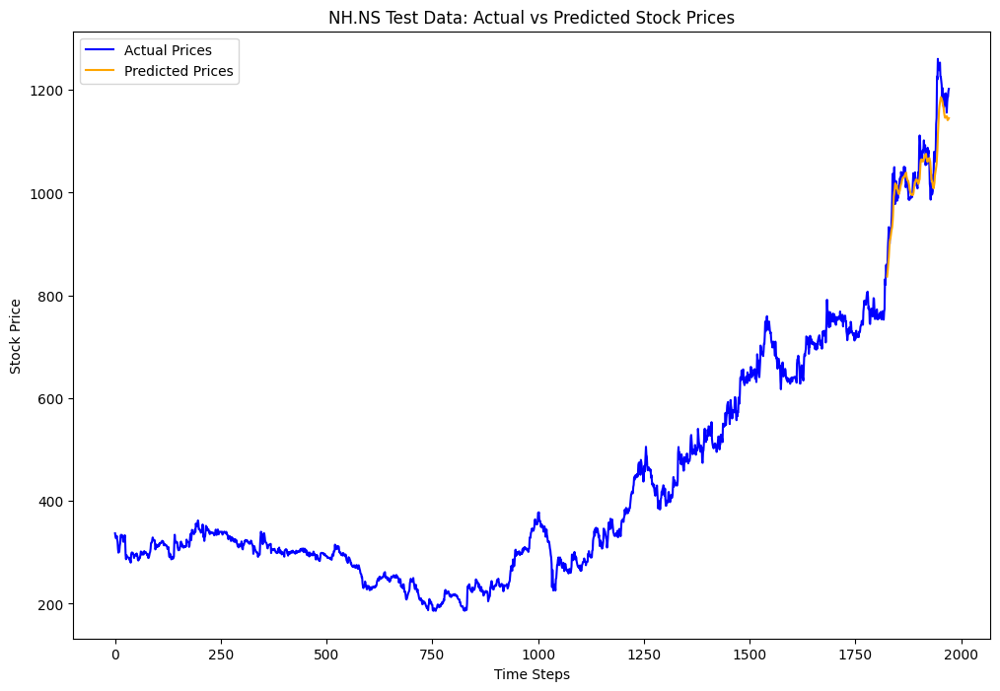

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0705, Validation Loss: 0.0128
Epoch [2/33], Loss: 0.1772, Validation Loss: 0.1201
Epoch [3/33], Loss: 0.0271, Validation Loss: 0.0120
Epoch [4/33], Loss: 0.1008, Validation Loss: 0.0248
Epoch [5/33], Loss: 0.0456, Validation Loss: 0.0044
Epoch [6/33], Loss: 0.0427, Validation Loss: 0.0014
Epoch [7/33], Loss: 0.0404, Validation Loss: 0.0010
Epoch [8/33], Loss: 0.0187, Validation Loss: 0.0163
Epoch [9/33], Loss: 0.0057, Validation Loss: 0.0007
Epoch [10/33], Loss: 0.0131, Validation Loss: 0.0043
Epoch [11/33], Loss: 0.0128, Validation Loss: 0.0079
Epoch [12/33], Loss: 0.0117, Validation Loss: 0.0063
Epoch [13/33], Loss: 0.0100, Validation Loss: 0.0057
Epoch [14/33], Loss: 0.0135, Validation Loss: 0.0058
Epoch [15/33], Loss: 0.0068, Validation Loss: 0.0076
Epoch [16/33], Loss: 0.0110, Validation Loss: 0.0062
Epoch [17/33], Loss: 0.0143, Validation Loss: 0.0040
Epoch [18/33], Loss: 0.0042, Validation Loss: 0.0012
Epoch [19/33], Loss: 0.0046, Validation Loss: 0.0020
Ep

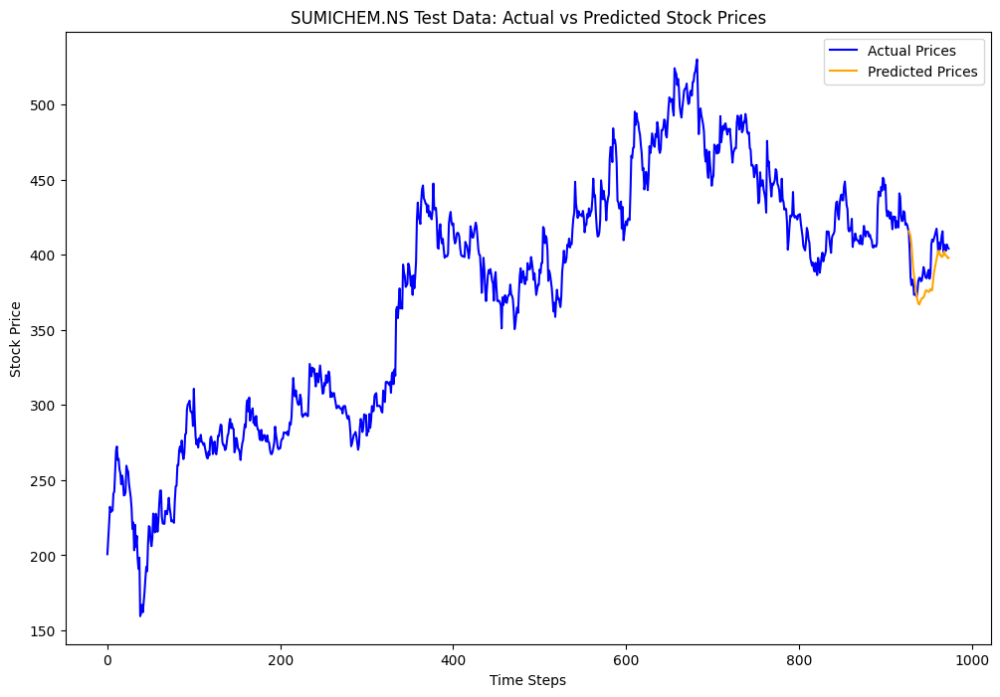

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0053, Validation Loss: 0.0656
Epoch [2/33], Loss: 0.0433, Validation Loss: 0.3616
Epoch [3/33], Loss: 0.0164, Validation Loss: 0.3183
Epoch [4/33], Loss: 0.0179, Validation Loss: 0.3201
Epoch [5/33], Loss: 0.0166, Validation Loss: 0.2938
Epoch [6/33], Loss: 0.0150, Validation Loss: 0.2313
Epoch [7/33], Loss: 0.0158, Validation Loss: 0.1220
Epoch [8/33], Loss: 0.0066, Validation Loss: 0.0698
Epoch [9/33], Loss: 0.0032, Validation Loss: 0.0036
Epoch [10/33], Loss: 0.0037, Validation Loss: 0.0024
Epoch [11/33], Loss: 0.0028, Validation Loss: 0.0051
Epoch [12/33], Loss: 0.0024, Validation Loss: 0.0028
Epoch [13/33], Loss: 0.0051, Validation Loss: 0.0130
Epoch [14/33], Loss: 0.0076, Validation Loss: 0.2430
Epoch [15/33], Loss: 0.0250, Validation Loss: 0.2225
Epoch [16/33], Loss: 0.0116, Validation Loss: 0.0933
Epoch [17/33], Loss: 0.0037, Validation Loss: 0.0076
Epoch [18/33], Loss: 0.0016, Validation Loss: 0.0018
Epoch [19/33], Loss: 0.0017, Validation Loss: 0.0067
Ep

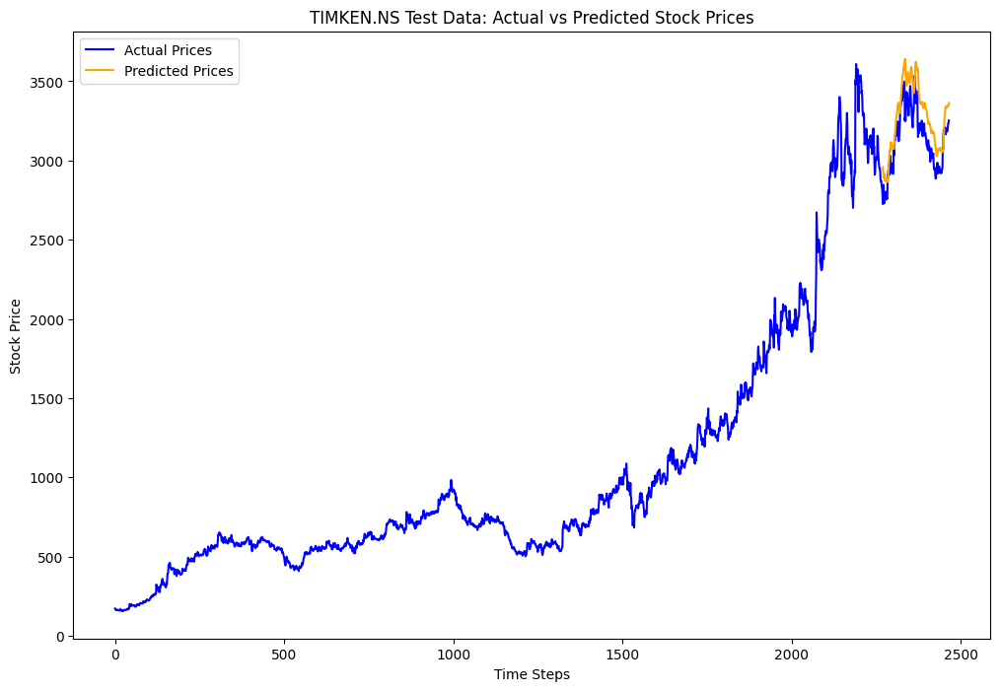

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0779, Validation Loss: 0.0001
Epoch [2/33], Loss: 0.0322, Validation Loss: 0.0001
Epoch [3/33], Loss: 0.0234, Validation Loss: 0.0025
Epoch [4/33], Loss: 0.0284, Validation Loss: 0.0013
Epoch [5/33], Loss: 0.0255, Validation Loss: 0.0001
Epoch [6/33], Loss: 0.0230, Validation Loss: 0.0003
Epoch [7/33], Loss: 0.0161, Validation Loss: 0.0015
Epoch [8/33], Loss: 0.0098, Validation Loss: 0.0030
Epoch [9/33], Loss: 0.0273, Validation Loss: 0.0253
Epoch [10/33], Loss: 0.0346, Validation Loss: 0.0055
Epoch [11/33], Loss: 0.0244, Validation Loss: 0.0001
Epoch [12/33], Loss: 0.0195, Validation Loss: 0.0004
Epoch [13/33], Loss: 0.0128, Validation Loss: 0.0006
Epoch [14/33], Loss: 0.0110, Validation Loss: 0.0014
Epoch [15/33], Loss: 0.0077, Validation Loss: 0.0003
Epoch [16/33], Loss: 0.0016, Validation Loss: 0.0020
Epoch [17/33], Loss: 0.0043, Validation Loss: 0.0017
Epoch [18/33], Loss: 0.0024, Validation Loss: 0.0003
Epoch [19/33], Loss: 0.0019, Validation Loss: 0.0017
Ep

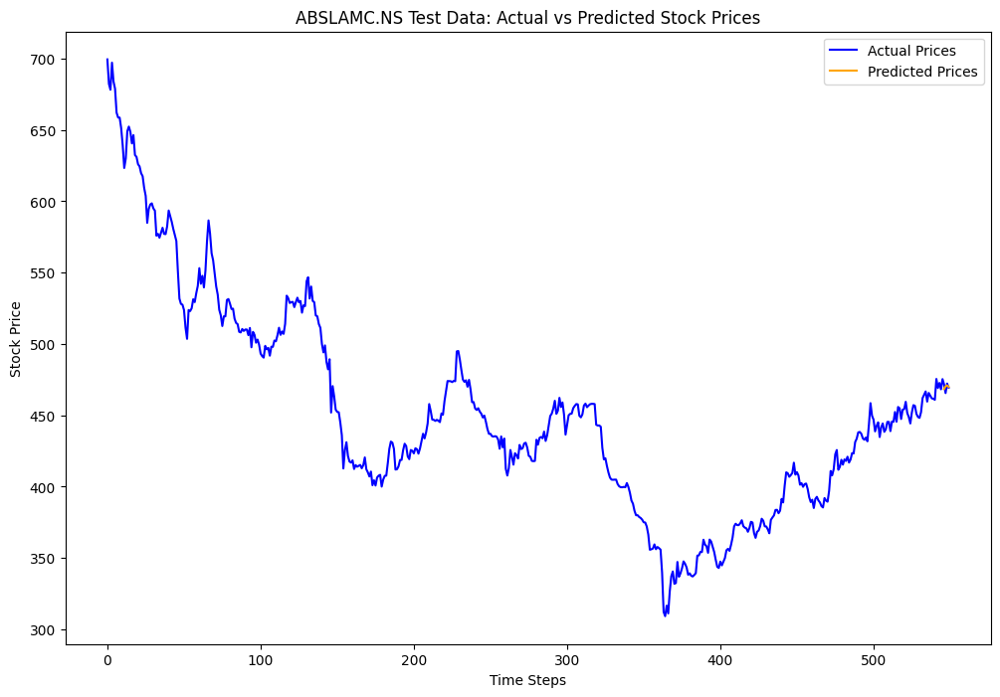

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0300, Validation Loss: 0.0016
Epoch [2/33], Loss: 0.0436, Validation Loss: 0.0695
Epoch [3/33], Loss: 0.0214, Validation Loss: 0.0297
Epoch [4/33], Loss: 0.0143, Validation Loss: 0.0105
Epoch [5/33], Loss: 0.0203, Validation Loss: 0.0222
Epoch [6/33], Loss: 0.0169, Validation Loss: 0.0217
Epoch [7/33], Loss: 0.0144, Validation Loss: 0.0131
Epoch [8/33], Loss: 0.0147, Validation Loss: 0.0119
Epoch [9/33], Loss: 0.0129, Validation Loss: 0.0023
Epoch [10/33], Loss: 0.0085, Validation Loss: 0.0014
Epoch [11/33], Loss: 0.0020, Validation Loss: 0.0038
Epoch [12/33], Loss: 0.0034, Validation Loss: 0.0012
Epoch [13/33], Loss: 0.0019, Validation Loss: 0.0013
Epoch [14/33], Loss: 0.0041, Validation Loss: 0.0105
Epoch [15/33], Loss: 0.0090, Validation Loss: 0.0032
Epoch [16/33], Loss: 0.0065, Validation Loss: 0.0019
Epoch [17/33], Loss: 0.0036, Validation Loss: 0.0034
Epoch [18/33], Loss: 0.0024, Validation Loss: 0.0019
Epoch [19/33], Loss: 0.0030, Validation Loss: 0.0058
Ep

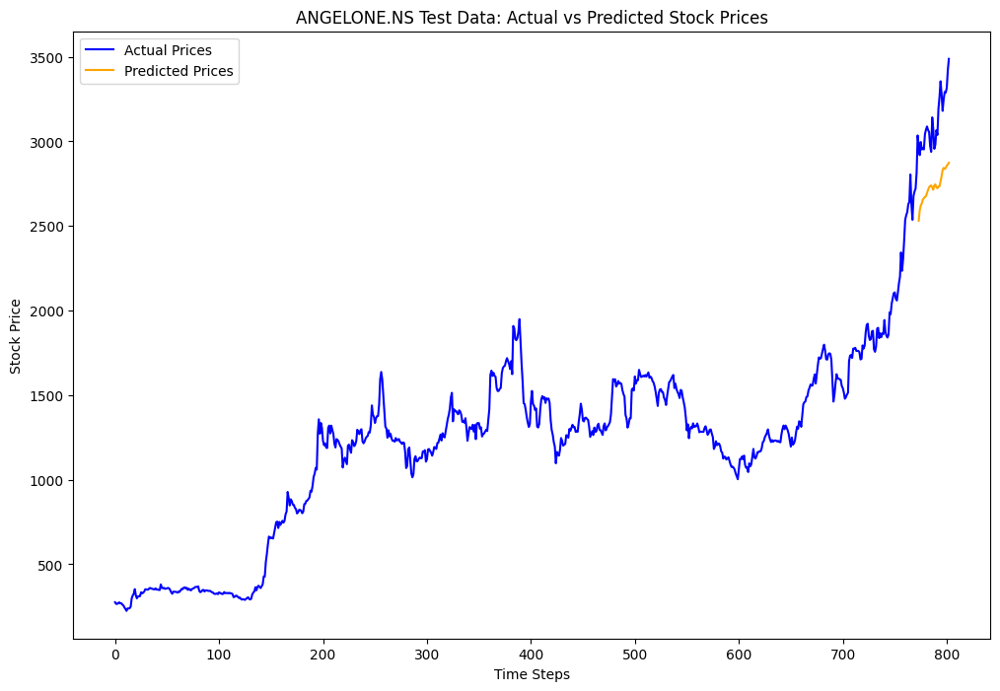

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0660, Validation Loss: 0.0144
Epoch [2/33], Loss: 0.0464, Validation Loss: 0.0268
Epoch [3/33], Loss: 0.0660, Validation Loss: 0.0441
Epoch [4/33], Loss: 0.0482, Validation Loss: 0.0143
Epoch [5/33], Loss: 0.0126, Validation Loss: 0.0072
Epoch [6/33], Loss: 0.0084, Validation Loss: 0.0031
Epoch [7/33], Loss: 0.0080, Validation Loss: 0.0006
Epoch [8/33], Loss: 0.0041, Validation Loss: 0.0028
Epoch [9/33], Loss: 0.0032, Validation Loss: 0.0006
Epoch [10/33], Loss: 0.0046, Validation Loss: 0.0006
Epoch [11/33], Loss: 0.0069, Validation Loss: 0.0091
Epoch [12/33], Loss: 0.0060, Validation Loss: 0.0030
Epoch [13/33], Loss: 0.0128, Validation Loss: 0.0041
Epoch [14/33], Loss: 0.0119, Validation Loss: 0.0117
Epoch [15/33], Loss: 0.0081, Validation Loss: 0.0024
Epoch [16/33], Loss: 0.0089, Validation Loss: 0.0013
Epoch [17/33], Loss: 0.0083, Validation Loss: 0.0010
Epoch [18/33], Loss: 0.0035, Validation Loss: 0.0004
Epoch [19/33], Loss: 0.0046, Validation Loss: 0.0022
Ep

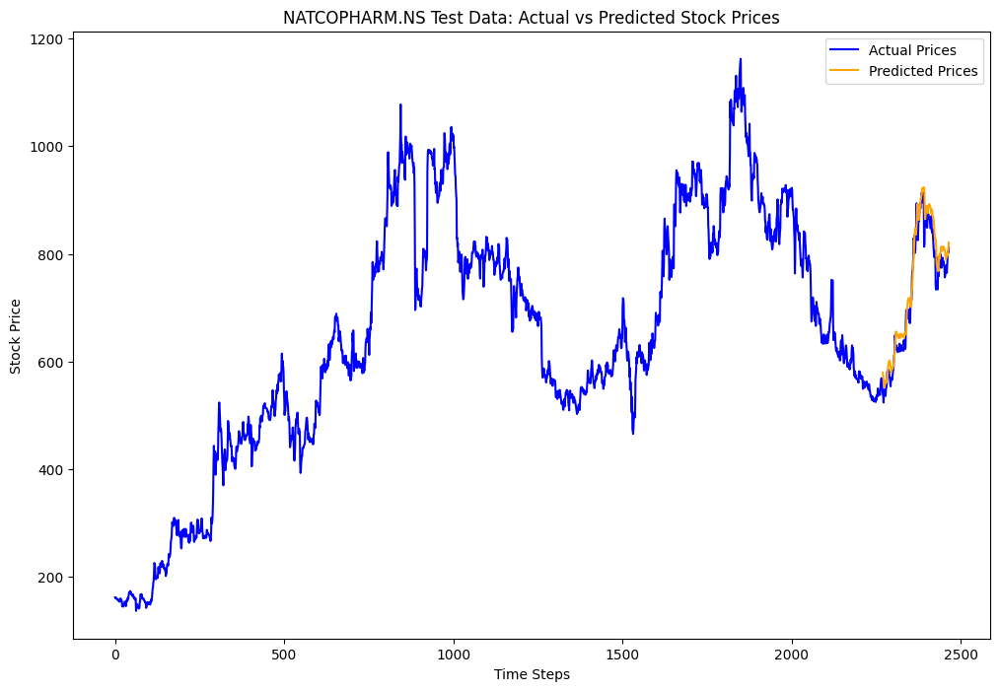

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0268, Validation Loss: 0.1035
Epoch [2/33], Loss: 0.0404, Validation Loss: 0.0686
Epoch [3/33], Loss: 0.0444, Validation Loss: 0.0725
Epoch [4/33], Loss: 0.0216, Validation Loss: 0.0022
Epoch [5/33], Loss: 0.0076, Validation Loss: 0.0050
Epoch [6/33], Loss: 0.0067, Validation Loss: 0.0022
Epoch [7/33], Loss: 0.0118, Validation Loss: 0.0007
Epoch [8/33], Loss: 0.0151, Validation Loss: 0.0005
Epoch [9/33], Loss: 0.0076, Validation Loss: 0.0005
Epoch [10/33], Loss: 0.0009, Validation Loss: 0.0003
Epoch [11/33], Loss: 0.0009, Validation Loss: 0.0005
Epoch [12/33], Loss: 0.0028, Validation Loss: 0.0015
Epoch [13/33], Loss: 0.0113, Validation Loss: 0.0063
Epoch [14/33], Loss: 0.0095, Validation Loss: 0.0025
Epoch [15/33], Loss: 0.0038, Validation Loss: 0.0004
Epoch [16/33], Loss: 0.0011, Validation Loss: 0.0006
Epoch [17/33], Loss: 0.0011, Validation Loss: 0.0006
Epoch [18/33], Loss: 0.0024, Validation Loss: 0.0003
Epoch [19/33], Loss: 0.0033, Validation Loss: 0.0003
Ep

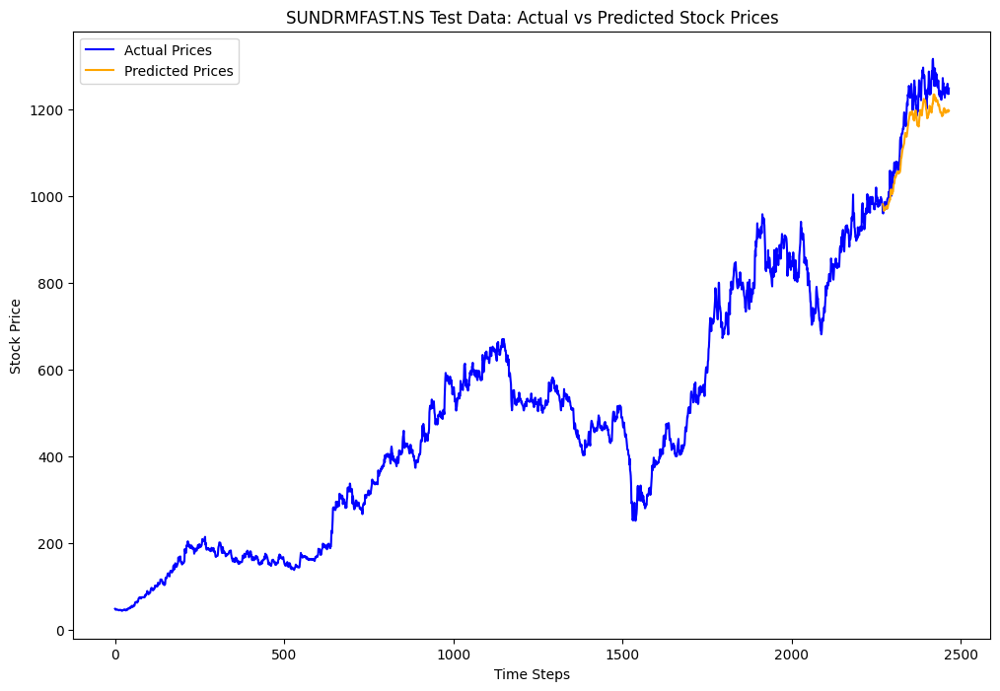

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0370, Validation Loss: 0.0128
Epoch [2/33], Loss: 0.0363, Validation Loss: 0.0069
Epoch [3/33], Loss: 0.0301, Validation Loss: 0.0058
Epoch [4/33], Loss: 0.0280, Validation Loss: 0.0055
Epoch [5/33], Loss: 0.0262, Validation Loss: 0.0051
Epoch [6/33], Loss: 0.0189, Validation Loss: 0.0015
Epoch [7/33], Loss: 0.0148, Validation Loss: 0.0018
Epoch [8/33], Loss: 0.0050, Validation Loss: 0.0024
Epoch [9/33], Loss: 0.0116, Validation Loss: 0.0390
Epoch [10/33], Loss: 0.0123, Validation Loss: 0.0134
Epoch [11/33], Loss: 0.0178, Validation Loss: 0.0010
Epoch [12/33], Loss: 0.0058, Validation Loss: 0.0006
Epoch [13/33], Loss: 0.0011, Validation Loss: 0.0009
Epoch [14/33], Loss: 0.0015, Validation Loss: 0.0006
Epoch [15/33], Loss: 0.0012, Validation Loss: 0.0017
Epoch [16/33], Loss: 0.0033, Validation Loss: 0.0015
Epoch [17/33], Loss: 0.0018, Validation Loss: 0.0011
Epoch [18/33], Loss: 0.0024, Validation Loss: 0.0029
Epoch [19/33], Loss: 0.0026, Validation Loss: 0.0014
Ep

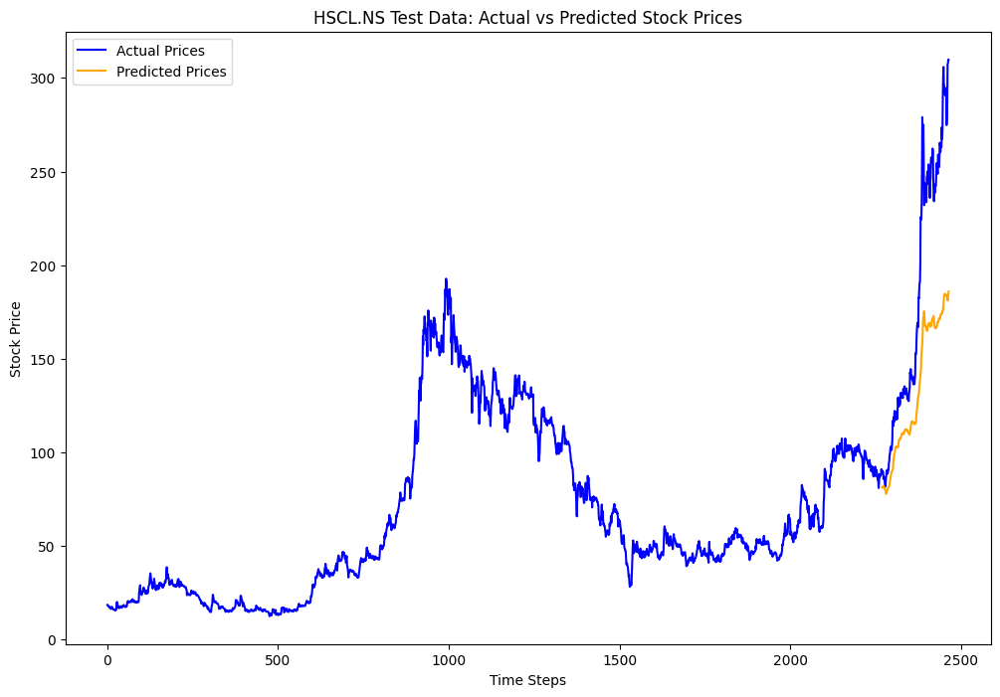

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0531, Validation Loss: 0.1799
Epoch [2/33], Loss: 0.1832, Validation Loss: 0.1410
Epoch [3/33], Loss: 0.0661, Validation Loss: 0.0372
Epoch [4/33], Loss: 0.0763, Validation Loss: 0.0124
Epoch [5/33], Loss: 0.0163, Validation Loss: 0.0021
Epoch [6/33], Loss: 0.0151, Validation Loss: 0.0108
Epoch [7/33], Loss: 0.0044, Validation Loss: 0.0016
Epoch [8/33], Loss: 0.0028, Validation Loss: 0.0026
Epoch [9/33], Loss: 0.0031, Validation Loss: 0.0030
Epoch [10/33], Loss: 0.0028, Validation Loss: 0.0024
Epoch [11/33], Loss: 0.0033, Validation Loss: 0.0016
Epoch [12/33], Loss: 0.0043, Validation Loss: 0.0068
Epoch [13/33], Loss: 0.0079, Validation Loss: 0.0121
Epoch [14/33], Loss: 0.0092, Validation Loss: 0.0511
Epoch [15/33], Loss: 0.0083, Validation Loss: 0.0171
Epoch [16/33], Loss: 0.0047, Validation Loss: 0.0046
Epoch [17/33], Loss: 0.0108, Validation Loss: 0.0127
Epoch [18/33], Loss: 0.0111, Validation Loss: 0.0148
Epoch [19/33], Loss: 0.0043, Validation Loss: 0.0025
Ep

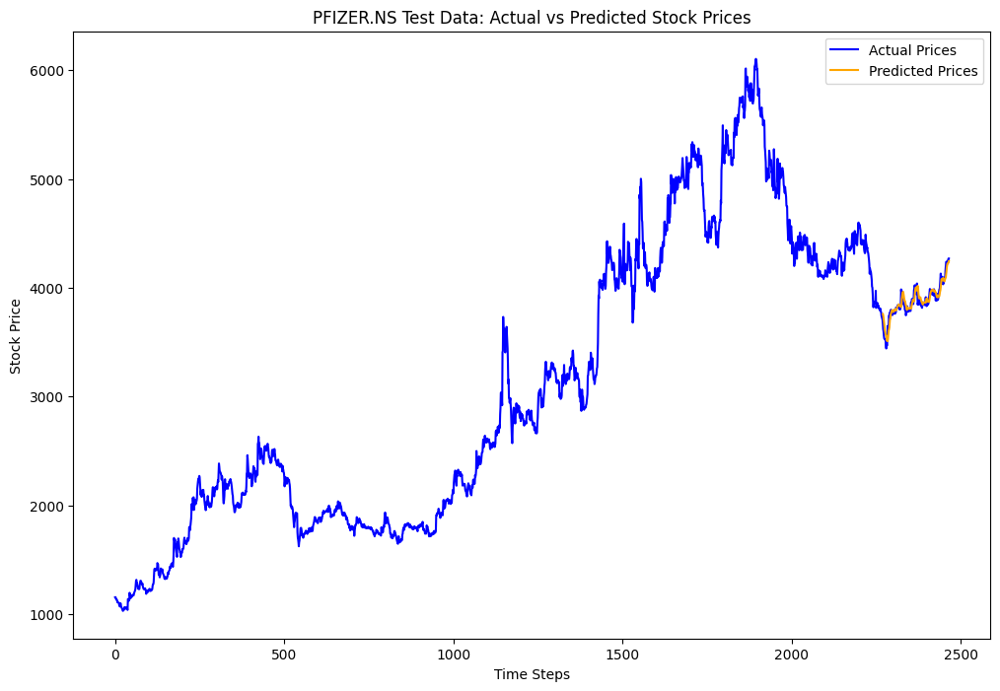

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0490, Validation Loss: 0.0233
Epoch [2/33], Loss: 0.0750, Validation Loss: 0.0634
Epoch [3/33], Loss: 0.0524, Validation Loss: 0.0379
Epoch [4/33], Loss: 0.0314, Validation Loss: 0.0005
Epoch [5/33], Loss: 0.5547, Validation Loss: 0.0748
Epoch [6/33], Loss: 0.0094, Validation Loss: 0.0181
Epoch [7/33], Loss: 0.0073, Validation Loss: 0.0116
Epoch [8/33], Loss: 0.0100, Validation Loss: 0.0120
Epoch [9/33], Loss: 0.0196, Validation Loss: 0.0239
Epoch [10/33], Loss: 0.0097, Validation Loss: 0.0141
Epoch [11/33], Loss: 0.0071, Validation Loss: 0.0067
Epoch [12/33], Loss: 0.0038, Validation Loss: 0.0056
Epoch [13/33], Loss: 0.0029, Validation Loss: 0.0023
Epoch [14/33], Loss: 0.0040, Validation Loss: 0.0028
Epoch [15/33], Loss: 0.0043, Validation Loss: 0.0017
Epoch [16/33], Loss: 0.0040, Validation Loss: 0.0008
Epoch [17/33], Loss: 0.0034, Validation Loss: 0.0041
Epoch [18/33], Loss: 0.0029, Validation Loss: 0.0018
Epoch [19/33], Loss: 0.0022, Validation Loss: 0.0012
Ep

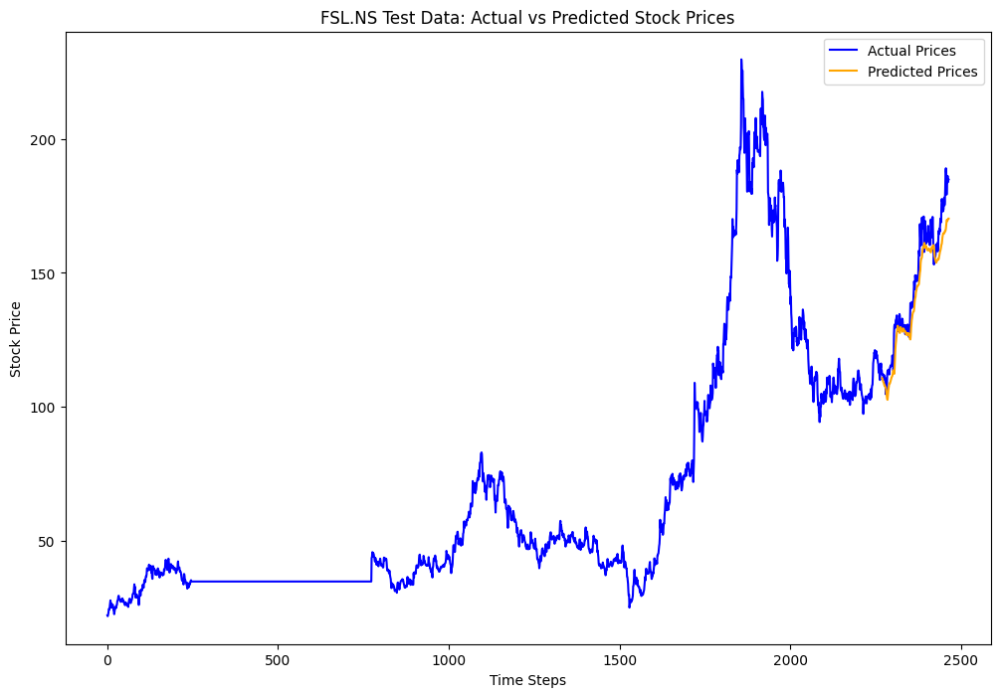

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0061, Validation Loss: 0.0349
Epoch [2/33], Loss: 0.0059, Validation Loss: 0.0361
Epoch [3/33], Loss: 0.0052, Validation Loss: 0.0332
Epoch [4/33], Loss: 0.0060, Validation Loss: 0.0377
Epoch [5/33], Loss: 0.0055, Validation Loss: 0.0420
Epoch [6/33], Loss: 0.0047, Validation Loss: 0.0411
Epoch [7/33], Loss: 0.0048, Validation Loss: 0.0401
Epoch [8/33], Loss: 0.0043, Validation Loss: 0.0388
Epoch [9/33], Loss: 0.0042, Validation Loss: 0.0378
Epoch [10/33], Loss: 0.0043, Validation Loss: 0.0344
Epoch [11/33], Loss: 0.0042, Validation Loss: 0.0337
Epoch [12/33], Loss: 0.0018, Validation Loss: 0.0054
Epoch [13/33], Loss: 0.0024, Validation Loss: 0.0084
Epoch [14/33], Loss: 0.0009, Validation Loss: 0.0013
Epoch [15/33], Loss: 0.0008, Validation Loss: 0.0006
Epoch [16/33], Loss: 0.0008, Validation Loss: 0.0053
Epoch [17/33], Loss: 0.0026, Validation Loss: 0.0231
Epoch [18/33], Loss: 0.0019, Validation Loss: 0.0096
Epoch [19/33], Loss: 0.0012, Validation Loss: 0.0005
Ep

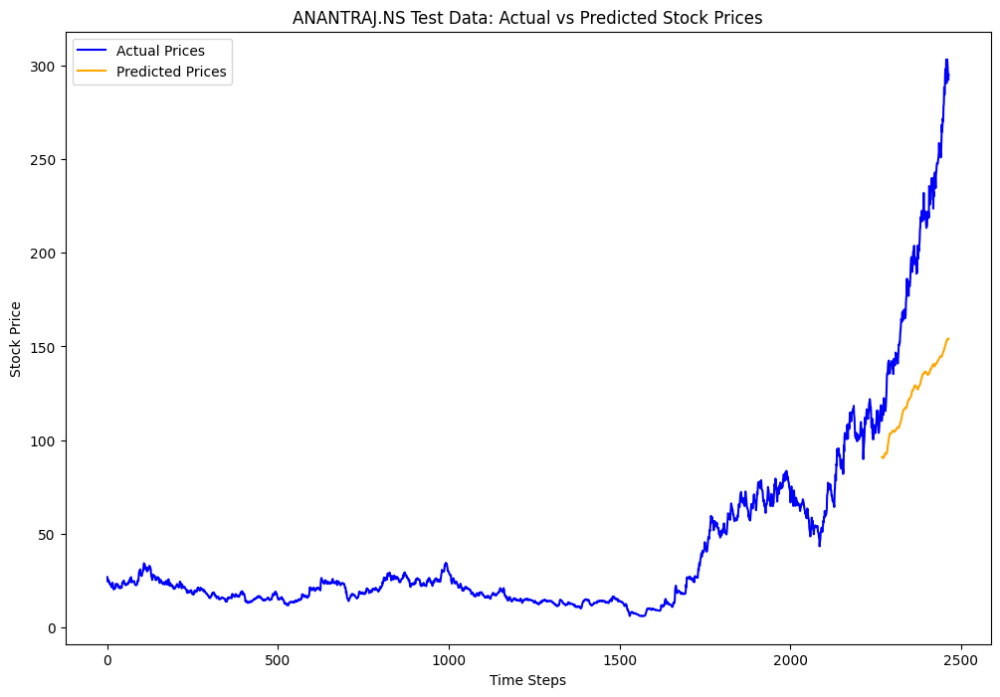

<ipython-input-64-b39c145db184>:151: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  locals()[results_name] = pd.concat([locals()[results_name], new_row], ignore_index=True)
[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0165, Validation Loss: 0.1478
Epoch [2/33], Loss: 0.0510, Validation Loss: 0.3375
Epoch [3/33], Loss: 0.0339, Validation Loss: 0.3256
Epoch [4/33], Loss: 0.0320, Validation Loss: 0.3156
Epoch [5/33], Loss: 0.0285, Validation Loss: 0.2611
Epoch [6/33], Loss: 0.0143, Validation Loss: 0.0189
Epoch [7/33], Loss: 0.0841, Validation Loss: 0.3930
Epoch [8/33], Loss: 0.0358, Validation Loss: 0.3521
Epoch [9/33], Loss: 0.0349, Validation Loss: 0.3279
Epoch [10/33], Loss: 0.0295, Validation Loss: 0.2901
Epoch [11/33], Loss: 0.0271, Validation Loss: 0.2286
Epoch [12/33], Loss: 0.0157, Validation Loss: 0.0813
Epoch [13/33], Loss: 0.0083, Validation Loss: 0.0006
Epoch [14/33], Loss: 0.0091, Validation Loss: 0.0304
Epoch [15/33], Loss: 0.0108, Validation Loss: 0.0027
Epoch [16/33], Loss: 0.0222, Validation Loss: 0.2419
Epoch [17/33], Loss: 0.0202, Validation Loss: 0.1599
Epoch [18/33], Loss: 0.0081, Validation Loss: 0.0401
Epoch [19/33], Loss: 0.0036, Validation Loss: 0.0014
Ep

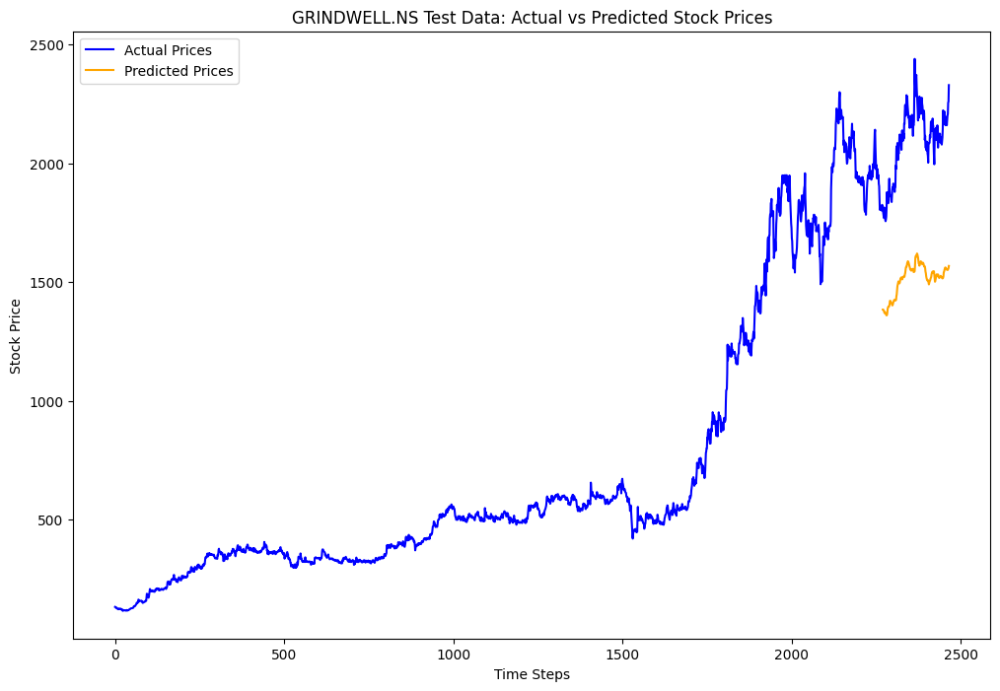

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0251, Validation Loss: 0.1046
Epoch [2/33], Loss: 0.0063, Validation Loss: 0.1313
Epoch [3/33], Loss: 0.0074, Validation Loss: 0.1271
Epoch [4/33], Loss: 0.0074, Validation Loss: 0.1141
Epoch [5/33], Loss: 0.0068, Validation Loss: 0.1135
Epoch [6/33], Loss: 0.0064, Validation Loss: 0.1162
Epoch [7/33], Loss: 0.0067, Validation Loss: 0.1114
Epoch [8/33], Loss: 0.0064, Validation Loss: 0.1062
Epoch [9/33], Loss: 0.0062, Validation Loss: 0.1014
Epoch [10/33], Loss: 0.0060, Validation Loss: 0.0904
Epoch [11/33], Loss: 0.0056, Validation Loss: 0.0722
Epoch [12/33], Loss: 0.0048, Validation Loss: 0.0201
Epoch [13/33], Loss: 0.0034, Validation Loss: 0.1529
Epoch [14/33], Loss: 0.0201, Validation Loss: 0.1308
Epoch [15/33], Loss: 0.0103, Validation Loss: 0.1206
Epoch [16/33], Loss: 0.0079, Validation Loss: 0.0929
Epoch [17/33], Loss: 0.0069, Validation Loss: 0.0954
Epoch [18/33], Loss: 0.0056, Validation Loss: 0.1080
Epoch [19/33], Loss: 0.0059, Validation Loss: 0.1092
Ep

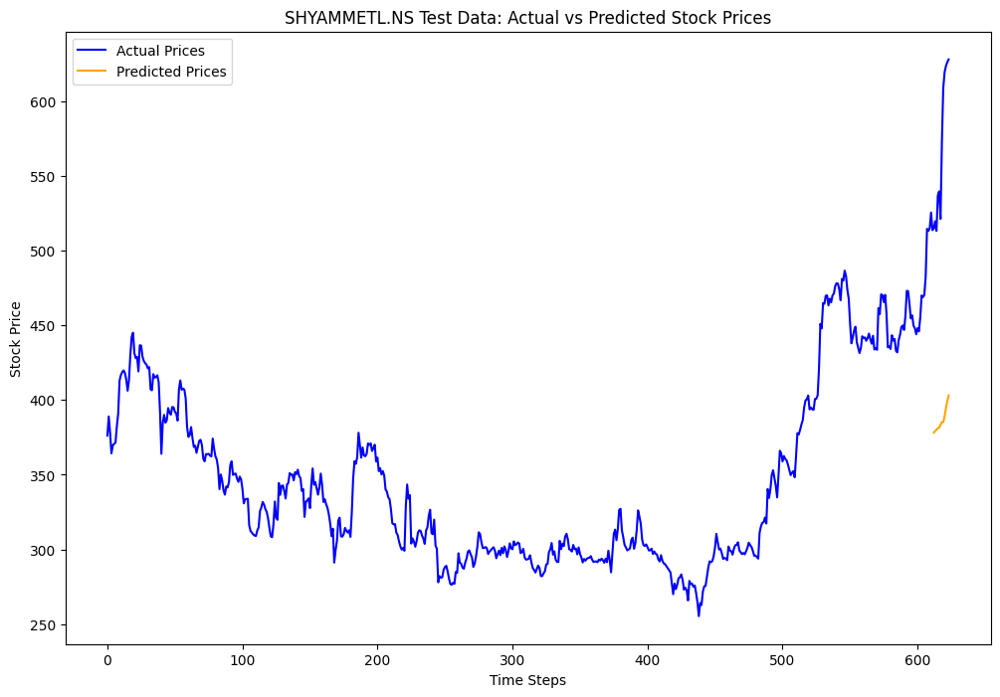

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0306, Validation Loss: 0.0826
Epoch [2/33], Loss: 0.1712, Validation Loss: 0.0024
Epoch [3/33], Loss: 0.1079, Validation Loss: 0.0013
Epoch [4/33], Loss: 0.0663, Validation Loss: 0.0018
Epoch [5/33], Loss: 0.0279, Validation Loss: 0.0460
Epoch [6/33], Loss: 0.0122, Validation Loss: 0.0003
Epoch [7/33], Loss: 0.0025, Validation Loss: 0.0003
Epoch [8/33], Loss: 0.0034, Validation Loss: 0.0006
Epoch [9/33], Loss: 0.0025, Validation Loss: 0.0016
Epoch [10/33], Loss: 0.0037, Validation Loss: 0.0006
Epoch [11/33], Loss: 0.0030, Validation Loss: 0.0078
Epoch [12/33], Loss: 0.0037, Validation Loss: 0.0025
Epoch [13/33], Loss: 0.0030, Validation Loss: 0.0021
Epoch [14/33], Loss: 0.0023, Validation Loss: 0.0015
Epoch [15/33], Loss: 0.0023, Validation Loss: 0.0032
Epoch [16/33], Loss: 0.0024, Validation Loss: 0.0011
Epoch [17/33], Loss: 0.0031, Validation Loss: 0.0010
Epoch [18/33], Loss: 0.0035, Validation Loss: 0.0104
Epoch [19/33], Loss: 0.0053, Validation Loss: 0.0048
Ep

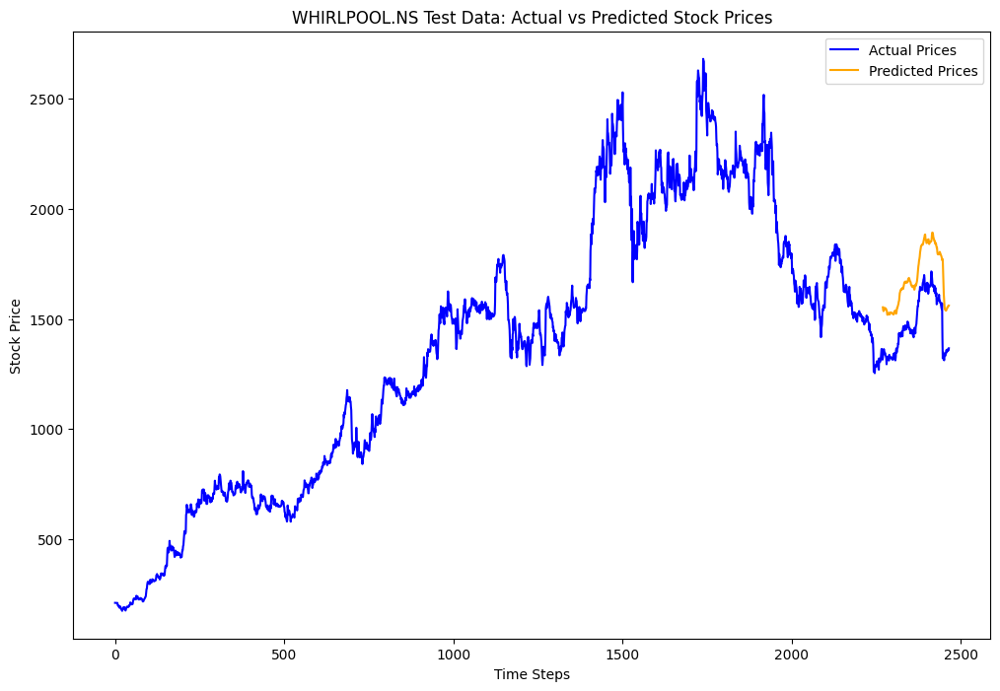

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0548, Validation Loss: 0.0120
Epoch [2/33], Loss: 0.1986, Validation Loss: 0.1364
Epoch [3/33], Loss: 0.0811, Validation Loss: 0.0104
Epoch [4/33], Loss: 0.0651, Validation Loss: 0.0019
Epoch [5/33], Loss: 0.0693, Validation Loss: 0.0010
Epoch [6/33], Loss: 0.0415, Validation Loss: 0.0099
Epoch [7/33], Loss: 0.0081, Validation Loss: 0.0118
Epoch [8/33], Loss: 0.0067, Validation Loss: 0.0038
Epoch [9/33], Loss: 0.0087, Validation Loss: 0.0008
Epoch [10/33], Loss: 0.0048, Validation Loss: 0.0032
Epoch [11/33], Loss: 0.0043, Validation Loss: 0.0016
Epoch [12/33], Loss: 0.0041, Validation Loss: 0.0010
Epoch [13/33], Loss: 0.0038, Validation Loss: 0.0004
Epoch [14/33], Loss: 0.0061, Validation Loss: 0.0011
Epoch [15/33], Loss: 0.0042, Validation Loss: 0.0021
Epoch [16/33], Loss: 0.0036, Validation Loss: 0.0005
Epoch [17/33], Loss: 0.0037, Validation Loss: 0.0004
Epoch [18/33], Loss: 0.0033, Validation Loss: 0.0005
Epoch [19/33], Loss: 0.0034, Validation Loss: 0.0003
Ep

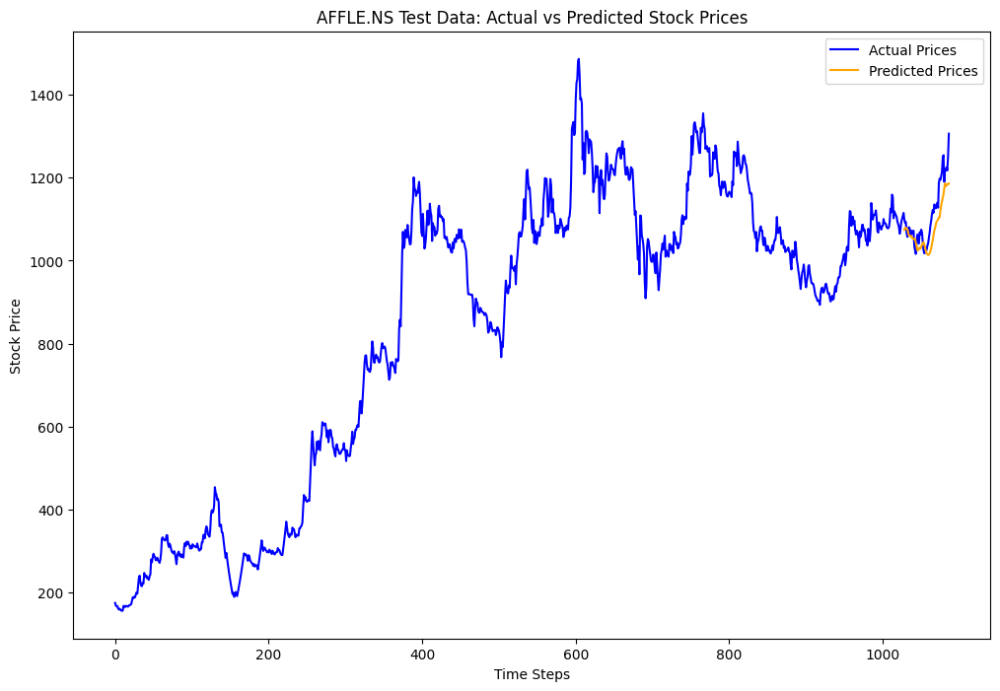

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.1440, Validation Loss: 0.0073
Epoch [2/33], Loss: 0.0445, Validation Loss: 0.0015
Epoch [3/33], Loss: 0.0362, Validation Loss: 0.0053
Epoch [4/33], Loss: 0.0302, Validation Loss: 0.0007
Epoch [5/33], Loss: 0.0307, Validation Loss: 0.0015
Epoch [6/33], Loss: 0.0263, Validation Loss: 0.0014
Epoch [7/33], Loss: 0.0227, Validation Loss: 0.0007
Epoch [8/33], Loss: 0.0145, Validation Loss: 0.0009
Epoch [9/33], Loss: 0.0066, Validation Loss: 0.0025
Epoch [10/33], Loss: 0.0098, Validation Loss: 0.0066
Epoch [11/33], Loss: 0.0181, Validation Loss: 0.0038
Epoch [12/33], Loss: 0.0099, Validation Loss: 0.0006
Epoch [13/33], Loss: 0.0046, Validation Loss: 0.0007
Epoch [14/33], Loss: 0.0063, Validation Loss: 0.0014
Epoch [15/33], Loss: 0.0056, Validation Loss: 0.0003
Epoch [16/33], Loss: 0.0064, Validation Loss: 0.0005
Epoch [17/33], Loss: 0.0042, Validation Loss: 0.0012
Epoch [18/33], Loss: 0.0030, Validation Loss: 0.0010
Epoch [19/33], Loss: 0.0049, Validation Loss: 0.0005
Ep

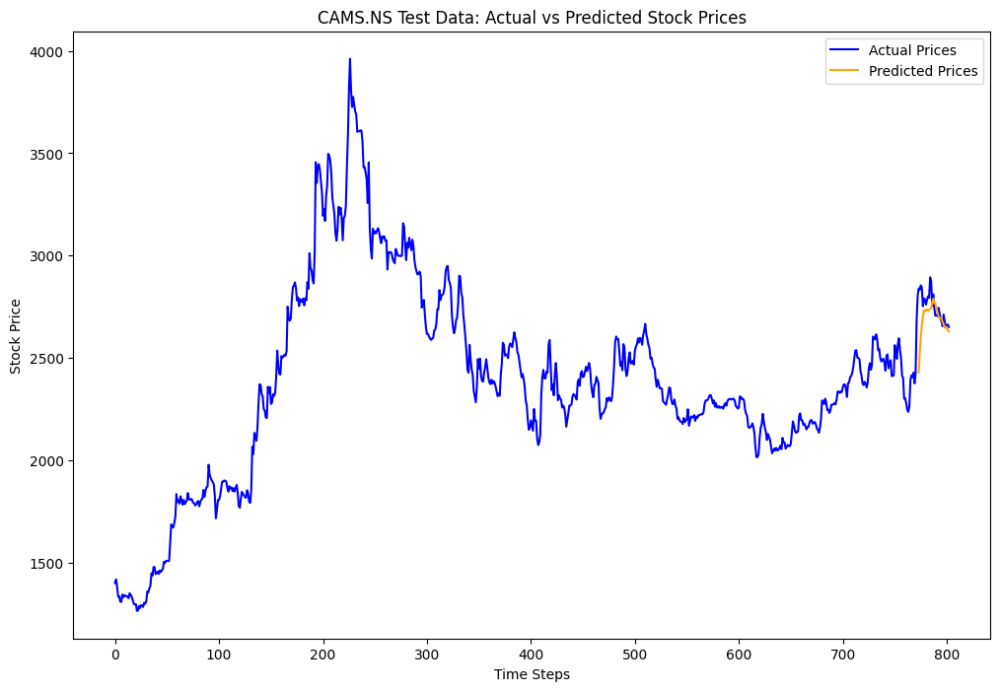

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0092, Validation Loss: 0.1215
Epoch [2/33], Loss: 0.0075, Validation Loss: 0.1178
Epoch [3/33], Loss: 0.0074, Validation Loss: 0.1080
Epoch [4/33], Loss: 0.0064, Validation Loss: 0.0986
Epoch [5/33], Loss: 0.0061, Validation Loss: 0.0931
Epoch [6/33], Loss: 0.0058, Validation Loss: 0.0898
Epoch [7/33], Loss: 0.0058, Validation Loss: 0.0871
Epoch [8/33], Loss: 0.0055, Validation Loss: 0.0871
Epoch [9/33], Loss: 0.0052, Validation Loss: 0.0753
Epoch [10/33], Loss: 0.0043, Validation Loss: 0.0768
Epoch [11/33], Loss: 0.0035, Validation Loss: 0.0549
Epoch [12/33], Loss: 0.0018, Validation Loss: 0.0149
Epoch [13/33], Loss: 0.0013, Validation Loss: 0.0031
Epoch [14/33], Loss: 0.0027, Validation Loss: 0.0352
Epoch [15/33], Loss: 0.0006, Validation Loss: 0.0031
Epoch [16/33], Loss: 0.0006, Validation Loss: 0.0035
Epoch [17/33], Loss: 0.0025, Validation Loss: 0.0261
Epoch [18/33], Loss: 0.0007, Validation Loss: 0.0016
Epoch [19/33], Loss: 0.0004, Validation Loss: 0.0010
Ep

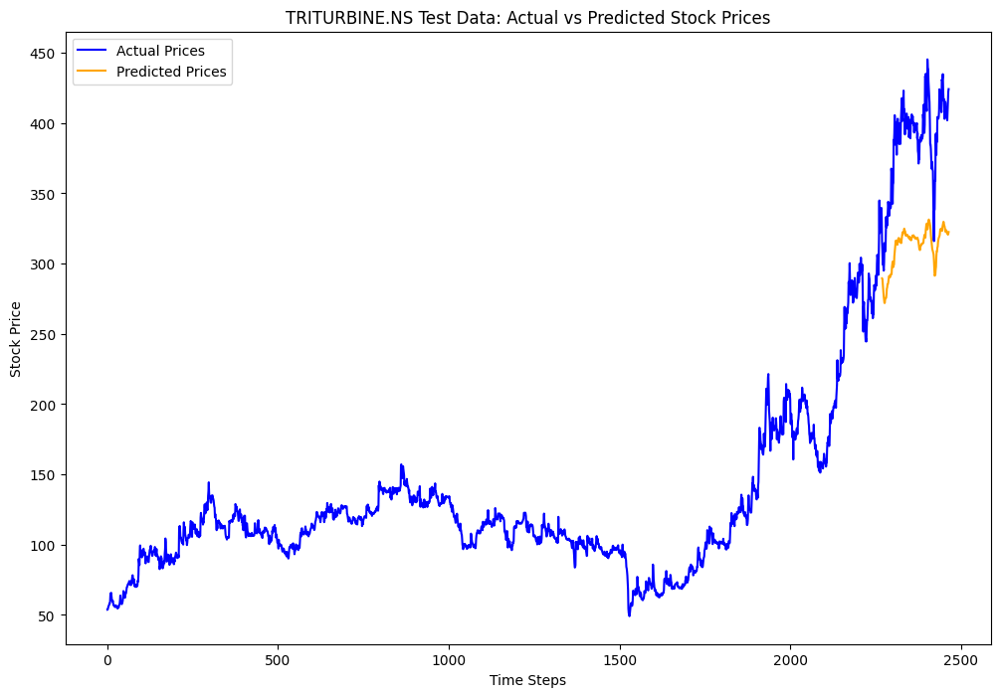

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0303, Validation Loss: 0.0349
Epoch [2/33], Loss: 0.0316, Validation Loss: 0.0929
Epoch [3/33], Loss: 0.0133, Validation Loss: 0.0407
Epoch [4/33], Loss: 0.0212, Validation Loss: 0.0627
Epoch [5/33], Loss: 0.0141, Validation Loss: 0.0434
Epoch [6/33], Loss: 0.0171, Validation Loss: 0.0480
Epoch [7/33], Loss: 0.0121, Validation Loss: 0.0167
Epoch [8/33], Loss: 0.0081, Validation Loss: 0.0017
Epoch [9/33], Loss: 0.0101, Validation Loss: 0.0026
Epoch [10/33], Loss: 0.0045, Validation Loss: 0.0021
Epoch [11/33], Loss: 0.0022, Validation Loss: 0.0006
Epoch [12/33], Loss: 0.0011, Validation Loss: 0.0003
Epoch [13/33], Loss: 0.0012, Validation Loss: 0.0005
Epoch [14/33], Loss: 0.0012, Validation Loss: 0.0003
Epoch [15/33], Loss: 0.0010, Validation Loss: 0.0003
Epoch [16/33], Loss: 0.0009, Validation Loss: 0.0003
Epoch [17/33], Loss: 0.0010, Validation Loss: 0.0003
Epoch [18/33], Loss: 0.0010, Validation Loss: 0.0004
Epoch [19/33], Loss: 0.0012, Validation Loss: 0.0003
Ep

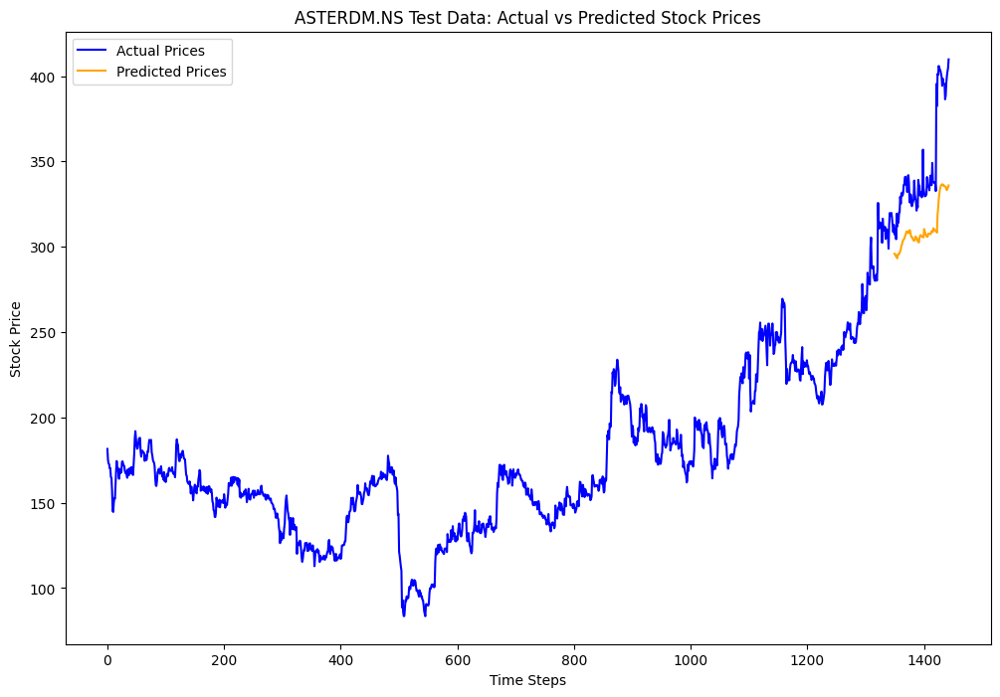

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0144, Validation Loss: 0.1235
Epoch [2/33], Loss: 0.1648, Validation Loss: 0.1926
Epoch [3/33], Loss: 0.1579, Validation Loss: 0.0053
Epoch [4/33], Loss: 0.0442, Validation Loss: 0.0060
Epoch [5/33], Loss: 0.0270, Validation Loss: 0.0236
Epoch [6/33], Loss: 0.0097, Validation Loss: 0.0065
Epoch [7/33], Loss: 0.0162, Validation Loss: 0.0028
Epoch [8/33], Loss: 0.0148, Validation Loss: 0.0007
Epoch [9/33], Loss: 0.0063, Validation Loss: 0.0006
Epoch [10/33], Loss: 0.0041, Validation Loss: 0.0007
Epoch [11/33], Loss: 0.0029, Validation Loss: 0.0015
Epoch [12/33], Loss: 0.0028, Validation Loss: 0.0015
Epoch [13/33], Loss: 0.0030, Validation Loss: 0.0011
Epoch [14/33], Loss: 0.0027, Validation Loss: 0.0041
Epoch [15/33], Loss: 0.0048, Validation Loss: 0.0025
Epoch [16/33], Loss: 0.0068, Validation Loss: 0.0055
Epoch [17/33], Loss: 0.0097, Validation Loss: 0.0035
Epoch [18/33], Loss: 0.0044, Validation Loss: 0.0040
Epoch [19/33], Loss: 0.0039, Validation Loss: 0.0020
Ep

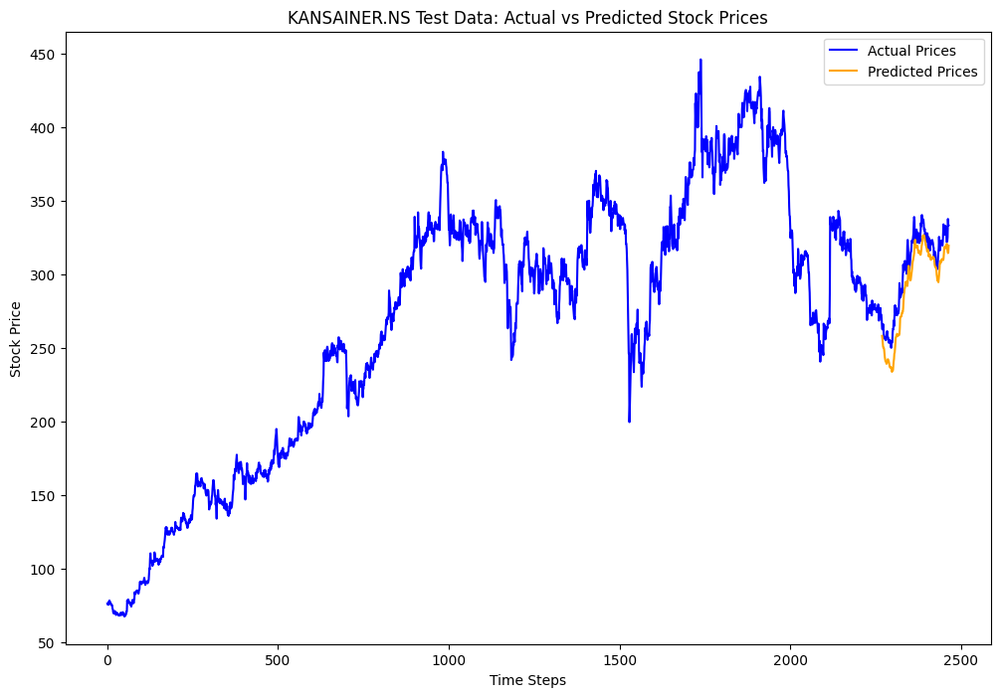

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0059, Validation Loss: 0.0042
Epoch [2/33], Loss: 0.1268, Validation Loss: 0.3074
Epoch [3/33], Loss: 0.0685, Validation Loss: 0.2160
Epoch [4/33], Loss: 0.0689, Validation Loss: 0.1708
Epoch [5/33], Loss: 0.0372, Validation Loss: 0.0205
Epoch [6/33], Loss: 0.0574, Validation Loss: 0.1473
Epoch [7/33], Loss: 0.0150, Validation Loss: 0.0098
Epoch [8/33], Loss: 0.0075, Validation Loss: 0.0151
Epoch [9/33], Loss: 0.0038, Validation Loss: 0.0008
Epoch [10/33], Loss: 0.0051, Validation Loss: 0.0011
Epoch [11/33], Loss: 0.0074, Validation Loss: 0.0011
Epoch [12/33], Loss: 0.0050, Validation Loss: 0.0010
Epoch [13/33], Loss: 0.0026, Validation Loss: 0.0014
Epoch [14/33], Loss: 0.0011, Validation Loss: 0.0015
Epoch [15/33], Loss: 0.0017, Validation Loss: 0.0021
Epoch [16/33], Loss: 0.0049, Validation Loss: 0.0137
Epoch [17/33], Loss: 0.0045, Validation Loss: 0.0099
Epoch [18/33], Loss: 0.0160, Validation Loss: 0.0416
Epoch [19/33], Loss: 0.0085, Validation Loss: 0.0008
Ep

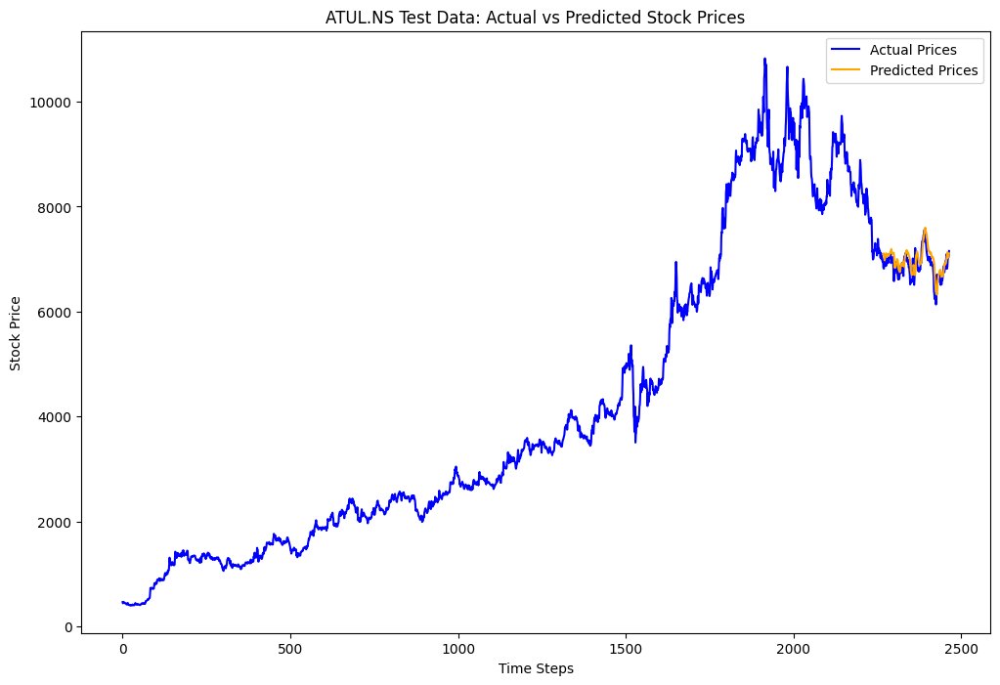

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0373, Validation Loss: 0.1552
Epoch [2/33], Loss: 0.1020, Validation Loss: 0.0077
Epoch [3/33], Loss: 0.0448, Validation Loss: 0.0046
Epoch [4/33], Loss: 0.0401, Validation Loss: 0.0143
Epoch [5/33], Loss: 0.0285, Validation Loss: 0.0282
Epoch [6/33], Loss: 0.0239, Validation Loss: 0.0179
Epoch [7/33], Loss: 0.0134, Validation Loss: 0.0012
Epoch [8/33], Loss: 0.0042, Validation Loss: 0.0010
Epoch [9/33], Loss: 0.0028, Validation Loss: 0.0016
Epoch [10/33], Loss: 0.0032, Validation Loss: 0.0049
Epoch [11/33], Loss: 0.0035, Validation Loss: 0.0005
Epoch [12/33], Loss: 0.0026, Validation Loss: 0.0018
Epoch [13/33], Loss: 0.0016, Validation Loss: 0.0003
Epoch [14/33], Loss: 0.0019, Validation Loss: 0.0015
Epoch [15/33], Loss: 0.0016, Validation Loss: 0.0007
Epoch [16/33], Loss: 0.0016, Validation Loss: 0.0014
Epoch [17/33], Loss: 0.0016, Validation Loss: 0.0004
Epoch [18/33], Loss: 0.0014, Validation Loss: 0.0008
Epoch [19/33], Loss: 0.0016, Validation Loss: 0.0006
Ep

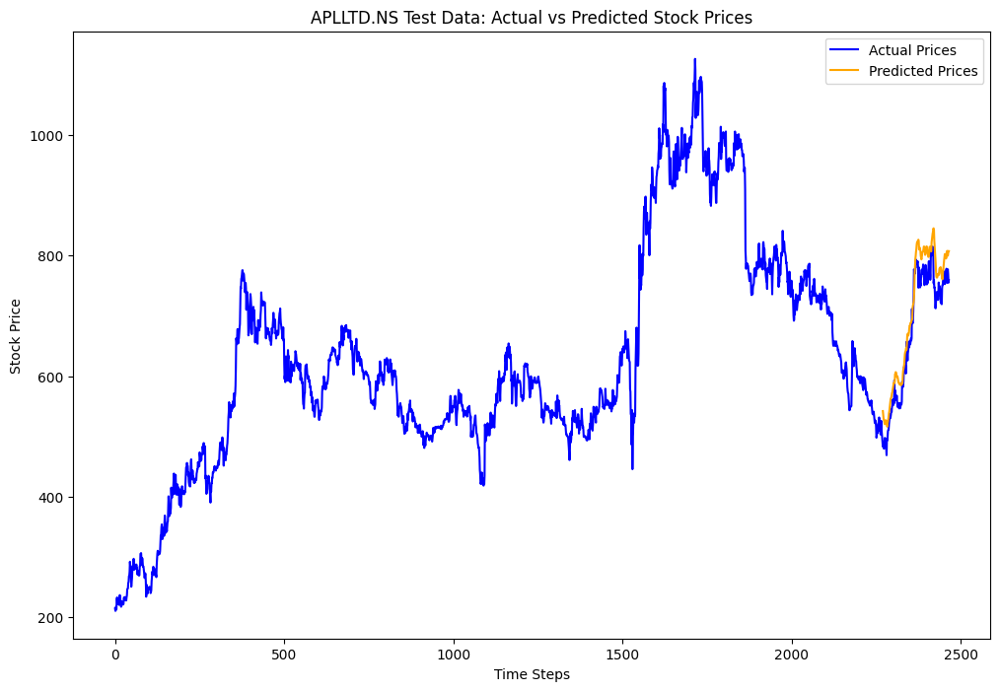

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0147, Validation Loss: 0.0146
Epoch [2/33], Loss: 0.0096, Validation Loss: 0.0114
Epoch [3/33], Loss: 0.0093, Validation Loss: 0.0102
Epoch [4/33], Loss: 0.0086, Validation Loss: 0.0073
Epoch [5/33], Loss: 0.0080, Validation Loss: 0.0040
Epoch [6/33], Loss: 0.0045, Validation Loss: 0.0081
Epoch [7/33], Loss: 0.0051, Validation Loss: 0.0201
Epoch [8/33], Loss: 0.0096, Validation Loss: 0.0045
Epoch [9/33], Loss: 0.0013, Validation Loss: 0.0004
Epoch [10/33], Loss: 0.0013, Validation Loss: 0.0004
Epoch [11/33], Loss: 0.0015, Validation Loss: 0.0001
Epoch [12/33], Loss: 0.0027, Validation Loss: 0.0013
Epoch [13/33], Loss: 0.0010, Validation Loss: 0.0001
Epoch [14/33], Loss: 0.0008, Validation Loss: 0.0003
Epoch [15/33], Loss: 0.0009, Validation Loss: 0.0001
Epoch [16/33], Loss: 0.0020, Validation Loss: 0.0011
Epoch [17/33], Loss: 0.0007, Validation Loss: 0.0001
Epoch [18/33], Loss: 0.0013, Validation Loss: 0.0008
Epoch [19/33], Loss: 0.0008, Validation Loss: 0.0001
Ep

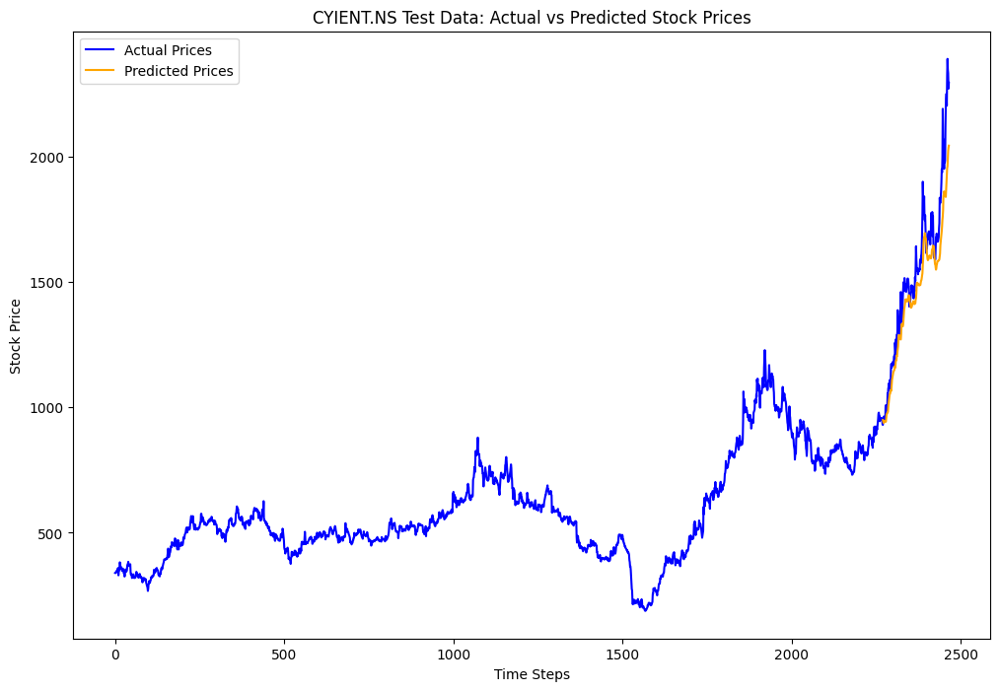

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0402, Validation Loss: 0.1080
Epoch [2/33], Loss: 0.0424, Validation Loss: 0.0797
Epoch [3/33], Loss: 0.0314, Validation Loss: 0.0058
Epoch [4/33], Loss: 0.0542, Validation Loss: 0.0778
Epoch [5/33], Loss: 0.0092, Validation Loss: 0.0054
Epoch [6/33], Loss: 0.0130, Validation Loss: 0.0139
Epoch [7/33], Loss: 0.0059, Validation Loss: 0.0009
Epoch [8/33], Loss: 0.0039, Validation Loss: 0.0036
Epoch [9/33], Loss: 0.0041, Validation Loss: 0.0007
Epoch [10/33], Loss: 0.0079, Validation Loss: 0.0158
Epoch [11/33], Loss: 0.0051, Validation Loss: 0.0013
Epoch [12/33], Loss: 0.0044, Validation Loss: 0.0037
Epoch [13/33], Loss: 0.0042, Validation Loss: 0.0007
Epoch [14/33], Loss: 0.0079, Validation Loss: 0.0143
Epoch [15/33], Loss: 0.0053, Validation Loss: 0.0015
Epoch [16/33], Loss: 0.0040, Validation Loss: 0.0044
Epoch [17/33], Loss: 0.0036, Validation Loss: 0.0011
Epoch [18/33], Loss: 0.0063, Validation Loss: 0.0107
Epoch [19/33], Loss: 0.0048, Validation Loss: 0.0016
Ep

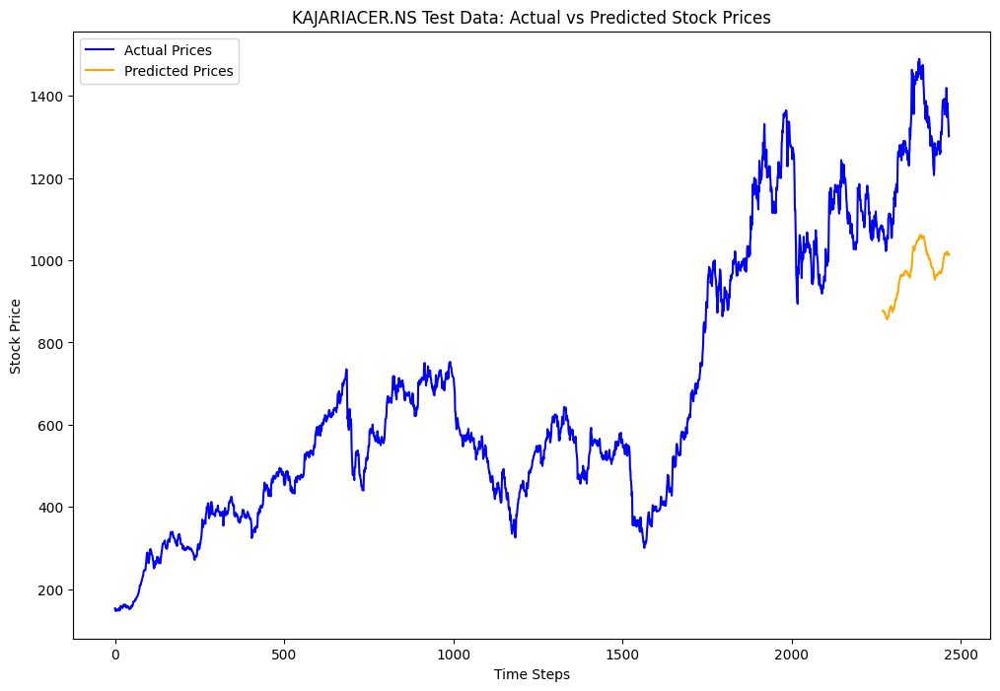

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0050, Validation Loss: 0.0464
Epoch [2/33], Loss: 0.0052, Validation Loss: 0.0286
Epoch [3/33], Loss: 0.0069, Validation Loss: 0.0334
Epoch [4/33], Loss: 0.0065, Validation Loss: 0.0394
Epoch [5/33], Loss: 0.0056, Validation Loss: 0.0422
Epoch [6/33], Loss: 0.0051, Validation Loss: 0.0409
Epoch [7/33], Loss: 0.0052, Validation Loss: 0.0387
Epoch [8/33], Loss: 0.0050, Validation Loss: 0.0342
Epoch [9/33], Loss: 0.0049, Validation Loss: 0.0132
Epoch [10/33], Loss: 0.0039, Validation Loss: 0.0281
Epoch [11/33], Loss: 0.0058, Validation Loss: 0.0342
Epoch [12/33], Loss: 0.0033, Validation Loss: 0.0110
Epoch [13/33], Loss: 0.0015, Validation Loss: 0.0070
Epoch [14/33], Loss: 0.0009, Validation Loss: 0.0017
Epoch [15/33], Loss: 0.0008, Validation Loss: 0.0025
Epoch [16/33], Loss: 0.0007, Validation Loss: 0.0014
Epoch [17/33], Loss: 0.0007, Validation Loss: 0.0012
Epoch [18/33], Loss: 0.0006, Validation Loss: 0.0014
Epoch [19/33], Loss: 0.0005, Validation Loss: 0.0015
Ep

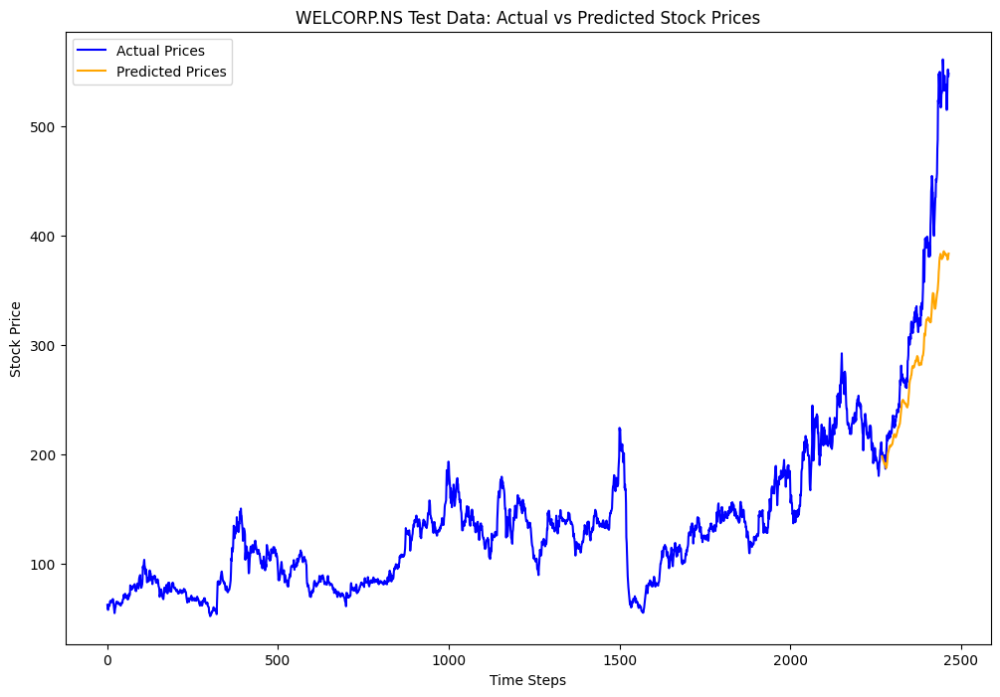

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0007, Validation Loss: 0.0107
Epoch [2/33], Loss: 0.0008, Validation Loss: 0.0117
Epoch [3/33], Loss: 0.0006, Validation Loss: 0.0117
Epoch [4/33], Loss: 0.0006, Validation Loss: 0.0120
Epoch [5/33], Loss: 0.0007, Validation Loss: 0.0129
Epoch [6/33], Loss: 0.0007, Validation Loss: 0.0139
Epoch [7/33], Loss: 0.0008, Validation Loss: 0.0152
Epoch [8/33], Loss: 0.0007, Validation Loss: 0.0162
Epoch [9/33], Loss: 0.0007, Validation Loss: 0.0168
Epoch [10/33], Loss: 0.0007, Validation Loss: 0.0173
Epoch [11/33], Loss: 0.0007, Validation Loss: 0.0173
Epoch [12/33], Loss: 0.0006, Validation Loss: 0.0171
Epoch [13/33], Loss: 0.0006, Validation Loss: 0.0171
Epoch [14/33], Loss: 0.0006, Validation Loss: 0.0170
Epoch [15/33], Loss: 0.0005, Validation Loss: 0.0169
Epoch [16/33], Loss: 0.0006, Validation Loss: 0.0169
Epoch [17/33], Loss: 0.0005, Validation Loss: 0.0168
Epoch [18/33], Loss: 0.0005, Validation Loss: 0.0168
Epoch [19/33], Loss: 0.0005, Validation Loss: 0.0168
Ep

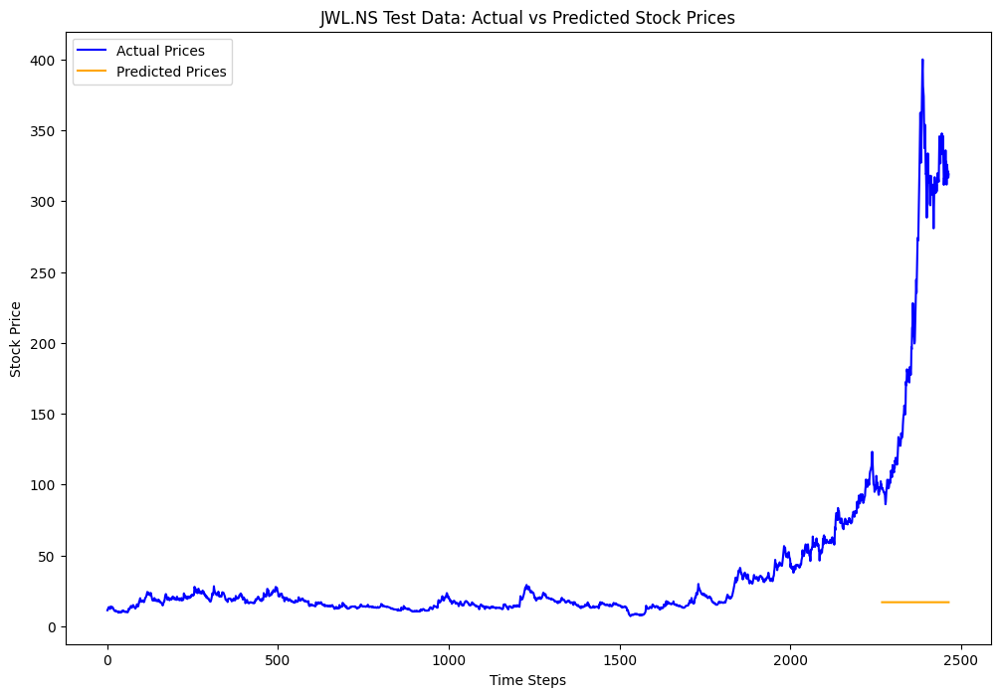

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0298, Validation Loss: 0.0970
Epoch [2/33], Loss: 0.1079, Validation Loss: 0.0821
Epoch [3/33], Loss: 0.0639, Validation Loss: 0.0069
Epoch [4/33], Loss: 0.0137, Validation Loss: 0.0005
Epoch [5/33], Loss: 0.0032, Validation Loss: 0.0011
Epoch [6/33], Loss: 0.0043, Validation Loss: 0.0003
Epoch [7/33], Loss: 0.0038, Validation Loss: 0.0004
Epoch [8/33], Loss: 0.0025, Validation Loss: 0.0007
Epoch [9/33], Loss: 0.0023, Validation Loss: 0.0004
Epoch [10/33], Loss: 0.0032, Validation Loss: 0.0009
Epoch [11/33], Loss: 0.0021, Validation Loss: 0.0015
Epoch [12/33], Loss: 0.0043, Validation Loss: 0.0007
Epoch [13/33], Loss: 0.0062, Validation Loss: 0.0014
Epoch [14/33], Loss: 0.0026, Validation Loss: 0.0004
Epoch [15/33], Loss: 0.0033, Validation Loss: 0.0006
Epoch [16/33], Loss: 0.0021, Validation Loss: 0.0003
Epoch [17/33], Loss: 0.0043, Validation Loss: 0.0017
Epoch [18/33], Loss: 0.0038, Validation Loss: 0.0003
Epoch [19/33], Loss: 0.0055, Validation Loss: 0.0005
Ep

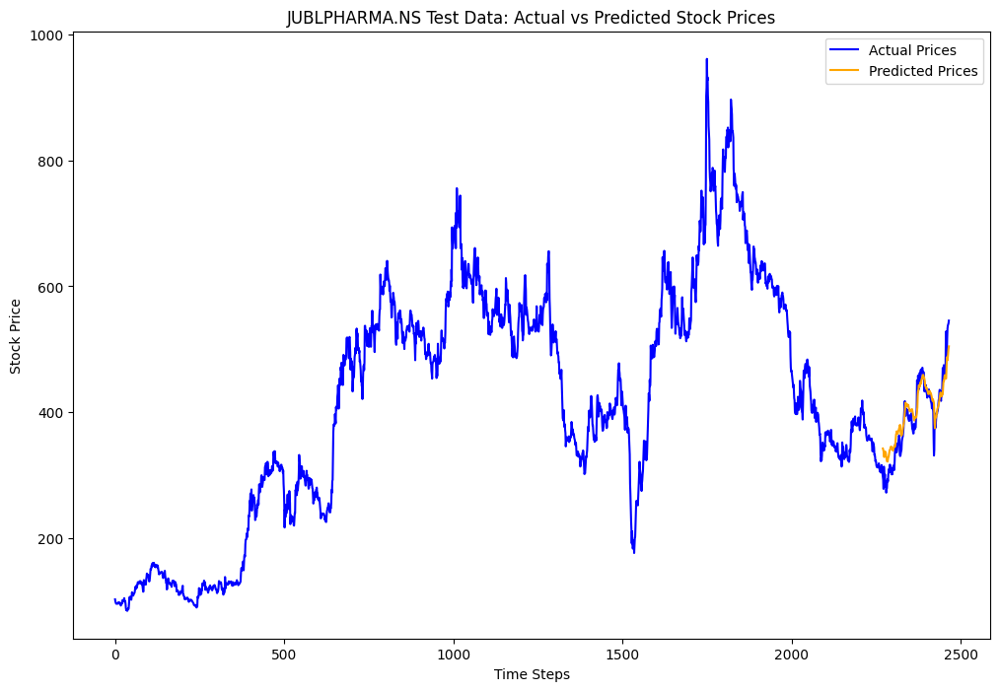

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0288, Validation Loss: 0.0133
Epoch [2/33], Loss: 0.1229, Validation Loss: 0.0107
Epoch [3/33], Loss: 0.0896, Validation Loss: 0.0057
Epoch [4/33], Loss: 0.0892, Validation Loss: 0.0528
Epoch [5/33], Loss: 0.0161, Validation Loss: 0.0023
Epoch [6/33], Loss: 0.0098, Validation Loss: 0.0010
Epoch [7/33], Loss: 0.0138, Validation Loss: 0.0009
Epoch [8/33], Loss: 0.0053, Validation Loss: 0.0030
Epoch [9/33], Loss: 0.0031, Validation Loss: 0.0009
Epoch [10/33], Loss: 0.0023, Validation Loss: 0.0007
Epoch [11/33], Loss: 0.0030, Validation Loss: 0.0011
Epoch [12/33], Loss: 0.0021, Validation Loss: 0.0012
Epoch [13/33], Loss: 0.0051, Validation Loss: 0.0025
Epoch [14/33], Loss: 0.0022, Validation Loss: 0.0007
Epoch [15/33], Loss: 0.0028, Validation Loss: 0.0019
Epoch [16/33], Loss: 0.0033, Validation Loss: 0.0019
Epoch [17/33], Loss: 0.0027, Validation Loss: 0.0014
Epoch [18/33], Loss: 0.0025, Validation Loss: 0.0008
Epoch [19/33], Loss: 0.0017, Validation Loss: 0.0005
Ep

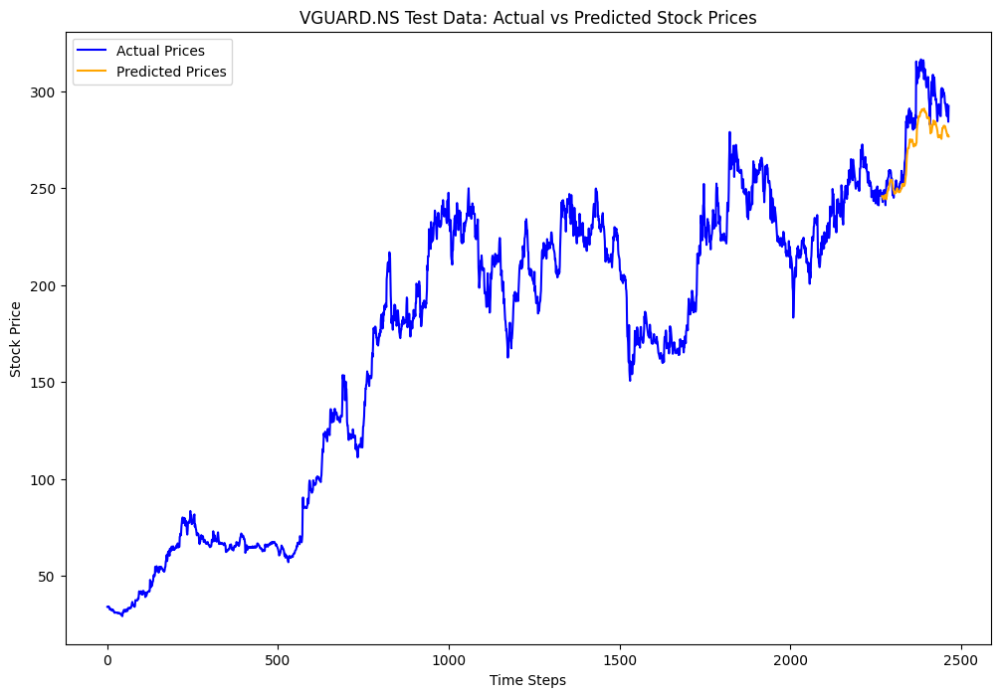

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0408, Validation Loss: 0.0219
Epoch [2/33], Loss: 0.0530, Validation Loss: 0.0030
Epoch [3/33], Loss: 0.0374, Validation Loss: 0.0028
Epoch [4/33], Loss: 0.0288, Validation Loss: 0.0014
Epoch [5/33], Loss: 0.0186, Validation Loss: 0.0028
Epoch [6/33], Loss: 0.0118, Validation Loss: 0.0114
Epoch [7/33], Loss: 0.0117, Validation Loss: 0.0010
Epoch [8/33], Loss: 0.0053, Validation Loss: 0.0015
Epoch [9/33], Loss: 0.0019, Validation Loss: 0.0004
Epoch [10/33], Loss: 0.0020, Validation Loss: 0.0005
Epoch [11/33], Loss: 0.0019, Validation Loss: 0.0005
Epoch [12/33], Loss: 0.0017, Validation Loss: 0.0005
Epoch [13/33], Loss: 0.0015, Validation Loss: 0.0004
Epoch [14/33], Loss: 0.0015, Validation Loss: 0.0002
Epoch [15/33], Loss: 0.0013, Validation Loss: 0.0003
Epoch [16/33], Loss: 0.0014, Validation Loss: 0.0005
Epoch [17/33], Loss: 0.0014, Validation Loss: 0.0003
Epoch [18/33], Loss: 0.0014, Validation Loss: 0.0002
Epoch [19/33], Loss: 0.0015, Validation Loss: 0.0003
Ep

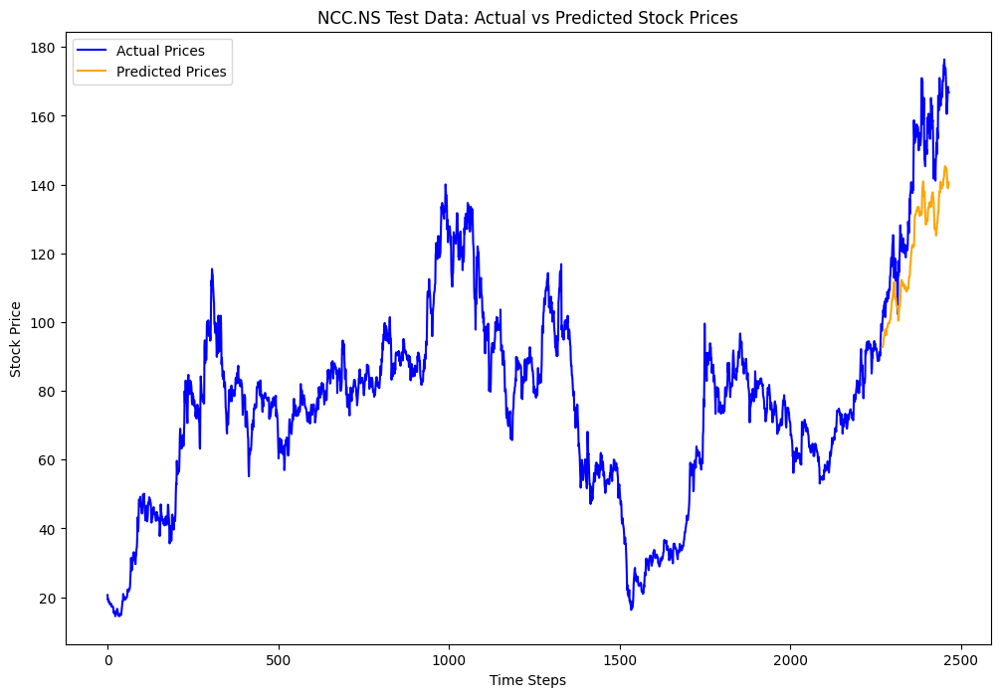

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0135, Validation Loss: 0.3059
Epoch [2/33], Loss: 0.0130, Validation Loss: 0.2380
Epoch [3/33], Loss: 0.0175, Validation Loss: 0.2673
Epoch [4/33], Loss: 0.0167, Validation Loss: 0.2710
Epoch [5/33], Loss: 0.0136, Validation Loss: 0.2433
Epoch [6/33], Loss: 0.0107, Validation Loss: 0.1273
Epoch [7/33], Loss: 0.0074, Validation Loss: 0.0119
Epoch [8/33], Loss: 0.0078, Validation Loss: 0.1153
Epoch [9/33], Loss: 0.0047, Validation Loss: 0.0316
Epoch [10/33], Loss: 0.0021, Validation Loss: 0.0345
Epoch [11/33], Loss: 0.0028, Validation Loss: 0.0059
Epoch [12/33], Loss: 0.0041, Validation Loss: 0.1092
Epoch [13/33], Loss: 0.0041, Validation Loss: 0.0059
Epoch [14/33], Loss: 0.0010, Validation Loss: 0.0026
Epoch [15/33], Loss: 0.0004, Validation Loss: 0.0019
Epoch [16/33], Loss: 0.0004, Validation Loss: 0.0029
Epoch [17/33], Loss: 0.0006, Validation Loss: 0.0019
Epoch [18/33], Loss: 0.0013, Validation Loss: 0.0240
Epoch [19/33], Loss: 0.0017, Validation Loss: 0.0018
Ep

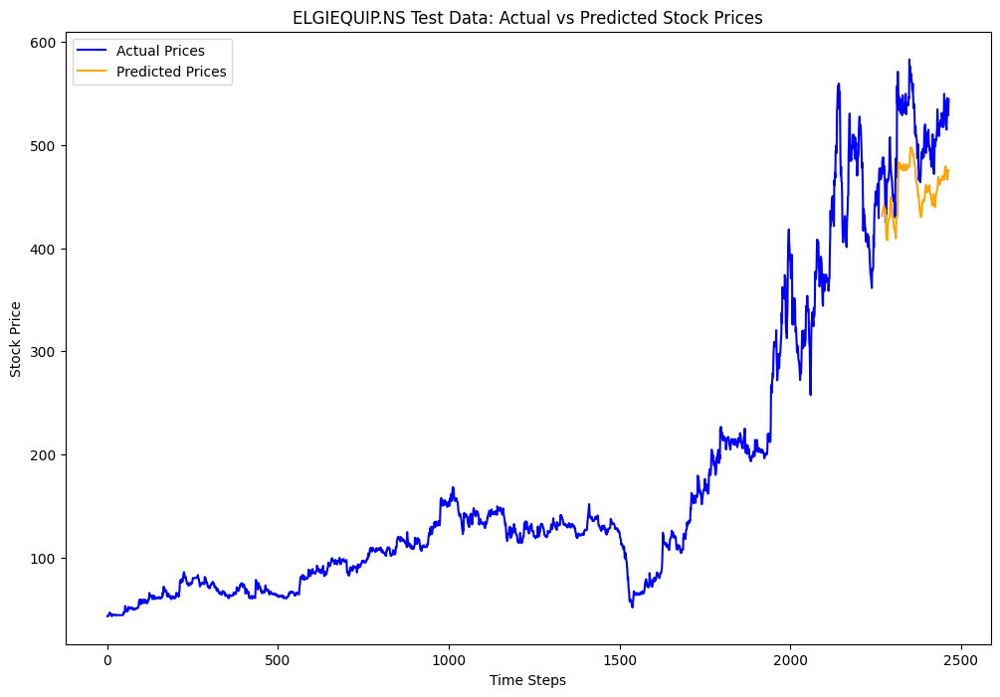

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0044, Validation Loss: 0.0396
Epoch [2/33], Loss: 0.0016, Validation Loss: 0.0319
Epoch [3/33], Loss: 0.0019, Validation Loss: 0.0304
Epoch [4/33], Loss: 0.0020, Validation Loss: 0.0323
Epoch [5/33], Loss: 0.0017, Validation Loss: 0.0324
Epoch [6/33], Loss: 0.0017, Validation Loss: 0.0311
Epoch [7/33], Loss: 0.0018, Validation Loss: 0.0308
Epoch [8/33], Loss: 0.0018, Validation Loss: 0.0310
Epoch [9/33], Loss: 0.0016, Validation Loss: 0.0298
Epoch [10/33], Loss: 0.0017, Validation Loss: 0.0295
Epoch [11/33], Loss: 0.0016, Validation Loss: 0.0286
Epoch [12/33], Loss: 0.0015, Validation Loss: 0.0268
Epoch [13/33], Loss: 0.0014, Validation Loss: 0.0224
Epoch [14/33], Loss: 0.0015, Validation Loss: 0.0184
Epoch [15/33], Loss: 0.0016, Validation Loss: 0.0162
Epoch [16/33], Loss: 0.0014, Validation Loss: 0.0125
Epoch [17/33], Loss: 0.0012, Validation Loss: 0.0047
Epoch [18/33], Loss: 0.0011, Validation Loss: 0.0058
Epoch [19/33], Loss: 0.0005, Validation Loss: 0.0015
Ep

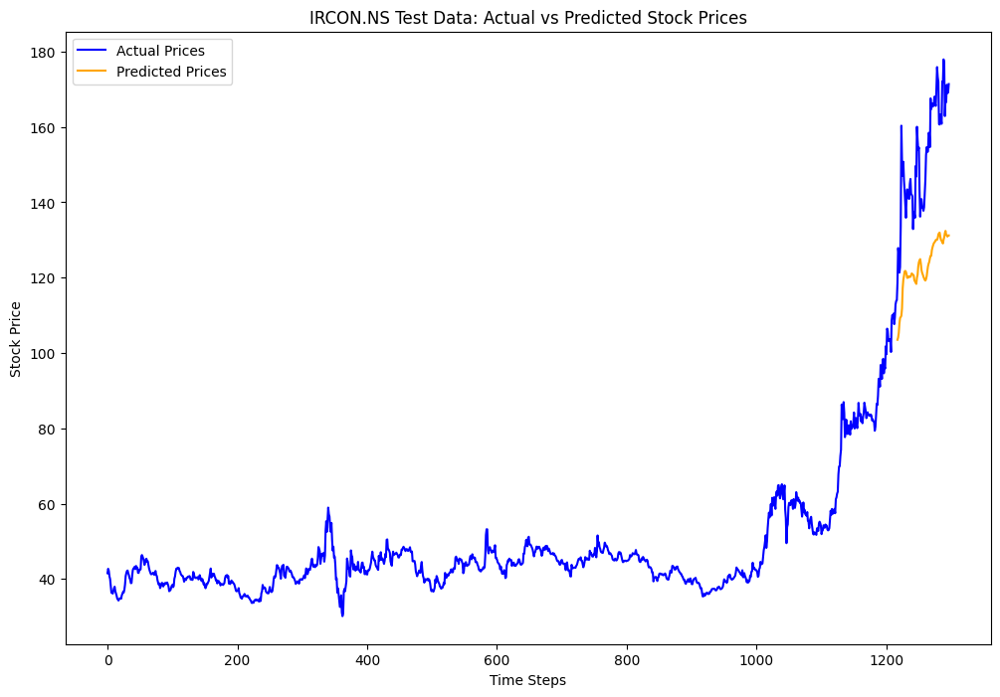

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0054, Validation Loss: 0.0188
Epoch [2/33], Loss: 0.0042, Validation Loss: 0.0167
Epoch [3/33], Loss: 0.0041, Validation Loss: 0.0161
Epoch [4/33], Loss: 0.0040, Validation Loss: 0.0157
Epoch [5/33], Loss: 0.0040, Validation Loss: 0.0154
Epoch [6/33], Loss: 0.0040, Validation Loss: 0.0159
Epoch [7/33], Loss: 0.0035, Validation Loss: 0.0085
Epoch [8/33], Loss: 0.0027, Validation Loss: 0.0081
Epoch [9/33], Loss: 0.0010, Validation Loss: 0.0003
Epoch [10/33], Loss: 0.0029, Validation Loss: 0.0081
Epoch [11/33], Loss: 0.0009, Validation Loss: 0.0014
Epoch [12/33], Loss: 0.0011, Validation Loss: 0.0023
Epoch [13/33], Loss: 0.0003, Validation Loss: 0.0004
Epoch [14/33], Loss: 0.0011, Validation Loss: 0.0017
Epoch [15/33], Loss: 0.0003, Validation Loss: 0.0001
Epoch [16/33], Loss: 0.0003, Validation Loss: 0.0001
Epoch [17/33], Loss: 0.0002, Validation Loss: 0.0001
Epoch [18/33], Loss: 0.0002, Validation Loss: 0.0002
Epoch [19/33], Loss: 0.0002, Validation Loss: 0.0001
Ep

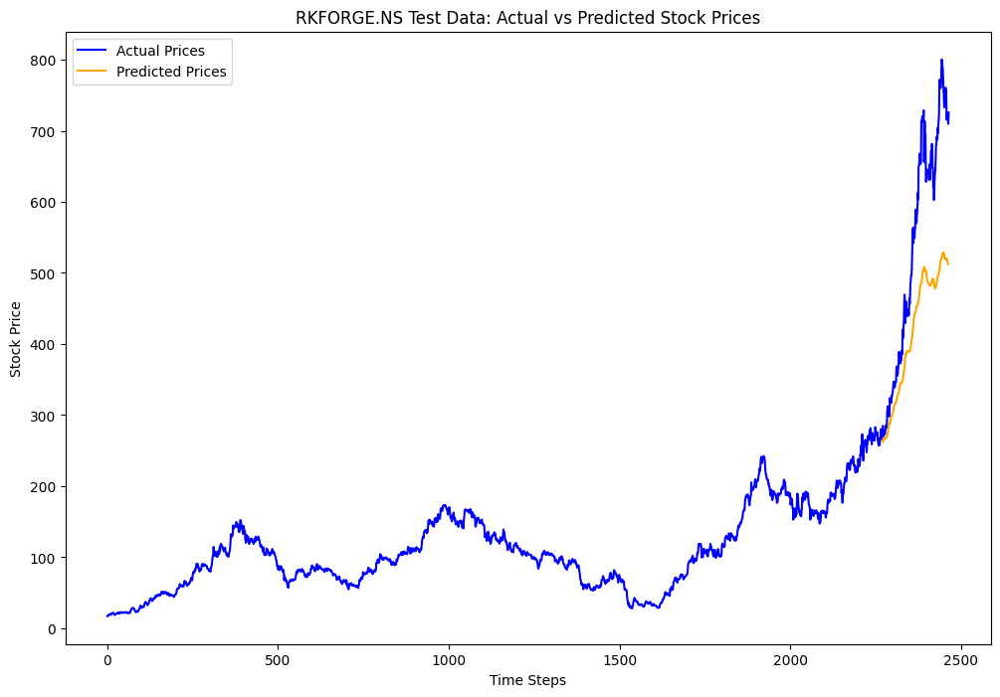

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0131, Validation Loss: 0.0190
Epoch [2/33], Loss: 0.0100, Validation Loss: 0.0207
Epoch [3/33], Loss: 0.0095, Validation Loss: 0.0191
Epoch [4/33], Loss: 0.0062, Validation Loss: 0.0030
Epoch [5/33], Loss: 0.0079, Validation Loss: 0.0142
Epoch [6/33], Loss: 0.0028, Validation Loss: 0.0004
Epoch [7/33], Loss: 0.0015, Validation Loss: 0.0012
Epoch [8/33], Loss: 0.0008, Validation Loss: 0.0005
Epoch [9/33], Loss: 0.0009, Validation Loss: 0.0008
Epoch [10/33], Loss: 0.0014, Validation Loss: 0.0003
Epoch [11/33], Loss: 0.0012, Validation Loss: 0.0004
Epoch [12/33], Loss: 0.0007, Validation Loss: 0.0005
Epoch [13/33], Loss: 0.0008, Validation Loss: 0.0003
Epoch [14/33], Loss: 0.0005, Validation Loss: 0.0004
Epoch [15/33], Loss: 0.0006, Validation Loss: 0.0003
Epoch [16/33], Loss: 0.0006, Validation Loss: 0.0004
Epoch [17/33], Loss: 0.0007, Validation Loss: 0.0003
Epoch [18/33], Loss: 0.0005, Validation Loss: 0.0003
Epoch [19/33], Loss: 0.0006, Validation Loss: 0.0003
Ep

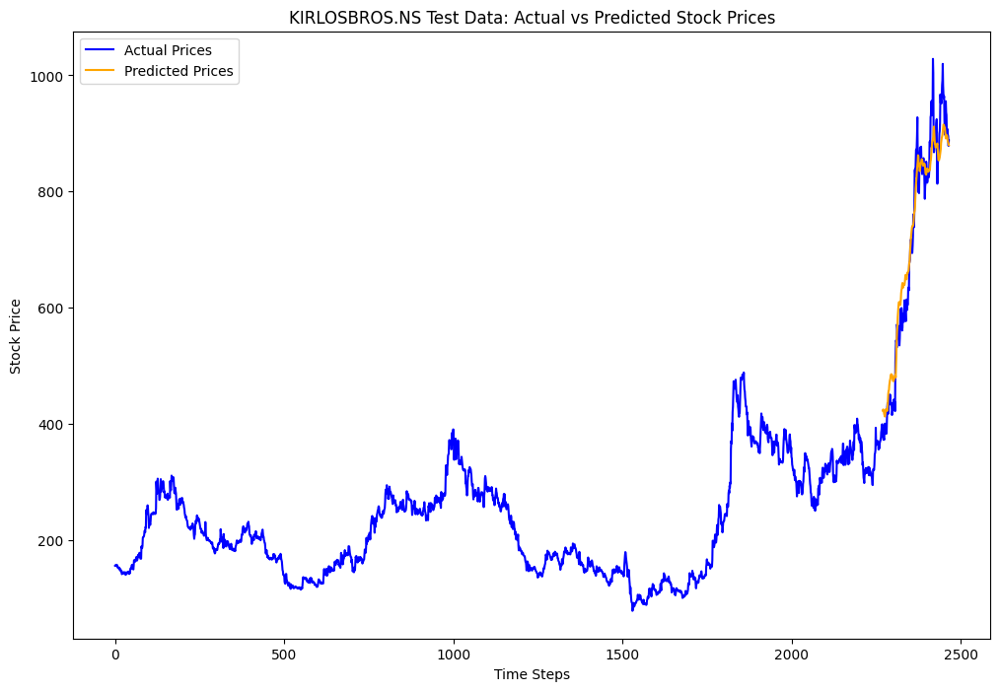

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0235, Validation Loss: 0.0289
Epoch [2/33], Loss: 0.0242, Validation Loss: 0.0044
Epoch [3/33], Loss: 0.0238, Validation Loss: 0.0034
Epoch [4/33], Loss: 0.0222, Validation Loss: 0.0031
Epoch [5/33], Loss: 0.0209, Validation Loss: 0.0024
Epoch [6/33], Loss: 0.0172, Validation Loss: 0.0038
Epoch [7/33], Loss: 0.0167, Validation Loss: 0.0014
Epoch [8/33], Loss: 0.0065, Validation Loss: 0.0009
Epoch [9/33], Loss: 0.0010, Validation Loss: 0.0004
Epoch [10/33], Loss: 0.0011, Validation Loss: 0.0005
Epoch [11/33], Loss: 0.0019, Validation Loss: 0.0004
Epoch [12/33], Loss: 0.0008, Validation Loss: 0.0002
Epoch [13/33], Loss: 0.0023, Validation Loss: 0.0019
Epoch [14/33], Loss: 0.0007, Validation Loss: 0.0002
Epoch [15/33], Loss: 0.0012, Validation Loss: 0.0007
Epoch [16/33], Loss: 0.0021, Validation Loss: 0.0012
Epoch [17/33], Loss: 0.0009, Validation Loss: 0.0004
Epoch [18/33], Loss: 0.0010, Validation Loss: 0.0007
Epoch [19/33], Loss: 0.0005, Validation Loss: 0.0002
Ep

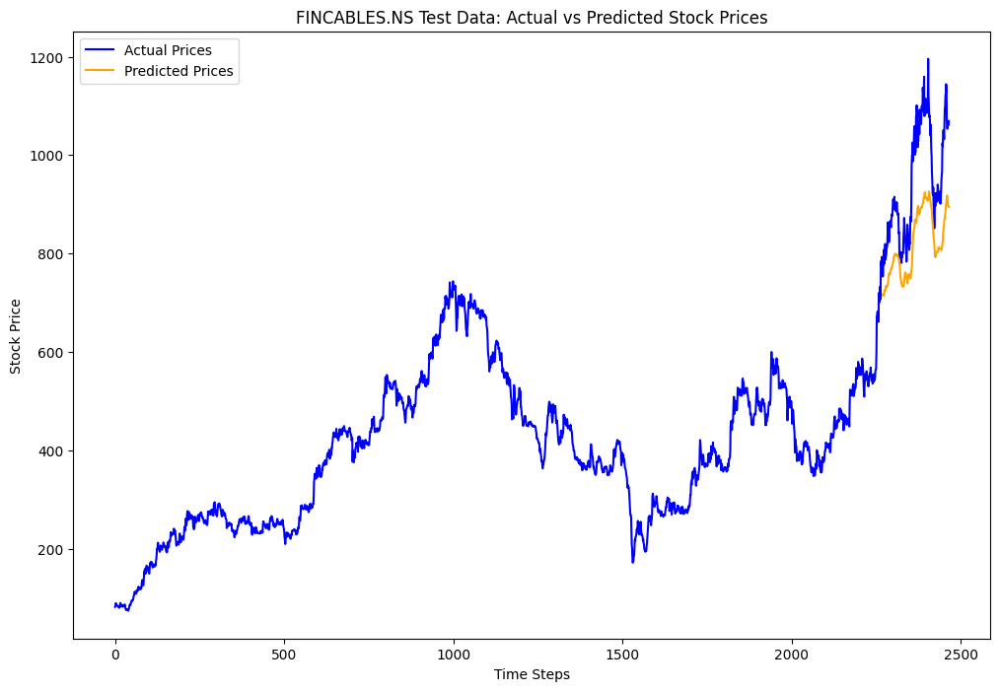

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.1938, Validation Loss: 0.0083
Epoch [2/33], Loss: 0.0824, Validation Loss: 0.0012
Epoch [3/33], Loss: 0.0675, Validation Loss: 0.0059
Epoch [4/33], Loss: 0.0544, Validation Loss: 0.0018
Epoch [5/33], Loss: 0.0409, Validation Loss: 0.0043
Epoch [6/33], Loss: 0.0118, Validation Loss: 0.0004
Epoch [7/33], Loss: 0.0857, Validation Loss: 0.0657
Epoch [8/33], Loss: 0.1045, Validation Loss: 0.0110
Epoch [9/33], Loss: 0.0602, Validation Loss: 0.0125
Epoch [10/33], Loss: 0.0487, Validation Loss: 0.0026
Epoch [11/33], Loss: 0.0385, Validation Loss: 0.0005
Epoch [12/33], Loss: 0.0241, Validation Loss: 0.0023
Epoch [13/33], Loss: 0.0063, Validation Loss: 0.0002
Epoch [14/33], Loss: 0.0065, Validation Loss: 0.0013
Epoch [15/33], Loss: 0.0084, Validation Loss: 0.0021
Epoch [16/33], Loss: 0.0048, Validation Loss: 0.0003
Epoch [17/33], Loss: 0.0045, Validation Loss: 0.0002
Epoch [18/33], Loss: 0.0040, Validation Loss: 0.0002
Epoch [19/33], Loss: 0.0037, Validation Loss: 0.0002
Ep

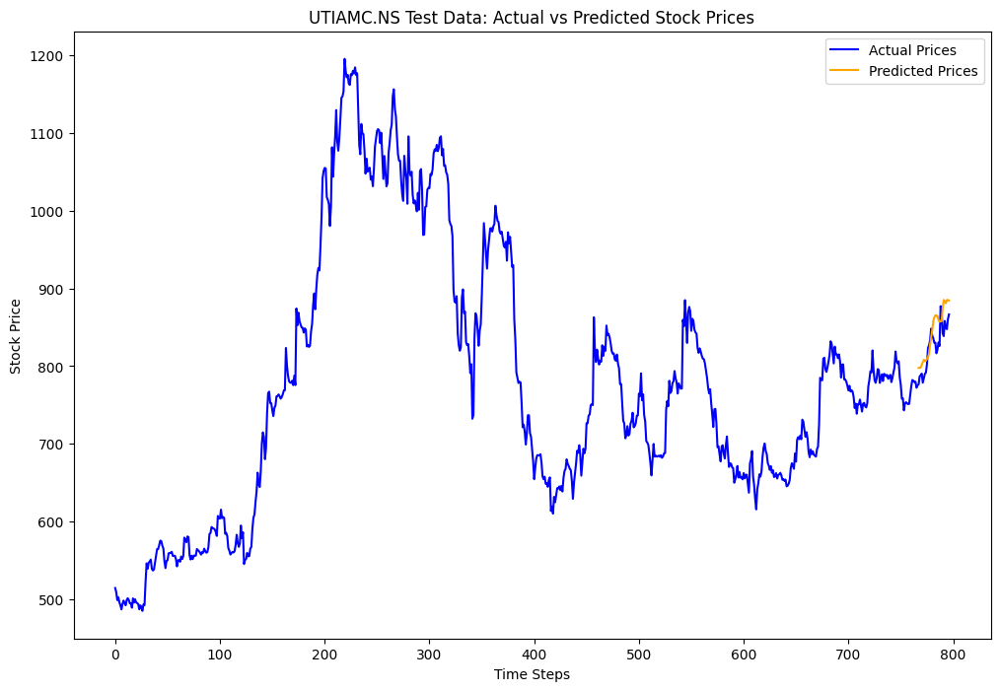

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0248, Validation Loss: 0.0171
Epoch [2/33], Loss: 0.1716, Validation Loss: 0.5512
Epoch [3/33], Loss: 0.0572, Validation Loss: 0.3761
Epoch [4/33], Loss: 0.0584, Validation Loss: 0.2100
Epoch [5/33], Loss: 0.0169, Validation Loss: 0.0199
Epoch [6/33], Loss: 0.0066, Validation Loss: 0.0662
Epoch [7/33], Loss: 0.0456, Validation Loss: 0.2352
Epoch [8/33], Loss: 0.0160, Validation Loss: 0.0015
Epoch [9/33], Loss: 0.0122, Validation Loss: 0.0495
Epoch [10/33], Loss: 0.0378, Validation Loss: 0.1917
Epoch [11/33], Loss: 0.0251, Validation Loss: 0.0015
Epoch [12/33], Loss: 0.0166, Validation Loss: 0.0796
Epoch [13/33], Loss: 0.0351, Validation Loss: 0.1832
Epoch [14/33], Loss: 0.0280, Validation Loss: 0.0021
Epoch [15/33], Loss: 0.0193, Validation Loss: 0.0579
Epoch [16/33], Loss: 0.0409, Validation Loss: 0.2554
Epoch [17/33], Loss: 0.0433, Validation Loss: 0.1570
Epoch [18/33], Loss: 0.0104, Validation Loss: 0.0054
Epoch [19/33], Loss: 0.0057, Validation Loss: 0.0006
Ep

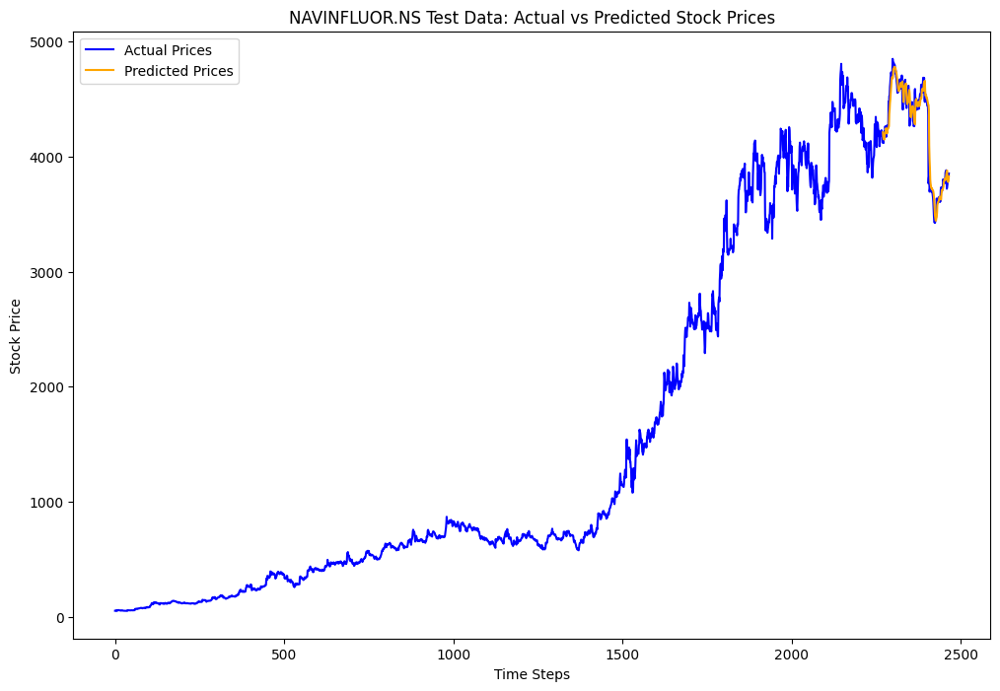

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0351, Validation Loss: 0.0146
Epoch [2/33], Loss: 0.0306, Validation Loss: 0.0060
Epoch [3/33], Loss: 0.0329, Validation Loss: 0.0037
Epoch [4/33], Loss: 0.0208, Validation Loss: 0.0075
Epoch [5/33], Loss: 0.0130, Validation Loss: 0.0071
Epoch [6/33], Loss: 0.0150, Validation Loss: 0.0034
Epoch [7/33], Loss: 0.0097, Validation Loss: 0.0013
Epoch [8/33], Loss: 0.0081, Validation Loss: 0.0020
Epoch [9/33], Loss: 0.0019, Validation Loss: 0.0003
Epoch [10/33], Loss: 0.0023, Validation Loss: 0.0016
Epoch [11/33], Loss: 0.0069, Validation Loss: 0.0013
Epoch [12/33], Loss: 0.0048, Validation Loss: 0.0009
Epoch [13/33], Loss: 0.0038, Validation Loss: 0.0007
Epoch [14/33], Loss: 0.0041, Validation Loss: 0.0011
Epoch [15/33], Loss: 0.0117, Validation Loss: 0.0021
Epoch [16/33], Loss: 0.0059, Validation Loss: 0.0004
Epoch [17/33], Loss: 0.0047, Validation Loss: 0.0006
Epoch [18/33], Loss: 0.0037, Validation Loss: 0.0004
Epoch [19/33], Loss: 0.0048, Validation Loss: 0.0007
Ep

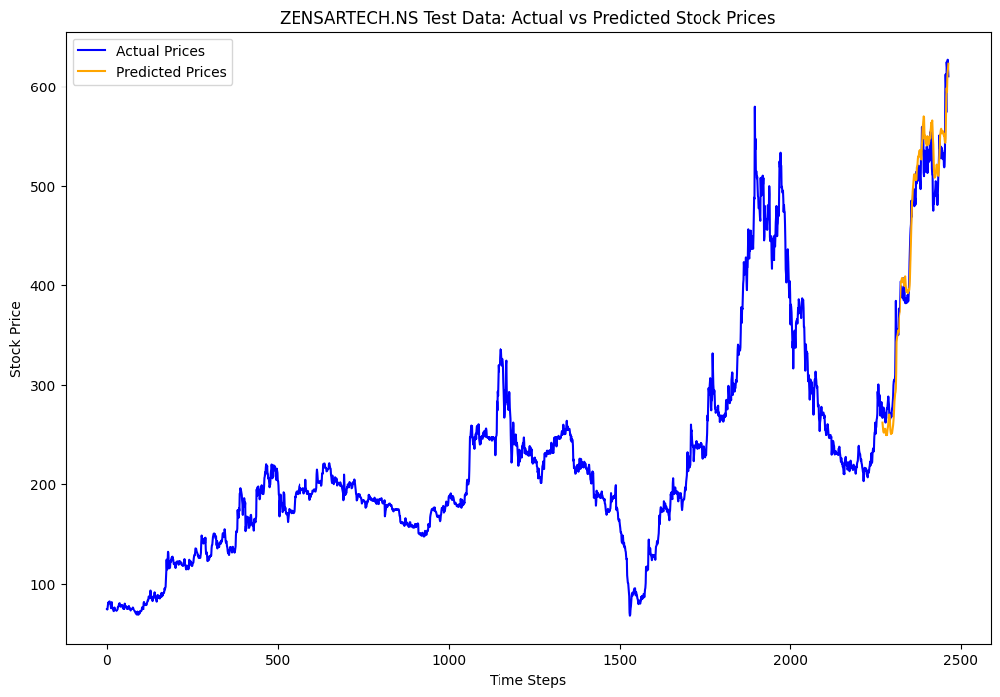

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0383, Validation Loss: 0.0416
Epoch [2/33], Loss: 0.0406, Validation Loss: 0.0138
Epoch [3/33], Loss: 0.0469, Validation Loss: 0.0155
Epoch [4/33], Loss: 0.0217, Validation Loss: 0.0008
Epoch [5/33], Loss: 0.0054, Validation Loss: 0.0024
Epoch [6/33], Loss: 0.0063, Validation Loss: 0.0007
Epoch [7/33], Loss: 0.0023, Validation Loss: 0.0016
Epoch [8/33], Loss: 0.0031, Validation Loss: 0.0024
Epoch [9/33], Loss: 0.0118, Validation Loss: 0.0017
Epoch [10/33], Loss: 0.0154, Validation Loss: 0.0168
Epoch [11/33], Loss: 0.0137, Validation Loss: 0.0012
Epoch [12/33], Loss: 0.0173, Validation Loss: 0.0042
Epoch [13/33], Loss: 0.0042, Validation Loss: 0.0009
Epoch [14/33], Loss: 0.0064, Validation Loss: 0.0004
Epoch [15/33], Loss: 0.0043, Validation Loss: 0.0007
Epoch [16/33], Loss: 0.0072, Validation Loss: 0.0005
Epoch [17/33], Loss: 0.0080, Validation Loss: 0.0015
Epoch [18/33], Loss: 0.0091, Validation Loss: 0.0025
Epoch [19/33], Loss: 0.0018, Validation Loss: 0.0005
Ep

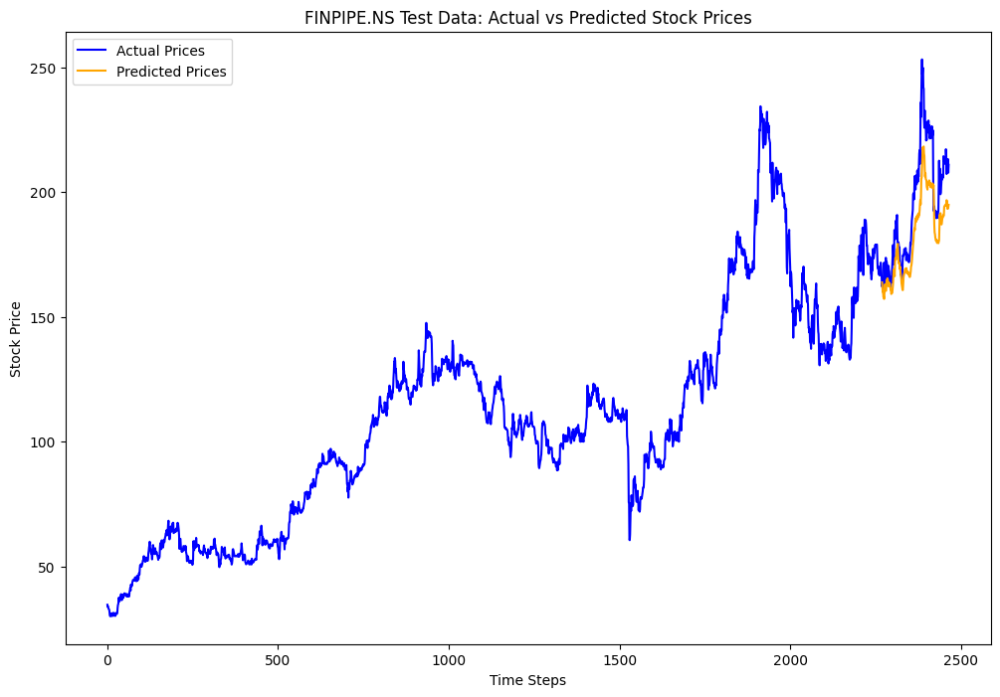

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0097, Validation Loss: 0.1320
Epoch [2/33], Loss: 0.2063, Validation Loss: 0.1342
Epoch [3/33], Loss: 0.0706, Validation Loss: 0.0965
Epoch [4/33], Loss: 0.0550, Validation Loss: 0.0463
Epoch [5/33], Loss: 0.0571, Validation Loss: 0.0297
Epoch [6/33], Loss: 0.0293, Validation Loss: 0.0528
Epoch [7/33], Loss: 0.0690, Validation Loss: 0.1007
Epoch [8/33], Loss: 0.0430, Validation Loss: 0.0385
Epoch [9/33], Loss: 0.0349, Validation Loss: 0.0075
Epoch [10/33], Loss: 0.0125, Validation Loss: 0.0786
Epoch [11/33], Loss: 0.0355, Validation Loss: 0.0245
Epoch [12/33], Loss: 0.0308, Validation Loss: 0.0087
Epoch [13/33], Loss: 0.0123, Validation Loss: 0.0016
Epoch [14/33], Loss: 0.0071, Validation Loss: 0.0007
Epoch [15/33], Loss: 0.0093, Validation Loss: 0.0016
Epoch [16/33], Loss: 0.0059, Validation Loss: 0.0005
Epoch [17/33], Loss: 0.0087, Validation Loss: 0.0016
Epoch [18/33], Loss: 0.0045, Validation Loss: 0.0007
Epoch [19/33], Loss: 0.0055, Validation Loss: 0.0007
Ep

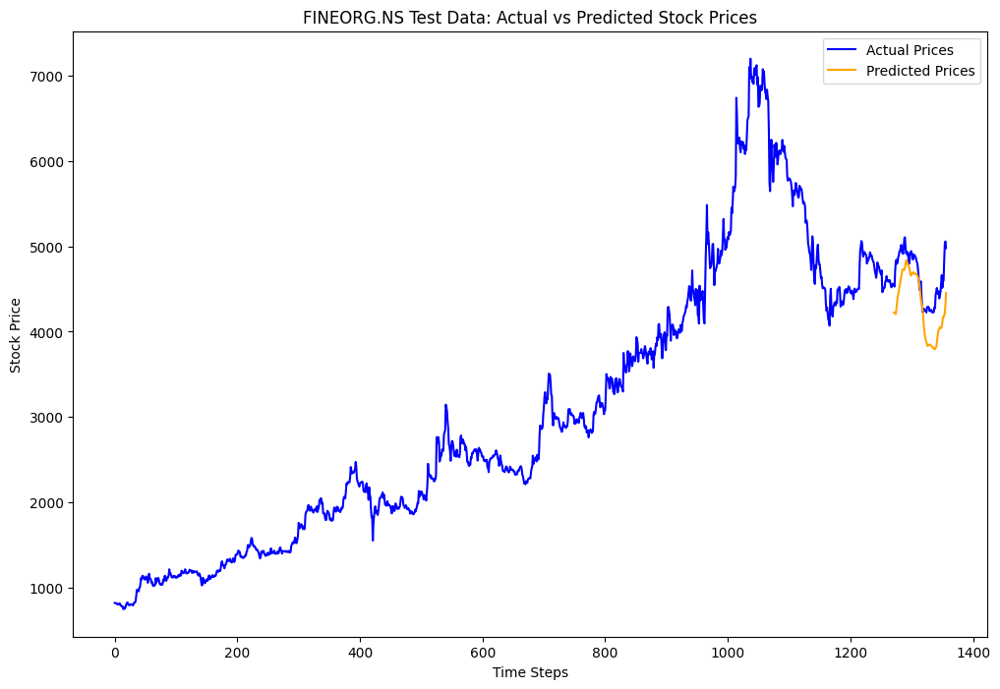

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0262, Validation Loss: 0.0282
Epoch [2/33], Loss: 0.0509, Validation Loss: 0.1072
Epoch [3/33], Loss: 0.0364, Validation Loss: 0.0891
Epoch [4/33], Loss: 0.0323, Validation Loss: 0.0718
Epoch [5/33], Loss: 0.0063, Validation Loss: 0.0024
Epoch [6/33], Loss: 0.0047, Validation Loss: 0.0068
Epoch [7/33], Loss: 0.0118, Validation Loss: 0.0070
Epoch [8/33], Loss: 0.0223, Validation Loss: 0.0303
Epoch [9/33], Loss: 0.0345, Validation Loss: 0.1038
Epoch [10/33], Loss: 0.0292, Validation Loss: 0.0785
Epoch [11/33], Loss: 0.0213, Validation Loss: 0.0423
Epoch [12/33], Loss: 0.0088, Validation Loss: 0.0006
Epoch [13/33], Loss: 0.0463, Validation Loss: 0.1339
Epoch [14/33], Loss: 0.0338, Validation Loss: 0.0571
Epoch [15/33], Loss: 0.0464, Validation Loss: 0.1045
Epoch [16/33], Loss: 0.0333, Validation Loss: 0.0891
Epoch [17/33], Loss: 0.0305, Validation Loss: 0.0843
Epoch [18/33], Loss: 0.0293, Validation Loss: 0.0771
Epoch [19/33], Loss: 0.0254, Validation Loss: 0.0654
Ep

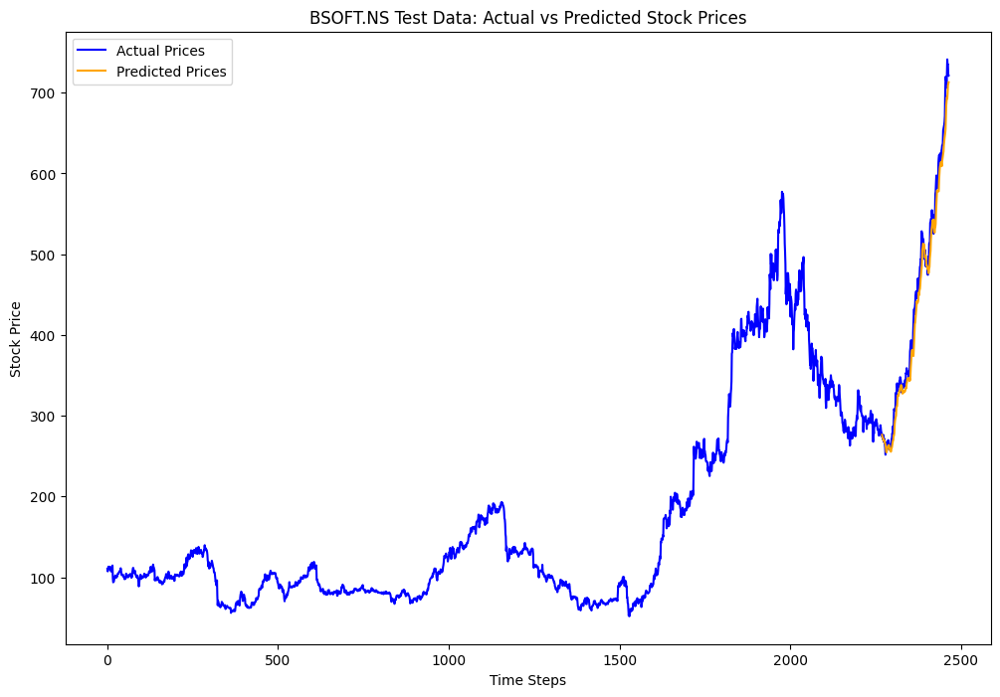

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0023, Validation Loss: 0.0225
Epoch [2/33], Loss: 0.0018, Validation Loss: 0.0237
Epoch [3/33], Loss: 0.0017, Validation Loss: 0.0208
Epoch [4/33], Loss: 0.0017, Validation Loss: 0.0191
Epoch [5/33], Loss: 0.0016, Validation Loss: 0.0175
Epoch [6/33], Loss: 0.0015, Validation Loss: 0.0173
Epoch [7/33], Loss: 0.0015, Validation Loss: 0.0170
Epoch [8/33], Loss: 0.0014, Validation Loss: 0.0170
Epoch [9/33], Loss: 0.0014, Validation Loss: 0.0168
Epoch [10/33], Loss: 0.0014, Validation Loss: 0.0168
Epoch [11/33], Loss: 0.0014, Validation Loss: 0.0166
Epoch [12/33], Loss: 0.0014, Validation Loss: 0.0166
Epoch [13/33], Loss: 0.0014, Validation Loss: 0.0165
Epoch [14/33], Loss: 0.0013, Validation Loss: 0.0164
Epoch [15/33], Loss: 0.0013, Validation Loss: 0.0165
Epoch [16/33], Loss: 0.0013, Validation Loss: 0.0164
Epoch [17/33], Loss: 0.0013, Validation Loss: 0.0163
Epoch [18/33], Loss: 0.0013, Validation Loss: 0.0163
Epoch [19/33], Loss: 0.0013, Validation Loss: 0.0162
Ep

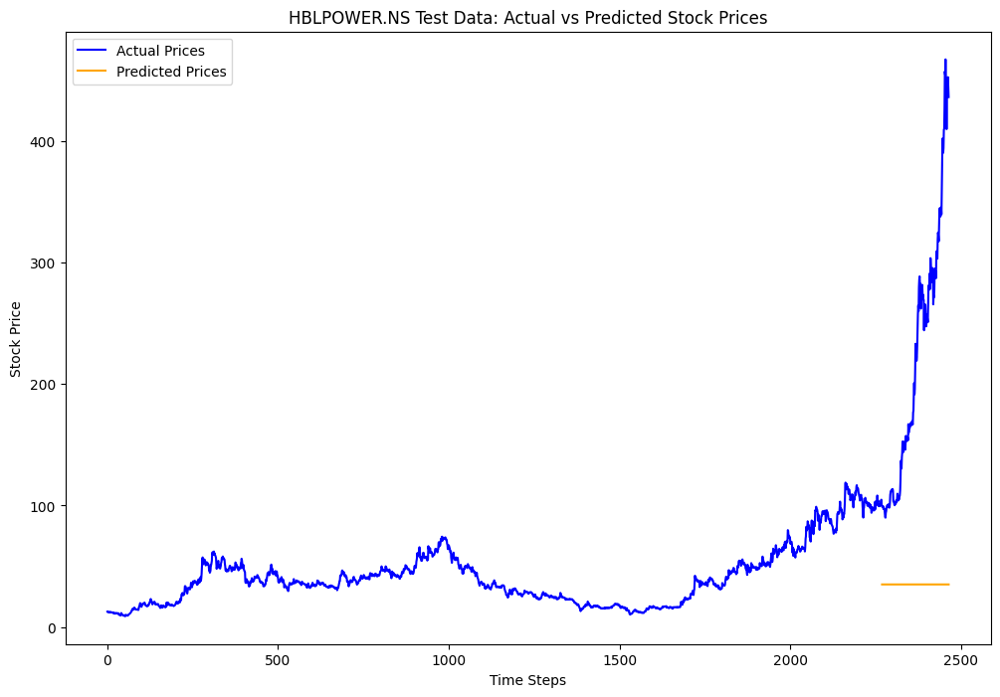

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0276, Validation Loss: 0.1579
Epoch [2/33], Loss: 0.0256, Validation Loss: 0.1253
Epoch [3/33], Loss: 0.0234, Validation Loss: 0.0977
Epoch [4/33], Loss: 0.0201, Validation Loss: 0.0809
Epoch [5/33], Loss: 0.0186, Validation Loss: 0.0738
Epoch [6/33], Loss: 0.0128, Validation Loss: 0.0426
Epoch [7/33], Loss: 0.0033, Validation Loss: 0.0005
Epoch [8/33], Loss: 0.0032, Validation Loss: 0.0024
Epoch [9/33], Loss: 0.0042, Validation Loss: 0.0133
Epoch [10/33], Loss: 0.0172, Validation Loss: 0.0619
Epoch [11/33], Loss: 0.0097, Validation Loss: 0.0272
Epoch [12/33], Loss: 0.0025, Validation Loss: 0.0027
Epoch [13/33], Loss: 0.0016, Validation Loss: 0.0003
Epoch [14/33], Loss: 0.0017, Validation Loss: 0.0007
Epoch [15/33], Loss: 0.0020, Validation Loss: 0.0003
Epoch [16/33], Loss: 0.0014, Validation Loss: 0.0004
Epoch [17/33], Loss: 0.0016, Validation Loss: 0.0003
Epoch [18/33], Loss: 0.0007, Validation Loss: 0.0003
Epoch [19/33], Loss: 0.0006, Validation Loss: 0.0003
Ep

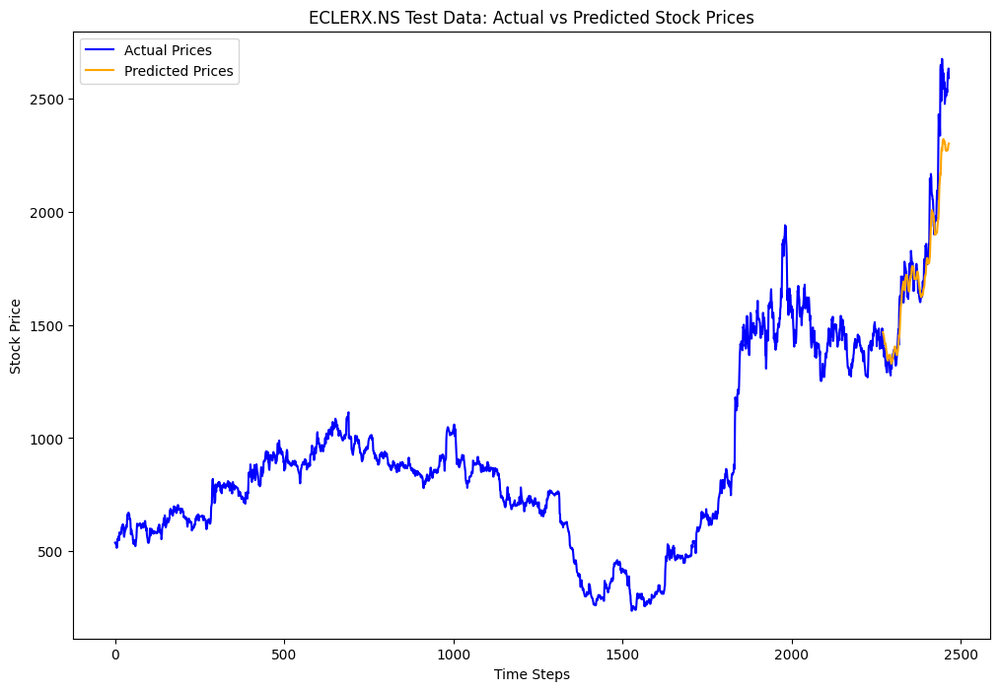

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0082, Validation Loss: 0.0146
Epoch [2/33], Loss: 0.0192, Validation Loss: 0.0312
Epoch [3/33], Loss: 0.0152, Validation Loss: 0.0377
Epoch [4/33], Loss: 0.0143, Validation Loss: 0.0414
Epoch [5/33], Loss: 0.0130, Validation Loss: 0.0400
Epoch [6/33], Loss: 0.0127, Validation Loss: 0.0380
Epoch [7/33], Loss: 0.0122, Validation Loss: 0.0331
Epoch [8/33], Loss: 0.0107, Validation Loss: 0.0241
Epoch [9/33], Loss: 0.0103, Validation Loss: 0.0032
Epoch [10/33], Loss: 0.0242, Validation Loss: 0.0343
Epoch [11/33], Loss: 0.0109, Validation Loss: 0.0310
Epoch [12/33], Loss: 0.0101, Validation Loss: 0.0221
Epoch [13/33], Loss: 0.0059, Validation Loss: 0.0202
Epoch [14/33], Loss: 0.0097, Validation Loss: 0.0332
Epoch [15/33], Loss: 0.0083, Validation Loss: 0.0229
Epoch [16/33], Loss: 0.0037, Validation Loss: 0.0036
Epoch [17/33], Loss: 0.0024, Validation Loss: 0.0009
Epoch [18/33], Loss: 0.0019, Validation Loss: 0.0026
Epoch [19/33], Loss: 0.0027, Validation Loss: 0.0004
Ep

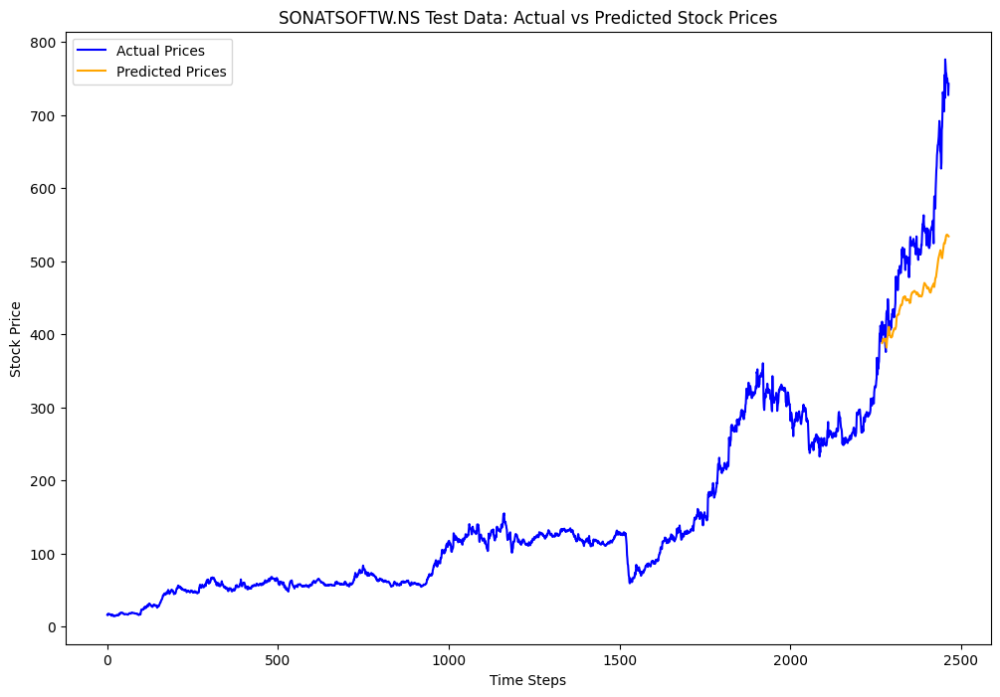

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0184, Validation Loss: 0.0131
Epoch [2/33], Loss: 0.0133, Validation Loss: 0.0122
Epoch [3/33], Loss: 0.0109, Validation Loss: 0.0101
Epoch [4/33], Loss: 0.0112, Validation Loss: 0.0105
Epoch [5/33], Loss: 0.0103, Validation Loss: 0.0089
Epoch [6/33], Loss: 0.0101, Validation Loss: 0.0042
Epoch [7/33], Loss: 0.0083, Validation Loss: 0.0020
Epoch [8/33], Loss: 0.0089, Validation Loss: 0.0003
Epoch [9/33], Loss: 0.0023, Validation Loss: 0.0040
Epoch [10/33], Loss: 0.0033, Validation Loss: 0.0044
Epoch [11/33], Loss: 0.0018, Validation Loss: 0.0002
Epoch [12/33], Loss: 0.0041, Validation Loss: 0.0131
Epoch [13/33], Loss: 0.0072, Validation Loss: 0.0062
Epoch [14/33], Loss: 0.0079, Validation Loss: 0.0057
Epoch [15/33], Loss: 0.0020, Validation Loss: 0.0012
Epoch [16/33], Loss: 0.0034, Validation Loss: 0.0092
Epoch [17/33], Loss: 0.0053, Validation Loss: 0.0040
Epoch [18/33], Loss: 0.0055, Validation Loss: 0.0029
Epoch [19/33], Loss: 0.0008, Validation Loss: 0.0002
Ep

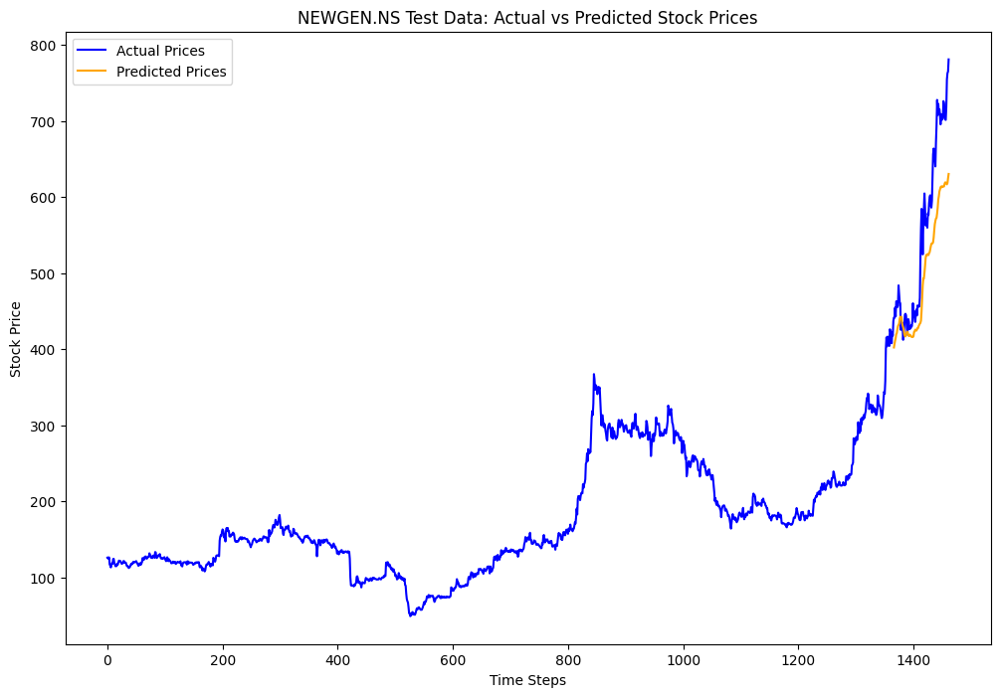

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0318, Validation Loss: 0.0674
Epoch [2/33], Loss: 0.0202, Validation Loss: 0.0138
Epoch [3/33], Loss: 0.0294, Validation Loss: 0.0085
Epoch [4/33], Loss: 0.0224, Validation Loss: 0.0055
Epoch [5/33], Loss: 0.0103, Validation Loss: 0.0009
Epoch [6/33], Loss: 0.0016, Validation Loss: 0.0024
Epoch [7/33], Loss: 0.0127, Validation Loss: 0.0090
Epoch [8/33], Loss: 0.0109, Validation Loss: 0.0083
Epoch [9/33], Loss: 0.0035, Validation Loss: 0.0006
Epoch [10/33], Loss: 0.0016, Validation Loss: 0.0003
Epoch [11/33], Loss: 0.0013, Validation Loss: 0.0003
Epoch [12/33], Loss: 0.0011, Validation Loss: 0.0002
Epoch [13/33], Loss: 0.0013, Validation Loss: 0.0003
Epoch [14/33], Loss: 0.0016, Validation Loss: 0.0002
Epoch [15/33], Loss: 0.0010, Validation Loss: 0.0003
Epoch [16/33], Loss: 0.0010, Validation Loss: 0.0004
Epoch [17/33], Loss: 0.0012, Validation Loss: 0.0006
Epoch [18/33], Loss: 0.0020, Validation Loss: 0.0003
Epoch [19/33], Loss: 0.0021, Validation Loss: 0.0005
Ep

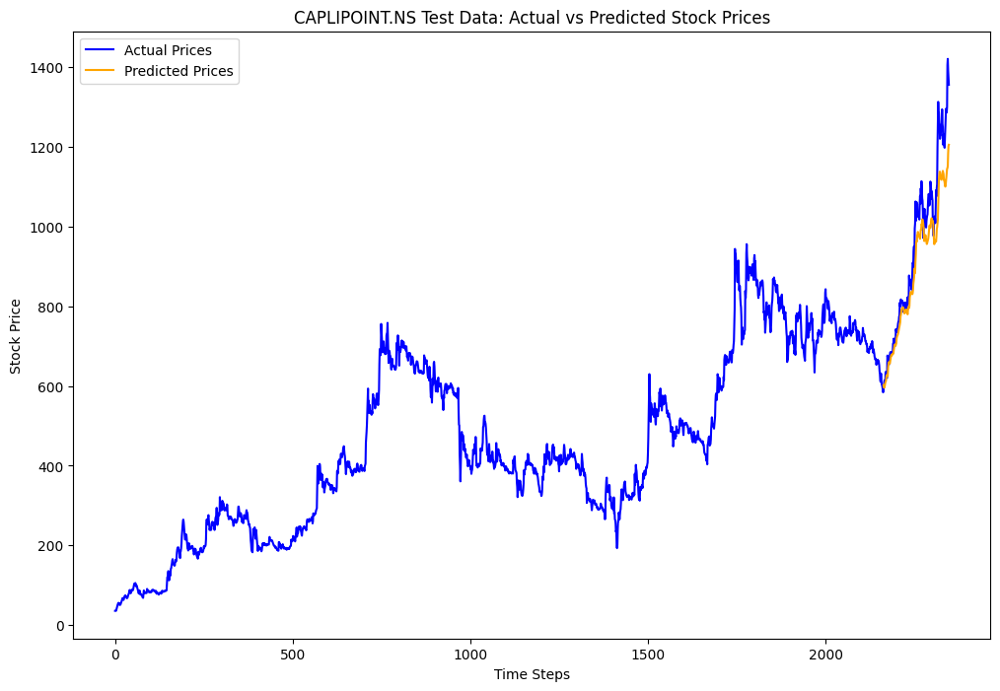

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0018, Validation Loss: 0.0078
Epoch [2/33], Loss: 0.0016, Validation Loss: 0.0104
Epoch [3/33], Loss: 0.0021, Validation Loss: 0.0083
Epoch [4/33], Loss: 0.0022, Validation Loss: 0.0063
Epoch [5/33], Loss: 0.0021, Validation Loss: 0.0045
Epoch [6/33], Loss: 0.0017, Validation Loss: 0.0036
Epoch [7/33], Loss: 0.0015, Validation Loss: 0.0037
Epoch [8/33], Loss: 0.0015, Validation Loss: 0.0037
Epoch [9/33], Loss: 0.0015, Validation Loss: 0.0037
Epoch [10/33], Loss: 0.0014, Validation Loss: 0.0037
Epoch [11/33], Loss: 0.0014, Validation Loss: 0.0037
Epoch [12/33], Loss: 0.0014, Validation Loss: 0.0037
Epoch [13/33], Loss: 0.0014, Validation Loss: 0.0037
Epoch [14/33], Loss: 0.0014, Validation Loss: 0.0037
Epoch [15/33], Loss: 0.0014, Validation Loss: 0.0037
Epoch [16/33], Loss: 0.0014, Validation Loss: 0.0037
Epoch [17/33], Loss: 0.0014, Validation Loss: 0.0037
Epoch [18/33], Loss: 0.0014, Validation Loss: 0.0037
Epoch [19/33], Loss: 0.0013, Validation Loss: 0.0037
Ep

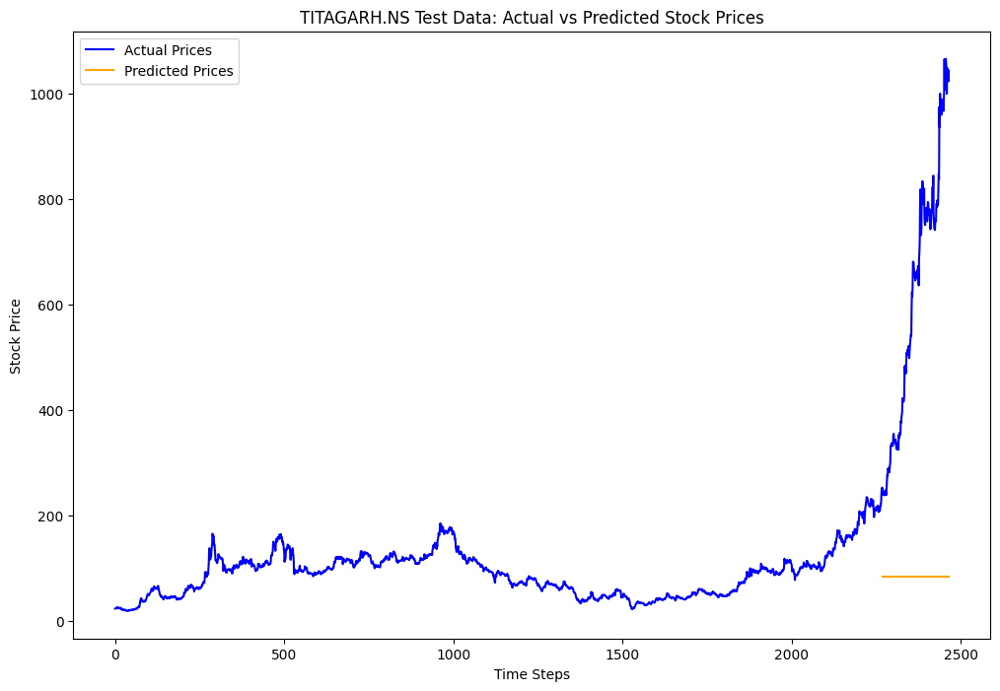

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0057, Validation Loss: 0.0305
Epoch [2/33], Loss: 0.0076, Validation Loss: 0.0299
Epoch [3/33], Loss: 0.0075, Validation Loss: 0.0340
Epoch [4/33], Loss: 0.0069, Validation Loss: 0.0370
Epoch [5/33], Loss: 0.0063, Validation Loss: 0.0367
Epoch [6/33], Loss: 0.0063, Validation Loss: 0.0362
Epoch [7/33], Loss: 0.0062, Validation Loss: 0.0348
Epoch [8/33], Loss: 0.0063, Validation Loss: 0.0346
Epoch [9/33], Loss: 0.0063, Validation Loss: 0.0344
Epoch [10/33], Loss: 0.0054, Validation Loss: 0.0218
Epoch [11/33], Loss: 0.0054, Validation Loss: 0.0193
Epoch [12/33], Loss: 0.0032, Validation Loss: 0.0012
Epoch [13/33], Loss: 0.0046, Validation Loss: 0.0343
Epoch [14/33], Loss: 0.0045, Validation Loss: 0.0217
Epoch [15/33], Loss: 0.0025, Validation Loss: 0.0004
Epoch [16/33], Loss: 0.0007, Validation Loss: 0.0038
Epoch [17/33], Loss: 0.0063, Validation Loss: 0.0343
Epoch [18/33], Loss: 0.0044, Validation Loss: 0.0259
Epoch [19/33], Loss: 0.0031, Validation Loss: 0.0112
Ep

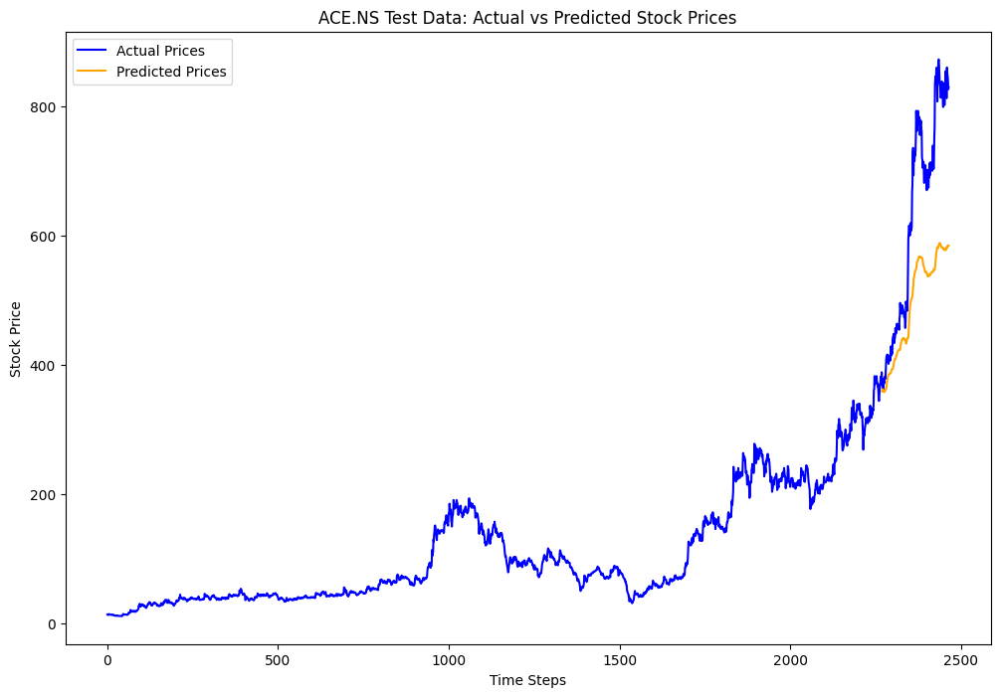

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0199, Validation Loss: 0.1532
Epoch [2/33], Loss: 0.0257, Validation Loss: 0.1679
Epoch [3/33], Loss: 0.0251, Validation Loss: 0.1817
Epoch [4/33], Loss: 0.0244, Validation Loss: 0.1847
Epoch [5/33], Loss: 0.0189, Validation Loss: 0.1122
Epoch [6/33], Loss: 0.0255, Validation Loss: 0.1032
Epoch [7/33], Loss: 0.0187, Validation Loss: 0.1542
Epoch [8/33], Loss: 0.0021, Validation Loss: 0.0016
Epoch [9/33], Loss: 0.0073, Validation Loss: 0.0501
Epoch [10/33], Loss: 0.0099, Validation Loss: 0.0724
Epoch [11/33], Loss: 0.0016, Validation Loss: 0.0038
Epoch [12/33], Loss: 0.0009, Validation Loss: 0.0063
Epoch [13/33], Loss: 0.0009, Validation Loss: 0.0027
Epoch [14/33], Loss: 0.0014, Validation Loss: 0.0136
Epoch [15/33], Loss: 0.0012, Validation Loss: 0.0034
Epoch [16/33], Loss: 0.0021, Validation Loss: 0.0190
Epoch [17/33], Loss: 0.0015, Validation Loss: 0.0028
Epoch [18/33], Loss: 0.0026, Validation Loss: 0.0185
Epoch [19/33], Loss: 0.0024, Validation Loss: 0.0029
Ep

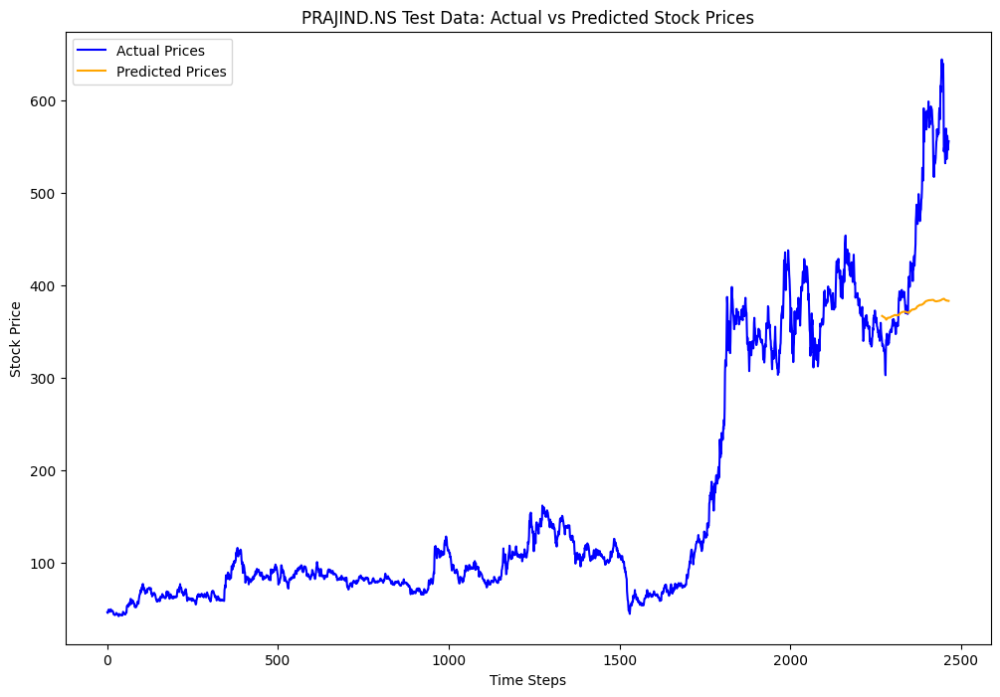

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0884, Validation Loss: 0.0151
Epoch [2/33], Loss: 0.1125, Validation Loss: 0.0596
Epoch [3/33], Loss: 0.0607, Validation Loss: 0.0107
Epoch [4/33], Loss: 0.0320, Validation Loss: 0.0264
Epoch [5/33], Loss: 0.0686, Validation Loss: 0.0451
Epoch [6/33], Loss: 0.0396, Validation Loss: 0.0014
Epoch [7/33], Loss: 0.0231, Validation Loss: 0.0529
Epoch [8/33], Loss: 0.0297, Validation Loss: 0.0073
Epoch [9/33], Loss: 0.0094, Validation Loss: 0.0006
Epoch [10/33], Loss: 0.0036, Validation Loss: 0.0005
Epoch [11/33], Loss: 0.0049, Validation Loss: 0.0004
Epoch [12/33], Loss: 0.0055, Validation Loss: 0.0031
Epoch [13/33], Loss: 0.0131, Validation Loss: 0.0007
Epoch [14/33], Loss: 0.0066, Validation Loss: 0.0007
Epoch [15/33], Loss: 0.0056, Validation Loss: 0.0006
Epoch [16/33], Loss: 0.0043, Validation Loss: 0.0005
Epoch [17/33], Loss: 0.0023, Validation Loss: 0.0005
Epoch [18/33], Loss: 0.0025, Validation Loss: 0.0004
Epoch [19/33], Loss: 0.0022, Validation Loss: 0.0004
Ep

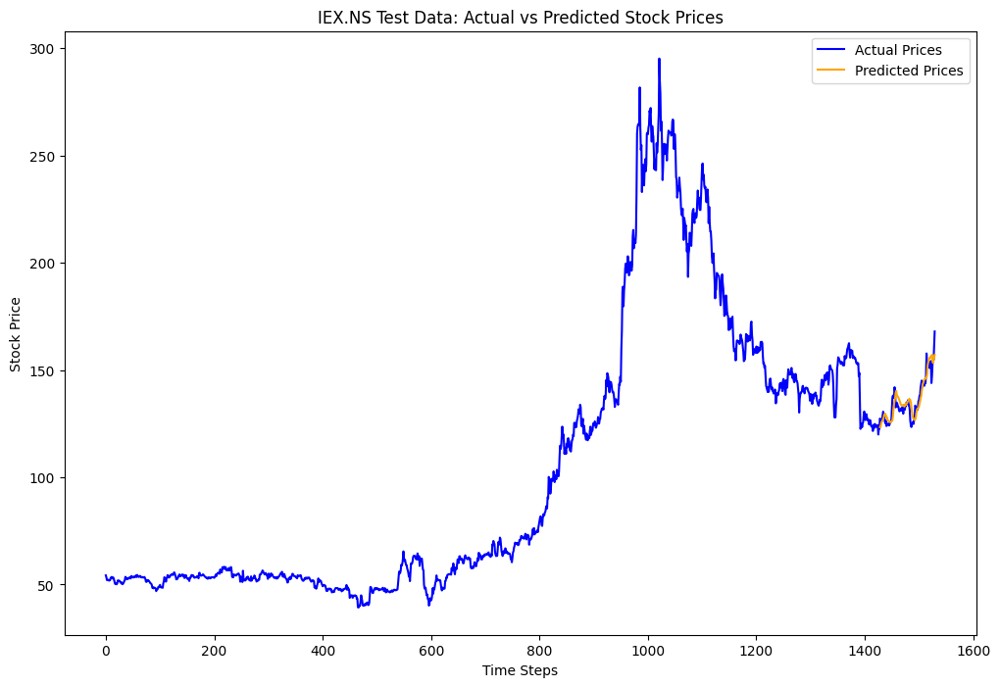

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0056, Validation Loss: 0.0937
Epoch [2/33], Loss: 0.0044, Validation Loss: 0.0835
Epoch [3/33], Loss: 0.0050, Validation Loss: 0.0847
Epoch [4/33], Loss: 0.0048, Validation Loss: 0.0851
Epoch [5/33], Loss: 0.0047, Validation Loss: 0.0838
Epoch [6/33], Loss: 0.0044, Validation Loss: 0.0801
Epoch [7/33], Loss: 0.0044, Validation Loss: 0.0772
Epoch [8/33], Loss: 0.0042, Validation Loss: 0.0665
Epoch [9/33], Loss: 0.0040, Validation Loss: 0.0552
Epoch [10/33], Loss: 0.0027, Validation Loss: 0.0411
Epoch [11/33], Loss: 0.0026, Validation Loss: 0.0101
Epoch [12/33], Loss: 0.0025, Validation Loss: 0.0187
Epoch [13/33], Loss: 0.0032, Validation Loss: 0.0053
Epoch [14/33], Loss: 0.0018, Validation Loss: 0.0116
Epoch [15/33], Loss: 0.0033, Validation Loss: 0.0699
Epoch [16/33], Loss: 0.0032, Validation Loss: 0.0520
Epoch [17/33], Loss: 0.0021, Validation Loss: 0.0177
Epoch [18/33], Loss: 0.0005, Validation Loss: 0.0008
Epoch [19/33], Loss: 0.0003, Validation Loss: 0.0003
Ep

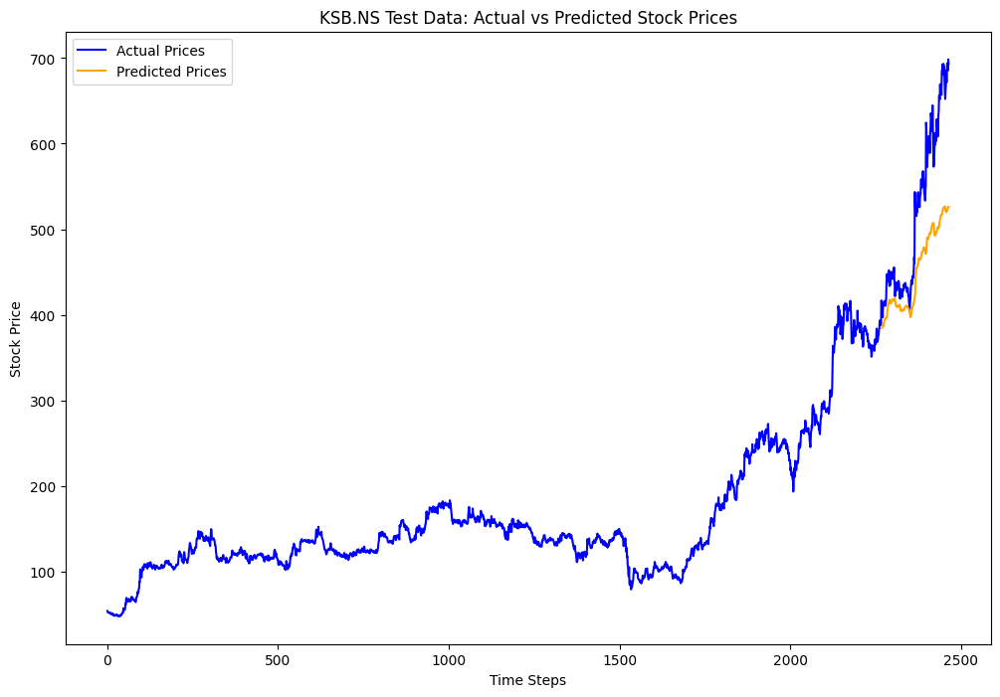

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.1402, Validation Loss: 0.0284
Epoch [2/33], Loss: 0.0797, Validation Loss: 0.0541
Epoch [3/33], Loss: 0.0502, Validation Loss: 0.0307
Epoch [4/33], Loss: 0.0538, Validation Loss: 0.0278
Epoch [5/33], Loss: 0.0515, Validation Loss: 0.0316
Epoch [6/33], Loss: 0.0374, Validation Loss: 0.0183
Epoch [7/33], Loss: 0.0112, Validation Loss: 0.0015
Epoch [8/33], Loss: 0.0290, Validation Loss: 0.0011
Epoch [9/33], Loss: 0.0565, Validation Loss: 0.0148
Epoch [10/33], Loss: 0.0434, Validation Loss: 0.0446
Epoch [11/33], Loss: 0.0291, Validation Loss: 0.0236
Epoch [12/33], Loss: 0.0123, Validation Loss: 0.0034
Epoch [13/33], Loss: 0.0095, Validation Loss: 0.0003
Epoch [14/33], Loss: 0.0062, Validation Loss: 0.0006
Epoch [15/33], Loss: 0.0038, Validation Loss: 0.0008
Epoch [16/33], Loss: 0.0045, Validation Loss: 0.0003
Epoch [17/33], Loss: 0.0041, Validation Loss: 0.0006
Epoch [18/33], Loss: 0.0032, Validation Loss: 0.0001
Epoch [19/33], Loss: 0.0036, Validation Loss: 0.0001
Ep

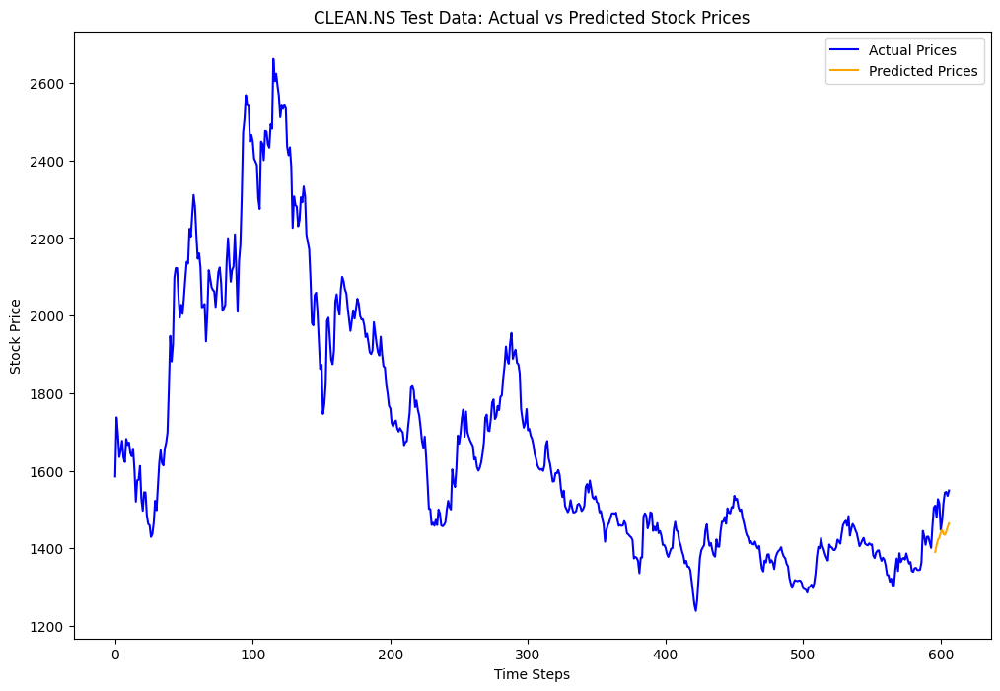

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.1112, Validation Loss: 0.0048
Epoch [2/33], Loss: 0.1271, Validation Loss: 0.0731
Epoch [3/33], Loss: 0.0734, Validation Loss: 0.0026
Epoch [4/33], Loss: 0.0596, Validation Loss: 0.0005
Epoch [5/33], Loss: 0.0635, Validation Loss: 0.0029
Epoch [6/33], Loss: 0.0472, Validation Loss: 0.0054
Epoch [7/33], Loss: 0.0396, Validation Loss: 0.0581
Epoch [8/33], Loss: 0.0513, Validation Loss: 0.0009
Epoch [9/33], Loss: 0.0235, Validation Loss: 0.0003
Epoch [10/33], Loss: 0.0107, Validation Loss: 0.0537
Epoch [11/33], Loss: 0.0198, Validation Loss: 0.0315
Epoch [12/33], Loss: 0.0215, Validation Loss: 0.0034
Epoch [13/33], Loss: 0.0127, Validation Loss: 0.0007
Epoch [14/33], Loss: 0.0037, Validation Loss: 0.0007
Epoch [15/33], Loss: 0.0037, Validation Loss: 0.0010
Epoch [16/33], Loss: 0.0038, Validation Loss: 0.0012
Epoch [17/33], Loss: 0.0037, Validation Loss: 0.0009
Epoch [18/33], Loss: 0.0034, Validation Loss: 0.0004
Epoch [19/33], Loss: 0.0037, Validation Loss: 0.0006
Ep

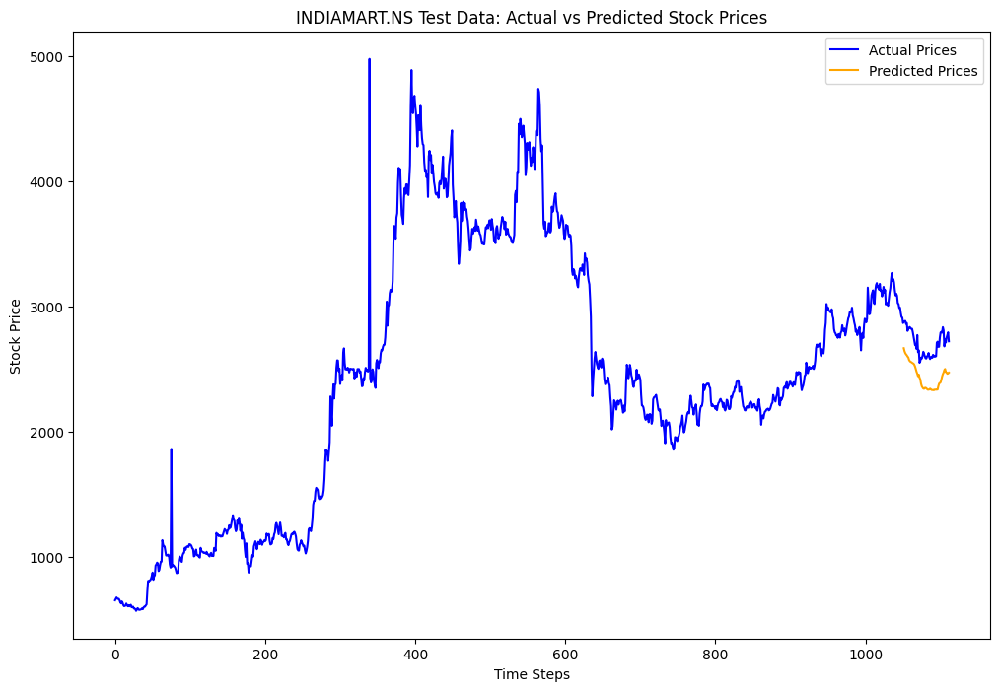

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0394, Validation Loss: 0.1073
Epoch [2/33], Loss: 0.1557, Validation Loss: 0.2243
Epoch [3/33], Loss: 0.0587, Validation Loss: 0.0739
Epoch [4/33], Loss: 0.0548, Validation Loss: 0.0017
Epoch [5/33], Loss: 0.0250, Validation Loss: 0.0125
Epoch [6/33], Loss: 0.0074, Validation Loss: 0.0007
Epoch [7/33], Loss: 0.0029, Validation Loss: 0.0033
Epoch [8/33], Loss: 0.0045, Validation Loss: 0.0068
Epoch [9/33], Loss: 0.0109, Validation Loss: 0.0457
Epoch [10/33], Loss: 0.0212, Validation Loss: 0.0054
Epoch [11/33], Loss: 0.0186, Validation Loss: 0.0263
Epoch [12/33], Loss: 0.0216, Validation Loss: 0.0106
Epoch [13/33], Loss: 0.0130, Validation Loss: 0.0031
Epoch [14/33], Loss: 0.0107, Validation Loss: 0.0009
Epoch [15/33], Loss: 0.0139, Validation Loss: 0.0131
Epoch [16/33], Loss: 0.0188, Validation Loss: 0.0100
Epoch [17/33], Loss: 0.0107, Validation Loss: 0.0006
Epoch [18/33], Loss: 0.0042, Validation Loss: 0.0010
Epoch [19/33], Loss: 0.0067, Validation Loss: 0.0028
Ep

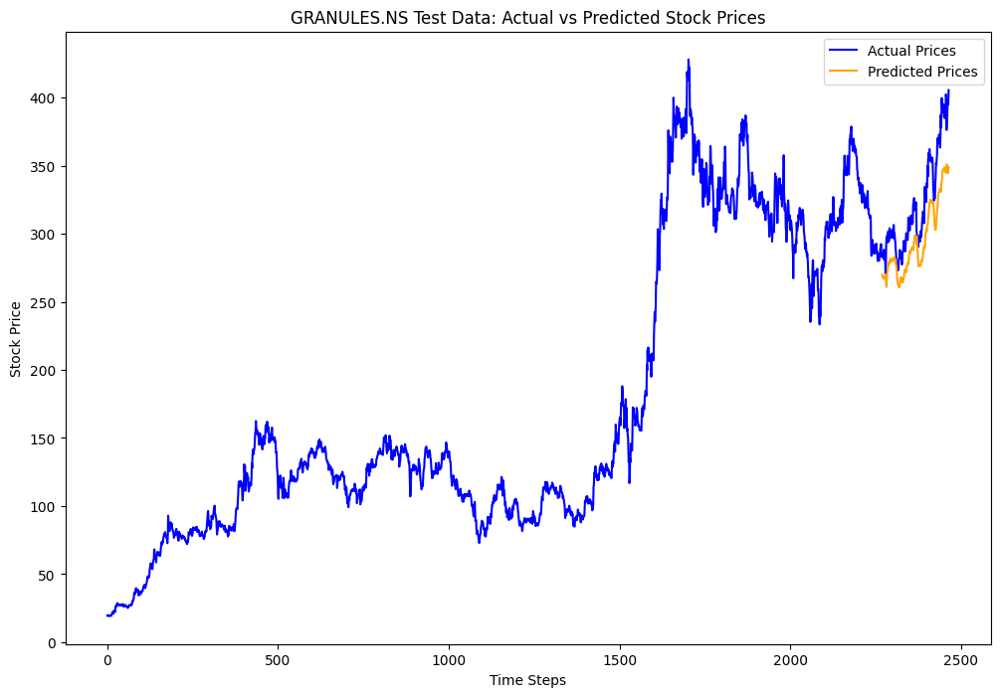

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0156, Validation Loss: 0.0686
Epoch [2/33], Loss: 0.0131, Validation Loss: 0.0499
Epoch [3/33], Loss: 0.0147, Validation Loss: 0.0528
Epoch [4/33], Loss: 0.0120, Validation Loss: 0.0350
Epoch [5/33], Loss: 0.0068, Validation Loss: 0.0135
Epoch [6/33], Loss: 0.0076, Validation Loss: 0.0071
Epoch [7/33], Loss: 0.0058, Validation Loss: 0.0206
Epoch [8/33], Loss: 0.0152, Validation Loss: 0.0472
Epoch [9/33], Loss: 0.0143, Validation Loss: 0.0526
Epoch [10/33], Loss: 0.0107, Validation Loss: 0.0401
Epoch [11/33], Loss: 0.0083, Validation Loss: 0.0204
Epoch [12/33], Loss: 0.0039, Validation Loss: 0.0015
Epoch [13/33], Loss: 0.0038, Validation Loss: 0.0142
Epoch [14/33], Loss: 0.0045, Validation Loss: 0.0019
Epoch [15/33], Loss: 0.0028, Validation Loss: 0.0011
Epoch [16/33], Loss: 0.0020, Validation Loss: 0.0061
Epoch [17/33], Loss: 0.0019, Validation Loss: 0.0012
Epoch [18/33], Loss: 0.0011, Validation Loss: 0.0009
Epoch [19/33], Loss: 0.0008, Validation Loss: 0.0012
Ep

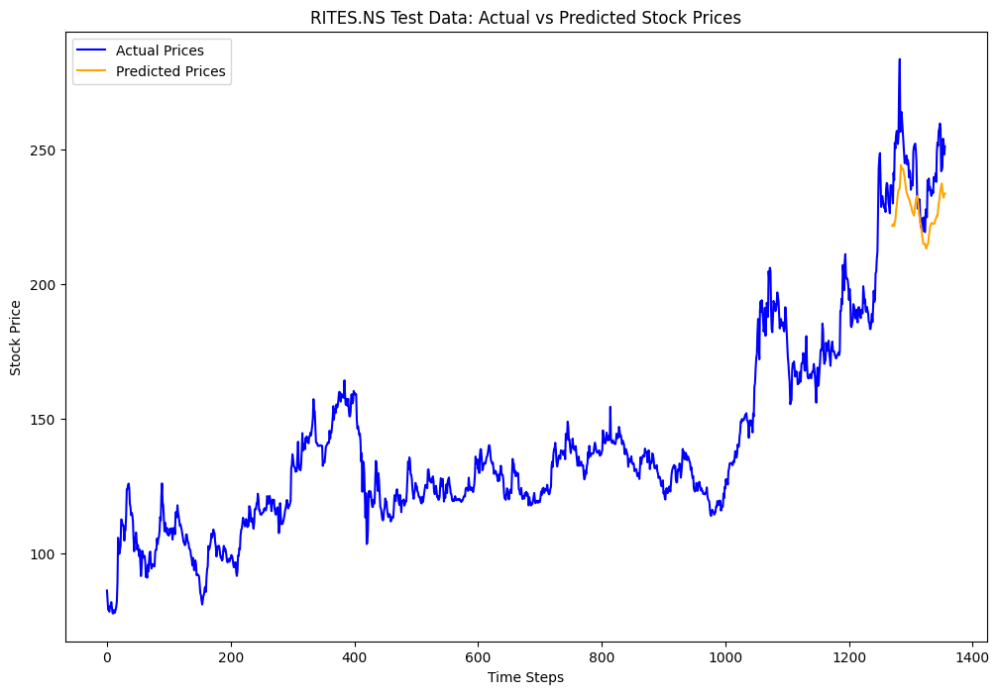

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0291, Validation Loss: 0.1096
Epoch [2/33], Loss: 0.0300, Validation Loss: 0.0610
Epoch [3/33], Loss: 0.0337, Validation Loss: 0.0367
Epoch [4/33], Loss: 0.0181, Validation Loss: 0.0357
Epoch [5/33], Loss: 0.0414, Validation Loss: 0.0770
Epoch [6/33], Loss: 0.0207, Validation Loss: 0.0247
Epoch [7/33], Loss: 0.0084, Validation Loss: 0.0044
Epoch [8/33], Loss: 0.0094, Validation Loss: 0.0187
Epoch [9/33], Loss: 0.0068, Validation Loss: 0.0030
Epoch [10/33], Loss: 0.0010, Validation Loss: 0.0010
Epoch [11/33], Loss: 0.0009, Validation Loss: 0.0019
Epoch [12/33], Loss: 0.0008, Validation Loss: 0.0020
Epoch [13/33], Loss: 0.0009, Validation Loss: 0.0011
Epoch [14/33], Loss: 0.0008, Validation Loss: 0.0014
Epoch [15/33], Loss: 0.0012, Validation Loss: 0.0021
Epoch [16/33], Loss: 0.0028, Validation Loss: 0.0014
Epoch [17/33], Loss: 0.0033, Validation Loss: 0.0011
Epoch [18/33], Loss: 0.0105, Validation Loss: 0.0108
Epoch [19/33], Loss: 0.0070, Validation Loss: 0.0015
Ep

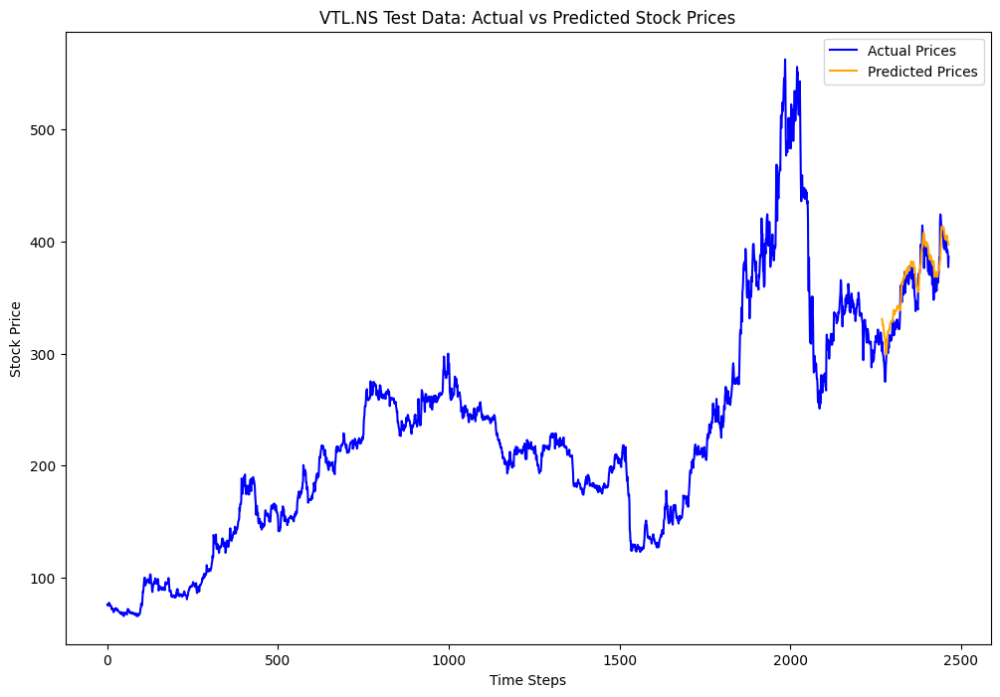

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0033, Validation Loss: 0.0819
Epoch [2/33], Loss: 0.0031, Validation Loss: 0.0775
Epoch [3/33], Loss: 0.0028, Validation Loss: 0.0801
Epoch [4/33], Loss: 0.0028, Validation Loss: 0.0841
Epoch [5/33], Loss: 0.0026, Validation Loss: 0.0821
Epoch [6/33], Loss: 0.0022, Validation Loss: 0.0807
Epoch [7/33], Loss: 0.0023, Validation Loss: 0.0801
Epoch [8/33], Loss: 0.0022, Validation Loss: 0.0801
Epoch [9/33], Loss: 0.0022, Validation Loss: 0.0795
Epoch [10/33], Loss: 0.0022, Validation Loss: 0.0797
Epoch [11/33], Loss: 0.0022, Validation Loss: 0.0792
Epoch [12/33], Loss: 0.0022, Validation Loss: 0.0789
Epoch [13/33], Loss: 0.0022, Validation Loss: 0.0784
Epoch [14/33], Loss: 0.0021, Validation Loss: 0.0782
Epoch [15/33], Loss: 0.0022, Validation Loss: 0.0778
Epoch [16/33], Loss: 0.0021, Validation Loss: 0.0776
Epoch [17/33], Loss: 0.0021, Validation Loss: 0.0774
Epoch [18/33], Loss: 0.0021, Validation Loss: 0.0759
Epoch [19/33], Loss: 0.0021, Validation Loss: 0.0772
Ep

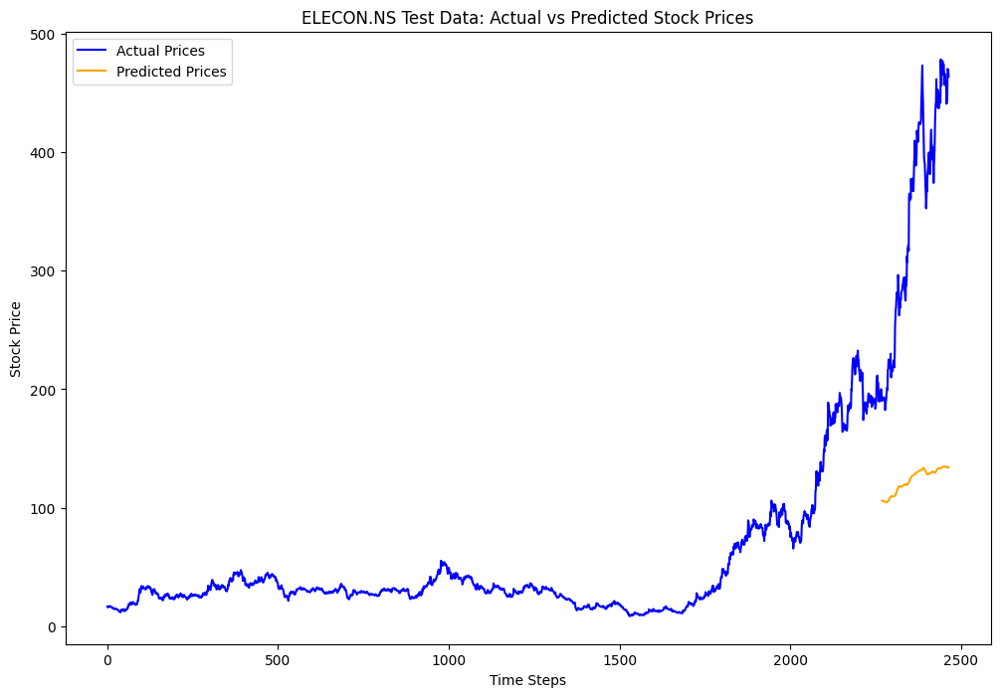

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0744, Validation Loss: 0.0178
Epoch [2/33], Loss: 0.0493, Validation Loss: 0.0340
Epoch [3/33], Loss: 0.0304, Validation Loss: 0.0557
Epoch [4/33], Loss: 0.0335, Validation Loss: 0.0407
Epoch [5/33], Loss: 0.0316, Validation Loss: 0.0236
Epoch [6/33], Loss: 0.0295, Validation Loss: 0.0211
Epoch [7/33], Loss: 0.0264, Validation Loss: 0.0263
Epoch [8/33], Loss: 0.0252, Validation Loss: 0.0263
Epoch [9/33], Loss: 0.0219, Validation Loss: 0.0155
Epoch [10/33], Loss: 0.0167, Validation Loss: 0.0080
Epoch [11/33], Loss: 0.0095, Validation Loss: 0.0096
Epoch [12/33], Loss: 0.0071, Validation Loss: 0.0028
Epoch [13/33], Loss: 0.0116, Validation Loss: 0.0345
Epoch [14/33], Loss: 0.0139, Validation Loss: 0.0022
Epoch [15/33], Loss: 0.0102, Validation Loss: 0.0166
Epoch [16/33], Loss: 0.0064, Validation Loss: 0.0028
Epoch [17/33], Loss: 0.0046, Validation Loss: 0.0027
Epoch [18/33], Loss: 0.0046, Validation Loss: 0.0030
Epoch [19/33], Loss: 0.0042, Validation Loss: 0.0061
Ep

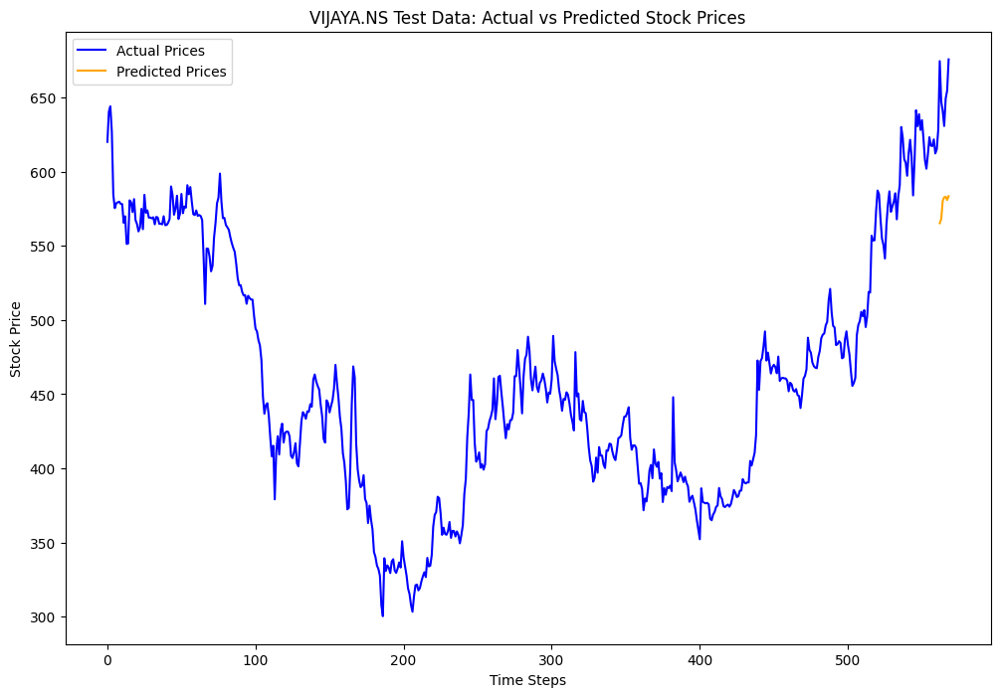

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0038, Validation Loss: 0.0632
Epoch [2/33], Loss: 0.0048, Validation Loss: 0.0738
Epoch [3/33], Loss: 0.0051, Validation Loss: 0.0814
Epoch [4/33], Loss: 0.0043, Validation Loss: 0.0842
Epoch [5/33], Loss: 0.0037, Validation Loss: 0.0833
Epoch [6/33], Loss: 0.0036, Validation Loss: 0.0828
Epoch [7/33], Loss: 0.0035, Validation Loss: 0.0826
Epoch [8/33], Loss: 0.0037, Validation Loss: 0.0828
Epoch [9/33], Loss: 0.0034, Validation Loss: 0.0824
Epoch [10/33], Loss: 0.0035, Validation Loss: 0.0824
Epoch [11/33], Loss: 0.0035, Validation Loss: 0.0827
Epoch [12/33], Loss: 0.0035, Validation Loss: 0.0824
Epoch [13/33], Loss: 0.0034, Validation Loss: 0.0821
Epoch [14/33], Loss: 0.0034, Validation Loss: 0.0820
Epoch [15/33], Loss: 0.0034, Validation Loss: 0.0819
Epoch [16/33], Loss: 0.0034, Validation Loss: 0.0818
Epoch [17/33], Loss: 0.0033, Validation Loss: 0.0813
Epoch [18/33], Loss: 0.0034, Validation Loss: 0.0811
Epoch [19/33], Loss: 0.0033, Validation Loss: 0.0810
Ep

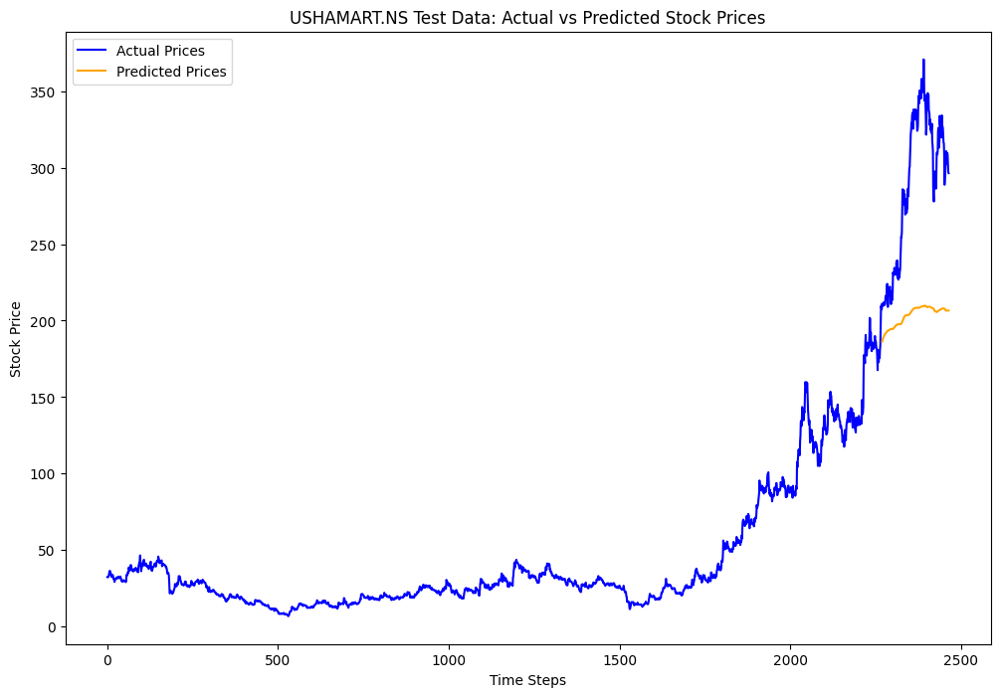

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0101, Validation Loss: 0.1279
Epoch [2/33], Loss: 0.0039, Validation Loss: 0.1412
Epoch [3/33], Loss: 0.0046, Validation Loss: 0.1320
Epoch [4/33], Loss: 0.0044, Validation Loss: 0.1259
Epoch [5/33], Loss: 0.0041, Validation Loss: 0.1285
Epoch [6/33], Loss: 0.0041, Validation Loss: 0.1301
Epoch [7/33], Loss: 0.0043, Validation Loss: 0.1276
Epoch [8/33], Loss: 0.0043, Validation Loss: 0.1247
Epoch [9/33], Loss: 0.0040, Validation Loss: 0.1226
Epoch [10/33], Loss: 0.0039, Validation Loss: 0.1173
Epoch [11/33], Loss: 0.0038, Validation Loss: 0.1033
Epoch [12/33], Loss: 0.0032, Validation Loss: 0.0557
Epoch [13/33], Loss: 0.0022, Validation Loss: 0.0717
Epoch [14/33], Loss: 0.0024, Validation Loss: 0.0450
Epoch [15/33], Loss: 0.0012, Validation Loss: 0.0233
Epoch [16/33], Loss: 0.0011, Validation Loss: 0.0469
Epoch [17/33], Loss: 0.0016, Validation Loss: 0.0205
Epoch [18/33], Loss: 0.0009, Validation Loss: 0.0111
Epoch [19/33], Loss: 0.0009, Validation Loss: 0.0431
Ep

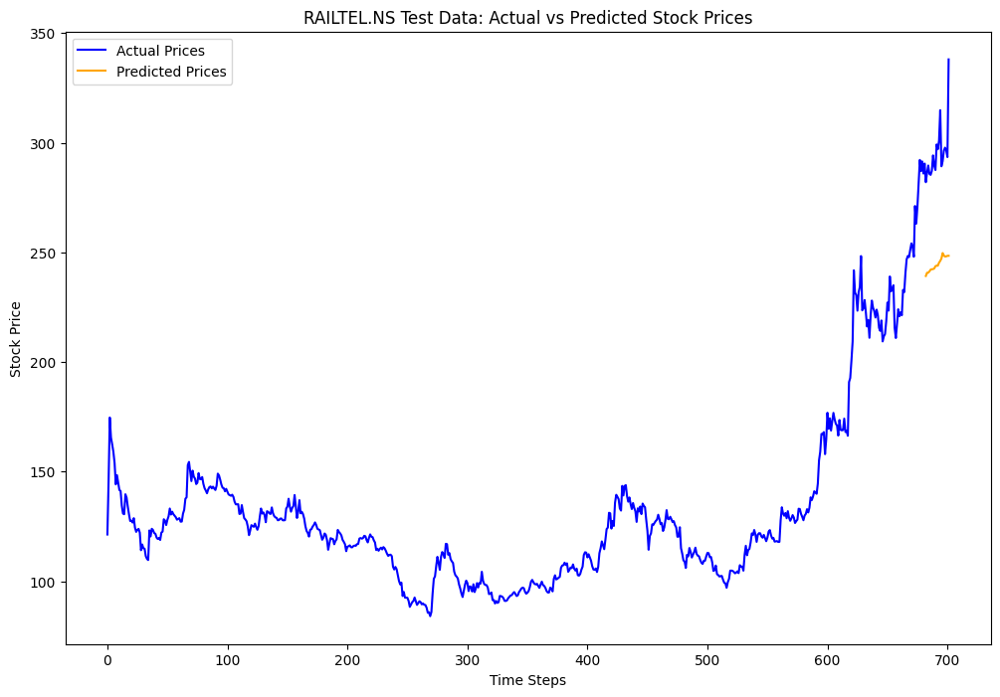

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0262, Validation Loss: 0.0701
Epoch [2/33], Loss: 0.0313, Validation Loss: 0.0246
Epoch [3/33], Loss: 0.0310, Validation Loss: 0.0182
Epoch [4/33], Loss: 0.0293, Validation Loss: 0.0150
Epoch [5/33], Loss: 0.0235, Validation Loss: 0.0201
Epoch [6/33], Loss: 0.0189, Validation Loss: 0.0085
Epoch [7/33], Loss: 0.0052, Validation Loss: 0.0068
Epoch [8/33], Loss: 0.0017, Validation Loss: 0.0016
Epoch [9/33], Loss: 0.0014, Validation Loss: 0.0021
Epoch [10/33], Loss: 0.0023, Validation Loss: 0.0019
Epoch [11/33], Loss: 0.0017, Validation Loss: 0.0009
Epoch [12/33], Loss: 0.0018, Validation Loss: 0.0007
Epoch [13/33], Loss: 0.0013, Validation Loss: 0.0011
Epoch [14/33], Loss: 0.0020, Validation Loss: 0.0008
Epoch [15/33], Loss: 0.0016, Validation Loss: 0.0015
Epoch [16/33], Loss: 0.0036, Validation Loss: 0.0014
Epoch [17/33], Loss: 0.0019, Validation Loss: 0.0017
Epoch [18/33], Loss: 0.0047, Validation Loss: 0.0023
Epoch [19/33], Loss: 0.0014, Validation Loss: 0.0007
Ep

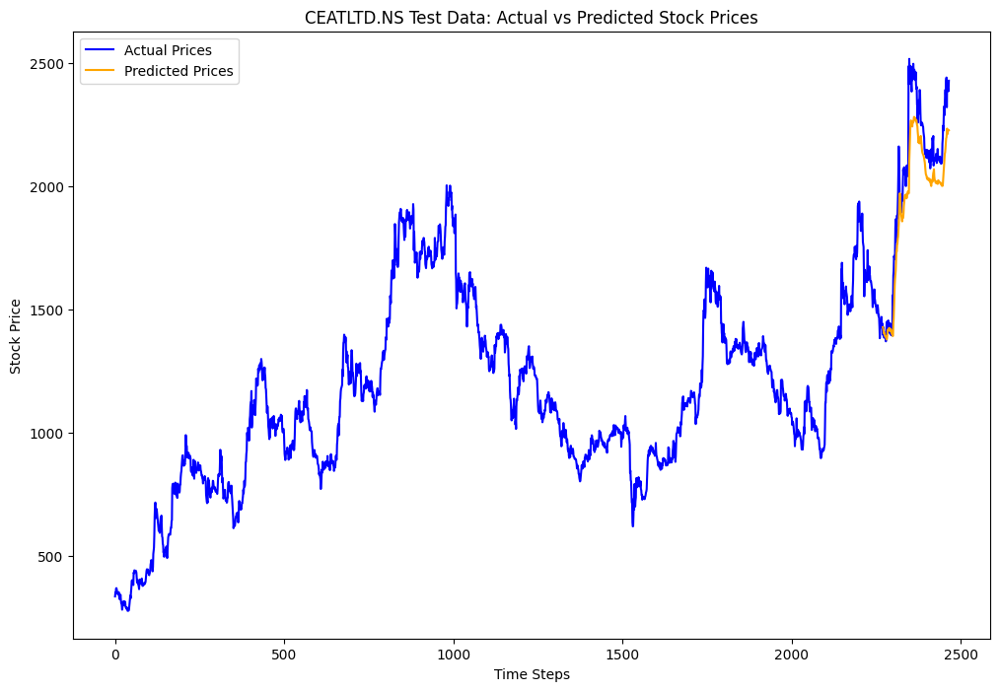

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0181, Validation Loss: 0.1272
Epoch [2/33], Loss: 0.0177, Validation Loss: 0.0842
Epoch [3/33], Loss: 0.0222, Validation Loss: 0.0916
Epoch [4/33], Loss: 0.0208, Validation Loss: 0.0971
Epoch [5/33], Loss: 0.0165, Validation Loss: 0.0735
Epoch [6/33], Loss: 0.0114, Validation Loss: 0.0186
Epoch [7/33], Loss: 0.0927, Validation Loss: 0.0430
Epoch [8/33], Loss: 0.0197, Validation Loss: 0.1057
Epoch [9/33], Loss: 0.0232, Validation Loss: 0.1142
Epoch [10/33], Loss: 0.0161, Validation Loss: 0.0955
Epoch [11/33], Loss: 0.0159, Validation Loss: 0.0829
Epoch [12/33], Loss: 0.0118, Validation Loss: 0.0444
Epoch [13/33], Loss: 0.0070, Validation Loss: 0.0009
Epoch [14/33], Loss: 0.0100, Validation Loss: 0.0032
Epoch [15/33], Loss: 0.0168, Validation Loss: 0.1008
Epoch [16/33], Loss: 0.0151, Validation Loss: 0.0878
Epoch [17/33], Loss: 0.0124, Validation Loss: 0.0651
Epoch [18/33], Loss: 0.0078, Validation Loss: 0.0167
Epoch [19/33], Loss: 0.0035, Validation Loss: 0.0008
Ep

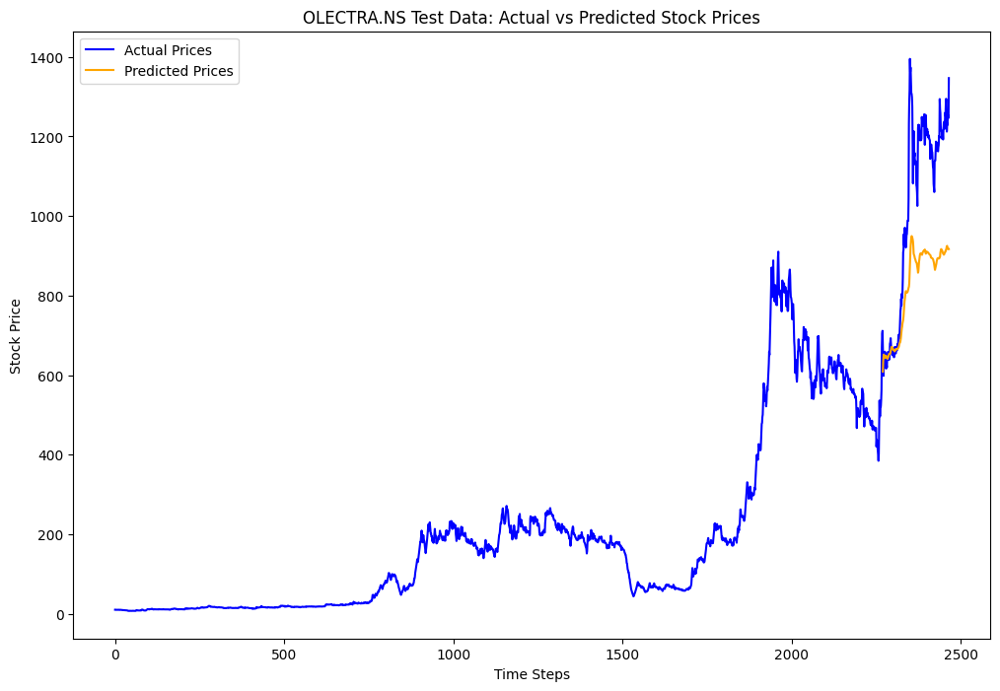

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0369, Validation Loss: 0.0161
Epoch [2/33], Loss: 0.1677, Validation Loss: 0.0054
Epoch [3/33], Loss: 0.1196, Validation Loss: 0.0316
Epoch [4/33], Loss: 0.0798, Validation Loss: 0.0095
Epoch [5/33], Loss: 0.0452, Validation Loss: 0.0019
Epoch [6/33], Loss: 0.0159, Validation Loss: 0.0022
Epoch [7/33], Loss: 0.0058, Validation Loss: 0.0010
Epoch [8/33], Loss: 0.0037, Validation Loss: 0.0003
Epoch [9/33], Loss: 0.0035, Validation Loss: 0.0015
Epoch [10/33], Loss: 0.0033, Validation Loss: 0.0020
Epoch [11/33], Loss: 0.0040, Validation Loss: 0.0026
Epoch [12/33], Loss: 0.0056, Validation Loss: 0.0037
Epoch [13/33], Loss: 0.0071, Validation Loss: 0.0030
Epoch [14/33], Loss: 0.0082, Validation Loss: 0.0033
Epoch [15/33], Loss: 0.0085, Validation Loss: 0.0020
Epoch [16/33], Loss: 0.0065, Validation Loss: 0.0013
Epoch [17/33], Loss: 0.0053, Validation Loss: 0.0011
Epoch [18/33], Loss: 0.0044, Validation Loss: 0.0011
Epoch [19/33], Loss: 0.0046, Validation Loss: 0.0016
Ep

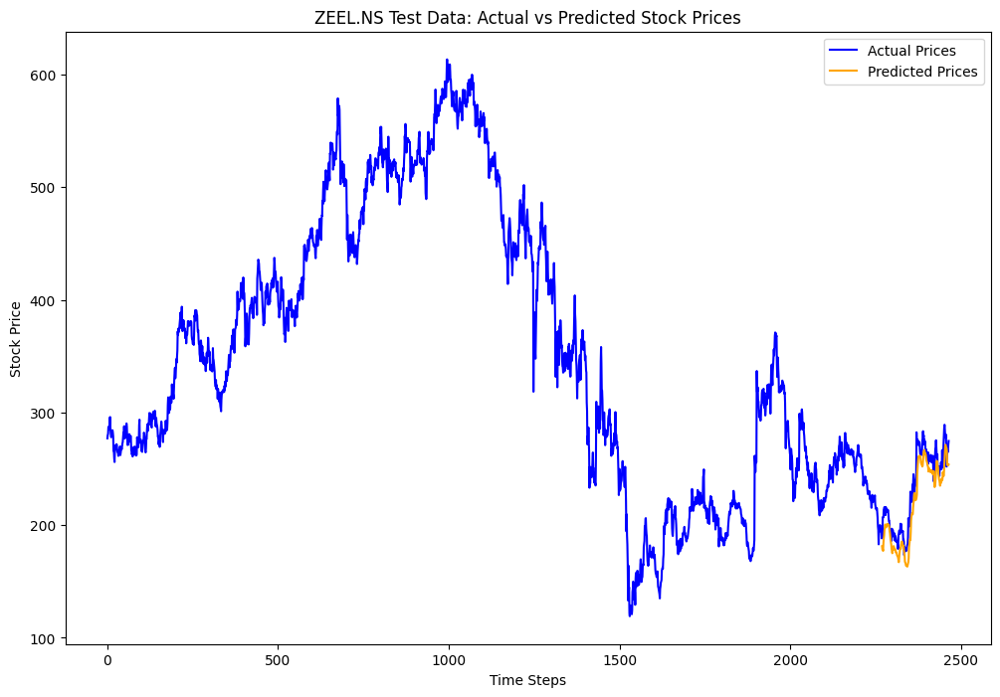

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.1729, Validation Loss: 0.0224
Epoch [2/33], Loss: 0.0802, Validation Loss: 0.0003
Epoch [3/33], Loss: 0.0626, Validation Loss: 0.0046
Epoch [4/33], Loss: 0.0554, Validation Loss: 0.0032
Epoch [5/33], Loss: 0.0486, Validation Loss: 0.0043
Epoch [6/33], Loss: 0.0315, Validation Loss: 0.0018
Epoch [7/33], Loss: 0.0117, Validation Loss: 0.0074
Epoch [8/33], Loss: 0.1425, Validation Loss: 0.0740
Epoch [9/33], Loss: 0.1049, Validation Loss: 0.0159
Epoch [10/33], Loss: 0.0472, Validation Loss: 0.0162
Epoch [11/33], Loss: 0.0434, Validation Loss: 0.0034
Epoch [12/33], Loss: 0.0352, Validation Loss: 0.0002
Epoch [13/33], Loss: 0.0205, Validation Loss: 0.0031
Epoch [14/33], Loss: 0.0080, Validation Loss: 0.0008
Epoch [15/33], Loss: 0.0071, Validation Loss: 0.0023
Epoch [16/33], Loss: 0.0092, Validation Loss: 0.0037
Epoch [17/33], Loss: 0.0056, Validation Loss: 0.0008
Epoch [18/33], Loss: 0.0053, Validation Loss: 0.0003
Epoch [19/33], Loss: 0.0041, Validation Loss: 0.0002
Ep

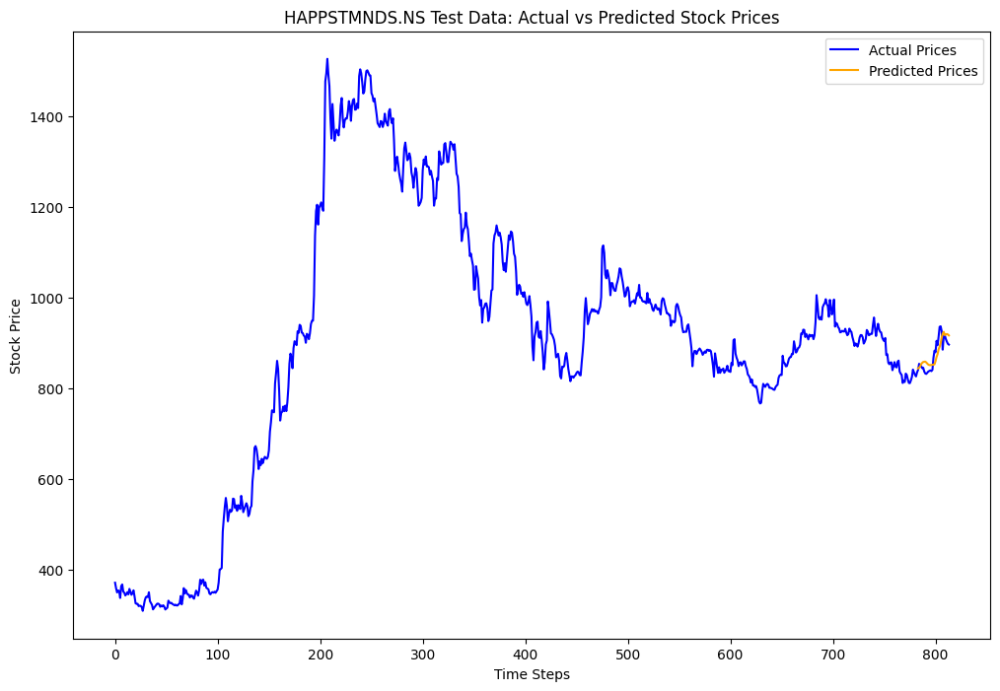

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.1623, Validation Loss: 0.0131
Epoch [2/33], Loss: 0.0308, Validation Loss: 0.0014
Epoch [3/33], Loss: 0.0361, Validation Loss: 0.0011
Epoch [4/33], Loss: 0.0399, Validation Loss: 0.0058
Epoch [5/33], Loss: 0.0261, Validation Loss: 0.0012
Epoch [6/33], Loss: 0.0263, Validation Loss: 0.0011
Epoch [7/33], Loss: 0.0271, Validation Loss: 0.0020
Epoch [8/33], Loss: 0.0186, Validation Loss: 0.0007
Epoch [9/33], Loss: 0.0133, Validation Loss: 0.0033
Epoch [10/33], Loss: 0.0582, Validation Loss: 0.0371
Epoch [11/33], Loss: 0.0595, Validation Loss: 0.0024
Epoch [12/33], Loss: 0.0391, Validation Loss: 0.0121
Epoch [13/33], Loss: 0.0212, Validation Loss: 0.0018
Epoch [14/33], Loss: 0.0192, Validation Loss: 0.0008
Epoch [15/33], Loss: 0.0226, Validation Loss: 0.0014
Epoch [16/33], Loss: 0.0187, Validation Loss: 0.0016
Epoch [17/33], Loss: 0.0127, Validation Loss: 0.0005
Epoch [18/33], Loss: 0.0065, Validation Loss: 0.0018
Epoch [19/33], Loss: 0.0054, Validation Loss: 0.0027
Ep

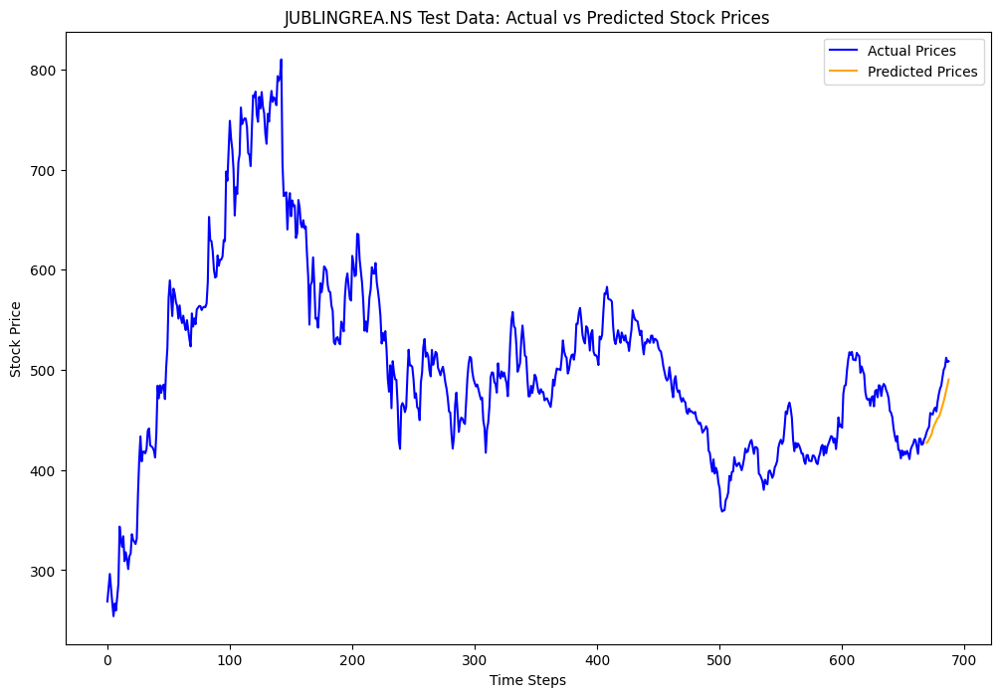

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0854, Validation Loss: 0.0751
Epoch [2/33], Loss: 0.1269, Validation Loss: 0.0010
Epoch [3/33], Loss: 0.0852, Validation Loss: 0.0338
Epoch [4/33], Loss: 0.0568, Validation Loss: 0.0914
Epoch [5/33], Loss: 0.0642, Validation Loss: 0.0407
Epoch [6/33], Loss: 0.0450, Validation Loss: 0.0404
Epoch [7/33], Loss: 0.0193, Validation Loss: 0.0008
Epoch [8/33], Loss: 0.0374, Validation Loss: 0.0372
Epoch [9/33], Loss: 0.0174, Validation Loss: 0.0012
Epoch [10/33], Loss: 0.0072, Validation Loss: 0.0032
Epoch [11/33], Loss: 0.0146, Validation Loss: 0.0246
Epoch [12/33], Loss: 0.0099, Validation Loss: 0.0044
Epoch [13/33], Loss: 0.0048, Validation Loss: 0.0011
Epoch [14/33], Loss: 0.0096, Validation Loss: 0.0050
Epoch [15/33], Loss: 0.0091, Validation Loss: 0.0096
Epoch [16/33], Loss: 0.0140, Validation Loss: 0.0266
Epoch [17/33], Loss: 0.0104, Validation Loss: 0.0007
Epoch [18/33], Loss: 0.0043, Validation Loss: 0.0003
Epoch [19/33], Loss: 0.0054, Validation Loss: 0.0043
Ep

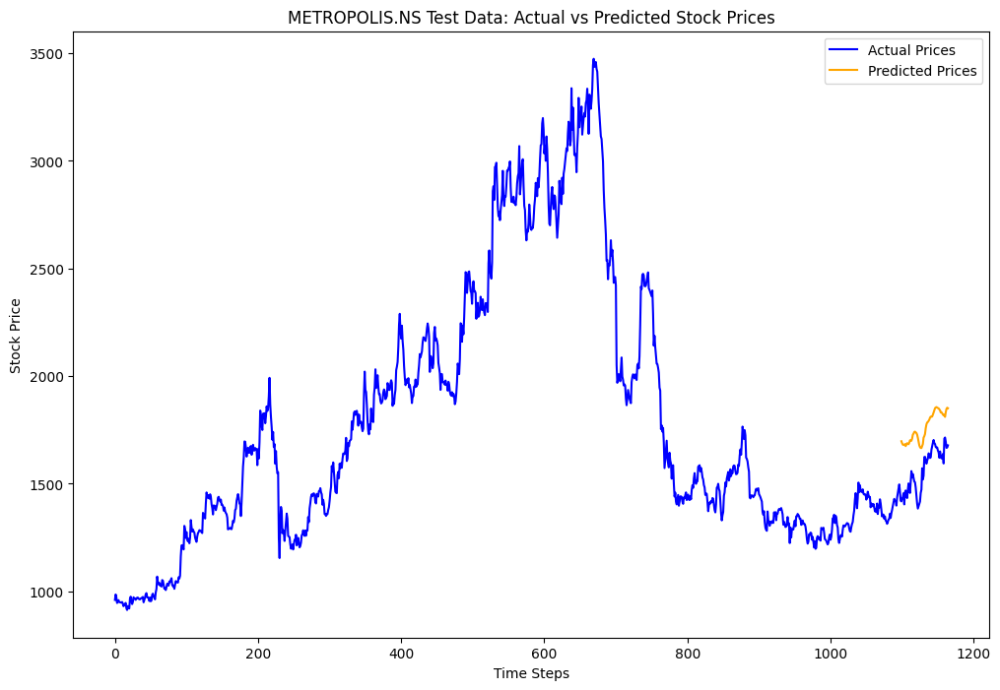

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0144, Validation Loss: 0.0481
Epoch [2/33], Loss: 0.0128, Validation Loss: 0.0429
Epoch [3/33], Loss: 0.0120, Validation Loss: 0.0384
Epoch [4/33], Loss: 0.0108, Validation Loss: 0.0370
Epoch [5/33], Loss: 0.0102, Validation Loss: 0.0372
Epoch [6/33], Loss: 0.0100, Validation Loss: 0.0297
Epoch [7/33], Loss: 0.0040, Validation Loss: 0.0397
Epoch [8/33], Loss: 0.0085, Validation Loss: 0.0204
Epoch [9/33], Loss: 0.0039, Validation Loss: 0.0045
Epoch [10/33], Loss: 0.0010, Validation Loss: 0.0052
Epoch [11/33], Loss: 0.0012, Validation Loss: 0.0144
Epoch [12/33], Loss: 0.0015, Validation Loss: 0.0031
Epoch [13/33], Loss: 0.0006, Validation Loss: 0.0006
Epoch [14/33], Loss: 0.0005, Validation Loss: 0.0007
Epoch [15/33], Loss: 0.0005, Validation Loss: 0.0005
Epoch [16/33], Loss: 0.0004, Validation Loss: 0.0007
Epoch [17/33], Loss: 0.0004, Validation Loss: 0.0007
Epoch [18/33], Loss: 0.0005, Validation Loss: 0.0011
Epoch [19/33], Loss: 0.0007, Validation Loss: 0.0019
Ep

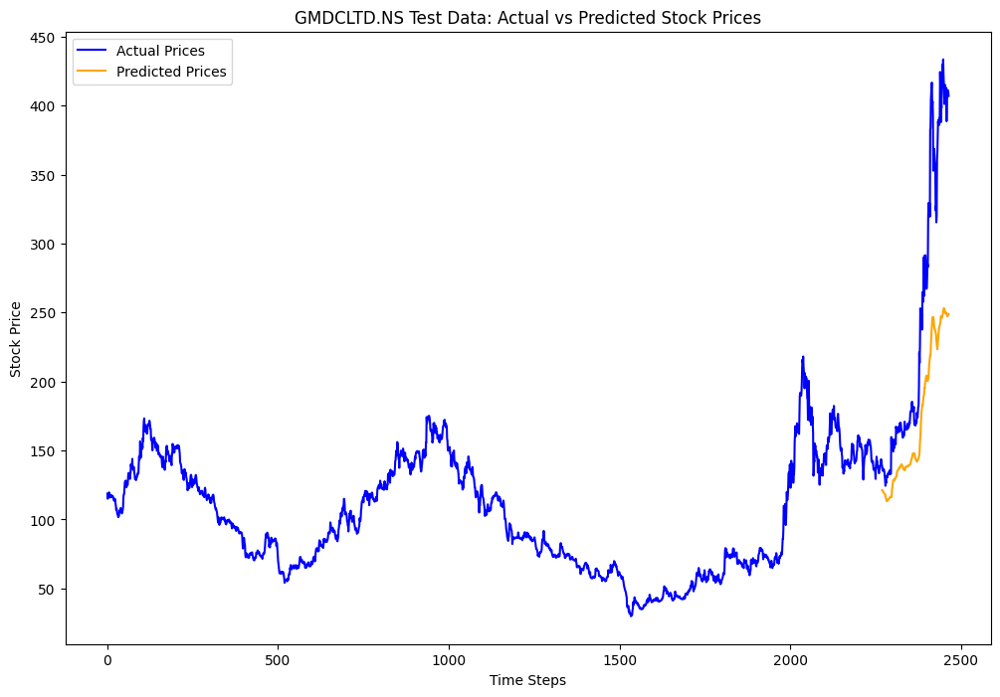

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0325, Validation Loss: 0.2319
Epoch [2/33], Loss: 0.0436, Validation Loss: 0.2694
Epoch [3/33], Loss: 0.0314, Validation Loss: 0.1759
Epoch [4/33], Loss: 0.0141, Validation Loss: 0.0254
Epoch [5/33], Loss: 0.0033, Validation Loss: 0.0060
Epoch [6/33], Loss: 0.0014, Validation Loss: 0.0052
Epoch [7/33], Loss: 0.0044, Validation Loss: 0.0038
Epoch [8/33], Loss: 0.0183, Validation Loss: 0.1483
Epoch [9/33], Loss: 0.0291, Validation Loss: 0.2275
Epoch [10/33], Loss: 0.0209, Validation Loss: 0.0540
Epoch [11/33], Loss: 0.0153, Validation Loss: 0.0711
Epoch [12/33], Loss: 0.0190, Validation Loss: 0.1647
Epoch [13/33], Loss: 0.0207, Validation Loss: 0.0787
Epoch [14/33], Loss: 0.0080, Validation Loss: 0.0022
Epoch [15/33], Loss: 0.0023, Validation Loss: 0.0029
Epoch [16/33], Loss: 0.0063, Validation Loss: 0.0323
Epoch [17/33], Loss: 0.0044, Validation Loss: 0.0013
Epoch [18/33], Loss: 0.0060, Validation Loss: 0.0238
Epoch [19/33], Loss: 0.0039, Validation Loss: 0.0009
Ep

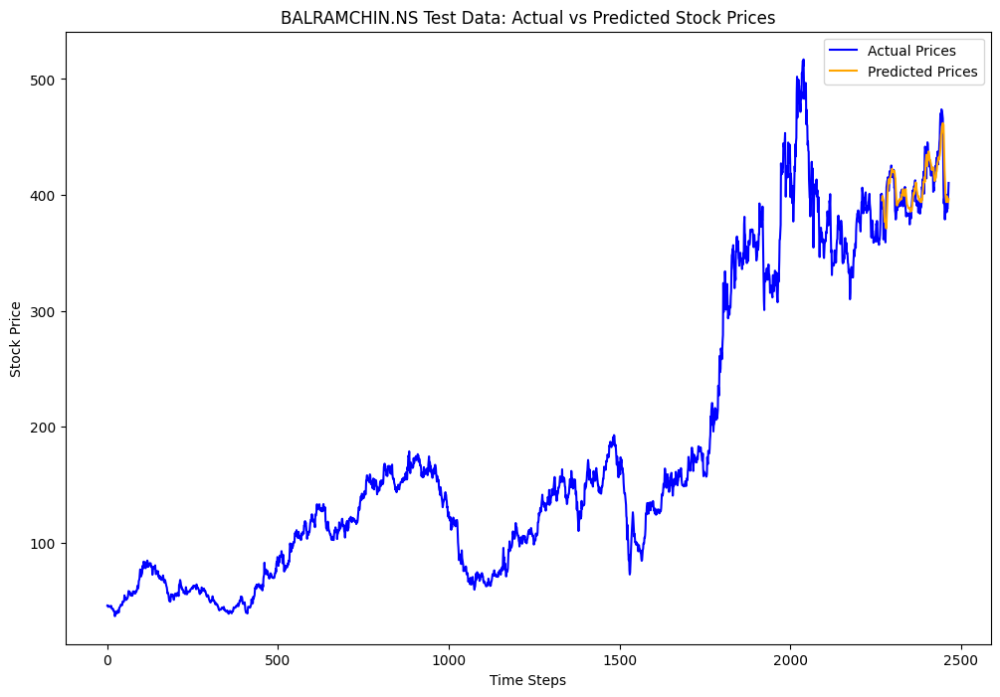

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0640, Validation Loss: 0.0026
Epoch [2/33], Loss: 0.1108, Validation Loss: 0.0446
Epoch [3/33], Loss: 0.0699, Validation Loss: 0.0534
Epoch [4/33], Loss: 0.0578, Validation Loss: 0.0300
Epoch [5/33], Loss: 0.0279, Validation Loss: 0.0026
Epoch [6/33], Loss: 0.0174, Validation Loss: 0.0014
Epoch [7/33], Loss: 0.0153, Validation Loss: 0.0025
Epoch [8/33], Loss: 0.0071, Validation Loss: 0.0008
Epoch [9/33], Loss: 0.0045, Validation Loss: 0.0006
Epoch [10/33], Loss: 0.0030, Validation Loss: 0.0006
Epoch [11/33], Loss: 0.0027, Validation Loss: 0.0004
Epoch [12/33], Loss: 0.0025, Validation Loss: 0.0004
Epoch [13/33], Loss: 0.0025, Validation Loss: 0.0004
Epoch [14/33], Loss: 0.0028, Validation Loss: 0.0005
Epoch [15/33], Loss: 0.0026, Validation Loss: 0.0006
Epoch [16/33], Loss: 0.0033, Validation Loss: 0.0004
Epoch [17/33], Loss: 0.0037, Validation Loss: 0.0007
Epoch [18/33], Loss: 0.0038, Validation Loss: 0.0009
Epoch [19/33], Loss: 0.0040, Validation Loss: 0.0008
Ep

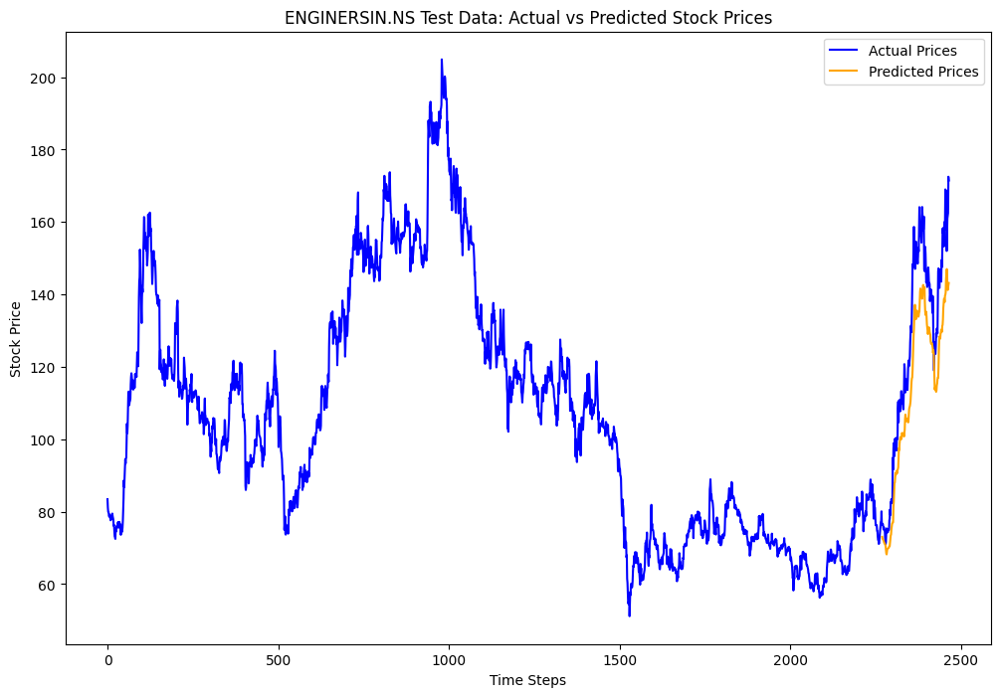

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0456, Validation Loss: 0.0955
Epoch [2/33], Loss: 0.0886, Validation Loss: 0.2559
Epoch [3/33], Loss: 0.0635, Validation Loss: 0.2348
Epoch [4/33], Loss: 0.0572, Validation Loss: 0.2026
Epoch [5/33], Loss: 0.0157, Validation Loss: 0.7801
Epoch [6/33], Loss: 0.3004, Validation Loss: 0.2476
Epoch [7/33], Loss: 0.2760, Validation Loss: 0.5933
Epoch [8/33], Loss: 0.0242, Validation Loss: 0.0503
Epoch [9/33], Loss: 0.0174, Validation Loss: 0.0524
Epoch [10/33], Loss: 0.0193, Validation Loss: 0.1274
Epoch [11/33], Loss: 0.0200, Validation Loss: 0.0348
Epoch [12/33], Loss: 0.0188, Validation Loss: 0.1345
Epoch [13/33], Loss: 0.0185, Validation Loss: 0.0412
Epoch [14/33], Loss: 0.0180, Validation Loss: 0.1292
Epoch [15/33], Loss: 0.0148, Validation Loss: 0.0419
Epoch [16/33], Loss: 0.0179, Validation Loss: 0.0645
Epoch [17/33], Loss: 0.0168, Validation Loss: 0.1134
Epoch [18/33], Loss: 0.0187, Validation Loss: 0.0479
Epoch [19/33], Loss: 0.0217, Validation Loss: 0.1091
Ep

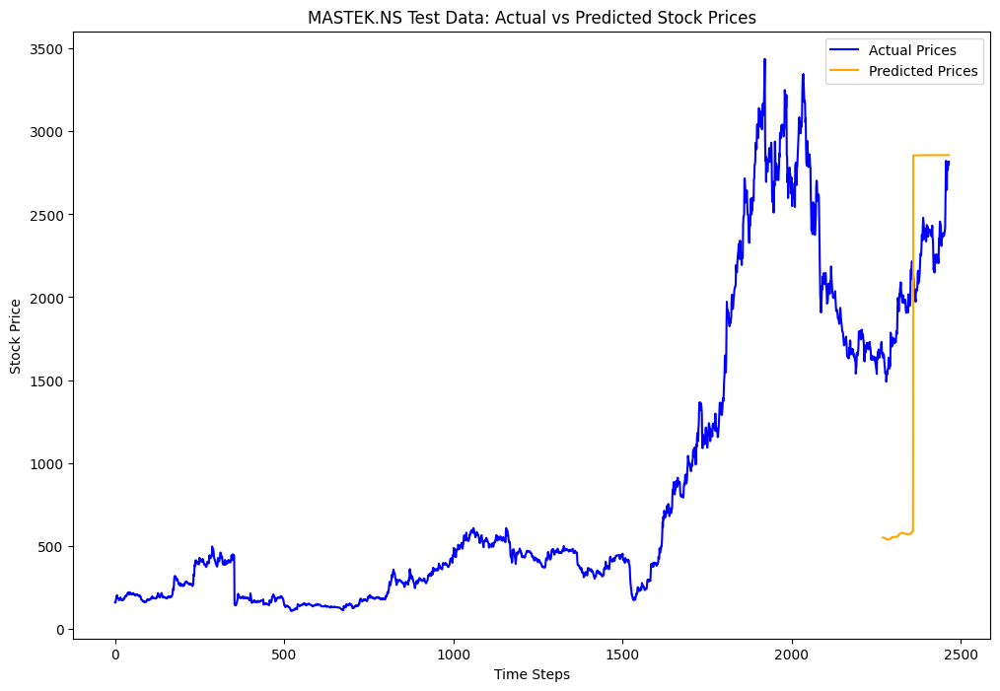

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0267, Validation Loss: 0.0404
Epoch [2/33], Loss: 0.1507, Validation Loss: 0.3165
Epoch [3/33], Loss: 0.0639, Validation Loss: 0.2358
Epoch [4/33], Loss: 0.0689, Validation Loss: 0.2137
Epoch [5/33], Loss: 0.0432, Validation Loss: 0.0174
Epoch [6/33], Loss: 0.2010, Validation Loss: 0.1214
Epoch [7/33], Loss: 0.0809, Validation Loss: 0.3019
Epoch [8/33], Loss: 0.0645, Validation Loss: 0.2362
Epoch [9/33], Loss: 0.0573, Validation Loss: 0.1528
Epoch [10/33], Loss: 0.0145, Validation Loss: 0.0359
Epoch [11/33], Loss: 0.0512, Validation Loss: 0.2153
Epoch [12/33], Loss: 0.0498, Validation Loss: 0.1932
Epoch [13/33], Loss: 0.0298, Validation Loss: 0.0769
Epoch [14/33], Loss: 0.0063, Validation Loss: 0.0140
Epoch [15/33], Loss: 0.0066, Validation Loss: 0.0017
Epoch [16/33], Loss: 0.0062, Validation Loss: 0.0033
Epoch [17/33], Loss: 0.0046, Validation Loss: 0.0067
Epoch [18/33], Loss: 0.0045, Validation Loss: 0.0068
Epoch [19/33], Loss: 0.0068, Validation Loss: 0.0004
Ep

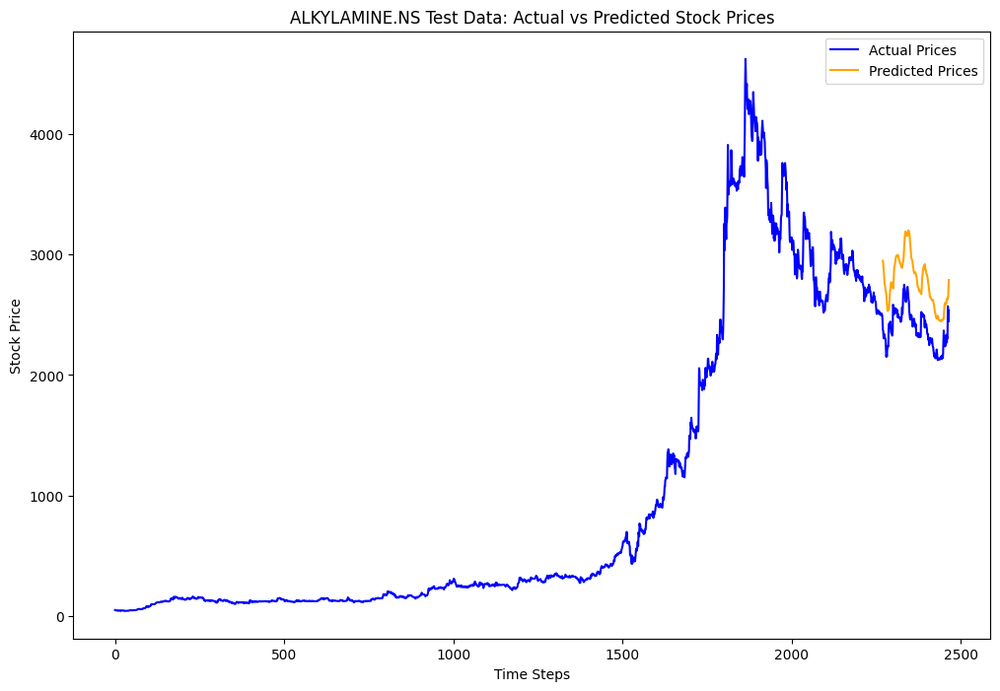

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0530, Validation Loss: 0.0396
Epoch [2/33], Loss: 0.0808, Validation Loss: 0.1368
Epoch [3/33], Loss: 0.0512, Validation Loss: 0.0855
Epoch [4/33], Loss: 0.0205, Validation Loss: 0.0661
Epoch [5/33], Loss: 0.1685, Validation Loss: 0.0926
Epoch [6/33], Loss: 0.0540, Validation Loss: 0.1257
Epoch [7/33], Loss: 0.0442, Validation Loss: 0.0826
Epoch [8/33], Loss: 0.0136, Validation Loss: 0.0036
Epoch [9/33], Loss: 0.0465, Validation Loss: 0.0972
Epoch [10/33], Loss: 0.0432, Validation Loss: 0.0772
Epoch [11/33], Loss: 0.0435, Validation Loss: 0.0656
Epoch [12/33], Loss: 0.0222, Validation Loss: 0.0172
Epoch [13/33], Loss: 0.0041, Validation Loss: 0.0054
Epoch [14/33], Loss: 0.0017, Validation Loss: 0.0029
Epoch [15/33], Loss: 0.0018, Validation Loss: 0.0040
Epoch [16/33], Loss: 0.0017, Validation Loss: 0.0034
Epoch [17/33], Loss: 0.0019, Validation Loss: 0.0030
Epoch [18/33], Loss: 0.0019, Validation Loss: 0.0018
Epoch [19/33], Loss: 0.0018, Validation Loss: 0.0026
Ep

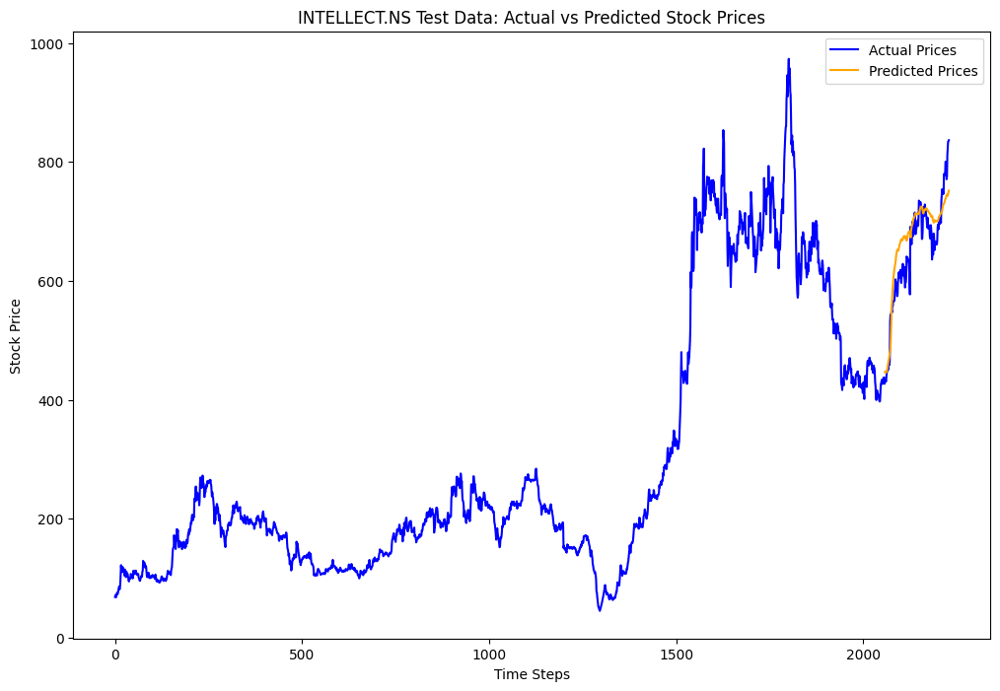

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.0992, Validation Loss: 0.0089
Epoch [2/33], Loss: 0.0824, Validation Loss: 0.0366
Epoch [3/33], Loss: 0.0577, Validation Loss: 0.0156
Epoch [4/33], Loss: 0.0526, Validation Loss: 0.0330
Epoch [5/33], Loss: 0.0414, Validation Loss: 0.0100
Epoch [6/33], Loss: 0.0273, Validation Loss: 0.0075
Epoch [7/33], Loss: 0.0102, Validation Loss: 0.0024
Epoch [8/33], Loss: 0.0101, Validation Loss: 0.0056
Epoch [9/33], Loss: 0.0039, Validation Loss: 0.0007
Epoch [10/33], Loss: 0.0028, Validation Loss: 0.0002
Epoch [11/33], Loss: 0.0027, Validation Loss: 0.0017
Epoch [12/33], Loss: 0.0021, Validation Loss: 0.0002
Epoch [13/33], Loss: 0.0020, Validation Loss: 0.0002
Epoch [14/33], Loss: 0.0019, Validation Loss: 0.0002
Epoch [15/33], Loss: 0.0019, Validation Loss: 0.0001
Epoch [16/33], Loss: 0.0018, Validation Loss: 0.0002
Epoch [17/33], Loss: 0.0018, Validation Loss: 0.0001
Epoch [18/33], Loss: 0.0019, Validation Loss: 0.0003
Epoch [19/33], Loss: 0.0019, Validation Loss: 0.0003
Ep

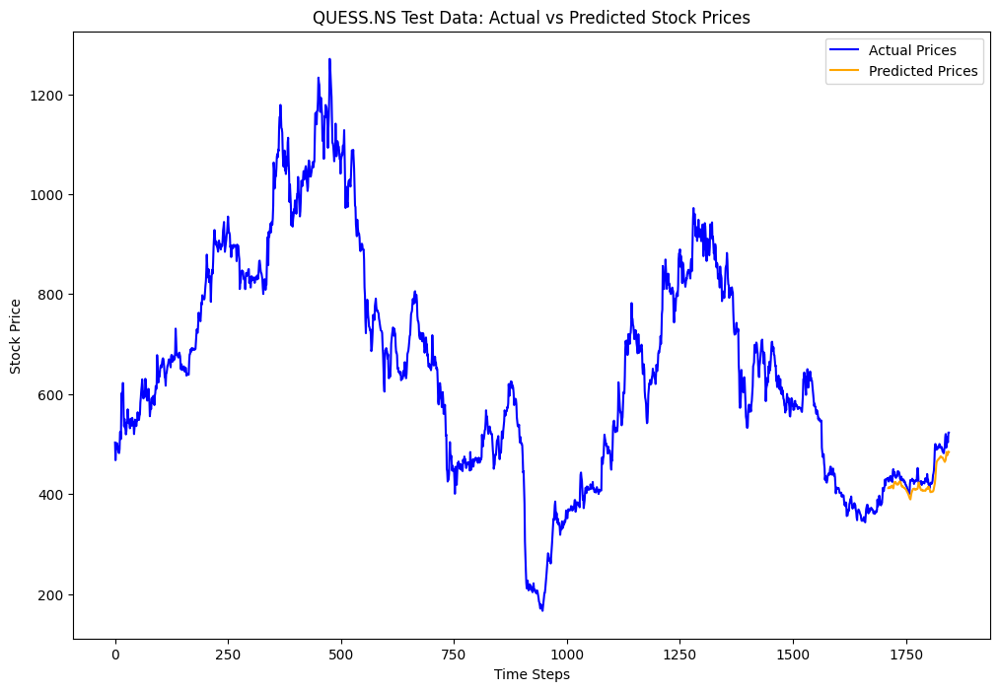

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0309, Validation Loss: 0.0037
Epoch [2/33], Loss: 0.0147, Validation Loss: 0.0058
Epoch [3/33], Loss: 0.0109, Validation Loss: 0.0117
Epoch [4/33], Loss: 0.0130, Validation Loss: 0.0109
Epoch [5/33], Loss: 0.0129, Validation Loss: 0.0077
Epoch [6/33], Loss: 0.0126, Validation Loss: 0.0063
Epoch [7/33], Loss: 0.0116, Validation Loss: 0.0068
Epoch [8/33], Loss: 0.0109, Validation Loss: 0.0078
Epoch [9/33], Loss: 0.0111, Validation Loss: 0.0075
Epoch [10/33], Loss: 0.0104, Validation Loss: 0.0060
Epoch [11/33], Loss: 0.0081, Validation Loss: 0.0045
Epoch [12/33], Loss: 0.0052, Validation Loss: 0.0019
Epoch [13/33], Loss: 0.0470, Validation Loss: 0.0305
Epoch [14/33], Loss: 0.0172, Validation Loss: 0.0193
Epoch [15/33], Loss: 0.0140, Validation Loss: 0.0094
Epoch [16/33], Loss: 0.0130, Validation Loss: 0.0048
Epoch [17/33], Loss: 0.0122, Validation Loss: 0.0044
Epoch [18/33], Loss: 0.0115, Validation Loss: 0.0059
Epoch [19/33], Loss: 0.0108, Validation Loss: 0.0075
Ep

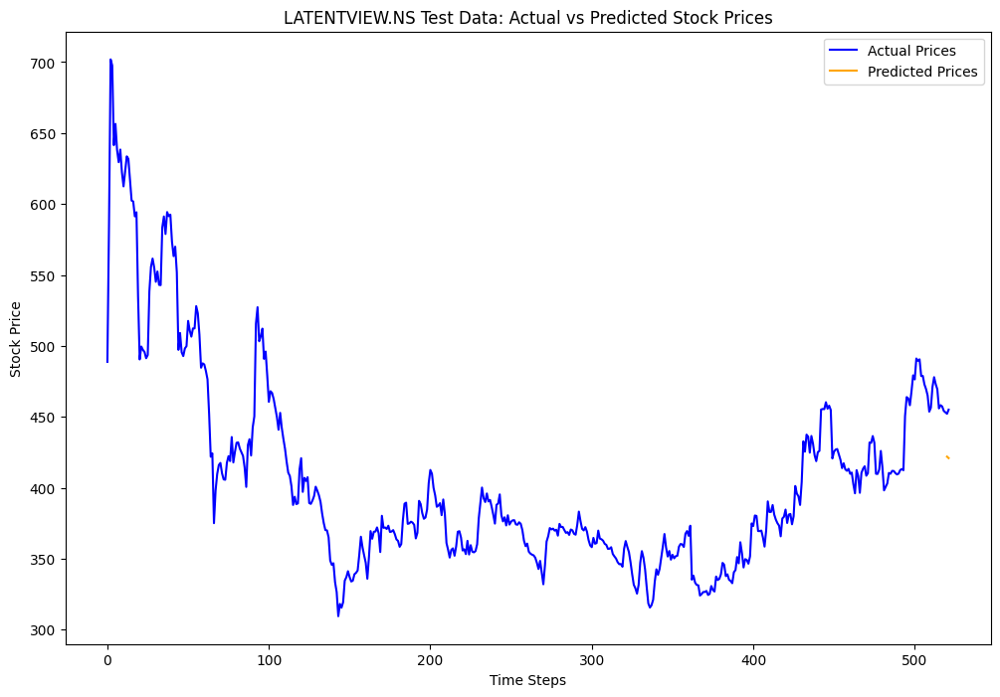

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.1157, Validation Loss: 0.0167
Epoch [2/33], Loss: 0.0819, Validation Loss: 0.0045
Epoch [3/33], Loss: 0.0688, Validation Loss: 0.0070
Epoch [4/33], Loss: 0.0508, Validation Loss: 0.0012
Epoch [5/33], Loss: 0.0087, Validation Loss: 0.0006
Epoch [6/33], Loss: 0.0138, Validation Loss: 0.0016
Epoch [7/33], Loss: 0.0188, Validation Loss: 0.0003
Epoch [8/33], Loss: 0.0040, Validation Loss: 0.0005
Epoch [9/33], Loss: 0.0043, Validation Loss: 0.0003
Epoch [10/33], Loss: 0.0048, Validation Loss: 0.0005
Epoch [11/33], Loss: 0.0071, Validation Loss: 0.0003
Epoch [12/33], Loss: 0.0042, Validation Loss: 0.0005
Epoch [13/33], Loss: 0.0054, Validation Loss: 0.0003
Epoch [14/33], Loss: 0.0040, Validation Loss: 0.0004
Epoch [15/33], Loss: 0.0037, Validation Loss: 0.0003
Epoch [16/33], Loss: 0.0029, Validation Loss: 0.0004
Epoch [17/33], Loss: 0.0054, Validation Loss: 0.0002
Epoch [18/33], Loss: 0.0032, Validation Loss: 0.0003
Epoch [19/33], Loss: 0.0021, Validation Loss: 0.0002
Ep

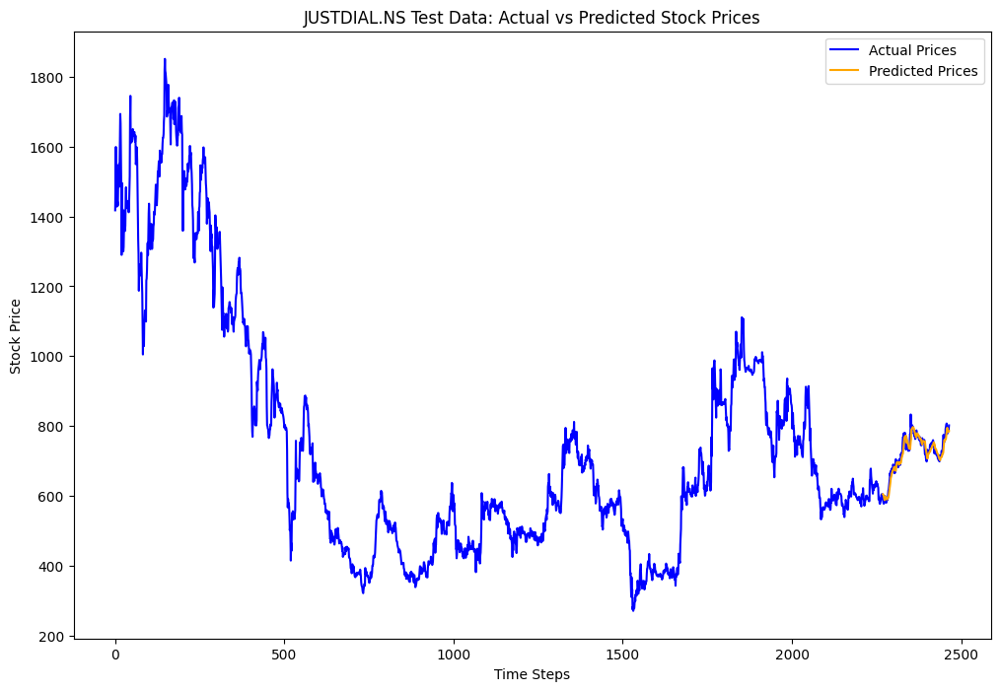

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0419, Validation Loss: 0.0854
Epoch [2/33], Loss: 0.0718, Validation Loss: 0.1756
Epoch [3/33], Loss: 0.0565, Validation Loss: 0.1726
Epoch [4/33], Loss: 0.0522, Validation Loss: 0.1595
Epoch [5/33], Loss: 0.0473, Validation Loss: 0.1354
Epoch [6/33], Loss: 0.0271, Validation Loss: 0.0906
Epoch [7/33], Loss: 0.2906, Validation Loss: 0.1246
Epoch [8/33], Loss: 0.0467, Validation Loss: 0.5415
Epoch [9/33], Loss: 0.0711, Validation Loss: 0.4189
Epoch [10/33], Loss: 0.0542, Validation Loss: 0.4045
Epoch [11/33], Loss: 0.0345, Validation Loss: 0.2890
Epoch [12/33], Loss: 0.0143, Validation Loss: 0.2272
Epoch [13/33], Loss: 0.0489, Validation Loss: 0.1215
Epoch [14/33], Loss: 0.0489, Validation Loss: 0.2835
Epoch [15/33], Loss: 0.0515, Validation Loss: 0.3148
Epoch [16/33], Loss: 0.0418, Validation Loss: 0.2870
Epoch [17/33], Loss: 0.0169, Validation Loss: 0.2944
Epoch [18/33], Loss: 0.0154, Validation Loss: 0.1982
Epoch [19/33], Loss: 0.0046, Validation Loss: 0.1315
Ep

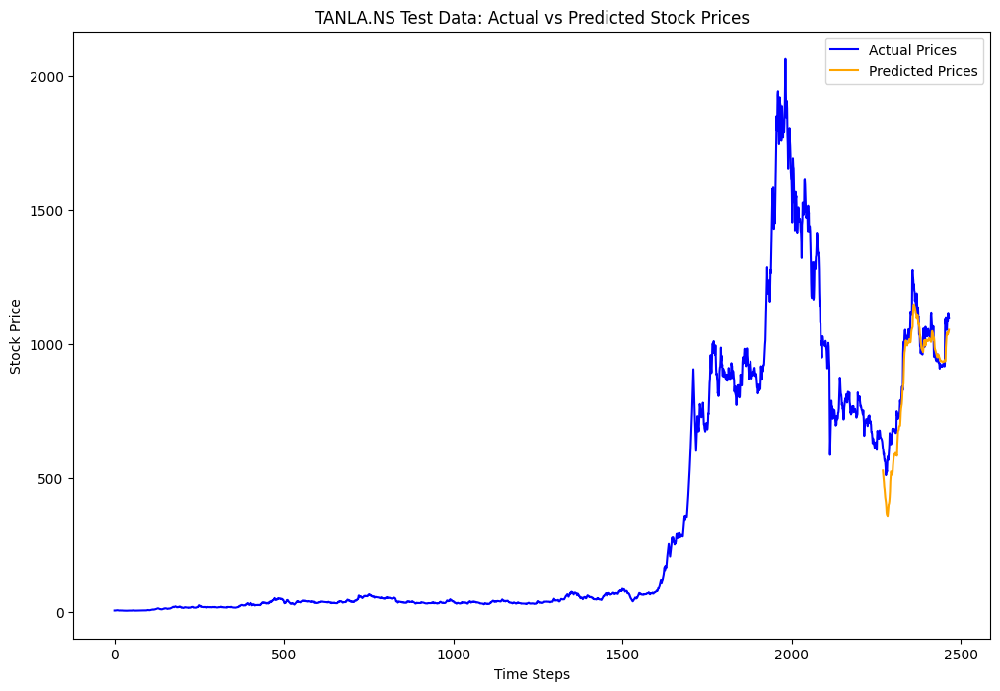

[*********************100%***********************]  1 of 1 completed


Epoch [1/33], Loss: 0.1972, Validation Loss: 0.0018
Epoch [2/33], Loss: 0.0437, Validation Loss: 0.0002
Epoch [3/33], Loss: 0.0396, Validation Loss: 0.0003
Epoch [4/33], Loss: 0.0332, Validation Loss: 0.0002
Epoch [5/33], Loss: 0.0293, Validation Loss: 0.0005
Epoch [6/33], Loss: 0.0234, Validation Loss: 0.0005
Epoch [7/33], Loss: 0.0083, Validation Loss: 0.0006
Epoch [8/33], Loss: 0.0074, Validation Loss: 0.0037
Epoch [9/33], Loss: 0.0210, Validation Loss: 0.0007
Epoch [10/33], Loss: 0.0120, Validation Loss: 0.0027
Epoch [11/33], Loss: 0.0079, Validation Loss: 0.0016
Epoch [12/33], Loss: 0.0074, Validation Loss: 0.0010
Epoch [13/33], Loss: 0.0116, Validation Loss: 0.0029
Epoch [14/33], Loss: 0.0056, Validation Loss: 0.0009
Epoch [15/33], Loss: 0.0053, Validation Loss: 0.0027
Epoch [16/33], Loss: 0.0109, Validation Loss: 0.0018
Epoch [17/33], Loss: 0.0045, Validation Loss: 0.0008
Epoch [18/33], Loss: 0.0059, Validation Loss: 0.0031
Epoch [19/33], Loss: 0.0087, Validation Loss: 0.0005
Ep

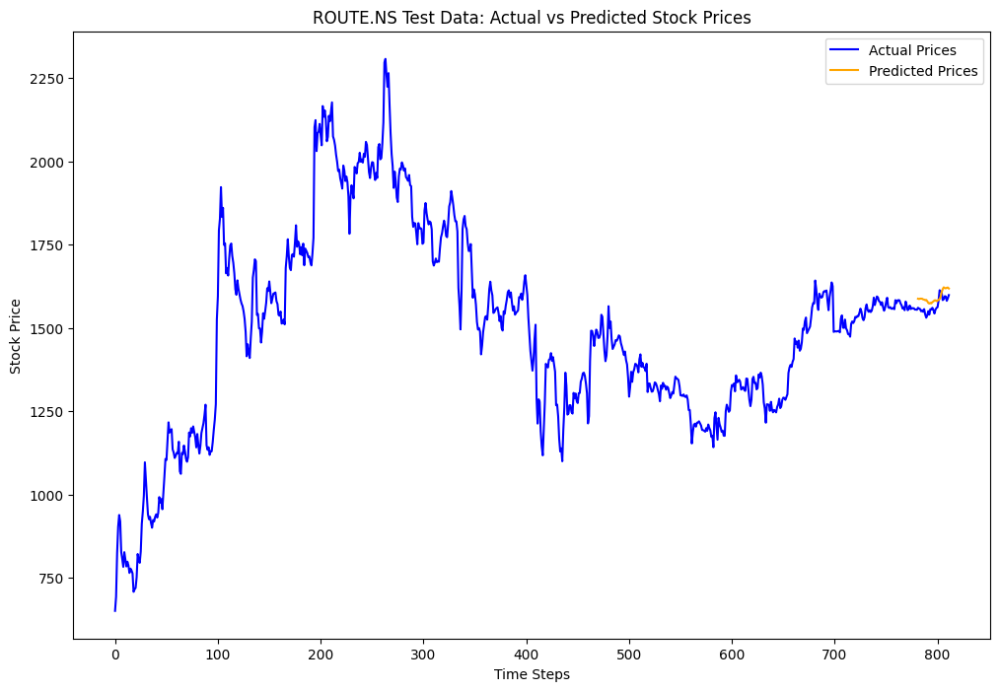

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0562, Validation Loss: 0.3360
Epoch [2/33], Loss: 0.0647, Validation Loss: 0.3388
Epoch [3/33], Loss: 0.0560, Validation Loss: 0.2972
Epoch [4/33], Loss: 0.0476, Validation Loss: 0.1683
Epoch [5/33], Loss: 0.0939, Validation Loss: 0.0527
Epoch [6/33], Loss: 0.0599, Validation Loss: 0.4007
Epoch [7/33], Loss: 0.0556, Validation Loss: 0.3361
Epoch [8/33], Loss: 0.0506, Validation Loss: 0.2767
Epoch [9/33], Loss: 0.0196, Validation Loss: 0.0189
Epoch [10/33], Loss: 0.1089, Validation Loss: 0.1438
Epoch [11/33], Loss: 0.0589, Validation Loss: 0.3401
Epoch [12/33], Loss: 0.0689, Validation Loss: 0.3848
Epoch [13/33], Loss: 0.0571, Validation Loss: 0.3589
Epoch [14/33], Loss: 0.0549, Validation Loss: 0.3433
Epoch [15/33], Loss: 0.0507, Validation Loss: 0.3117
Epoch [16/33], Loss: 0.0457, Validation Loss: 0.2555
Epoch [17/33], Loss: 0.0396, Validation Loss: 0.1745
Epoch [18/33], Loss: 0.0182, Validation Loss: 0.0178
Epoch [19/33], Loss: 0.0355, Validation Loss: 0.0803
Ep

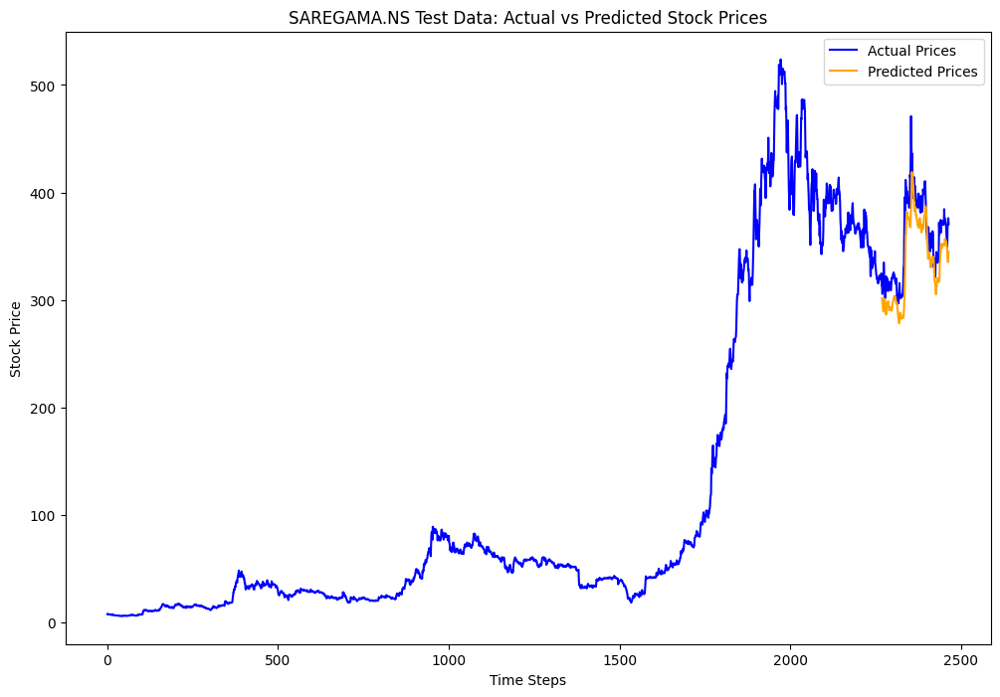

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0715, Validation Loss: 0.0017
Epoch [2/33], Loss: 0.0903, Validation Loss: 0.0022
Epoch [3/33], Loss: 0.0787, Validation Loss: 0.0111
Epoch [4/33], Loss: 0.0590, Validation Loss: 0.0027
Epoch [5/33], Loss: 0.0523, Validation Loss: 0.0022
Epoch [6/33], Loss: 0.0248, Validation Loss: 0.0011
Epoch [7/33], Loss: 0.0166, Validation Loss: 0.0012
Epoch [8/33], Loss: 0.0176, Validation Loss: 0.0023
Epoch [9/33], Loss: 0.0096, Validation Loss: 0.0017
Epoch [10/33], Loss: 0.0055, Validation Loss: 0.0003
Epoch [11/33], Loss: 0.0033, Validation Loss: 0.0013
Epoch [12/33], Loss: 0.0026, Validation Loss: 0.0006
Epoch [13/33], Loss: 0.0023, Validation Loss: 0.0009
Epoch [14/33], Loss: 0.0021, Validation Loss: 0.0002
Epoch [15/33], Loss: 0.0021, Validation Loss: 0.0005
Epoch [16/33], Loss: 0.0027, Validation Loss: 0.0002
Epoch [17/33], Loss: 0.0036, Validation Loss: 0.0006
Epoch [18/33], Loss: 0.0055, Validation Loss: 0.0004
Epoch [19/33], Loss: 0.0067, Validation Loss: 0.0007
Ep

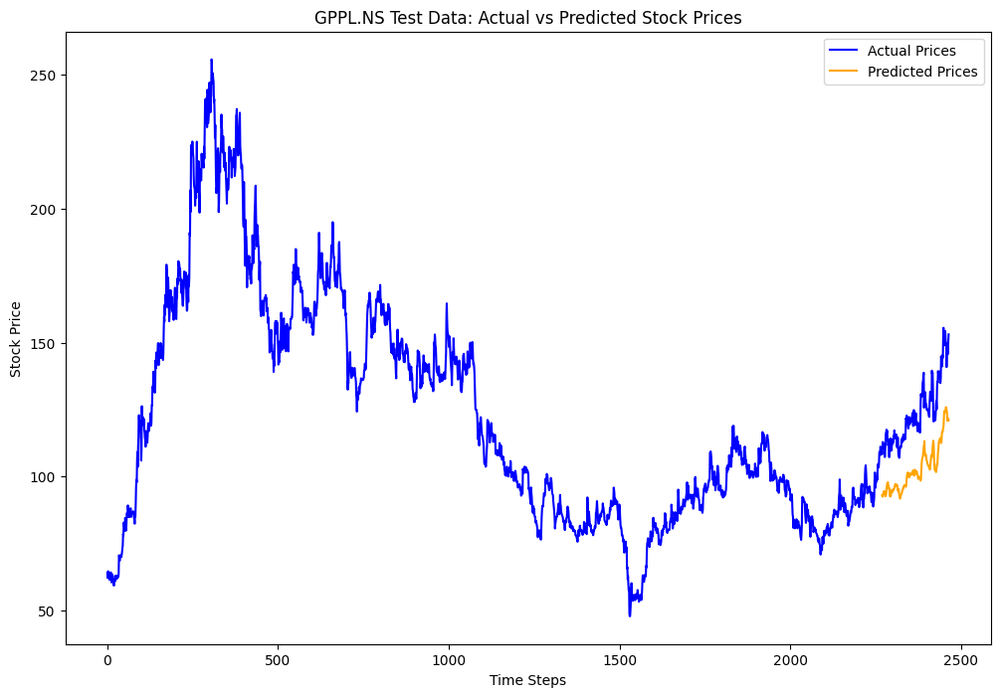

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0698, Validation Loss: 0.0769
Epoch [2/33], Loss: 0.0364, Validation Loss: 0.0026
Epoch [3/33], Loss: 0.0324, Validation Loss: 0.0337
Epoch [4/33], Loss: 0.0092, Validation Loss: 0.0010
Epoch [5/33], Loss: 0.0204, Validation Loss: 0.0072
Epoch [6/33], Loss: 0.0138, Validation Loss: 0.0017
Epoch [7/33], Loss: 0.0126, Validation Loss: 0.0012
Epoch [8/33], Loss: 0.0090, Validation Loss: 0.0008
Epoch [9/33], Loss: 0.0072, Validation Loss: 0.0023
Epoch [10/33], Loss: 0.0085, Validation Loss: 0.0025
Epoch [11/33], Loss: 0.0063, Validation Loss: 0.0007
Epoch [12/33], Loss: 0.0033, Validation Loss: 0.0008
Epoch [13/33], Loss: 0.0023, Validation Loss: 0.0009
Epoch [14/33], Loss: 0.0020, Validation Loss: 0.0011
Epoch [15/33], Loss: 0.0028, Validation Loss: 0.0021
Epoch [16/33], Loss: 0.0035, Validation Loss: 0.0008
Epoch [17/33], Loss: 0.0033, Validation Loss: 0.0009
Epoch [18/33], Loss: 0.0020, Validation Loss: 0.0015
Epoch [19/33], Loss: 0.0024, Validation Loss: 0.0006
Ep

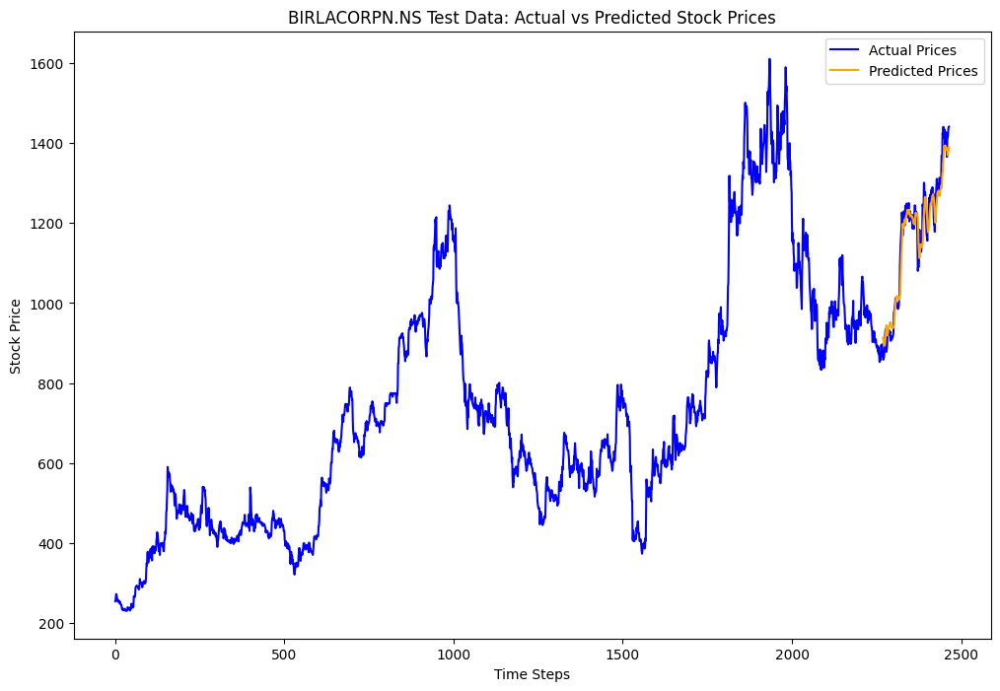

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0212, Validation Loss: 0.2973
Epoch [2/33], Loss: 0.0205, Validation Loss: 0.2668
Epoch [3/33], Loss: 0.0208, Validation Loss: 0.2568
Epoch [4/33], Loss: 0.0139, Validation Loss: 0.0844
Epoch [5/33], Loss: 0.0097, Validation Loss: 1.5632
Epoch [6/33], Loss: 0.0665, Validation Loss: 0.1248
Epoch [7/33], Loss: 0.0352, Validation Loss: 0.0225
Epoch [8/33], Loss: 0.0256, Validation Loss: 0.0280
Epoch [9/33], Loss: 0.0188, Validation Loss: 0.0486
Epoch [10/33], Loss: 0.0201, Validation Loss: 0.0514
Epoch [11/33], Loss: 0.0196, Validation Loss: 0.0602
Epoch [12/33], Loss: 0.0192, Validation Loss: 0.0684
Epoch [13/33], Loss: 0.0170, Validation Loss: 0.1076
Epoch [14/33], Loss: 0.0184, Validation Loss: 0.1842
Epoch [15/33], Loss: 0.0143, Validation Loss: 0.1550
Epoch [16/33], Loss: 0.0083, Validation Loss: 0.4109
Epoch [17/33], Loss: 0.0061, Validation Loss: 0.1731
Epoch [18/33], Loss: 0.0070, Validation Loss: 0.1324
Epoch [19/33], Loss: 0.0146, Validation Loss: 0.3799
Ep

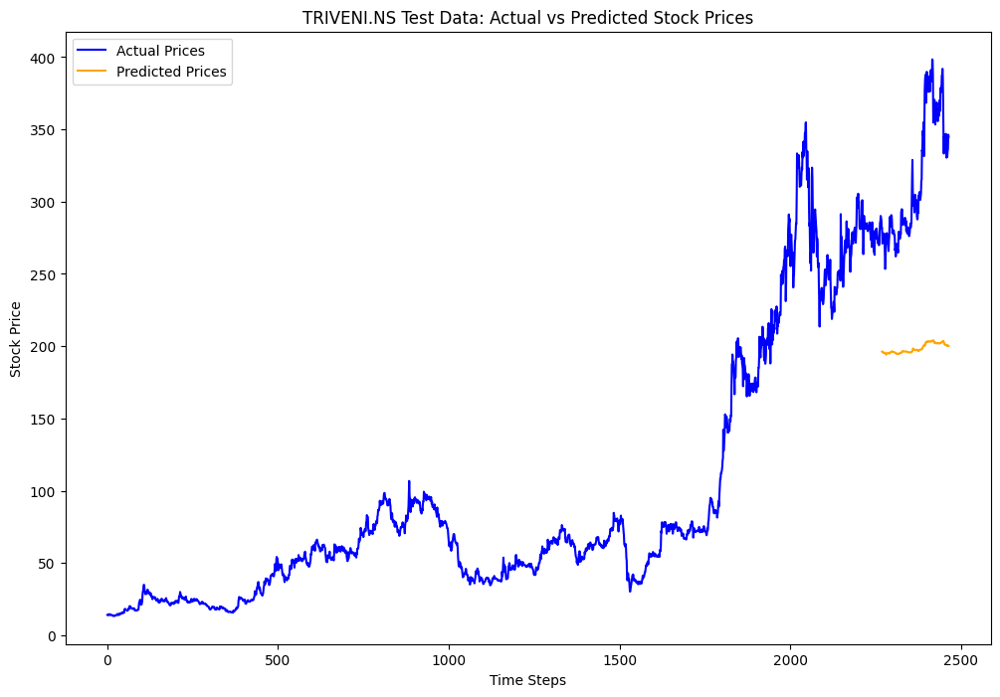

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0742, Validation Loss: 0.0008
Epoch [2/33], Loss: 0.0816, Validation Loss: 0.0030
Epoch [3/33], Loss: 0.0712, Validation Loss: 0.0101
Epoch [4/33], Loss: 0.0315, Validation Loss: 0.0033
Epoch [5/33], Loss: 0.0582, Validation Loss: 0.0014
Epoch [6/33], Loss: 0.0386, Validation Loss: 0.0024
Epoch [7/33], Loss: 0.0076, Validation Loss: 0.0006
Epoch [8/33], Loss: 0.0025, Validation Loss: 0.0001
Epoch [9/33], Loss: 0.0025, Validation Loss: 0.0001
Epoch [10/33], Loss: 0.0014, Validation Loss: 0.0001
Epoch [11/33], Loss: 0.0017, Validation Loss: 0.0001
Epoch [12/33], Loss: 0.0021, Validation Loss: 0.0002
Epoch [13/33], Loss: 0.0014, Validation Loss: 0.0001
Epoch [14/33], Loss: 0.0013, Validation Loss: 0.0001
Epoch [15/33], Loss: 0.0016, Validation Loss: 0.0003
Epoch [16/33], Loss: 0.0015, Validation Loss: 0.0001
Epoch [17/33], Loss: 0.0019, Validation Loss: 0.0001
Epoch [18/33], Loss: 0.0019, Validation Loss: 0.0002
Epoch [19/33], Loss: 0.0016, Validation Loss: 0.0001
Ep

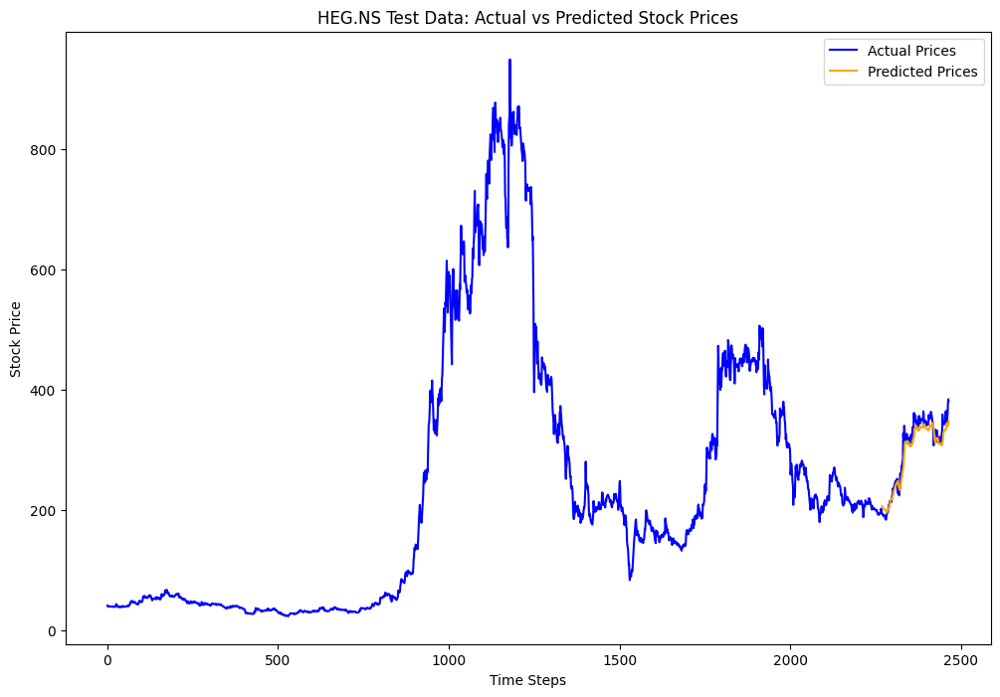

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0121, Validation Loss: 0.2553
Epoch [2/33], Loss: 0.0094, Validation Loss: 0.2718
Epoch [3/33], Loss: 0.0089, Validation Loss: 0.2700
Epoch [4/33], Loss: 0.0086, Validation Loss: 0.2621
Epoch [5/33], Loss: 0.0080, Validation Loss: 0.2308
Epoch [6/33], Loss: 0.0077, Validation Loss: 0.2183
Epoch [7/33], Loss: 0.0047, Validation Loss: 0.1251
Epoch [8/33], Loss: 0.0068, Validation Loss: 0.1492
Epoch [9/33], Loss: 0.0022, Validation Loss: 0.0124
Epoch [10/33], Loss: 0.0006, Validation Loss: 0.0081
Epoch [11/33], Loss: 0.0010, Validation Loss: 0.0026
Epoch [12/33], Loss: 0.0007, Validation Loss: 0.0013
Epoch [13/33], Loss: 0.0008, Validation Loss: 0.0016
Epoch [14/33], Loss: 0.0015, Validation Loss: 0.0019
Epoch [15/33], Loss: 0.0008, Validation Loss: 0.0087
Epoch [16/33], Loss: 0.0007, Validation Loss: 0.0025
Epoch [17/33], Loss: 0.0010, Validation Loss: 0.0012
Epoch [18/33], Loss: 0.0006, Validation Loss: 0.0040
Epoch [19/33], Loss: 0.0004, Validation Loss: 0.0019
Ep

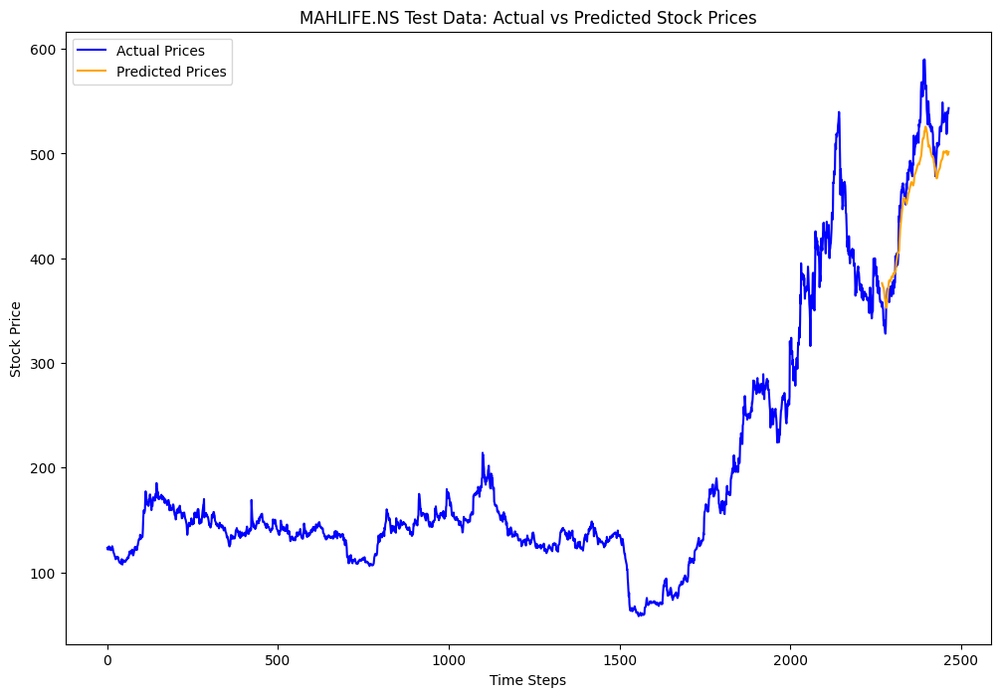

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/33], Loss: 0.0119, Validation Loss: 0.2412
Epoch [2/33], Loss: 0.0223, Validation Loss: 0.1874
Epoch [3/33], Loss: 0.0277, Validation Loss: 0.2608
Epoch [4/33], Loss: 0.0207, Validation Loss: 0.2538
Epoch [5/33], Loss: 0.0184, Validation Loss: 0.2053
Epoch [6/33], Loss: 0.0139, Validation Loss: 0.0491
Epoch [7/33], Loss: 0.0239, Validation Loss: 0.1860
Epoch [8/33], Loss: 0.0128, Validation Loss: 0.1672
Epoch [9/33], Loss: 0.0064, Validation Loss: 0.0530
Epoch [10/33], Loss: 0.0028, Validation Loss: 0.0395
Epoch [11/33], Loss: 0.0041, Validation Loss: 0.0407
Epoch [12/33], Loss: 0.0029, Validation Loss: 0.0115
Epoch [13/33], Loss: 0.0009, Validation Loss: 0.0216
Epoch [14/33], Loss: 0.0015, Validation Loss: 0.0136
Epoch [15/33], Loss: 0.0007, Validation Loss: 0.0117
Epoch [16/33], Loss: 0.0007, Validation Loss: 0.0094
Epoch [17/33], Loss: 0.0007, Validation Loss: 0.0069
Epoch [18/33], Loss: 0.0006, Validation Loss: 0.0063
Epoch [19/33], Loss: 0.0004, Validation Loss: 0.0066
Ep

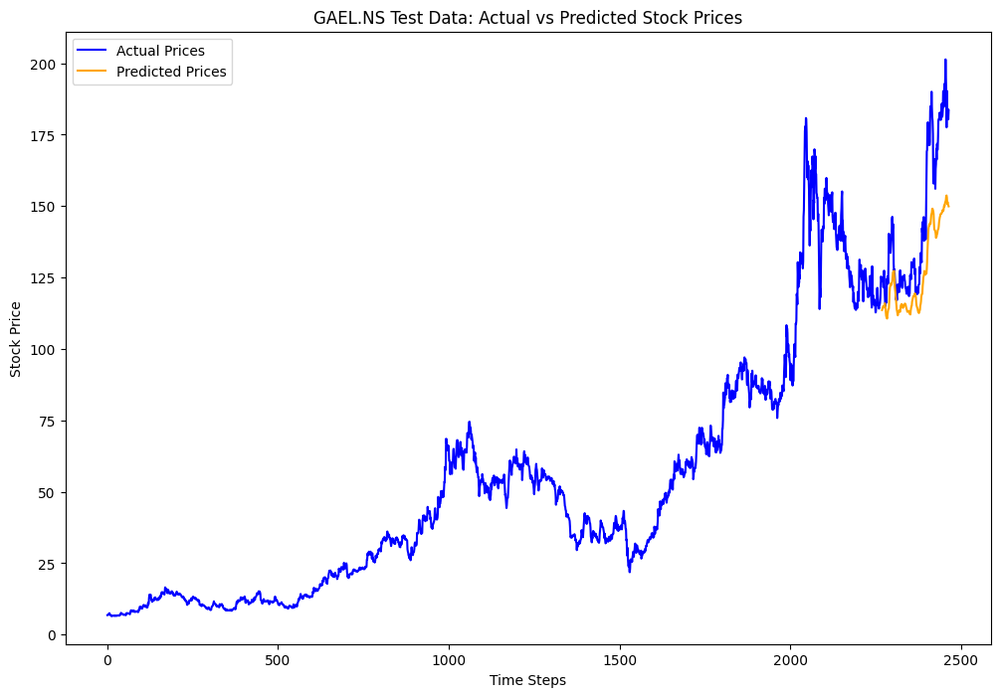

In [64]:
class EnhancedLSTMModel(nn.Module):
    def __init__(self, input_size=1, hidden_size=100, output_size=1, num_layers=4, dropout=0.3):
        super(EnhancedLSTMModel, self).__init__()
        self.lstm1 = nn.LSTM(input_size, hidden_size, num_layers=1, batch_first=True, bidirectional=True)
        self.dropout1 = nn.Dropout(dropout)
        self.lstm2 = nn.LSTM(hidden_size * 2, hidden_size, num_layers=1, batch_first=True, bidirectional=True)
        self.dropout2 = nn.Dropout(dropout)
        self.lstm3 = nn.LSTM(hidden_size * 2, hidden_size, num_layers=1, batch_first=True, bidirectional=True)
        self.dropout3 = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_size * 2, output_size)

    def forward(self, x):
        out, _ = self.lstm1(x)
        out = self.dropout1(out)
        out, _ = self.lstm2(out)
        out = self.dropout2(out)
        out, _ = self.lstm3(out)
        out = self.dropout3(out)
        out = self.fc(out[:, -1, :])
        return out

# Plotting function for actual vs predicted prices
def plot_predictions_with_real(scaler, real_data, predictions, dataset_type, company):
    real_data = scaler.inverse_transform(real_data)  # Inverse transform to original scale
    plt.figure(figsize=(12, 8))

    # Plot real data
    plt.plot(real_data, label="Actual Prices", color='blue')

    # Plot predictions (aligned with actual data)
    plt.plot(
        np.arange(len(real_data) - len(predictions), len(real_data)),
        predictions,
        label="Predicted Prices",
        color='orange'
    )

    plt.xlabel("Time Steps")
    plt.ylabel("Stock Price")
    plt.title(f"{company} {dataset_type} Data: Actual vs Predicted Stock Prices")
    plt.legend()
    plt.show()

# Processing each company array
for companies, results, results_name in zip(
    [companies_1, companies_2, companies_3],
    [results_1, results_2, results_3],
    ['results_1', 'results_2', 'results_3']
):
    for company in companies:
        # Fetch data
        df = yf.download(company, start=begin_date, end=end_date)
        df = df[['Close']].reset_index(drop=True)

        # Scale data
        scaler = MinMaxScaler(feature_range=(0, 1))
        df1 = scaler.fit_transform(np.array(df['Close']).reshape(-1, 1))

        # Define split sizes
        train_size = int(len(df1) * 0.8)
        validation_size = int(len(df1) * 0.1)
        test_size = len(df1) - train_size - validation_size

        # Split data
        train_data = df1[:train_size]
        validation_data = df1[train_size:train_size + validation_size]
        test_data = df1[train_size + validation_size:]

        # Prepare data for model
        time_step = 50
        X_train, y_train = create_dataset(train_data, time_step)
        X_validation, y_validation = create_dataset(validation_data, time_step)
        X_test, y_test = create_dataset(test_data, time_step)

        X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
        X_validation = X_validation.reshape(X_validation.shape[0], X_validation.shape[1], 1)
        X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

        # Initialize and train model
        model = EnhancedLSTMModel().to(device)
        criterion = nn.MSELoss()
        optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

        X_train_tensor = torch.from_numpy(X_train).float().to(device)
        y_train_tensor = torch.from_numpy(y_train).float().to(device)
        X_validation_tensor = torch.from_numpy(X_validation).float().to(device)
        y_validation_tensor = torch.from_numpy(y_validation).float().to(device)
        X_test_tensor = torch.from_numpy(X_test).float().to(device)
        y_test_tensor = torch.from_numpy(y_test).float().to(device)

        epochs = 33
        batch_size = 64

        for epoch in range(epochs):
            model.train()
            total_loss = 0
            for i in range(0, X_train_tensor.size(0), batch_size):
                X_batch = X_train_tensor[i:i + batch_size]
                y_batch = y_train_tensor[i:i + batch_size]
                outputs = model(X_batch)
                optimizer.zero_grad()
                loss = criterion(outputs.squeeze(), y_batch)
                loss.backward()
                optimizer.step()
                total_loss += loss.item()

            # Validation loss
            model.eval()
            with torch.no_grad():
                val_outputs = model(X_validation_tensor)
                val_loss = criterion(val_outputs.squeeze(), y_validation_tensor).item()

            avg_loss = total_loss / (X_train_tensor.size(0) / batch_size)
            print(f'Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}, Validation Loss: {val_loss:.4f}')

        # Evaluate model
        model.eval()
        test_predict = model(X_test_tensor).cpu().detach().numpy()
        test_predict = scaler.inverse_transform(test_predict)
        y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

        # Plot predictions
        plot_predictions_with_real(scaler, df1, test_predict, "Test", company)

        # Calculate test differences and change percentages
        test_start_price = test_predict[0][0]
        test_end_price = test_predict[-1][0]
        test_difference = test_end_price - test_start_price
        test_change_percent = (test_difference / test_start_price) * 100

        actual_start_price = y_test_actual[0][0]
        actual_end_price = y_test_actual[-1][0]
        actual_difference = actual_end_price - actual_start_price
        actual_change_percent = (actual_difference / actual_start_price) * 100

        weights=0.0
        # Store data in results DataFrame
        new_row = pd.DataFrame([{
            'Company': company,
            'Test Start Price': test_start_price,
            'Test End Price': test_end_price,
            'Test Difference': test_difference,
            'Test Change %': test_change_percent,
            'Actual Start Price': actual_start_price,
            'Actual End Price': actual_end_price,
            'Actual Difference': actual_difference,
            'Actual Change %': actual_change_percent,
            'Weight':weights

        }])
        locals()[results_name] = pd.concat([locals()[results_name], new_row], ignore_index=True)

#Filter results with positive percentage change for test prices

In [66]:
large_cap_increase = results_1[(results_1['Test Change %'] > 0)]
mid_cap_increase = results_2[(results_2['Test Change %'] > 0)]
small_cap_increase = results_3[(results_3['Test Change %'] > 0)]

# Display results for Large, mid and small cap companies after reejcting companies which might probably give losses according to our model

In [67]:
print("Results dataframe for Large Cap Companies:\n", results_1)
print("\n\nResults dataframe for Mid Cap Companies:\n", results_2)
print("\n\nResults dataframe for Small Cap Companies:\n", results_3)

Results dataframe for Large Cap Companies:
           Company  Test Start Price  Test End Price  Test Difference  \
0     RELIANCE.NS       1023.845520     1168.095703       144.250183   
1     HDFCBANK.NS       1616.123901     1678.002075        61.878174   
2    ICICIBANK.NS        840.498413      986.194702       145.696289   
3         SBIN.NS        480.017822      536.862854        56.845032   
4          ITC.NS        336.204803      363.444672        27.239868   
5    SUNPHARMA.NS        867.418274     1076.856445       209.438171   
6     AXISBANK.NS        830.560791      991.910645       161.349854   
7    KOTAKBANK.NS       1769.792236     1905.812866       136.020630   
8       MARUTI.NS       8660.240234    10021.232422      1360.992188   
9   ULTRACEMCO.NS       7169.807617     9517.436523      2347.628906   
10        ONGC.NS        165.938538      217.286407        51.347870   
11       WIPRO.NS        369.534119      434.351807        64.817688   
12  BAJAJ-AUTO.NS   

#List of shortlisted Companies to be considered for buying stocks.

In [68]:
print("\nLarge Cap Companies recommended for buying:", large_cap_increase)
print("\nMid Cap Companies recommended for buying:", mid_cap_increase)
print("\nSmall Cap Companies recommended for buying:", small_cap_increase)


Large Cap Companies recommended for buying:           Company  Test Start Price  Test End Price  Test Difference  \
0     RELIANCE.NS       1023.845520     1168.095703       144.250183   
1     HDFCBANK.NS       1616.123901     1678.002075        61.878174   
2    ICICIBANK.NS        840.498413      986.194702       145.696289   
3         SBIN.NS        480.017822      536.862854        56.845032   
4          ITC.NS        336.204803      363.444672        27.239868   
5    SUNPHARMA.NS        867.418274     1076.856445       209.438171   
6     AXISBANK.NS        830.560791      991.910645       161.349854   
7    KOTAKBANK.NS       1769.792236     1905.812866       136.020630   
8       MARUTI.NS       8660.240234    10021.232422      1360.992188   
9   ULTRACEMCO.NS       7169.807617     9517.436523      2347.628906   
10        ONGC.NS        165.938538      217.286407        51.347870   
11       WIPRO.NS        369.534119      434.351807        64.817688   
12  BAJAJ-AUTO.NS  

#Company and weightage to be bought in the category to which company belongs

In [69]:
sum1,sum2,sum3,j=0.0,0.0,0.0,0.0
for i in range(len(large_cap_increase)):
    sum1=sum1+large_cap_increase.iloc[i, 4]

for i in range(len(mid_cap_increase)):
    sum2=sum2+mid_cap_increase.iloc[i, 4]

for i in range(len(small_cap_increase)):
    sum3=sum3+small_cap_increase.iloc[i, 4]

for i in range(len(large_cap_increase)):
    large_cap_increase.iloc[i,9]=large_cap_increase.iloc[i,4]/sum1*100
    j=j+large_cap_increase.iloc[i,9]

for i in range(len(mid_cap_increase)):
    mid_cap_increase.iloc[i,9]=mid_cap_increase.iloc[i,4]/sum2*100
    j=j+mid_cap_increase.iloc[i,9]

for i in range(len(small_cap_increase)):
    small_cap_increase.iloc[i,9]=small_cap_increase.iloc[i,4]/sum3*100
    j=j+small_cap_increase.iloc[i,9]

print("Company and weightage at which it is to be bought in large cap:\n",large_cap_increase)
print("\n\nCompany and weightage at which it is to be bought in mid cap:\n",mid_cap_increase)
print("\n\nCompany and weightage at which it is to be bought in small cap:\n",small_cap_increase)

Company and weightage at which it is to be bought in large cap:
           Company  Test Start Price  Test End Price  Test Difference  \
0     RELIANCE.NS       1023.845520     1168.095703       144.250183   
1     HDFCBANK.NS       1616.123901     1678.002075        61.878174   
2    ICICIBANK.NS        840.498413      986.194702       145.696289   
3         SBIN.NS        480.017822      536.862854        56.845032   
4          ITC.NS        336.204803      363.444672        27.239868   
5    SUNPHARMA.NS        867.418274     1076.856445       209.438171   
6     AXISBANK.NS        830.560791      991.910645       161.349854   
7    KOTAKBANK.NS       1769.792236     1905.812866       136.020630   
8       MARUTI.NS       8660.240234    10021.232422      1360.992188   
9   ULTRACEMCO.NS       7169.807617     9517.436523      2347.628906   
10        ONGC.NS        165.938538      217.286407        51.347870   
11       WIPRO.NS        369.534119      434.351807        64.817688   

#Profit % achieved when compared with original data.

In [70]:
profit_largecap=0.0
profit_midcap=0.0
profit_smallcap=0.0

for i in range(len(large_cap_increase)):
    profit_largecap=profit_largecap+large_cap_increase.iloc[i,9]*large_cap_increase.iloc[i,8]

for i in range(len(mid_cap_increase)):
    profit_midcap=profit_midcap+mid_cap_increase.iloc[i,9]*mid_cap_increase.iloc[i,8]

for i in range(len(small_cap_increase)):
    profit_smallcap=profit_smallcap+small_cap_increase.iloc[i,9]*small_cap_increase.iloc[i,8]

total_profit=(40*profit_largecap+35*profit_midcap+25*profit_smallcap)/10000

print("Total Profit Percentage: ", total_profit,"% *T&C Applied",sep="")

Total Profit Percentage: 74.62642457590009% *T&C Applied
